# **Illustration of mean reversion on pairs**

The goal of this notebook is to illustrate aspects of an algorithm for mean-reversion pair trading on stocks from the S&P500.

## Settings

In [1]:
#Make sure all these libraries are installed on your system
import importlib
import numpy as np
import math
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
from datetime import datetime
from IPython.core.debugger import set_trace
import sys
import functools
import operator
import trading as trd
import copy
import os
import yfinance as yf
#import pystan
from itertools import chain
from ib_insync import *
util.startLoop()
import random
import beepy #1 : 'coin', 2 : 'robot_error', 3 : 'error', 4 : 'ping', 5 : 'ready', 6 : 'success', 7 : 'wilhelm'
import statsmodels as sm
from ib_insync import * #A third-party API for communicating with my broker IBKR
import heapq
from itertools import combinations

In [2]:
# Only needed if you make changes to the source file 'trading.py'
import importlib
importlib.reload(trd)

<module 'trading' from '/Users/slimane/Documents/GitHub/trading/ForSemihYagmur/trading.py'>

In [3]:
#Settings for plotting in matplotlib. These are just my personal preferences. You can skip those if you have other preferences
plt.style.reload_library()
plt.style.use(['science','nature'])
plt.rcParams['figure.figsize'] = [5, (4.8/6.4)*5]
plt.rcParams['figure.dpi'] = 150
%config InlineBackend.figure_format = 'retina'

plt.rcParams['figure.facecolor'] = 'black'  # Background color for the figure
plt.rcParams['axes.facecolor'] = 'black'  # Background color for axes
plt.rcParams['axes.edgecolor'] = 'white'  # Color of axes edges
plt.rcParams['axes.labelcolor'] = 'lightgray'  # Color of axes labels
plt.rcParams['xtick.color'] = 'lightgray'  # Color of x-axis ticks
plt.rcParams['ytick.color'] = 'lightgray'  # Color of y-axis ticks
plt.rcParams['grid.color'] = 'gray'  # Grid color (optional)
plt.rcParams['text.color'] = 'white'  # Default text color
plt.rcParams['legend.facecolor'] = 'black'  # Legend background color
plt.rcParams['legend.edgecolor'] = 'white'  # Legend border color


## Downloading and formatting data

In [4]:
#Dataset describing the members of the S&P500 (make sure the file is in the same directory as the notebook)

# Get the directory of the notebook
notebook_dir = os.path.dirname(os.path.abspath("__file__"))
# Construct the relative path to the file
file_path = os.path.join(notebook_dir, "constituents.csv")

# Get S&P 500 tickers from Wikipedia
# sp500_url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"
# sp500_df = pd.read_html(sp500_url)[0]  # First table on the page
# tickers = sp500_df["Symbol"].tolist()

# Load the CSV
SNPmembers = pd.read_csv(file_path)

SNPmembers['Symbol'] = SNPmembers['Symbol'].astype(str)
SNPmembers['Security'] = SNPmembers['Security'].astype(str)
SNPmembers['GICS Sector'] = SNPmembers['GICS Sector'].astype(str)
SNPmembers['GICS Sub-Industry'] = SNPmembers['GICS Sub-Industry'].astype(str)
SNPmembers['Headquarters Location'] = SNPmembers['Headquarters Location'].astype(str)

SNPmembers

,Symbol,Security,GICS Sector,GICS Sub-Industry,Headquarters Location,Date added,CIK,Founded
0,MMM,3M,Industrials,Industrial Conglomerates,"Saint Paul, Minnesota",1957-03-04,66740,1902
1,AOS,A. O. Smith,Industrials,Building Products,"Milwaukee, Wisconsin",2017-07-26,91142,1916
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,"North Chicago, Illinois",1957-03-04,1800,1888
3,ABBV,AbbVie,Health Care,Biotechnology,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888)
4,ACN,Accenture,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373,1989
...,...,...,...,...,...,...,...,...
497,XYL,Xylem Inc.,Industrials,Industrial Machinery & Supplies & Components,"White Plains, New York",2011-11-01,1524472,2011
498,YUM,Yum! Brands,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061,1997
499,ZBRA,Zebra Technologies,Information Technology,Electronic Equipment & Instruments,"Lincolnshire, Illinois",2019-12-23,877212,1969
500,ZBH,Zimmer Biomet,Health Care,Health Care Equipment,"Warsaw, Indiana",2001-08-07,1136869,1927


In [4]:
#Dataset containg the prices of the S&P500 members over a 2-month  period

# Get the directory of the notebook
notebook_dir = os.path.dirname(os.path.abspath("__file__"))
# Construct the relative path to the file
file_path = os.path.join(notebook_dir, "SNPprices20240603_20240801.csv")
# Load the CSV
close_prices = pd.read_csv(file_path)

close_prices.head()

,Date,MMM,AOS,ABT,ABBV,ACN,ADBE,AMD,AES,AFL,...,WY,WMB,WTW,WYNN,XEL,XYL,YUM,ZBRA,ZBH,ZTS
0,2024-06-03 15:30:00+02:00,100.18,83.71,102.18,159.22,286.39,446.51,170.09,21.81,89.79,...,30.00,41.30,256.60,95.06,55.18,140.81,136.68,313.63,114.46,170.07
1,2024-06-03 15:32:00+02:00,100.24,83.62,102.05,159.99,285.91,445.87,169.66,21.61,89.56,...,29.92,41.29,257.04,94.27,55.26,140.75,136.88,313.63,114.37,170.12
2,2024-06-03 15:34:00+02:00,100.10,83.35,102.80,160.38,286.15,446.76,169.26,21.67,89.50,...,29.96,41.24,257.57,94.30,55.37,140.53,136.71,313.63,114.59,171.13
3,2024-06-03 15:36:00+02:00,100.05,82.78,102.95,160.51,286.38,446.12,168.60,21.43,89.10,...,29.83,41.16,257.47,94.06,55.10,139.97,136.72,311.91,114.53,171.12
4,2024-06-03 15:38:00+02:00,100.62,82.81,102.94,160.37,286.47,446.35,168.73,21.48,89.14,...,29.87,41.26,257.34,94.33,55.10,139.86,136.52,311.91,114.67,170.59


In [5]:
len(close_prices)

8100

In [7]:
#Dataset containg the average volume over the considered period
# Get the directory of the notebook
notebook_dir = os.path.dirname(os.path.abspath("__file__"))
# Construct the relative path to the file
file_path = os.path.join(notebook_dir, "SNPaverageVolumes20240603_20240801.csv")
# Load the CSV
volumes_df = pd.read_csv(file_path)

volumes_df

,Unnamed: 0,MMM,AOS,ABT,ABBV,ACN,ADBE,AMD,AES,AFL,...,WY,WMB,WTW,WYNN,XEL,XYL,YUM,ZBRA,ZBH,ZTS
0,1,14232.458642,2393.182469,19164.228148,12002.960988,9349.889877,7982.70358,215858.932593,26258.02284,4786.259877,...,11153.546173,19682.674321,766.343827,5730.113086,7287.555556,2650.847778,4728.046049,655.398272,4194.894444,5858.725028


In [8]:
#Cleaning the data
tolerance_NA = 15
close_prices2 = close_prices.dropna(axis=1,thresh=len(close_prices)-tolerance_NA) #Remove the tickers that have more than tolerance_NA lines with NAs

close_prices3 = close_prices2.dropna(axis=0,how='any') #Remove all the lines that have NAs
close_prices3

,Date,MMM,AOS,ABT,ABBV,ACN,ADBE,AMD,AES,AFL,...,WY,WMB,WTW,WYNN,XEL,XYL,YUM,ZBRA,ZBH,ZTS
0,2024-06-03 15:30:00+02:00,100.18,83.71,102.18,159.22,286.39,446.51,170.09,21.81,89.79,...,30.00,41.30,256.60,95.06,55.18,140.81,136.68,313.63,114.46,170.07
1,2024-06-03 15:32:00+02:00,100.24,83.62,102.05,159.99,285.91,445.87,169.66,21.61,89.56,...,29.92,41.29,257.04,94.27,55.26,140.75,136.88,313.63,114.37,170.12
2,2024-06-03 15:34:00+02:00,100.10,83.35,102.80,160.38,286.15,446.76,169.26,21.67,89.50,...,29.96,41.24,257.57,94.30,55.37,140.53,136.71,313.63,114.59,171.13
3,2024-06-03 15:36:00+02:00,100.05,82.78,102.95,160.51,286.38,446.12,168.60,21.43,89.10,...,29.83,41.16,257.47,94.06,55.10,139.97,136.72,311.91,114.53,171.12
4,2024-06-03 15:38:00+02:00,100.62,82.81,102.94,160.37,286.47,446.35,168.73,21.48,89.14,...,29.87,41.26,257.34,94.33,55.10,139.86,136.52,311.91,114.67,170.59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8095,2024-08-01 21:50:00+02:00,126.65,82.42,110.48,189.98,327.55,547.07,132.70,17.92,101.45,...,31.98,43.20,284.73,78.53,58.99,133.23,134.64,340.77,111.29,182.33
8096,2024-08-01 21:52:00+02:00,126.30,82.18,110.28,189.61,327.06,545.69,132.33,17.87,101.13,...,31.86,43.12,284.32,78.40,58.98,133.02,134.44,341.68,111.17,182.17
8097,2024-08-01 21:54:00+02:00,126.26,82.22,110.26,189.79,327.46,546.26,132.03,17.92,101.28,...,31.91,43.09,284.55,78.61,59.06,132.99,134.18,341.71,111.13,182.04
8098,2024-08-01 21:56:00+02:00,126.26,82.37,110.11,189.71,327.81,546.92,132.40,17.90,101.33,...,31.92,43.12,284.29,78.72,59.08,133.16,134.09,342.19,110.97,182.22


In [9]:
len(close_prices3.columns)

481

In [12]:
# Get the symbols of the X largest volumes
filtered_vols = {key: float(volumes_df[key]) for key in close_prices3.columns if key in volumes_df.columns}

X = 50
largest_symbols = heapq.nlargest(X, filtered_vols, key=filtered_vols.get)
largest_symbols[:10]

['NVDA', 'TSLA', 'F', 'AAPL', 'AMD', 'INTC', 'BAC', 'T', 'AMZN', 'CCL']

In [13]:
large_vol_df = close_prices3[largest_symbols]
large_vol_df

,NVDA,TSLA,F,AAPL,AMD,INTC,BAC,T,AMZN,CCL,...,META,SLB,AMCR,NEE,SBUX,KO,LUV,GLW,HAL,DAL
0,113.30,179.45,12.21,192.78,170.09,30.76,40.09,18.09,177.49,15.28,...,470.62,45.72,10.10,79.18,80.15,62.62,27.32,37.33,36.51,51.47
1,114.00,180.74,12.21,192.78,169.66,30.79,40.16,18.15,178.00,15.27,...,470.02,45.53,10.13,79.24,80.34,62.60,27.62,37.34,36.40,51.48
2,113.83,181.62,12.29,193.02,169.26,30.67,40.03,18.27,177.68,15.33,...,469.00,45.42,10.15,79.44,80.60,62.69,27.68,37.30,36.24,51.35
3,114.06,180.97,12.22,193.28,168.60,30.67,39.91,18.22,177.99,15.28,...,470.94,45.34,10.14,78.98,80.61,62.59,27.72,37.28,36.15,51.26
4,113.91,180.72,12.21,193.34,168.73,30.70,39.99,18.16,177.83,15.38,...,472.25,45.38,10.15,79.27,80.76,62.60,27.67,37.36,36.15,51.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8095,108.60,216.76,10.70,218.47,132.70,29.20,39.50,19.48,184.47,15.81,...,497.16,46.82,10.50,78.26,75.41,68.01,26.16,39.98,33.38,41.34
8096,108.54,216.70,10.69,218.21,132.33,29.15,39.41,19.44,184.30,15.83,...,495.76,46.72,10.49,78.22,75.14,68.00,26.15,39.92,33.32,41.34
8097,108.40,216.82,10.70,217.59,132.03,29.05,39.49,19.46,183.51,15.77,...,495.38,46.69,10.51,78.34,75.16,68.02,26.22,39.93,33.30,41.43
8098,108.99,217.00,10.71,218.18,132.40,29.13,39.50,19.46,183.98,15.81,...,497.37,46.73,10.50,78.30,75.22,67.98,26.30,39.99,33.23,41.50


In [14]:
pairs_SNP = np.array(list(combinations(large_vol_df.columns, 2)))
len(pairs_SNP)

1225

In [15]:
pairs_SNP

array([['NVDA', 'TSLA'],
       ['NVDA', 'F'],
       ['NVDA', 'AAPL'],
       ...,
       ['GLW', 'HAL'],
       ['GLW', 'DAL'],
       ['HAL', 'DAL']], dtype='<U5')

In [16]:
pairs_by_sector = []
for pair in pairs_SNP:
    sector_1 = SNPmembers[SNPmembers['Symbol']==pair[0]]['GICS Sub-Industry']
    sector_2 = SNPmembers[SNPmembers['Symbol']==pair[1]]['GICS Sub-Industry']
    
    if list(sector_1)[0]==list(sector_2)[0]:
        pairs_by_sector += [pair]

In [17]:
paired_prices = []
for pair in pairs_SNP:
    paired_prices += [[np.array(large_vol_df[pair[0]]),np.array(large_vol_df[pair[1]])]]

In [18]:
#Below, I don't perform computations specifically on pairs of the same sectors (I use all pairs) but this can be useful if you want to try it.
paired_prices_by_sector = []
for pair in pairs_by_sector:
    paired_prices_by_sector += [[np.array(large_vol_df[pair[0]]),np.array(large_vol_df[pair[1]])]]

In [19]:
len(paired_prices_by_sector)

30

In [20]:
times_dt = pd.to_datetime(close_prices3['Date']).dt.tz_localize(None)  # Remove timezone
unique_days = times_dt.dt.normalize().unique()
len(unique_days)

42

In [21]:
unique_days

array(['2024-06-03T00:00:00.000000000', '2024-06-04T00:00:00.000000000',
       '2024-06-05T00:00:00.000000000', '2024-06-06T00:00:00.000000000',
       '2024-06-07T00:00:00.000000000', '2024-06-10T00:00:00.000000000',
       '2024-06-11T00:00:00.000000000', '2024-06-12T00:00:00.000000000',
       '2024-06-13T00:00:00.000000000', '2024-06-14T00:00:00.000000000',
       '2024-06-17T00:00:00.000000000', '2024-06-18T00:00:00.000000000',
       '2024-06-20T00:00:00.000000000', '2024-06-21T00:00:00.000000000',
       '2024-06-24T00:00:00.000000000', '2024-06-25T00:00:00.000000000',
       '2024-06-26T00:00:00.000000000', '2024-06-27T00:00:00.000000000',
       '2024-06-28T00:00:00.000000000', '2024-07-01T00:00:00.000000000',
       '2024-07-02T00:00:00.000000000', '2024-07-03T00:00:00.000000000',
       '2024-07-05T00:00:00.000000000', '2024-07-08T00:00:00.000000000',
       '2024-07-09T00:00:00.000000000', '2024-07-10T00:00:00.000000000',
       '2024-07-11T00:00:00.000000000', '2024-07-12

In [ ]:
trd.find_pair(pairs_SNP,['FDX','UPS'])

-1

In [ ]:
'JPM' in largest_symbols

True

## Statistical properties of the pairs

### Correlation of all relevant pairs

In [22]:
all_correlations = []
for pair in paired_prices:
    
    all_correlations += [np.corrcoef(pair[0],pair[1])[0,1]]

In [31]:
best_correlations = trd.n_largest(all_correlations, 30)
best_correlations

[[0.9997942529877493,
  0.948532162671171,
  0.9374106464035215,
  0.9264790390160349,
  0.9194490634652777,
  0.9025580156784005,
  0.9006403162849815,
  0.8939764767592189,
  0.8934701744027347,
  0.891245792949185,
  0.8847079521892721,
  0.8822742367734868,
  0.8812125218858224,
  0.8802712744920732,
  0.8795653520940123,
  0.8794411055719519,
  0.8769331889774696,
  0.8762051732251603,
  0.8744777771975827,
  0.8738363354039095,
  0.8684340140036302,
  0.8671068355998118,
  0.8652148693643307,
  0.8648004991647635,
  0.8602190731962911,
  0.8558411166296372,
  0.8544275271866132,
  0.8509694783263838,
  0.8456877640802983,
  0.8373715348636422],
 [712,
  634,
  603,
  448,
  574,
  84,
  813,
  426,
  1072,
  711,
  573,
  818,
  50,
  1117,
  479,
  607,
  276,
  224,
  658,
  967,
  319,
  625,
  388,
  372,
  457,
  877,
  1034,
  81,
  309,
  663]]

In [32]:
#Most correlated pairs
np.array(pairs_SNP)[np.array(best_correlations[1])]

array([['GOOGL', 'GOOG'],
       ['WBA', 'NKE'],
       ['HBAN', 'KEY'],
       ['PFE', 'HBAN'],
       ['MU', 'CMG'],
       ['TSLA', 'C'],
       ['NKE', 'SBUX'],
       ['CCL', 'NCLH'],
       ['MSFT', 'GOOG'],
       ['GOOGL', 'MSFT'],
       ['MU', 'DELL'],
       ['NKE', 'DAL'],
       ['TSLA', 'AAPL'],
       ['WMT', 'GLW'],
       ['PFE', 'KO'],
       ['HBAN', 'KMI'],
       ['INTC', 'GLW'],
       ['AMD', 'FCX'],
       ['WBA', 'SBUX'],
       ['BMY', 'KO'],
       ['BAC', 'GLW'],
       ['HBAN', 'KO'],
       ['AMZN', 'GOOG'],
       ['AMZN', 'GOOGL'],
       ['PFE', 'KEY'],
       ['KEY', 'KMI'],
       ['CMG', 'DAL'],
       ['TSLA', 'WMT'],
       ['BAC', 'C'],
       ['WBA', 'DAL']], dtype='<U5')

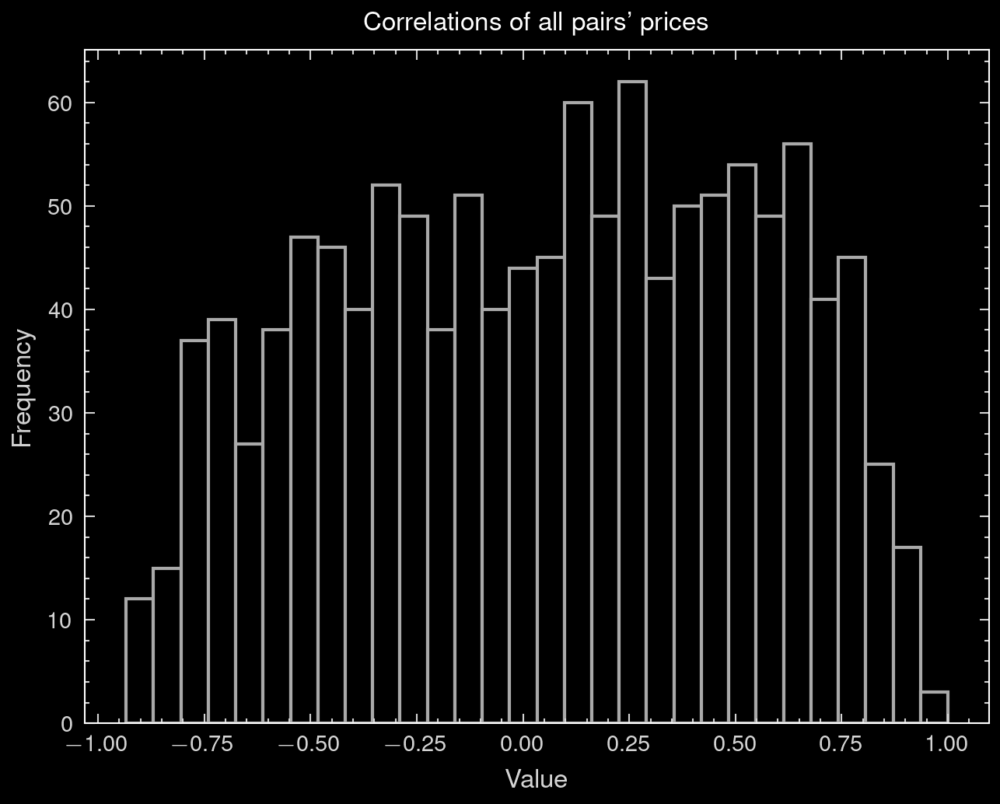

In [25]:
plt.hist(all_correlations, bins = 30, edgecolor   =   'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Correlations of all pairs' prices", fontsize = 8);

### Cointegration of all relevant pairs

In [26]:
from statsmodels.tsa.stattools import adfuller
from scipy.odr import ODR, Model, Data

all_adf_stats = []
all_adf_pvals = []
all_slopes = []
all_half_lifes = []

for i in range(len(paired_prices)):
    
    # Apply log transformation to stabilize variance and normalize price differences between the two assets before testing for mean-reversion.
    prices1 = np.log(paired_prices[i][0])
    prices2 = np.log(paired_prices[i][1])

    # Step 1: Perform Orthogonal Regression with 0 Intercept
    slope = trd.orthogonal_regression(prices1, prices2)[0]  # Extract slope
    all_slopes += [slope]  # Store the slope

    # Calculate residuals
    predicted_prices2 = slope * prices1  # Compute predicted prices with slope
    residuals = prices2 - predicted_prices2

    # Step 2: Perform ADF Test on Residuals
    adf_test = adfuller(residuals)

    adf_stat = adf_test[0]  # Test statistic
    p_value = adf_test[1]   # p-value
    
    # Step 3: Compute half-life of mean-reversion
    half_life =trd.compute_half_life(residuals)
    all_half_lifes += [half_life]
    

    all_adf_stats += [adf_stat]
    all_adf_pvals += [p_value]


In [27]:
max_coint = trd.n_largest(list_to_max=all_adf_stats,n_max=20)
np.array(pairs_SNP)[max_coint[1]]


array([['MU', 'KO'],
       ['MU', 'BMY'],
       ['MU', 'PYPL'],
       ['MU', 'AMCR'],
       ['MU', 'XOM'],
       ['MU', 'WMT'],
       ['MU', 'NEE'],
       ['MU', 'KMI'],
       ['AAPL', 'MU'],
       ['MSFT', 'KO'],
       ['PFE', 'MU'],
       ['T', 'MU'],
       ['MU', 'PCG'],
       ['MU', 'META'],
       ['BMY', 'DELL'],
       ['MU', 'CSCO'],
       ['AMD', 'NEE'],
       ['UBER', 'KO'],
       ['AMD', 'BMY'],
       ['AMD', 'PYPL']], dtype='<U5')

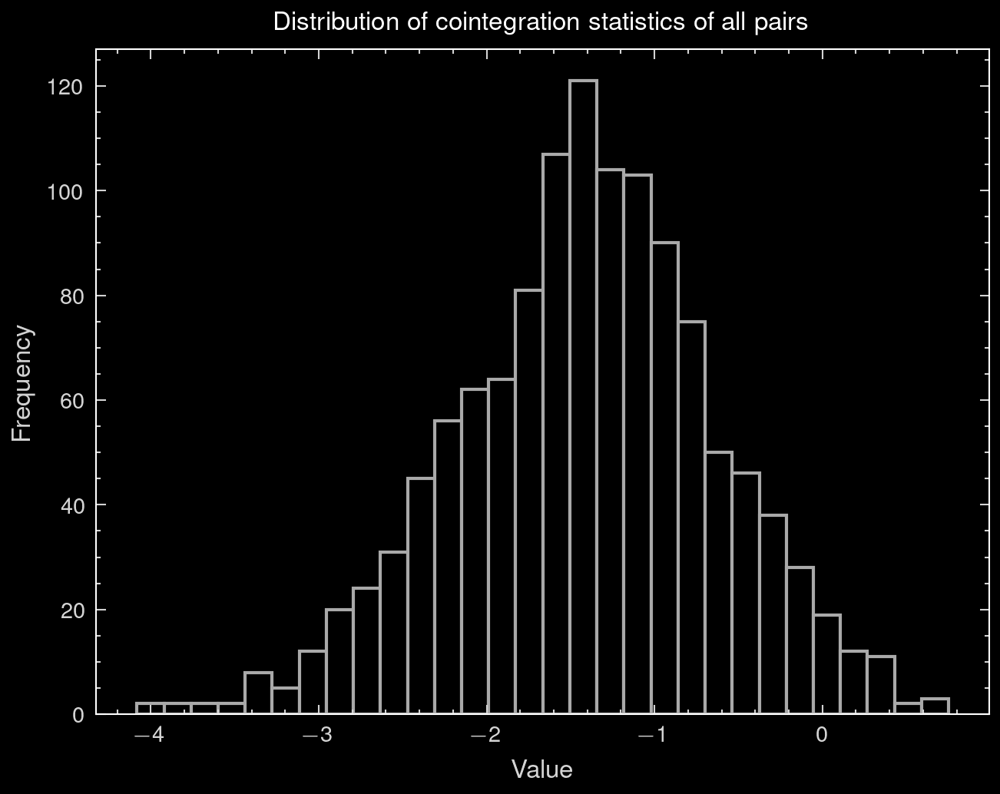

In [28]:
plt.hist(all_adf_stats, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of cointegration statistics of all pairs", fontsize = 8);

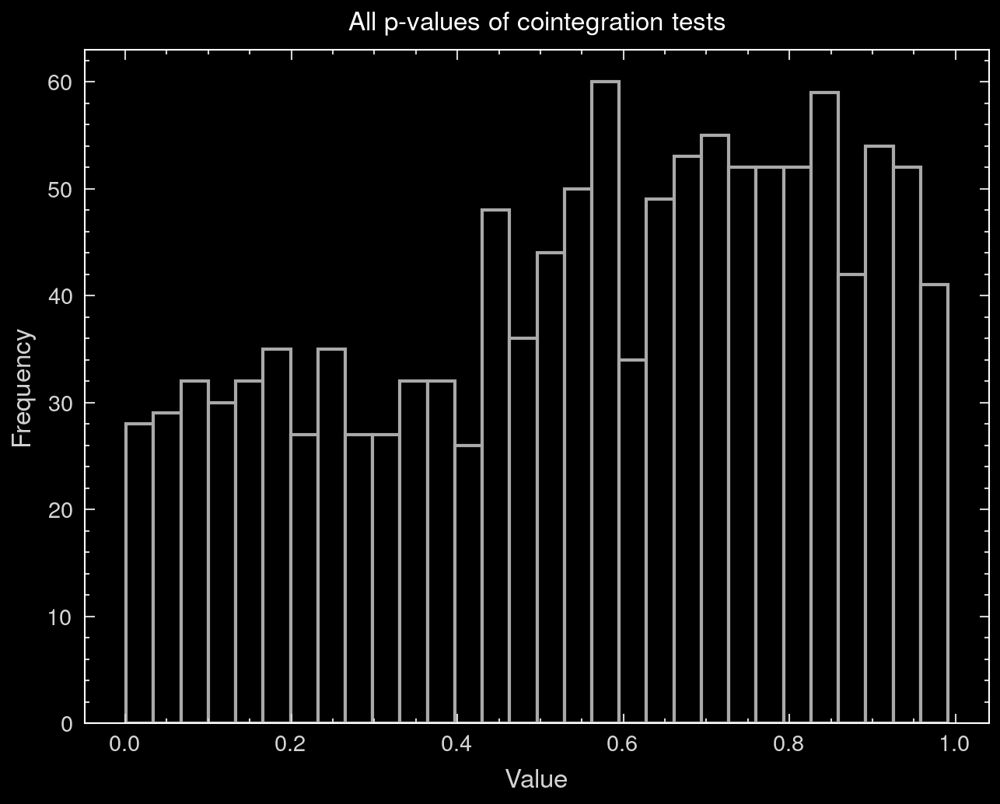

In [29]:
plt.hist(all_adf_pvals, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("All p-values of cointegration tests", fontsize = 8);

In [ ]:
# Selecting pairs that have a p-value of the cointegration test below a fixed critical_alpha
critical_alpha = 0.1
half_lives_cointegrating_pairs = np.array(all_half_lifes)[np.array(all_adf_pvals) < critical_alpha]

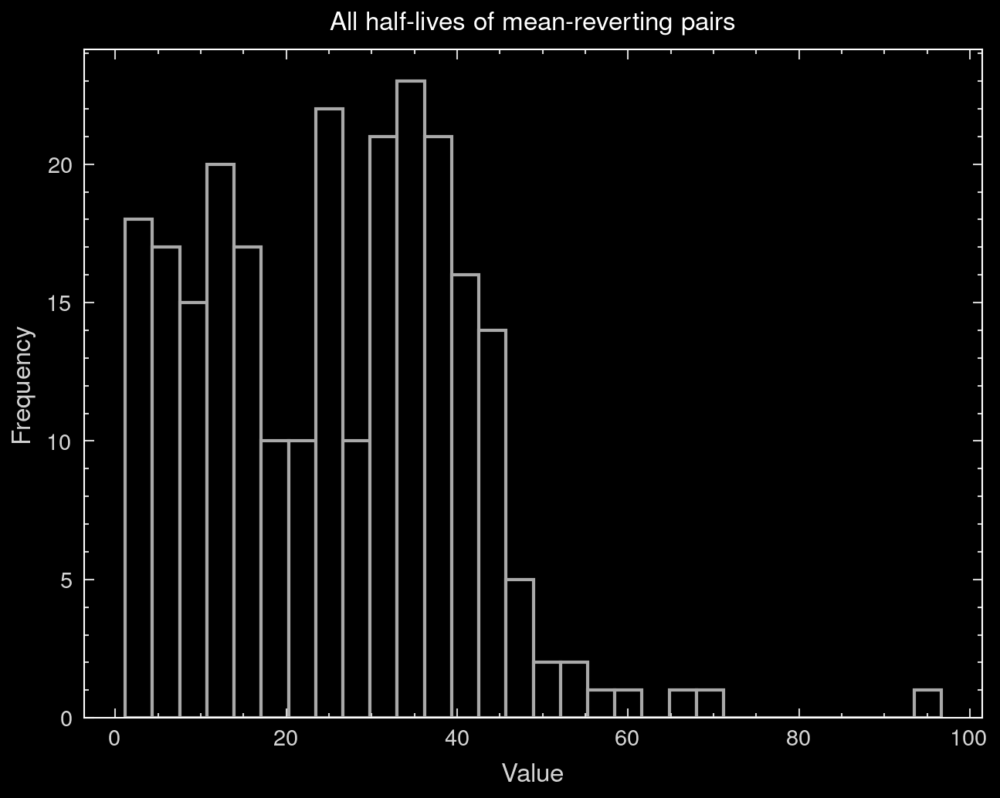

In [ ]:
plt.hist(half_lives_cointegrating_pairs, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("All half-lives of mean-reverting pairs", fontsize = 8);

In [ ]:
np.mean(half_lives_cointegrating_pairs)

25.613661872555397

There are approximately 200 data points per day in our dataset (because we have prices for every 2 minutes), so it takes on average a little more than 2 days (436 steps) for a pair of prices to revert to its mean.

### Exploring the relationships between some of the statistical properties of the pairs

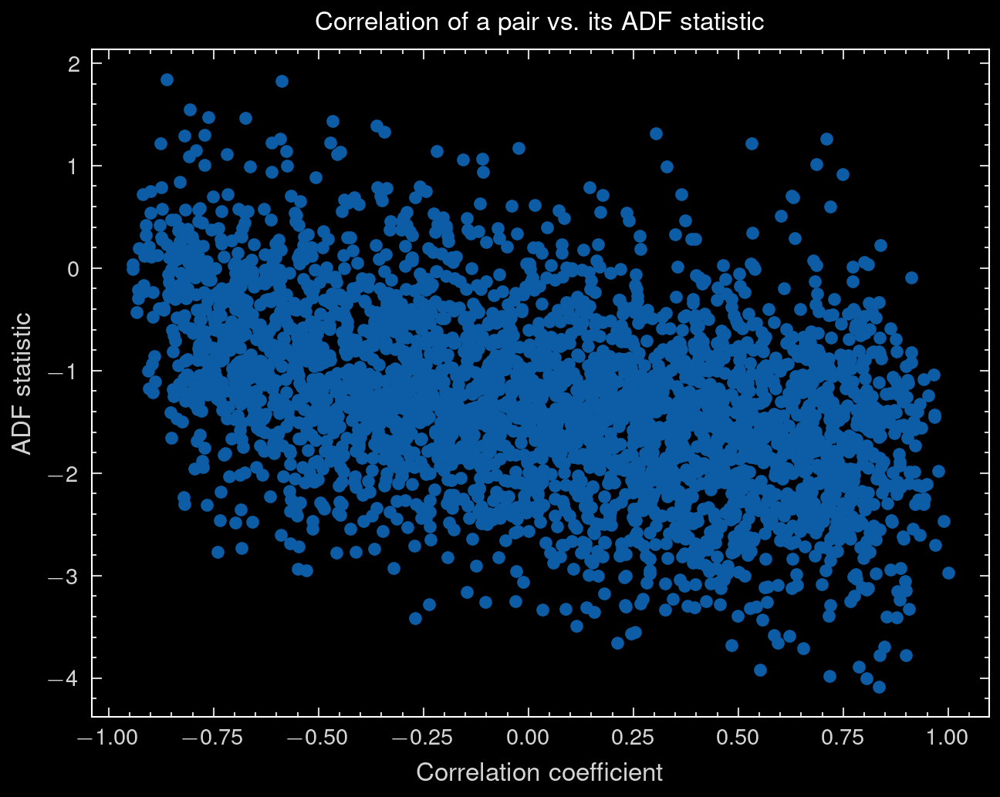

In [ ]:
plt.scatter(all_correlations,all_adf_stats)
plt.xlabel("Correlation coefficient", fontsize = 8)
plt.ylabel("ADF statistic", fontsize = 8)
plt.title("Correlation of a pair vs. its ADF statistic", fontsize = 8);

We can see that there is a weak negative correlation between the ADF statistic and the correlation coefficient of a pair. In other words, the more the prices of a pair are correlated, the more likely this pair is mean-reverting (lower ADF statistic means better mean reversion).

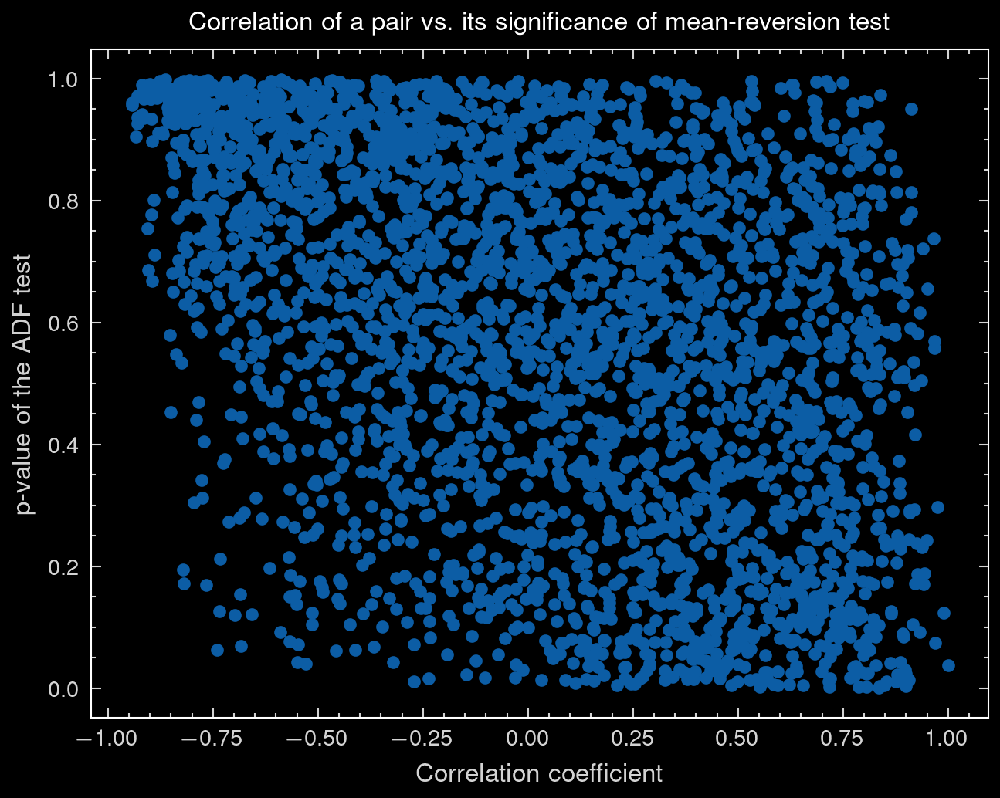

In [ ]:
plt.scatter(all_correlations,all_adf_pvals)
plt.xlabel("Correlation coefficient", fontsize = 8)
plt.ylabel("p-value of the ADF test", fontsize = 8)
plt.title("Correlation of a pair vs. its significance of mean-reversion test", fontsize = 8);

### Mini-backtest

In [ ]:
result = trd.simulate_trading_rescaled_e_dyn(price_list1=paired_prices[pair_index][0], price_list2=paired_prices[pair_index][1], error_rate=0.01, money_invested=25000, leave_profit=1000000, leave_loss=-1000000, startingStep=30, min_gain=5, c_edge=0.0, max_open=20, temp_loss=10, memory_es=30, ratio_open_close=1,max_trades=1000)

In [ ]:
my_df = result.res_df
my_df['Time'] = close_prices3.index
my_df

,Price1,Price2,EntryPrice1,EntryPrice2,Order1,Order2,ExecutedTrade1,ExecutedTrade2,PlannedShares1,PlannedShares2,...,UnrealizedPnL2,CrossPrice,PositionsStatus,Side,HoldingDuration,RealizedPnL,CumulativePnL,Spread,HedgeRatio,Time
0,32.09,11.87,0.00,0.00,388.0,-1058.0,0.0,0.0,388.0,-1058.0,...,0.00,False,closed,-1,0,0.00,0.00,11.870000,"[0.3659880294063868, 0.011405049218023895]",2025-02-05 15:37:00+01:00
1,32.09,11.84,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,False,closed,0,1,0.00,0.00,0.084039,"[0.36857944575527973, 0.011485803856506067]",2025-02-05 15:38:00+01:00
2,32.12,11.83,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,False,closed,0,1,0.00,0.00,-0.020258,"[0.3679553555775831, 0.011466409711079949]",2025-02-05 15:39:00+01:00
3,32.07,11.87,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,False,closed,0,1,0.00,0.00,0.058205,"[0.36975125391538916, 0.011522666262081961]",2025-02-05 15:40:00+01:00
4,32.10,11.85,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,False,closed,0,1,0.00,0.00,-0.030538,"[0.36880987517202307, 0.011493446963376223]",2025-02-05 15:41:00+01:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3085,35.05,12.20,35.10,12.20,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,False,closed,0,1,-92.27,-92.27,-0.002922,"[0.34570171339963773, 0.083178333576265]",2025-02-14 21:55:00+01:00
3086,35.04,12.19,35.04,12.19,-355.0,1022.0,-355.0,1022.0,-355.0,1022.0,...,-0.00,False,closed,1,1,-94.27,-94.27,-0.006566,"[0.3455161025352949, 0.0831683469654083]",2025-02-14 21:56:00+01:00
3087,35.04,12.18,35.04,12.19,0.0,0.0,0.0,0.0,-355.0,1022.0,...,-10.22,False,open,1,1,-94.27,-104.49,-0.010053,"[0.3452317443156666, 0.08316017423236141]",2025-02-14 21:57:00+01:00
3088,35.06,12.19,35.04,12.19,0.0,0.0,0.0,0.0,-355.0,1022.0,...,0.00,False,open,1,2,-94.27,-101.37,0.003015,"[0.34531709965637225, 0.08315837208117913]",2025-02-14 21:58:00+01:00


### Rolling regression of the pairs

In this section, I compute the regression per day for all the pairs considered. This allows us to see how the linear relationship between a pair evolves from one day to the next.

In [ ]:
#Computing the number of data points per day (needed below)
# Ensure 'Date' column is in datetime format and remove timezone
close_prices3['Date'] = pd.to_datetime(close_prices3['Date']).dt.tz_localize(None)

# Extract only the date (removing the time)
close_prices3['DateOnly'] = close_prices3['Date'].dt.date

# Count number of data points per day
data_points_per_day = close_prices3.groupby('DateOnly').size()

# Mean number of data points per day
np.mean(data_points_per_day)

/var/folders/dy/0dr1rz555tqczw3kw215bzcw0000gn/T/ipykernel_50664/3552007230.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  close_prices3['Date'] = pd.to_datetime(close_prices3['Date']).dt.tz_localize(None)
/var/folders/dy/0dr1rz555tqczw3kw215bzcw0000gn/T/ipykernel_50664/3552007230.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  close_prices3['DateOnly'] = close_prices3['Date'].dt.date


191.85714285714286

In [ ]:
all_avg_change = []
all_std_change = []
all_slopes = []
all_abs_change = []
all_pct_changes = []

for pair in pairs_SNP:
    
    slopes = []
    for day in unique_days:
    
        prices1 = np.array(close_prices3[times_dt.dt.normalize() == day][pair[0]])
        prices2 = np.array(close_prices3[times_dt.dt.normalize() == day][pair[1]])
        slopes += [trd.orthogonal_regression(prices1, prices2)]
        
    all_slopes += [slopes]
    #Compute the percentage changes of the slope over the considered period
    percentage_changes = np.diff(slopes) / slopes[:-1]
    all_pct_changes += [percentage_changes]
    
    #Store the mean and standard deviation of percentage changes
    all_avg_change += [np.mean(percentage_changes)]
    all_std_change += [np.std(percentage_changes)]
    all_abs_change += [np.mean(abs(percentage_changes))]

In [ ]:
all_pct_changes_flat = [item for sublist in all_pct_changes for item in sublist]
len(all_pct_changes_flat)

129560

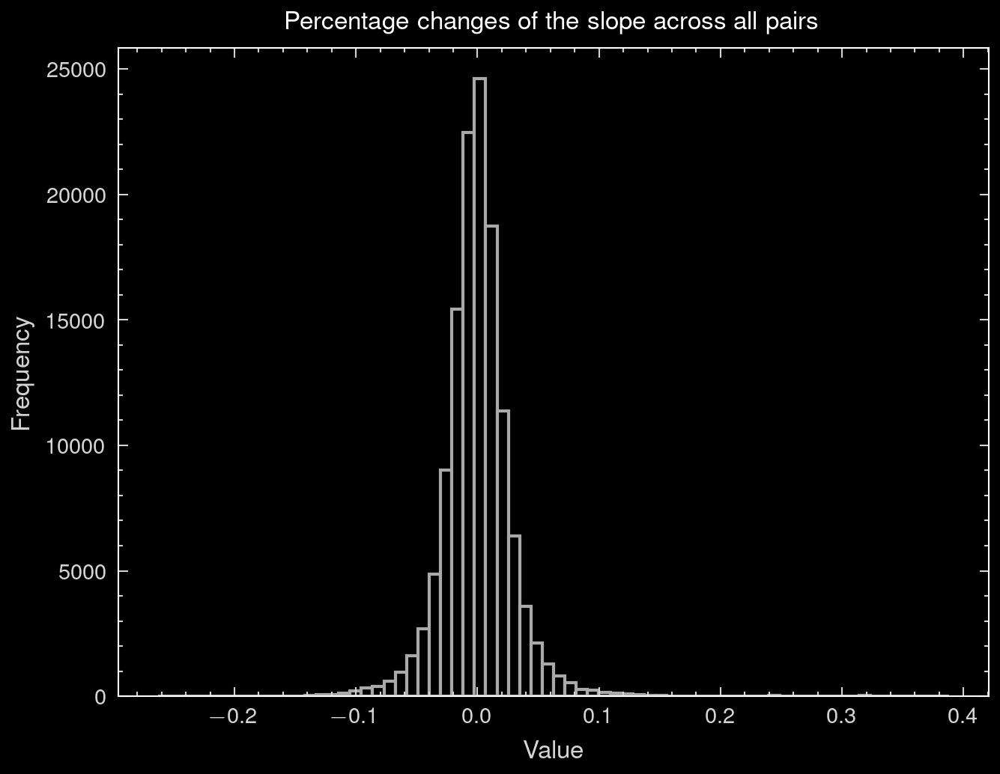

In [ ]:
plt.hist(all_pct_changes_flat, bins = 70, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Percentage changes of the slope across all pairs", fontsize = 8);

In [ ]:
# Daily changes of the slope by more than 7% are very rare
np.quantile(all_pct_changes_flat, [0.01,0.99])

array([-0.07692256,  0.0794701 ])

In [ ]:
max(all_pct_changes_flat), min(all_pct_changes_flat)

(0.388319377159806, -0.2631147771041056)

In [ ]:
# 20 largest and 20 smallest absolute percentage changes of the slope (over all pairs)
trd.n_largest(all_pct_changes_flat,10)[0], trd.n_largest(-np.array(all_pct_changes_flat),10)[0]

([0.388319377159806,
  0.3563257159737216,
  0.3502426434499532,
  0.3417398939207745,
  0.3416169248985699,
  0.339571138465675,
  0.33956512832518704,
  0.3383223794821934,
  0.33826819333873975,
  0.3370522056068823],
 [0.2631147771041056,
  0.2572427329234607,
  0.2527795413004372,
  0.25025801873696546,
  0.2495032443837572,
  0.24922459970315614,
  0.24765175454421726,
  0.2465993201474825,
  0.2438869791506963,
  0.24345422351479953])

In [ ]:
all_pct_changes_flatNP = np.array(all_pct_changes_flat)

# Proportion of elements below a certain threshold
threshold = 0.1
proportion_below = np.mean(all_pct_changes_flatNP < -threshold)  # Elements below threshold
print(f"Proportion below {-threshold}: {proportion_below}")

# Proportion of elements above a certain threshold
proportion_above = np.mean(all_pct_changes_flatNP > threshold)  # Elements above threshold
print(f"Proportion above {threshold}: {proportion_above}")

Proportion below -0.1: 0.003465575794998456
Proportion above 0.1: 0.00552639703612226


In [ ]:
threshold = 0.1
proportion_between = np.mean((all_pct_changes_flatNP < threshold) & (all_pct_changes_flatNP > -threshold))
proportion_between

0.9910080271688793

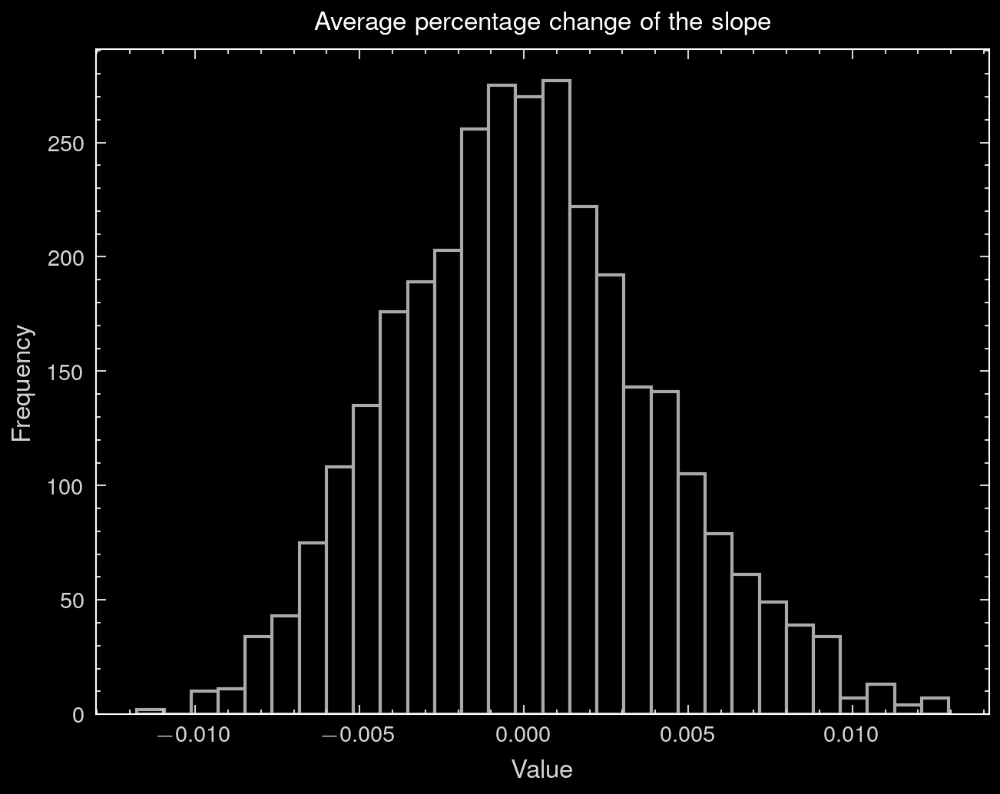

In [ ]:
# Looking at the data per pair: 'all_avg_change' contains the average change of the slope for each pair over the period considered. There are as many elements in this list as there are pairs
plt.hist(all_avg_change, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Average percentage change of the slope", fontsize = 8);

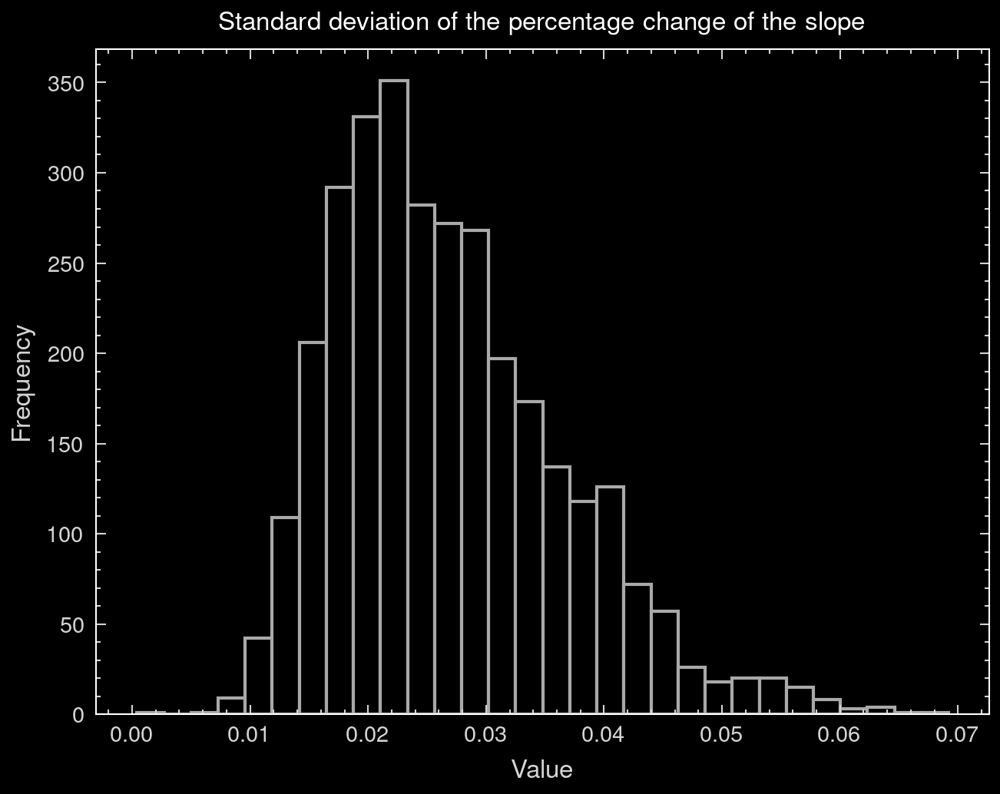

In [ ]:
plt.hist(all_std_change, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Standard deviation of the percentage change of the slope", fontsize = 8);

In [ ]:
np.mean(all_std_change), np.std(all_std_change)

(0.026879950369341148, 0.009645649479331605)

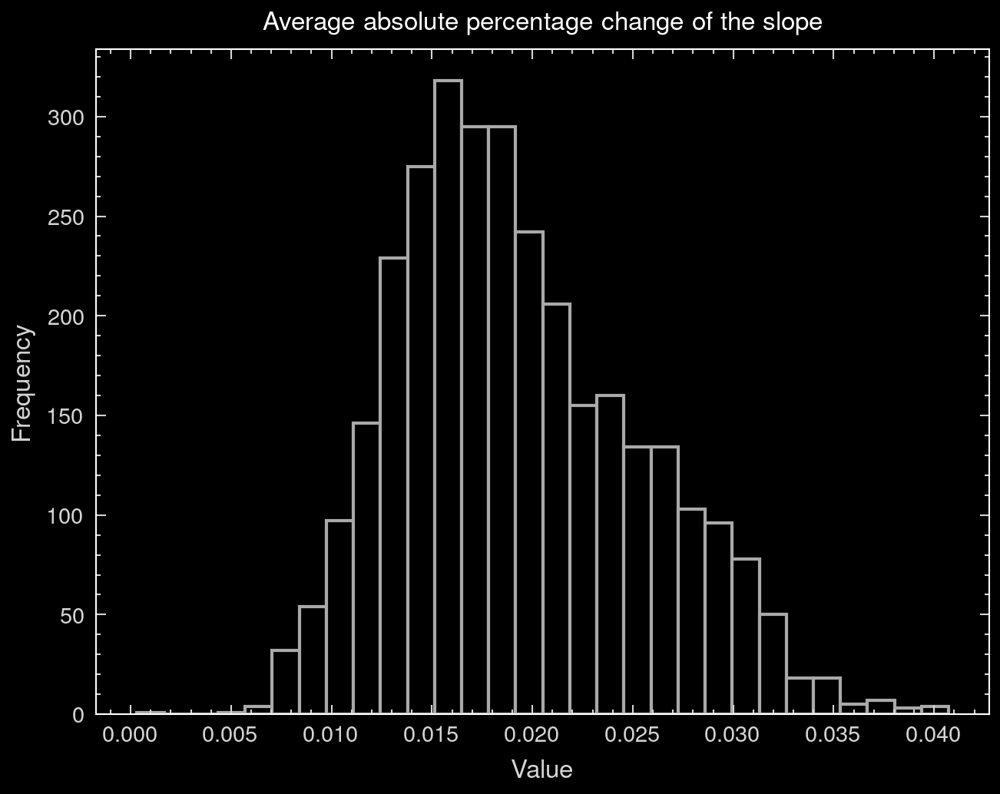

In [ ]:
plt.hist(all_abs_change, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Average absolute percentage change of the slope", fontsize = 8);

In [ ]:
trd.n_largest(-np.array(all_abs_change),10)

[[-0.0003148956485285852,
  -0.005164596870159406,
  -0.005957292766412958,
  -0.006437428547699005,
  -0.0068134085429457794,
  -0.006814488901648923,
  -0.007071454289547361,
  -0.007284043456959821,
  -0.007298958729191618,
  -0.007311023269127734],
 [1222, 546, 2244, 2584, 1603, 1051, 2765, 2254, 569, 1472]]

In the cell below, I evaluate two things:
1. Whether the prices cross the regression line of any particular day, which means that there is "partial mean reversion" and a position would have been profitable. The variable `nb_days_no_return` captures the number of days for each pair such that the future prices never cross the regression line of that particular day.
2. If prices do cross the regression line, how many days does it take? This is captured by the variable `avg_return_time`.

In [ ]:
lookahead_window = 5 #Make sure all of the computations have enough future data points to use 
nb_days_no_return = []
all_avg_return_times = []
pair_indices = list(range(len(paired_prices)))
#pair_indices = adf_max[1]


id_pair=0
for pair in pairs_SNP:
    slopes = all_slopes[id_pair]
    all_props = []

    for i in range(len(slopes)):
        all_prop_i = []
        for j in range(1,len(slopes)-i):
            prices1 = np.array(close_prices3[times_dt.dt.normalize() == unique_days[i+j]][pair[0]])
            prices2 = np.array(close_prices3[times_dt.dt.normalize() == unique_days[i+j]][pair[1]])
            prop_one_side = trd.linear_prediction_errors(slopes[i], 0, prices1, prices2)[1]
            all_prop_i += [prop_one_side]
        all_props += [all_prop_i]
        
    
    all_first_pos_prop = []

    for i in range(len(all_props) - lookahead_window):
        first_positive_prop = next((i for i, x in enumerate(all_props[i]) if x != 0), None)
        all_first_pos_prop += [first_positive_prop]

    nb_days_no_return += [all_first_pos_prop.count(None)]
    filtered_all_first = [x for x in all_first_pos_prop if x is not None]
    avg_return_time = np.mean(filtered_all_first)
    all_avg_return_times += [avg_return_time]
    id_pair+=1

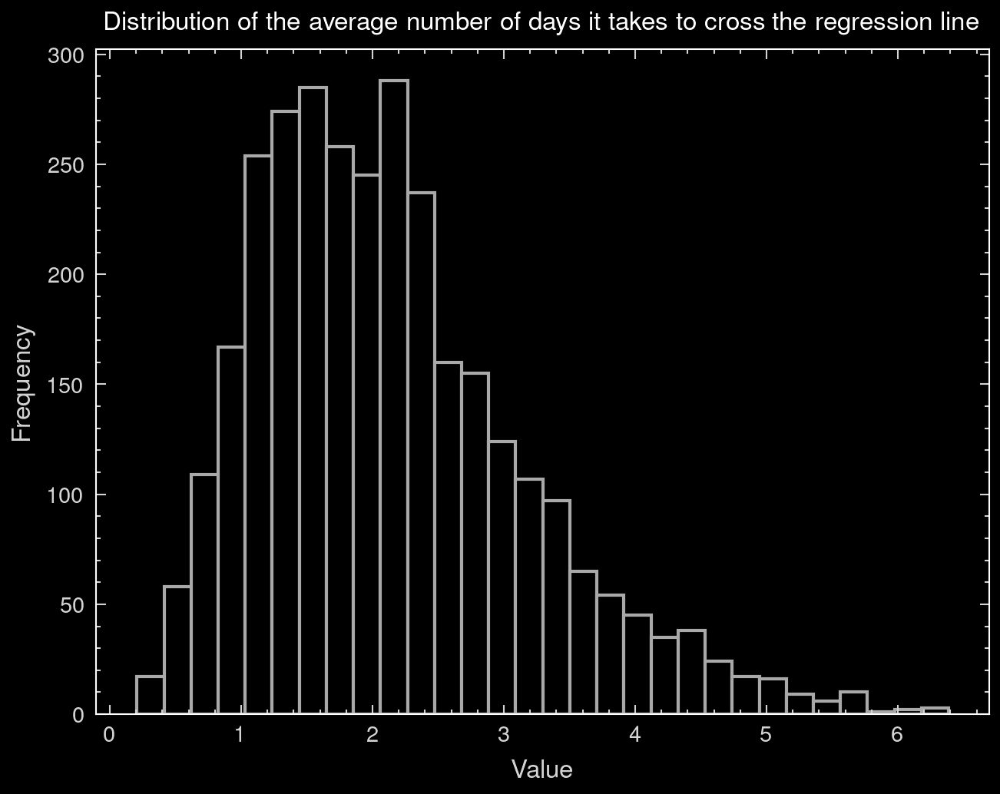

In [ ]:
plt.hist(all_avg_return_times, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of the average number of days it takes to cross the regression line", fontsize = 8);

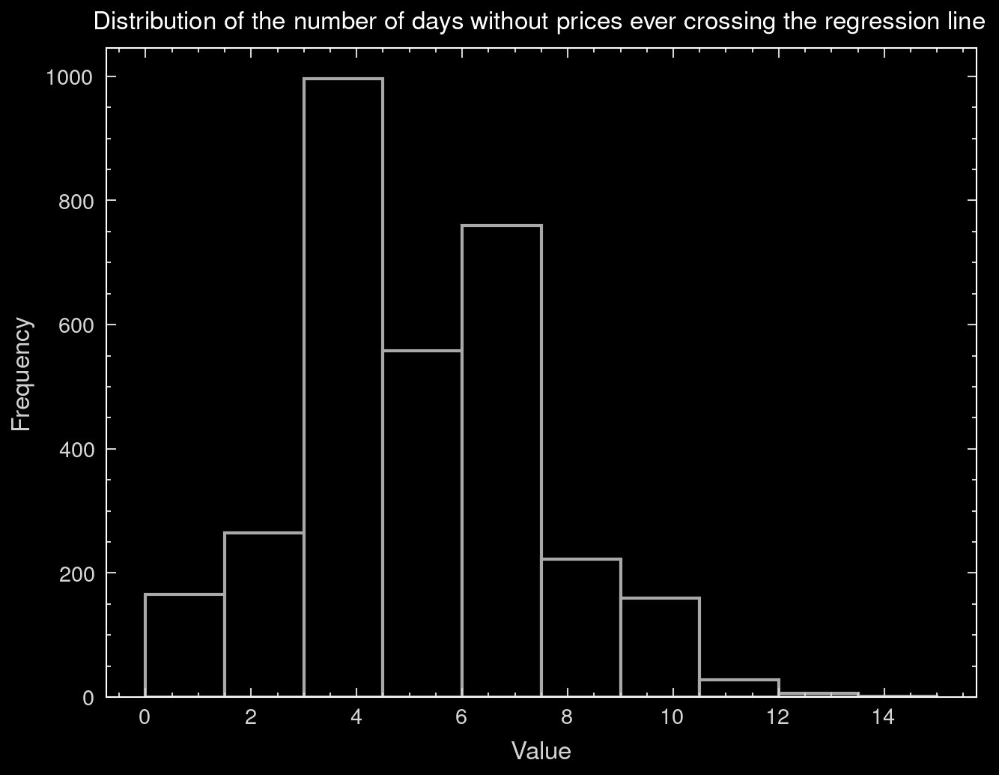

In [ ]:
plt.hist(nb_days_no_return, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of the number of days without prices ever crossing the regression line", fontsize = 8);

In [ ]:
np.mean(nb_days_no_return)

4.913607594936709

In [ ]:
no_ret = np.array(nb_days_no_return)
len(no_ret[no_ret == 0])

29

In [ ]:
pairs_SNP[np.where(no_ret == 0)[0]]

array([['NVDA', 'UBER'],
       ['T', 'CRM'],
       ['AMZN', 'WMT'],
       ['AMZN', 'BA'],
       ['PFE', 'MO'],
       ['GOOGL', 'MSFT'],
       ['KVUE', 'KHC'],
       ['KEY', 'NEM'],
       ['CMG', 'QCOM'],
       ['MSFT', 'GOOG'],
       ['PYPL', 'LUV'],
       ['XOM', 'KO'],
       ['XOM', 'BA'],
       ['PCG', 'SBUX'],
       ['FCX', 'MRK'],
       ['NEE', 'BA'],
       ['SBUX', 'KDP'],
       ['LUV', 'MRK'],
       ['LUV', 'CNP'],
       ['DAL', 'MRK'],
       ['DIS', 'CNP'],
       ['AES', 'UAL'],
       ['UAL', 'MRK'],
       ['MNST', 'BA'],
       ['KDP', 'BA'],
       ['MRK', 'CNP'],
       ['CNP', 'APH'],
       ['LVS', 'HST'],
       ['HST', 'DVN']], dtype='<U5')

In [ ]:
#Measuring cointegration of the slope
from statsmodels.tsa.stattools import adfuller

all_pval_slopes = []
all_ADF_slopes = []

for i in range(len(all_slopes)):
    result = adfuller(all_slopes[i])
    all_ADF_slopes += [result[0]]
    all_pval_slopes += [result[1]]

In [ ]:
result[1]

0.34195447749567875

Text(0.5, 1.0, 'ADF statistic measuring stationarity of the slope')

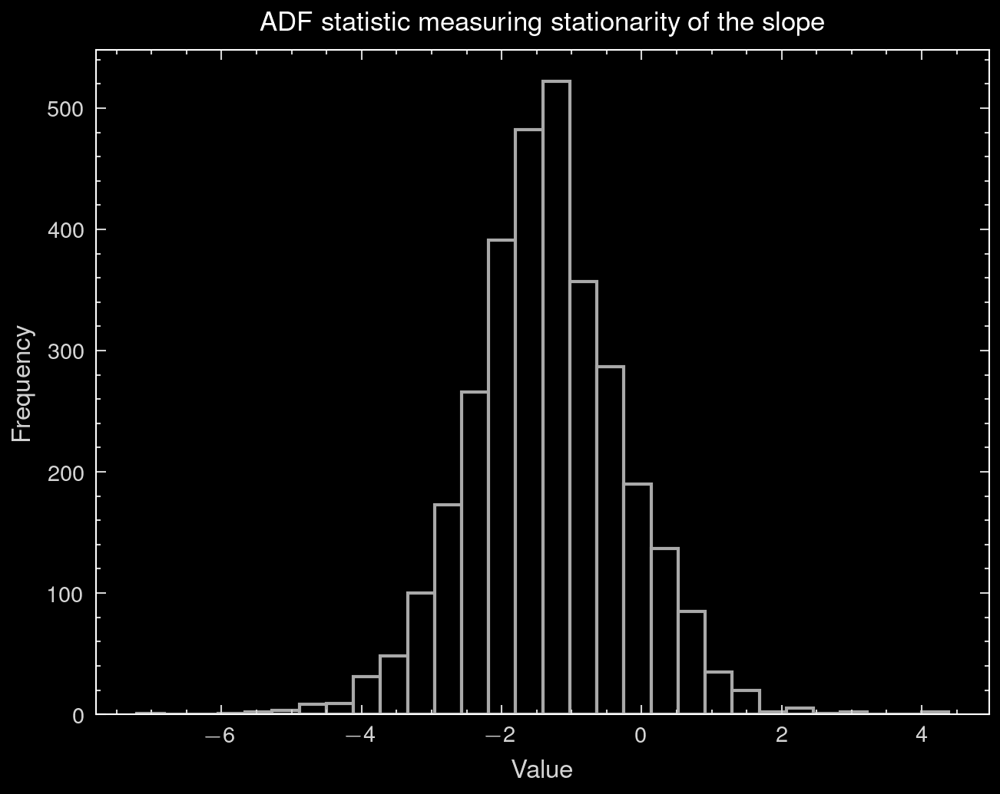

In [ ]:
plt.hist(all_ADF_slopes, bins = 30, edgecolor = 'darkgray', color = 'black', alpha = 1);
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("ADF statistic measuring stationarity of the slope")

Text(0.5, 1.0, 'Significance of the test measuring stationarity of the slope')

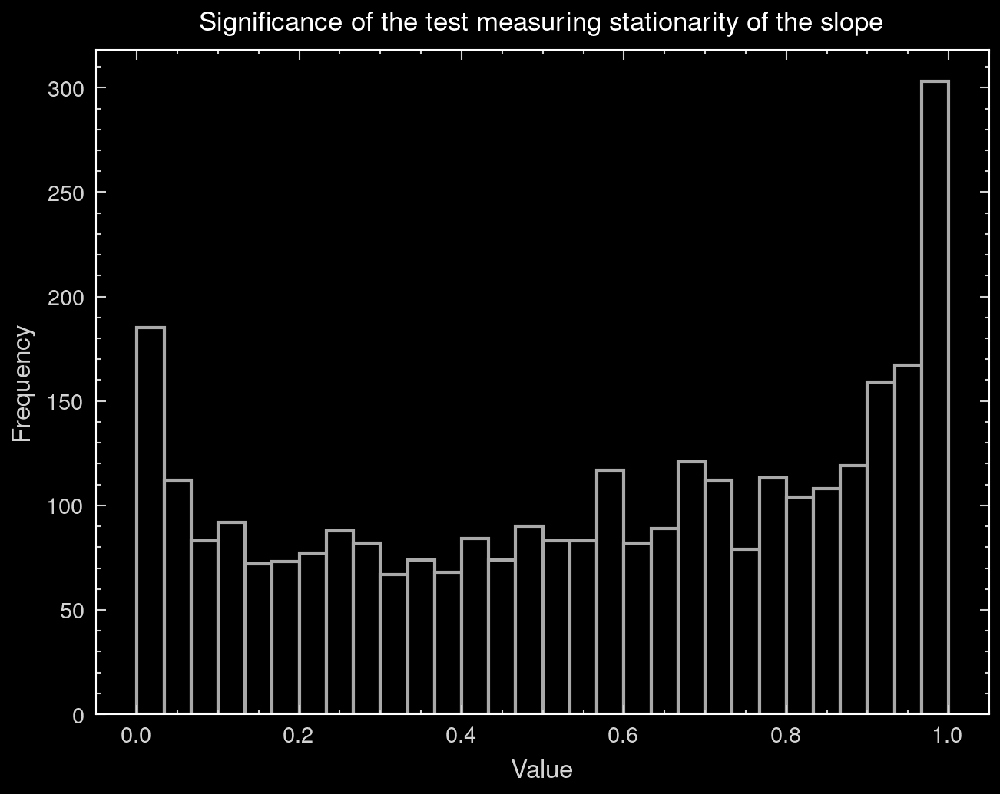

In [ ]:
plt.hist(all_pval_slopes, bins = 30, edgecolor = 'darkgray', color = 'black', alpha = 1);
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Significance of the test measuring stationarity of the slope")

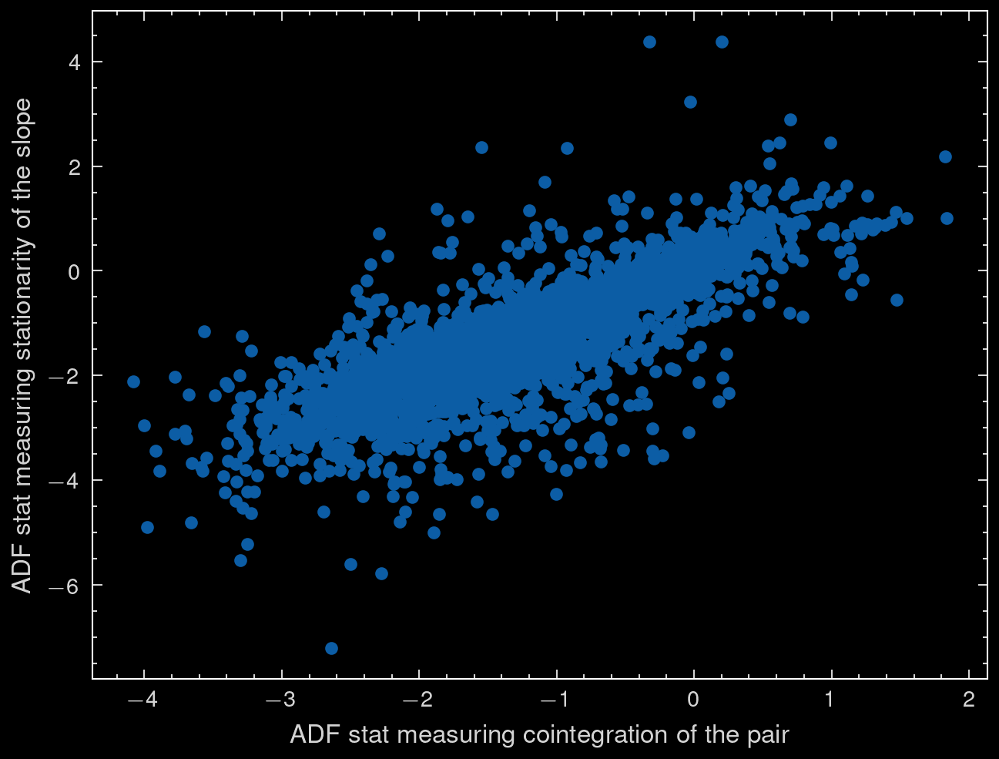

In [ ]:
plt.scatter(all_adf_stats, all_ADF_slopes)
plt.xlabel("ADF stat measuring cointegration of the pair", fontsize = 8);
plt.ylabel("ADF stat measuring stationarity of the slope", fontsize = 8);

## Backtesting the trading algorithm for all relevant pairs

### Using yesterday's slope to trade today

In [ ]:
net_pairs = []
my_pairs = pairs_SNP
#my_pairs = pairs_by_sector
all_min_net = []

# List to store performance metrics for each pair
metrics_list = []
budget = 50000


for pair in my_pairs:

    last_portfolio = [0,0]
    last_prices_portfolio = [0,0]
    last_gross = 0
    last_net = 0
    last_side = 0
    last_commissions = 0
    last_length_open = 0
    all_last_net = []
    all_net = [0]
    all_res = pd.DataFrame()
    net_worth = budget


    prices1 = np.array(close_prices3[times_dt.dt.normalize() == unique_days[0]][pair[0]])
    prices2 = np.array(close_prices3[times_dt.dt.normalize() == unique_days[0]][pair[1]])

    last_slope = trd.orthogonal_regression(prices_1 = prices1, prices_2 = prices2)

    i=0
    for day in unique_days[1:]:
        prices1 = np.array(close_prices3[times_dt.dt.normalize() == day][pair[0]])
        prices2 = np.array(close_prices3[times_dt.dt.normalize() == day][pair[1]])
                
        
        res_sim = trd.simulate_trading_rescaled_e_cst(price_list1=prices1,price_list2=prices2,error_rate=0.01,money_invested = net_worth,leave_profit=100000,leave_loss=-100000,startingStep=1,min_gain=300,c_edge=0.02,max_open=390,temp_loss=500,memory_es=30,ratio_open_close=0.8,hedge_ratio=[last_slope,0], init_portfolio=last_portfolio, prices_init_portfolio=last_prices_portfolio, init_gross=last_gross, init_net=last_net, init_side=last_side, init_commissions=last_commissions, init_length_open=last_length_open, max_trades=1)
        
        all_net += list(res_sim.res_df['CumulativePnL'])
        all_res = pd.concat([all_res, res_sim.res_df])
        
        last_portfolio = np.array(res_sim.res_df[['Shares1','Shares2']])[-1]
        if last_portfolio[0] != 0 and last_portfolio[1] != 0:
            last_prices_portfolio = np.array(res_sim.res_df[['EntryPrice1','EntryPrice2']])[-1]
        else:
            last_prices_portfolio = [0,0]
        
        last_gross = np.array(res_sim.res_df['Gross'])[-1]
        last_net = np.array(res_sim.res_df['CumulativePnL'])[-1]
        net_worth = net_worth + last_net
        last_side = np.array(res_sim.res_df['Side'])[-1]
        last_length_open = res_sim.length_open
        last_commissions = res_sim.commissions
        
        last_slope = trd.orthogonal_regression(prices_1 = prices1, prices_2 = prices2)
    # Compute metrics for the current pair and store results
    metrics = trd.compute_trading_metrics(all_res, initial_balance=budget)
    metrics['Pair'] = pair  # Add pair identifier

    metrics_list.append(metrics)

# Convert metrics list to a DataFrame
metrics_df = pd.DataFrame(metrics_list)

# Save results to CSV
metrics_df.to_csv("pair_trading_metrics.csv", index=False)

# Display the top performing pairs based on total return
top_pairs = metrics_df.sort_values(by="Total_Return (%)", ascending=False).head(10)
top_pairs


,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
11,50000,81150.27,62.30054,93.412184,-17.506102,86,0.133623,102,94,8,92.156863,0.239063,"[NVDA, AVGO]"
81,50000,72886.87,45.77374,92.967061,-14.196577,28,0.104682,91,87,4,95.604396,0.099856,"[TSLA, AMD]"
1644,50000,72318.83,44.63766,88.795625,-9.256370,88,0.160538,56,51,5,91.071429,0.322622,"[WFC, DAL]"
2371,50000,70909.97,41.81994,94.111662,-48.939301,42,0.063471,97,90,7,92.783505,0.112243,"[FCX, VST]"
2531,50000,70210.67,40.42134,84.878545,-12.832782,132,0.125508,63,57,6,90.476190,0.291657,"[SBUX, LUV]"
2631,50000,68141.22,36.28244,93.679257,-12.976660,64,0.101309,65,57,8,87.692308,0.266660,"[LUV, BA]"
964,50000,66864.81,33.72962,90.385349,-26.994071,137,0.068558,106,100,6,94.339623,0.109575,"[MU, CMG]"
1152,50000,66751.91,33.50382,96.871423,-18.912110,9,0.089392,60,55,5,91.666667,0.172423,"[HPE, UBER]"
1704,50000,66185.66,32.37132,89.533257,-31.104818,101,0.063560,82,76,6,92.682927,0.120351,"[UBER, CRWD]"
2998,50000,64890.91,29.78182,91.644411,-19.255681,51,0.083425,74,66,8,89.189189,0.235588,"[UAL, VST]"


In [ ]:
metrics_df["Same_Sector"] = metrics_df["Pair"].apply(lambda pair: trd.find_pair(pairs_by_sector, pair) != -1)

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair,Same_Sector
0,50000,49002.47,-1.99506,69.464581,-8.371982,5,-0.018268,25,19,6,76.000000,0.272711,"[NVDA, TSLA]",False
1,50000,46736.98,-6.52604,76.980796,-17.368803,4,-0.018542,29,21,8,72.413793,0.288490,"[NVDA, F]",False
2,50000,51902.45,3.80490,82.691085,-8.262464,213,0.029917,38,29,9,76.315789,0.419682,"[NVDA, AAPL]",False
3,50000,44870.86,-10.25828,85.031159,-13.669365,5,-0.083929,22,15,7,68.181818,0.267374,"[NVDA, AMD]",True
4,50000,47347.80,-5.30440,66.984611,-7.855606,3,-0.052657,20,15,5,75.000000,0.210198,"[NVDA, INTC]",True


In [ ]:
metrics_df.sort_values(by="Total_Return (%)", ascending=False).head(10)

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair,Same_Sector
11,50000,81150.27,62.30054,93.412184,-17.506102,86,0.133623,102,94,8,92.156863,0.239063,"[NVDA, AVGO]",True
81,50000,72886.87,45.77374,92.967061,-14.196577,28,0.104682,91,87,4,95.604396,0.099856,"[TSLA, AMD]",False
1644,50000,72318.83,44.63766,88.795625,-9.256370,88,0.160538,56,51,5,91.071429,0.322622,"[WFC, DAL]",False
2371,50000,70909.97,41.81994,94.111662,-48.939301,42,0.063471,97,90,7,92.783505,0.112243,"[FCX, VST]",False
2531,50000,70210.67,40.42134,84.878545,-12.832782,132,0.125508,63,57,6,90.476190,0.291657,"[SBUX, LUV]",False
2631,50000,68141.22,36.28244,93.679257,-12.976660,64,0.101309,65,57,8,87.692308,0.266660,"[LUV, BA]",False
964,50000,66864.81,33.72962,90.385349,-26.994071,137,0.068558,106,100,6,94.339623,0.109575,"[MU, CMG]",False
1152,50000,66751.91,33.50382,96.871423,-18.912110,9,0.089392,60,55,5,91.666667,0.172423,"[HPE, UBER]",False
1704,50000,66185.66,32.37132,89.533257,-31.104818,101,0.063560,82,76,6,92.682927,0.120351,"[UBER, CRWD]",False
2998,50000,64890.91,29.78182,91.644411,-19.255681,51,0.083425,74,66,8,89.189189,0.235588,"[UAL, VST]",False


In [ ]:
metrics_df.sort_values(by="Total_Return (%)", ascending=False).tail(20)

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair,Same_Sector,Pair_Index
2864,50000,30703.18,-38.59364,92.560092,-41.242904,4,-0.072218,33,26,7,78.787879,0.138840,"[CRWD, AES]",False,2864
711,50000,30579.85,-38.84030,97.634491,-40.544502,2,-0.201434,13,4,9,30.769231,0.126403,"[CCL, LUV]",False,711
1119,50000,30244.19,-39.51162,72.949256,-50.426999,86,-0.114930,38,28,10,73.684211,0.125621,"[WBA, CRWD]",False,1119
933,50000,30178.70,-39.64260,81.355717,-50.701062,131,-0.054149,50,39,11,78.000000,0.137253,"[AVGO, MNST]",False,933
884,50000,30175.91,-39.64818,87.193183,-62.083716,4,-0.034023,46,34,12,73.913043,0.172182,"[AVGO, WBA]",False,884
1104,50000,30161.26,-39.67748,88.910085,-51.865546,4,-0.105510,31,21,10,67.741935,0.152889,"[WBA, META]",False,1104
857,50000,29052.03,-41.89594,88.732036,-48.676178,33,-0.092490,38,29,9,76.315789,0.141113,"[WBD, CRWD]",False,857
911,50000,28709.78,-42.58044,76.230446,-50.256800,1,-0.054362,30,20,10,66.666667,0.136398,"[AVGO, AMCR]",False,911
883,50000,28705.58,-42.58884,89.825766,-65.927957,2,-0.011236,34,23,11,67.647059,0.167236,"[AVGO, HBAN]",False,883
888,50000,28351.79,-43.29642,84.433422,-58.157209,3,-0.044578,31,21,10,67.741935,0.129100,"[AVGO, PARA]",False,888


In [ ]:
len(metrics_df), len(all_adf_stats)

(3160, 11)

In [ ]:
metrics_df["Pair_Index"] = metrics_df["Pair"].apply(lambda pair: trd.find_pair(pairs_SNP, pair))
metrics_df["ADF_Stat"] = metrics_df["Pair_Index"].apply(lambda idx: all_adf_stats[idx])

IndexError: list index out of range

In [ ]:
import seaborn as sns

# Select metrics to compare with ADF statistics
performance_metrics = ["Total_Return (%)", "Sharpe Ratio", "Winrate (%)", "Max_Drawdown (%)"]

# Create scatter plots
for metric in performance_metrics:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=metrics_df["ADF_Stat"], y=metrics_df[metric])
    plt.xlabel("ADF Statistic")
    plt.ylabel(metric)
    plt.title(f"Correlation between ADF Statistic and {metric}")
    plt.show()


<Axes: >

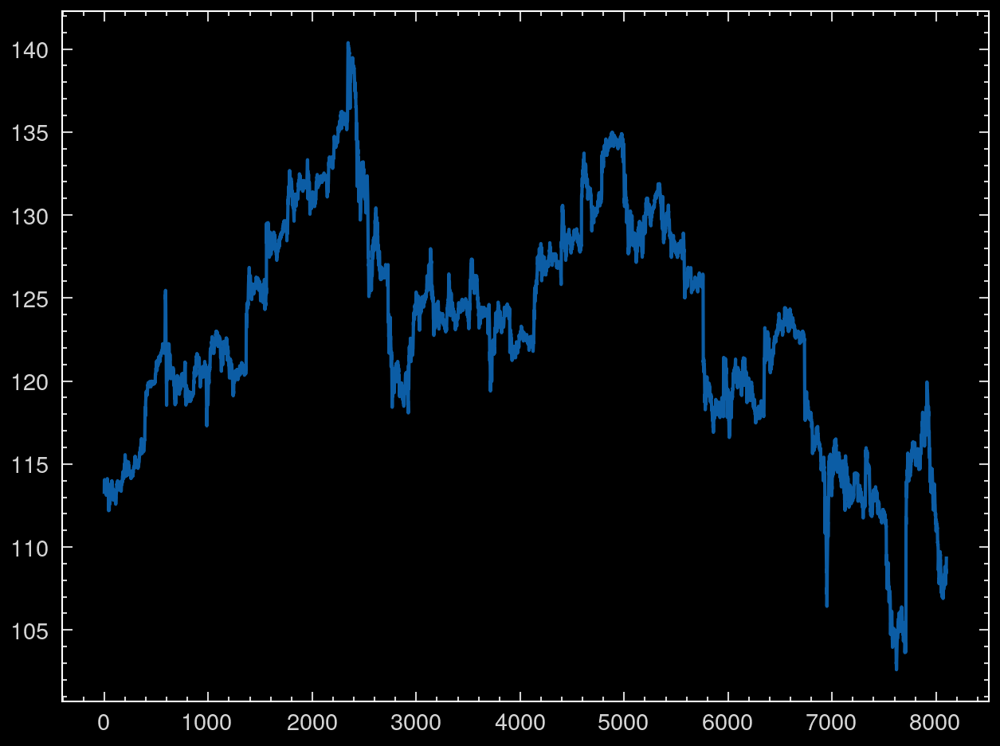

In [ ]:
close_prices3['NVDA'].plot()

In [ ]:
adfuller(close_prices3['NVDA'])

(-1.7398874293813702,
 0.41068722713569633,
 0,
 8057,
 {'1%': -3.431161888374007,
  '5%': -2.8618987968378526,
  '10%': -2.566960982827471},
 3676.982121942381)

<Axes: >

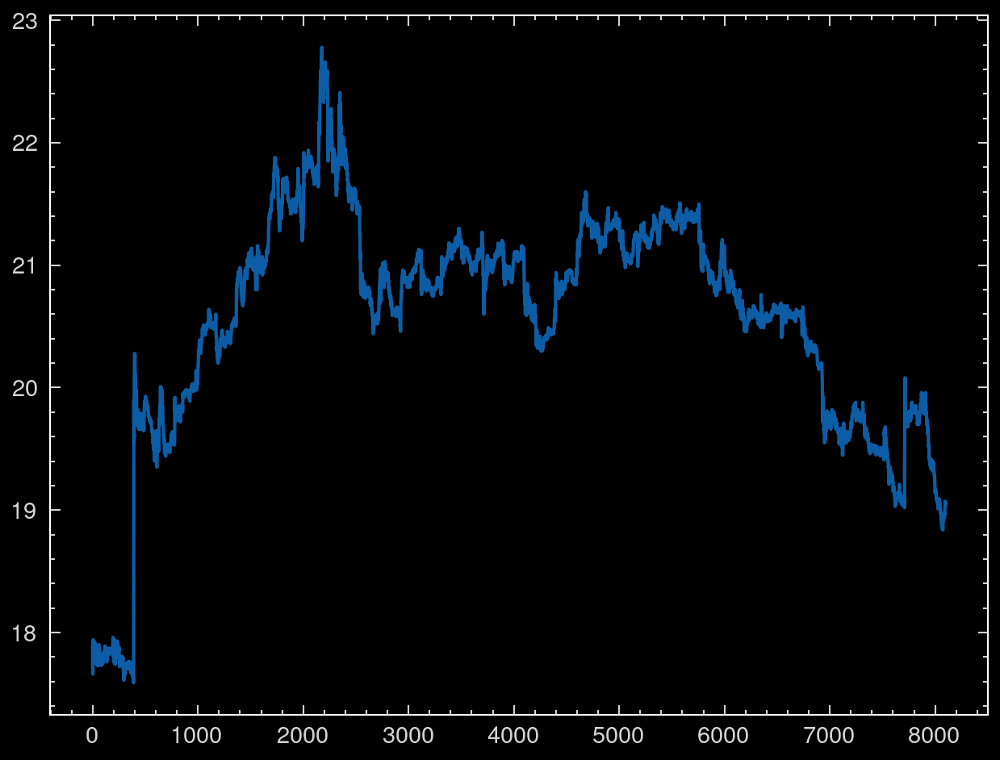

In [ ]:
close_prices3['HPE'].plot()

In [ ]:
pair_index = trd.find_pair(pairs_SNP,['KO','PEP'])
if pair_index != -1:
    plt.scatter(paired_prices[pair_index][0],paired_prices[pair_index][1])
else:
    print("Pair not found")

Pair not found


In [ ]:
'PEP' in close_prices3.columns

True

In [ ]:
res_sim.res_df

,Price1,Price2,PricePrev1,PricePrev2,ExpectedAction1,ExpectedAction2,Action1,Action2,ExpectedShares1,ExpectedShares2,Shares1,Shares2,DiffPrice1,DiffPrice2,CrossPrice,OpenClose,Side,LengthOpen,Net,Gross
0,228.10,40.47,232.34,40.67,89.0,-497.0,0.0,0.0,0.0,0.0,-89.0,497.0,373.80,-119.28,True,closing,-1,352,-1586.60,-1297.29
1,229.31,40.44,232.34,40.67,0.0,0.0,0.0,0.0,-89.0,497.0,-89.0,497.0,266.11,-134.19,False,closing,-1,351,-1709.20,-1297.29
2,227.31,40.44,232.34,40.67,89.0,-497.0,89.0,-497.0,0.0,0.0,0.0,0.0,444.11,-134.19,True,closing,-1,350,-1544.92,-1440.92
3,226.60,40.44,226.62,40.42,93.0,-529.0,93.0,-529.0,93.0,-529.0,93.0,-529.0,-0.00,-0.00,False,opening,1,390,-1559.36,-1134.40
4,227.08,40.43,226.62,40.42,0.0,0.0,0.0,0.0,93.0,-529.0,93.0,-529.0,39.06,-26.45,False,closing,1,390,-1509.43,-1134.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,216.76,40.89,227.02,40.39,0.0,0.0,0.0,0.0,92.0,-526.0,92.0,-526.0,-947.60,-284.04,False,closing,1,227,-2497.73,-821.51
191,216.70,40.80,227.02,40.39,0.0,0.0,0.0,0.0,92.0,-526.0,92.0,-526.0,-953.12,-236.70,False,closing,1,226,-2455.91,-821.51
192,216.82,40.82,227.02,40.39,0.0,0.0,0.0,0.0,92.0,-526.0,92.0,-526.0,-942.08,-247.22,False,closing,1,225,-2455.39,-821.51
193,217.00,40.82,227.02,40.39,0.0,0.0,0.0,0.0,92.0,-526.0,92.0,-526.0,-925.52,-247.22,False,closing,1,224,-2438.83,-821.51


In [ ]:
all_res

,Price1,Price2,PricePrev1,PricePrev2,ExpectedAction1,ExpectedAction2,Action1,Action2,ExpectedShares1,ExpectedShares2,Shares1,Shares2,DiffPrice1,DiffPrice2,CrossPrice,OpenClose,Side,LengthOpen,Net,Gross
0,175.14,41.02,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,False,opening,0,390,0.00,0.00
1,176.83,40.88,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,False,opening,0,390,0.00,0.00
2,176.10,40.73,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,False,opening,0,390,0.00,0.00
3,175.95,40.76,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,False,opening,0,390,0.00,0.00
4,175.89,40.84,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,False,opening,0,390,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,216.76,40.89,227.02,40.39,0.0,0.0,0.0,0.0,92.0,-526.0,92.0,-526.0,-947.60,-284.04,False,closing,1,227,-2497.73,-821.51
191,216.70,40.80,227.02,40.39,0.0,0.0,0.0,0.0,92.0,-526.0,92.0,-526.0,-953.12,-236.70,False,closing,1,226,-2455.91,-821.51
192,216.82,40.82,227.02,40.39,0.0,0.0,0.0,0.0,92.0,-526.0,92.0,-526.0,-942.08,-247.22,False,closing,1,225,-2455.39,-821.51
193,217.00,40.82,227.02,40.39,0.0,0.0,0.0,0.0,92.0,-526.0,92.0,-526.0,-925.52,-247.22,False,closing,1,224,-2438.83,-821.51


In [ ]:
-285.42 -285.42 -4

-574.84

In [ ]:
res_df_actions = all_res[((all_res['ExecutedTrade1']!=0) | (all_res['ExecutedTrade2']!=0))]

In [ ]:
trd.compute_trading_metrics(results_df=all_res, initial_balance=50000, trading_days=42)

{'Start_Balance': 50000,
 'Final_Balance': 47523.30999999985,
 'Total_Return': -4.953380000000296,
 'Time_in_Market': 79.85501716901946,
 'Max_Drawdown': -10.924132154965347,
 'Max_Drawdown_Duration': 4,
 'Sharpe': -0.04262387124041608,
 'Total_Trades': 6278,
 'Wins': 802,
 'Losses': 5476,
 'Winrate': 12.774769034724434,
 'Avg_RR': 0.17831071135315646}

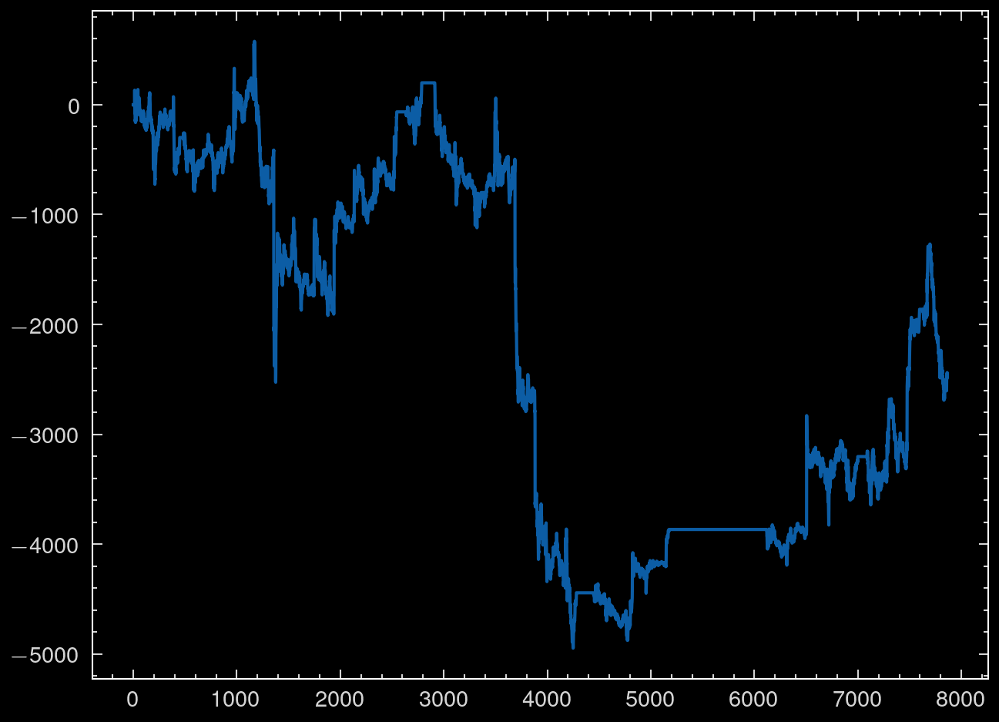

In [ ]:
plt.plot(all_net)

In [ ]:
np.mean(net_pairs), np.median(net_pairs), np.std(net_pairs), np.min(net_pairs), np.max(net_pairs)

(-2773.2908639241023,
 -2612.4700000000394,
 4150.676803833662,
 -19875.37000000005,
 13986.209999999921)

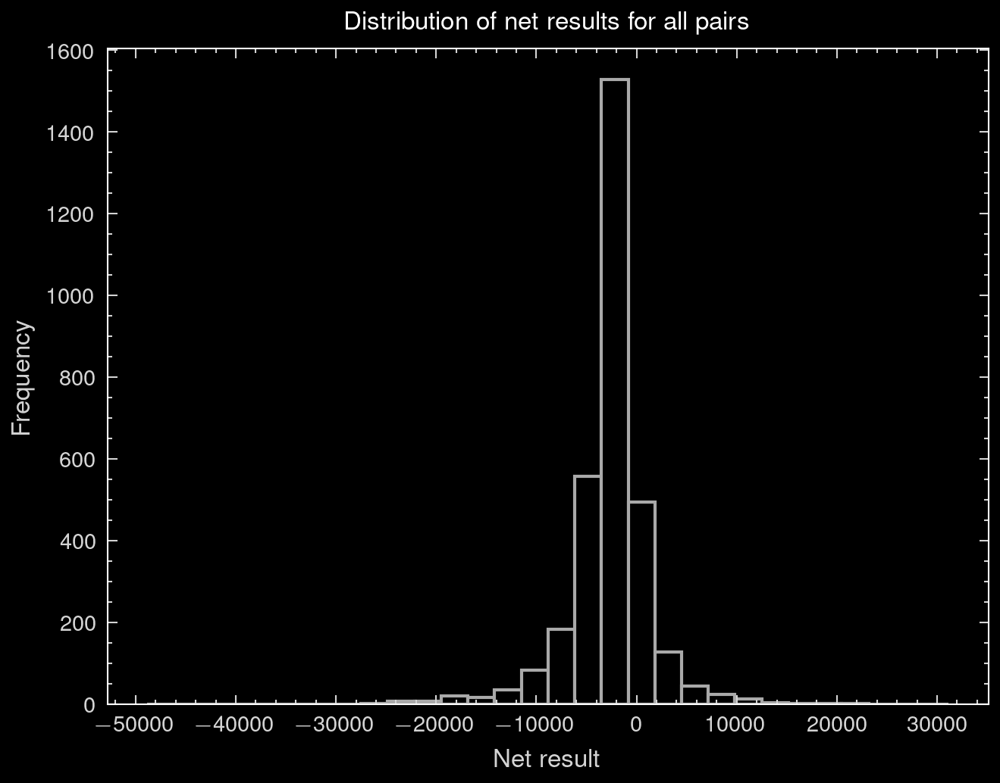

In [ ]:
plt.hist(metrics_df['Final_Balance'] - 50000, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Net result", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of net results for all pairs", fontsize = 8);

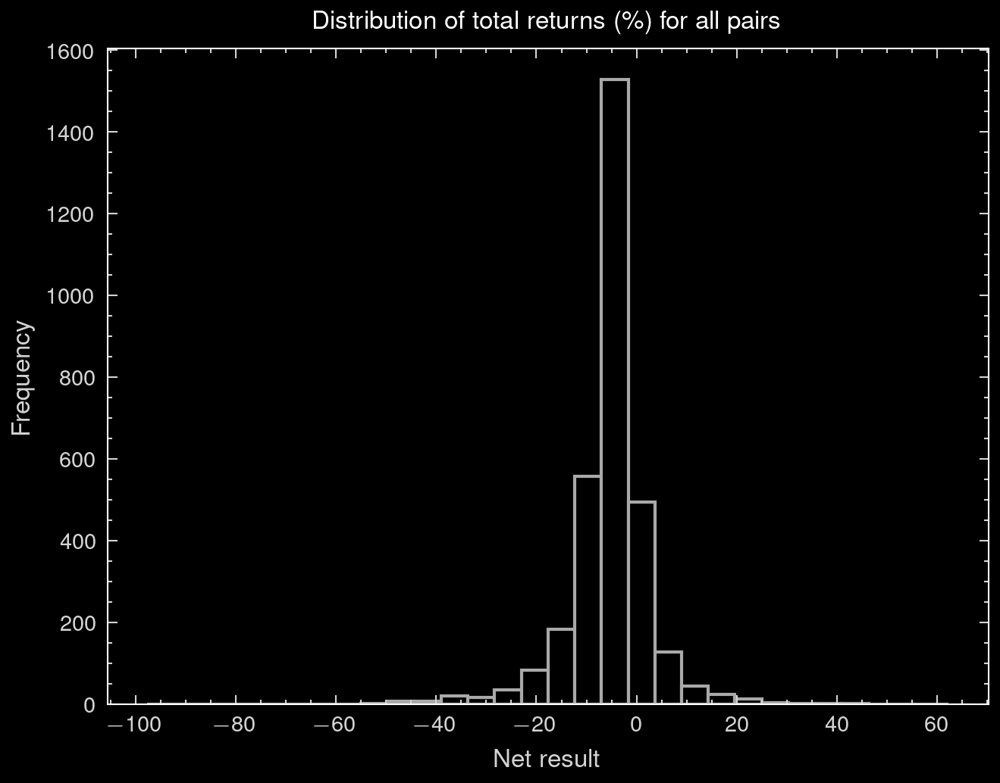

In [ ]:
plt.hist(metrics_df['Total_Return (%)'], bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Net result", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of total returns (\%) for all pairs", fontsize = 8);

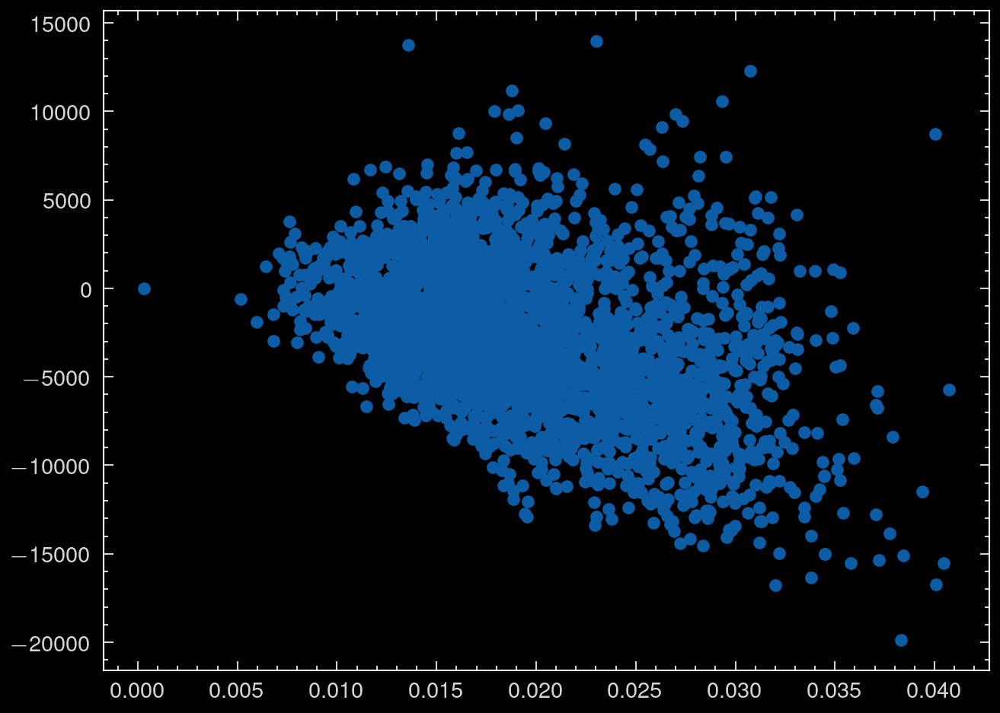

In [ ]:
plt.scatter(all_abs_change,net_pairs)

In [ ]:
np.corrcoef(all_abs_change,net_pairs)

array([[ 1.        , -0.41773231],
       [-0.41773231,  1.        ]])

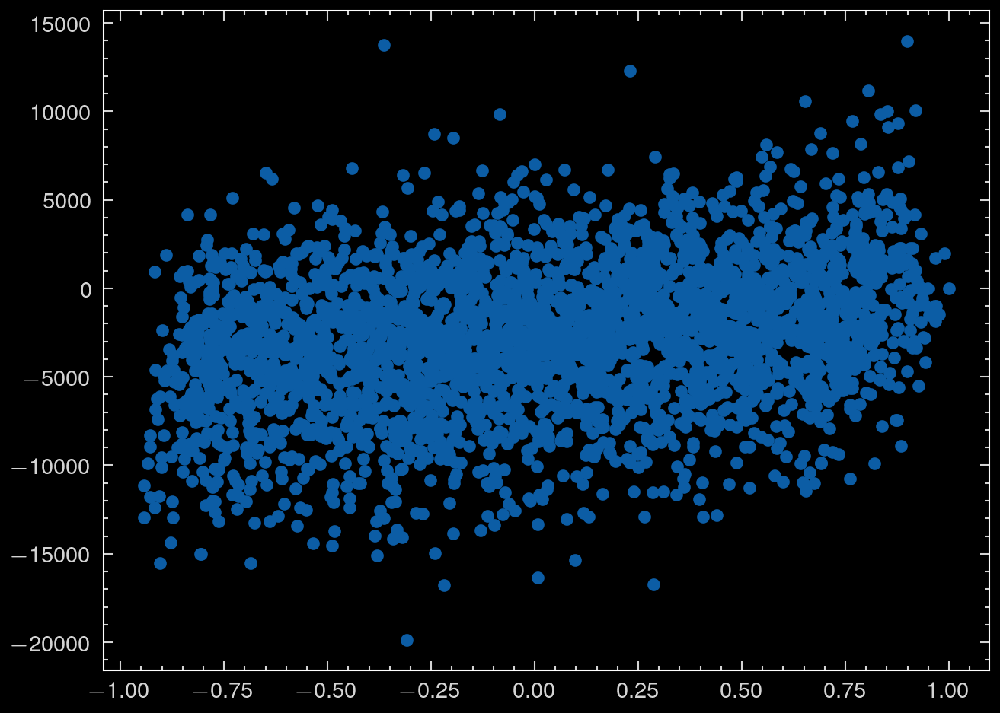

In [ ]:
plt.scatter(all_correlations,net_pairs)

In [ ]:
np.corrcoef(all_correlations,net_pairs)[0][1]

0.29091448137624343

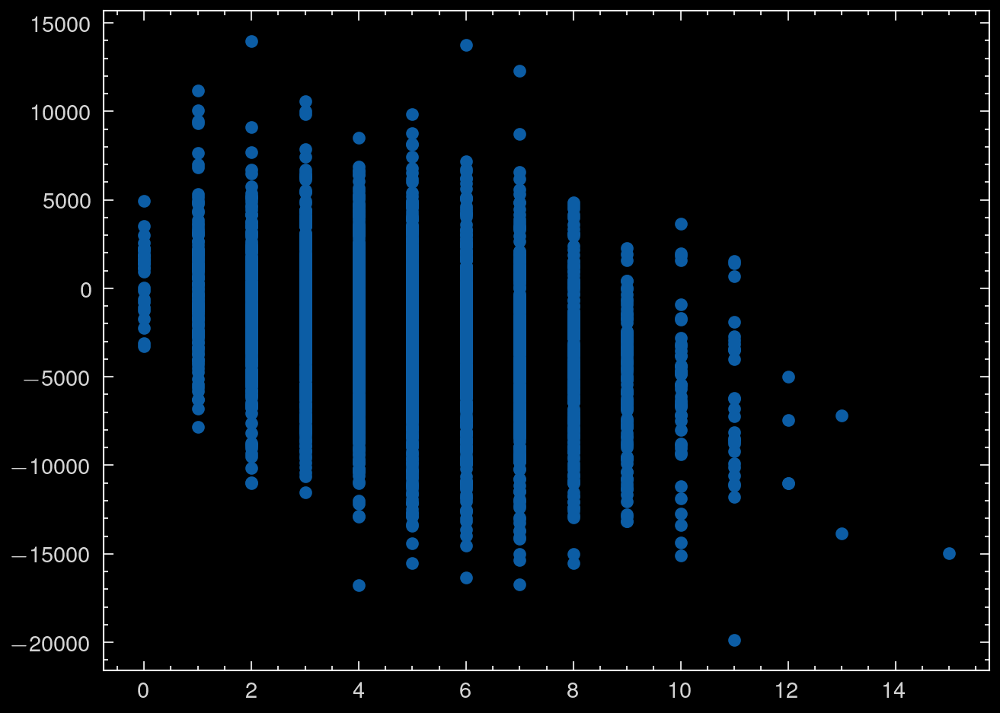

In [ ]:
plt.scatter(nb_days_no_return,net_pairs)

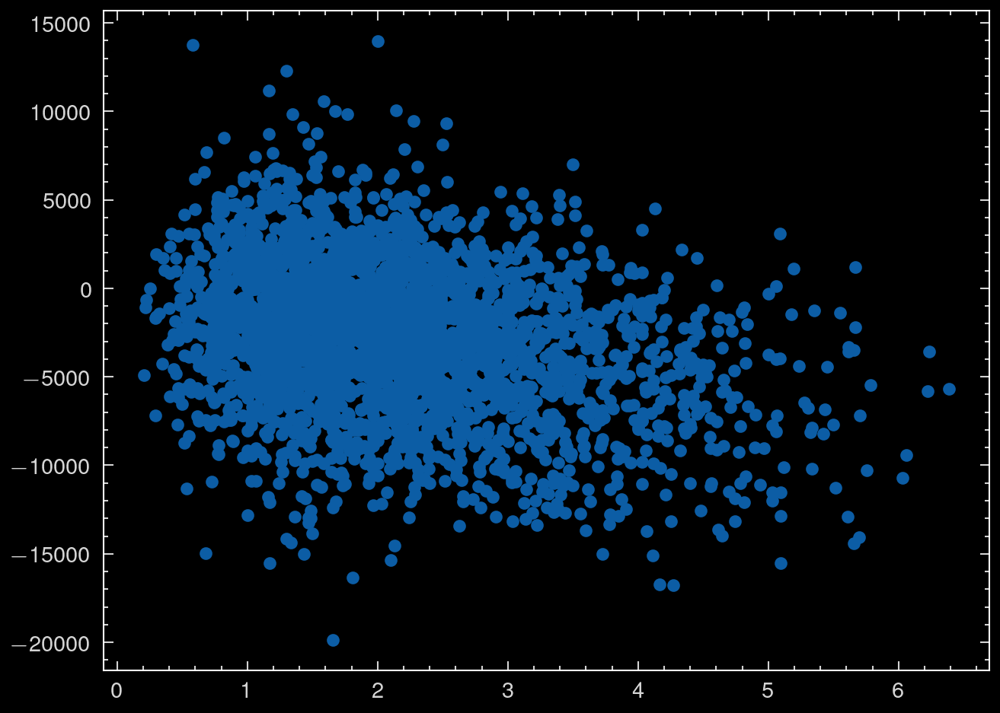

In [ ]:
plt.scatter(all_avg_return_times,net_pairs)

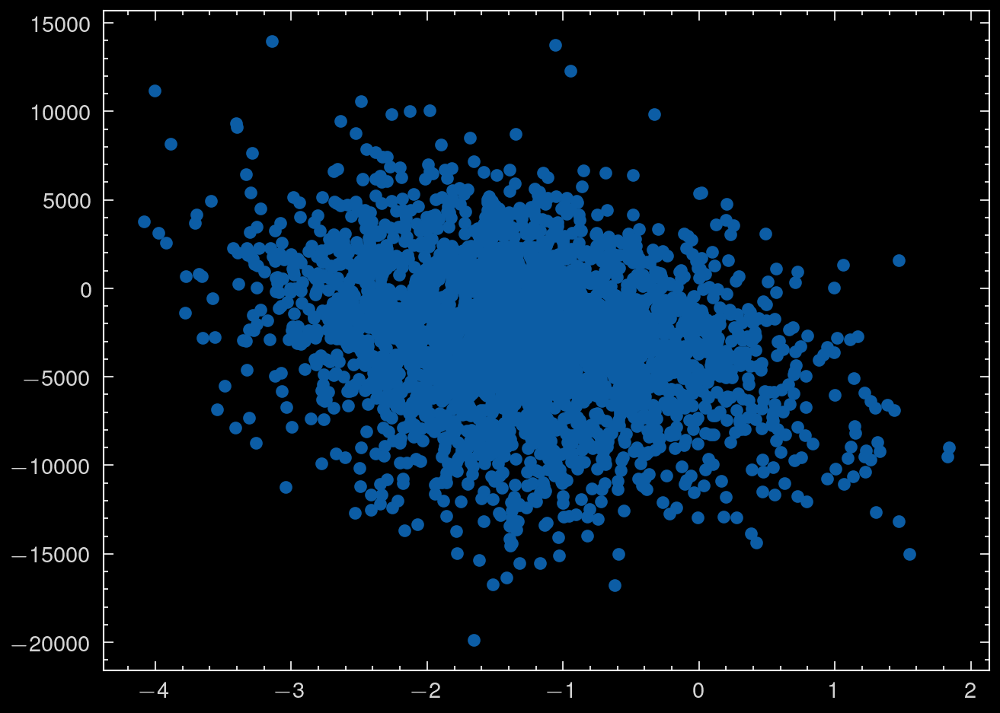

In [ ]:
plt.scatter(all_adf_stats,net_pairs)

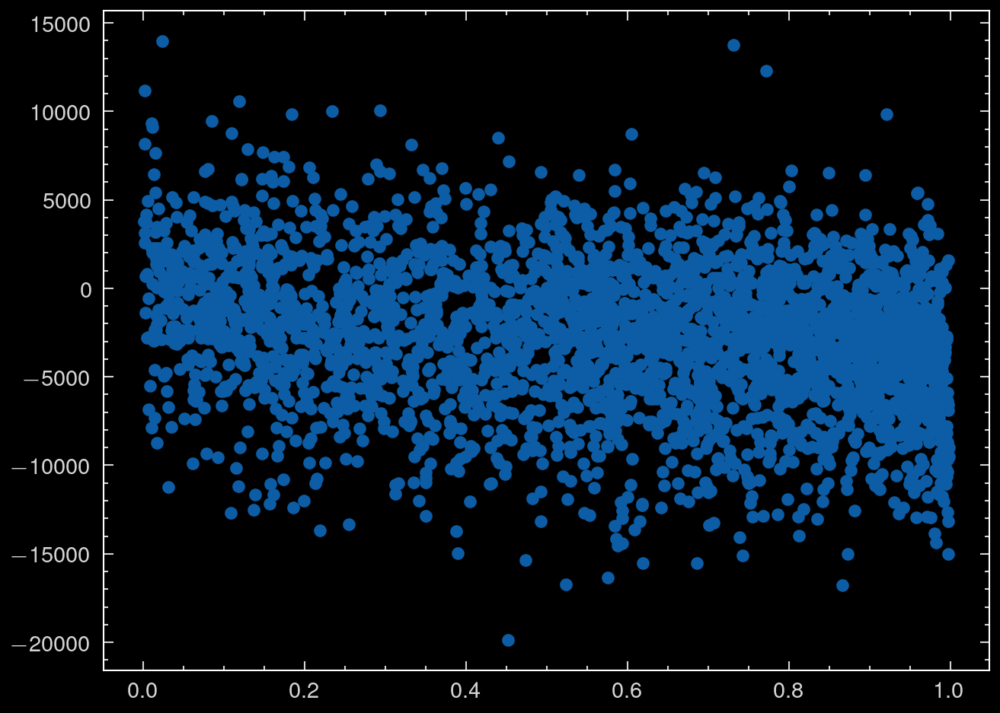

In [ ]:
plt.scatter(all_adf_pvals,net_pairs)

### Using the recent average slope to trade today

In this section, we use the average slope (hedge ratio) over the previous $t$ days (where $t$ is defined in the variable `lookback`) to trade today.

In [ ]:
net_pairs = []
my_pairs = pairs_SNP
#my_pairs = pairs_by_sector
all_min_net = []

# List to store performance metrics for each pair
metrics_list = []
lookback = 10
budget = 50000

for pair in my_pairs:

    last_portfolio = [0,0]
    last_prices_portfolio = [0,0]
    last_Rpnl = 0
    last_net = 0
    last_side = 0
    last_commissions = 0
    last_length_open = 0
    all_last_net = []
    all_net = [0]
    all_res = pd.DataFrame()
    net_worth = budget
    all_spreads = []
    all_rescaled_spreads = []
    all_nb_trades = []
    status_list = []



    prices1 = np.array(close_prices3[times_dt.normalize() == unique_days[0]][pair[0]])
    prices2 = np.array(close_prices3[times_dt.normalize() == unique_days[0]][pair[1]])

    last_hedge_ratio = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
    all_last_hedge_ratios = [last_hedge_ratio]
    
    mean_hedge_ratio = last_hedge_ratio


    i=0
    for day in unique_days[1:]:
        prices1 = np.array(close_prices3[times_dt.normalize() == day][pair[0]])
        prices2 = np.array(close_prices3[times_dt.normalize() == day][pair[1]])
        
        
        
        res_sim = trd.simulate_trading_rescaled_e_cst(price_list1=prices1,
        price_list2=prices2,
        error_rate=0.01,
        money_invested=net_worth,
        leave_profit=100000,
        leave_loss=-100000,
        startingStep=1,
        min_gain=400,
        c_edge=0.0,
        max_open=400,
        temp_loss=20,
        memory_es=30,
        ratio_open_close=1,
        hedge_ratio=[mean_hedge_ratio,0],
        init_portfolio=last_portfolio,
        prices_init_portfolio=last_prices_portfolio,
        init_Rpnl=last_Rpnl,
        init_net=last_net,
        init_side=last_side,
        init_commissions=last_commissions,
        init_length_open=last_length_open,
        max_trades=1)
        
        all_net += list(res_sim.res_df['CumulativePnL'])
        all_res = pd.concat([all_res, res_sim.res_df])
        all_spreads += res_sim.all_es
        all_rescaled_spreads += res_sim.rescaled_es
        all_nb_trades += [res_sim.nb_trades]
        status_list += res_sim.all_statuses
        
        last_portfolio = np.array(res_sim.res_df[['Shares1','Shares2']])[-1]
        if last_portfolio[0] != 0 and last_portfolio[1] != 0:
            last_prices_portfolio = np.array(res_sim.res_df[['EntryPrice1','EntryPrice2']])[-1]
        else:
            last_prices_portfolio = [0,0]
        
        last_Rpnl = np.array(res_sim.res_df['RealizedPnL'])[-1]
        last_net = np.array(res_sim.res_df['CumulativePnL'])[-1]
        net_worth = net_worth + last_net
        last_side = np.array(res_sim.res_df['Side'])[-1]
        last_length_open = res_sim.length_open
        last_commissions = res_sim.commissions

        last_hedge_ratio = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
        all_last_hedge_ratios += [last_hedge_ratio]
        if res_sim.res_df['PositionsStatus'].iloc[-1] != 'open':
            mean_hedge_ratio = np.mean(all_last_hedge_ratios[max(0, i - lookback + 1):i + 1])

        
        i += 1

    all_res['Spread'] = all_spreads
    all_res['Rescaled_Spread'] = all_rescaled_spreads
    metrics_pair = trd.compute_trading_metrics(all_res, initial_balance=budget)
    metrics_pair['Pair'] = pair  # Add pair identifier

    metrics_list.append(metrics_pair)

# Convert metrics list to a DataFrame
metrics_df = pd.DataFrame(metrics_list)

# Save results to CSV
metrics_df.to_csv("pair_trading_metrics.csv", index=False)

# Display the top performing pairs based on total return
top_pairs = metrics_df.sort_values(by="Total_Return (%)", ascending=False).head(10)
top_pairs


,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
1,50000,50821.70,1.64340,69.078947,-1.898173,5,0.167950,2,2,0,100.0,NaN,"[SPY, IWM]"
3,50000,50810.37,1.62074,37.124183,-1.146482,4,0.194447,2,2,0,100.0,NaN,"[SPY, IJH]"
8,50000,50809.83,1.61966,59.495352,-1.805447,5,0.167070,2,2,0,100.0,NaN,"[SPY, IJR]"
9,50000,50219.45,0.43890,32.752179,-0.536122,6,0.134636,0,0,0,0.0,NaN,"[SPY, VXUS]"
4,50000,50000.00,0.00000,0.000000,0.000000,0,NaN,0,0,0,0.0,NaN,"[SPY, RSP]"
5,50000,50000.00,0.00000,0.000000,0.000000,0,NaN,0,0,0,0.0,NaN,"[SPY, SCHX]"
7,50000,50000.00,0.00000,0.000000,0.000000,0,NaN,0,0,0,0.0,NaN,"[SPY, VOO]"
6,50000,49923.95,-0.15210,75.911458,-0.763556,3,-0.040812,1,0,1,0.0,0.0,"[SPY, SCHG]"
0,50000,49848.23,-0.30354,76.196636,-1.072158,4,-0.063640,1,0,1,0.0,0.0,"[SPY, QQQ]"
2,50000,49675.42,-0.64916,80.927835,-2.144537,6,-0.078345,1,0,1,0.0,0.0,"[SPY, SCHD]"


In [ ]:
metrics_df.sort_values(by="Sharpe Ratio", ascending=False).head(10)

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
132,50000,-6817.69,-113.63538,89.685871,-142.432525,10,0.097335,98,85,13,86.734694,0.073868,"[TSLA, CRWD]"
39,50000,64659.53,29.31906,94.772987,-15.363841,12,0.095441,150,143,7,95.333333,0.075006,"[NVDA, META]"
276,50000,58278.93,16.55786,96.667938,-13.445291,25,0.082459,116,109,7,93.965517,0.090965,"[AAPL, LUV]"
24,50000,59168.30,18.33660,97.163932,-8.086565,16,0.081506,146,136,10,93.150685,0.131977,"[NVDA, UBER]"
15,50000,65264.48,30.52896,97.939718,-18.676817,7,0.075191,122,115,7,94.262295,0.088111,"[NVDA, HPE]"
11,50000,53452.26,6.90452,93.831871,-12.198723,10,0.050687,140,132,8,94.285714,0.093284,"[NVDA, AVGO]"
46,50000,53723.63,7.44726,96.909576,-11.813333,5,0.048299,100,89,11,89.000000,0.165254,"[NVDA, GLW]"
143,50000,55291.61,10.58322,97.583619,-19.557028,28,0.045112,93,80,13,86.021505,0.231760,"[TSLA, EQT]"
93,50000,54763.17,9.52634,98.702785,-16.095944,6,0.042485,80,68,12,85.000000,0.231092,"[TSLA, HPE]"
242,50000,54075.53,8.15106,96.858705,-9.892458,7,0.042229,148,138,10,93.243243,0.106828,"[AAPL, AVGO]"


In [ ]:
len(metrics_df)

NameError: name 'metrics_df' is not defined

In [ ]:
pair

array(['AAPL', 'HPQ'], dtype='<U5')

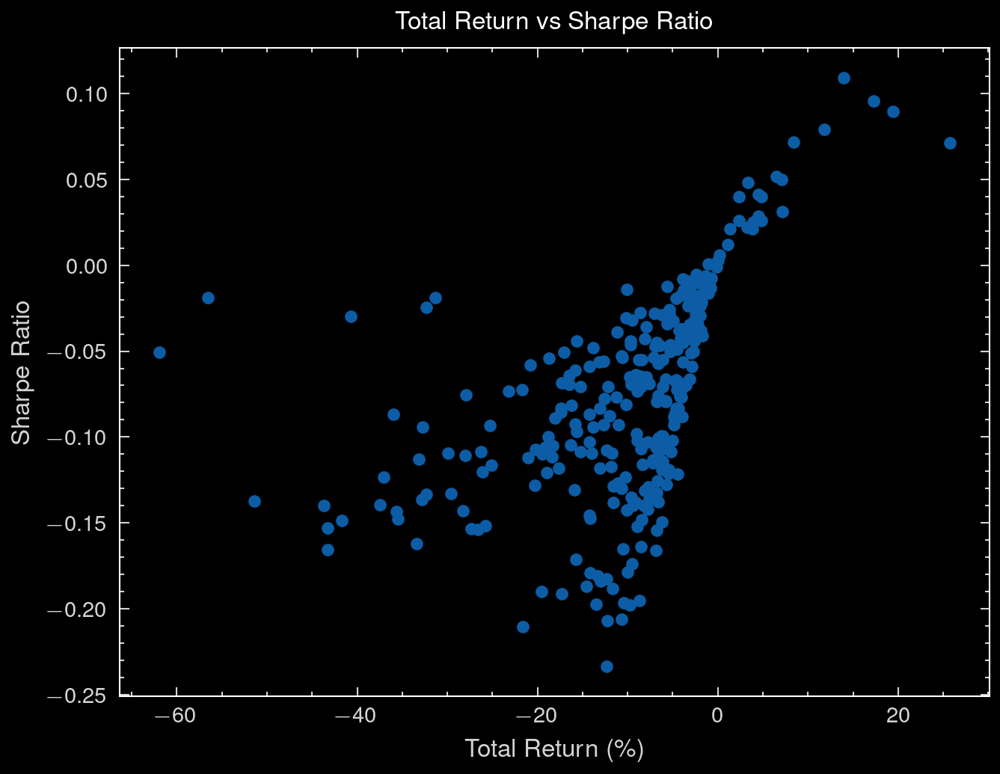

In [ ]:
plt.scatter(metrics_df['Total_Return (%)'], metrics_df['Sharpe Ratio'])
plt.xlabel('Total Return (\%)', fontsize=8)
plt.ylabel('Sharpe Ratio', fontsize=8)
plt.title('Total Return vs Sharpe Ratio', fontsize=8)
plt.show()

In [ ]:
res_df_actions = all_res[((all_res['ExecutedTrade1']!=0) | (all_res['ExecutedTrade2']!=0))]
res_df_actions[:30]

,Price1,Price2,PricePrev1,PricePrev2,ExpectedAction1,ExpectedAction2,Action1,Action2,ExpectedShares1,ExpectedShares2,Shares1,Shares2,DiffPrice1,DiffPrice2,CrossPrice,OpenClose,Side,LengthOpen,Net,Gross
2,193.73,35.62,193.75,35.60,129.0,-704.0,129.0,-704.0,129.0,-704.0,129.0,-704.0,0.00,0.00,False,opening,-1,400,-18.66,68.65
16,193.25,35.39,193.75,35.60,-129.0,704.0,-129.0,704.0,0.0,0.0,0.0,0.0,-69.66,119.68,True,closing,-1,387,62.68,66.68
17,193.18,35.43,193.20,35.41,129.0,-708.0,129.0,-708.0,129.0,-708.0,129.0,-708.0,-0.00,-0.00,False,opening,-1,400,43.94,214.16
73,193.91,35.42,193.20,35.41,-129.0,708.0,-129.0,708.0,0.0,0.0,0.0,0.0,86.43,-35.40,True,closing,-1,345,126.45,134.45
128,194.56,35.66,194.58,35.64,129.0,-704.0,129.0,-704.0,129.0,-704.0,129.0,-704.0,0.00,0.00,False,opening,-1,400,107.79,124.19
187,194.78,35.57,194.58,35.64,-129.0,704.0,-129.0,704.0,0.0,0.0,0.0,0.0,20.64,21.12,True,closing,-1,342,180.87,192.87
192,194.36,35.35,194.34,35.37,-129.0,708.0,-129.0,708.0,-129.0,708.0,-129.0,708.0,-0.00,-0.00,False,opening,1,400,162.13,220.77
8,195.13,35.62,194.34,35.37,129.0,-708.0,129.0,-708.0,0.0,0.0,0.0,0.0,-107.07,148.68,True,closing,1,392,235.22,251.22
9,195.65,35.58,195.63,35.37,-129.0,706.0,-129.0,0.0,-129.0,706.0,-129.0,0.0,0.00,0.00,False,opening,1,400,231.64,25487.49
10,195.75,35.52,195.63,35.37,129.0,0.0,129.0,0.0,0.0,0.0,0.0,0.0,-20.64,0.00,False,half,1,400,215.16,233.16


In [ ]:
metrics_df[-10:-1]

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
290,50000,46416.67,-7.16666,97.596337,-9.333059,4,-0.081799,52,38,14,73.076923,0.164974,"[AAPL, AES]"
291,50000,44643.36,-10.71328,98.003307,-14.242615,7,-0.116934,73,62,11,84.931507,0.106509,"[AAPL, UAL]"
292,50000,48155.82,-3.68836,95.904871,-10.114383,22,-0.021646,85,76,9,89.411765,0.087326,"[AAPL, NEM]"
293,50000,47130.76,-5.73848,97.583619,-9.409566,8,-0.085355,63,53,10,84.126984,0.101044,"[AAPL, TFC]"
294,50000,47561.15,-4.87770,96.515325,-9.819445,38,-0.062914,70,59,11,84.285714,0.104825,"[AAPL, MNST]"
295,50000,46933.34,-6.13332,94.734834,-8.782789,59,-0.105376,60,50,10,83.333333,0.097420,"[AAPL, KDP]"
296,50000,47223.87,-5.55226,97.329264,-10.786007,13,-0.064703,69,61,8,88.405797,0.081360,"[AAPL, EQT]"
297,50000,48047.78,-3.90444,87.701895,-6.723242,21,-0.060749,58,49,9,84.482759,0.125622,"[AAPL, OXY]"
298,50000,49525.84,-0.94832,97.520031,-6.422231,4,-0.010996,94,84,10,89.361702,0.114927,"[AAPL, JPM]"


<Axes: >

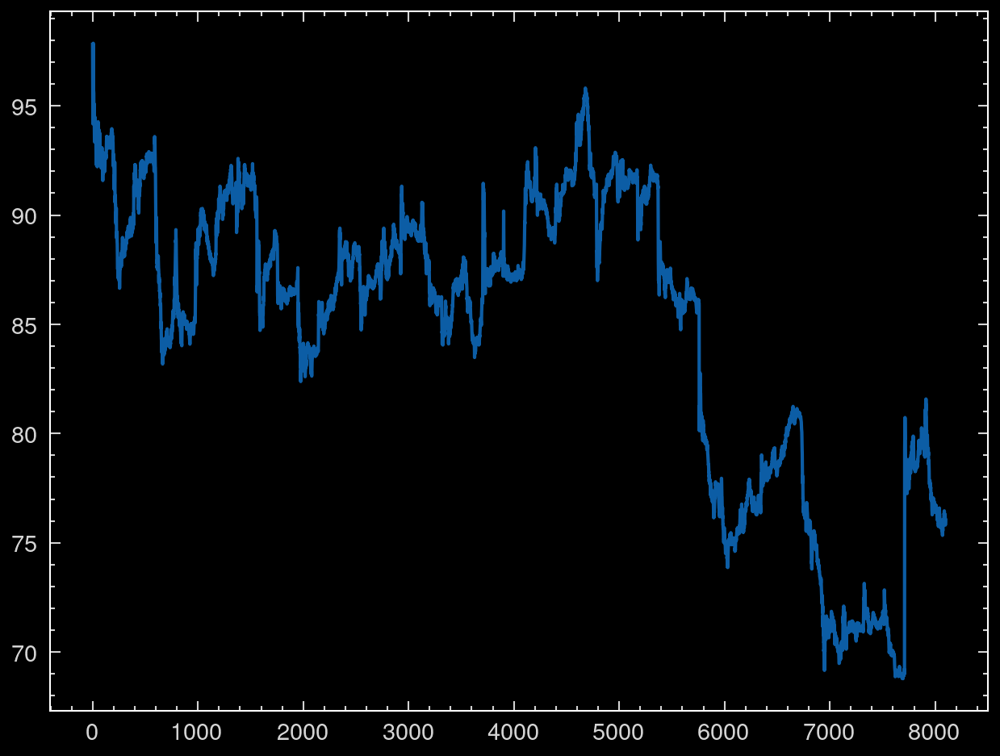

In [ ]:
close_prices3['VST'].plot()

<Axes: >

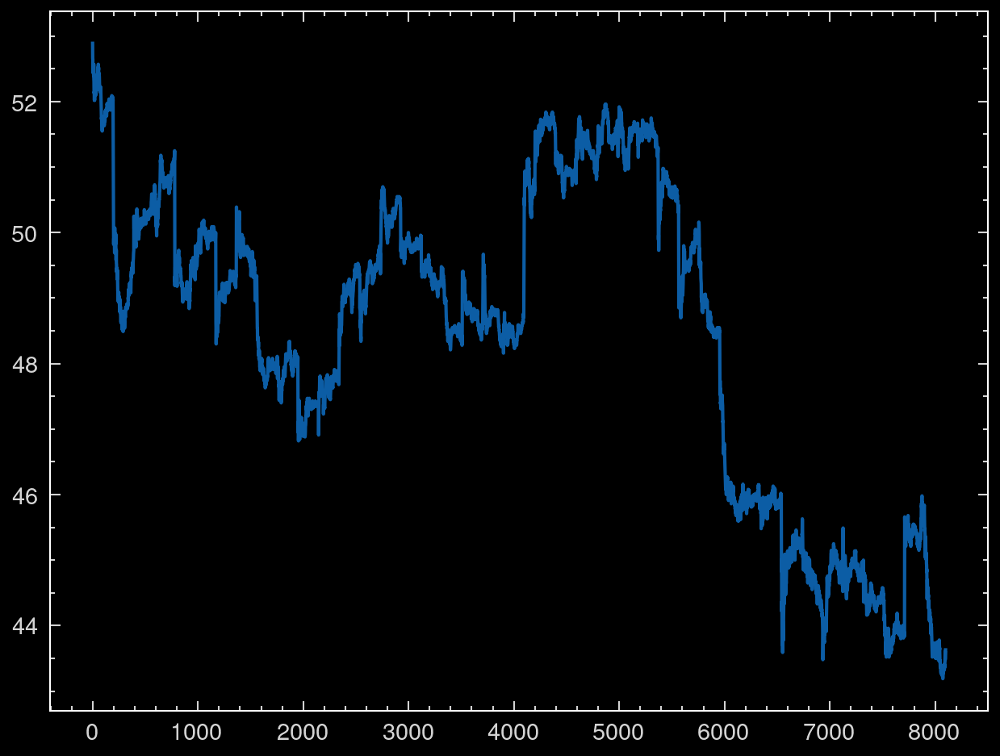

In [ ]:
close_prices3['FCX'].plot()

<Axes: >

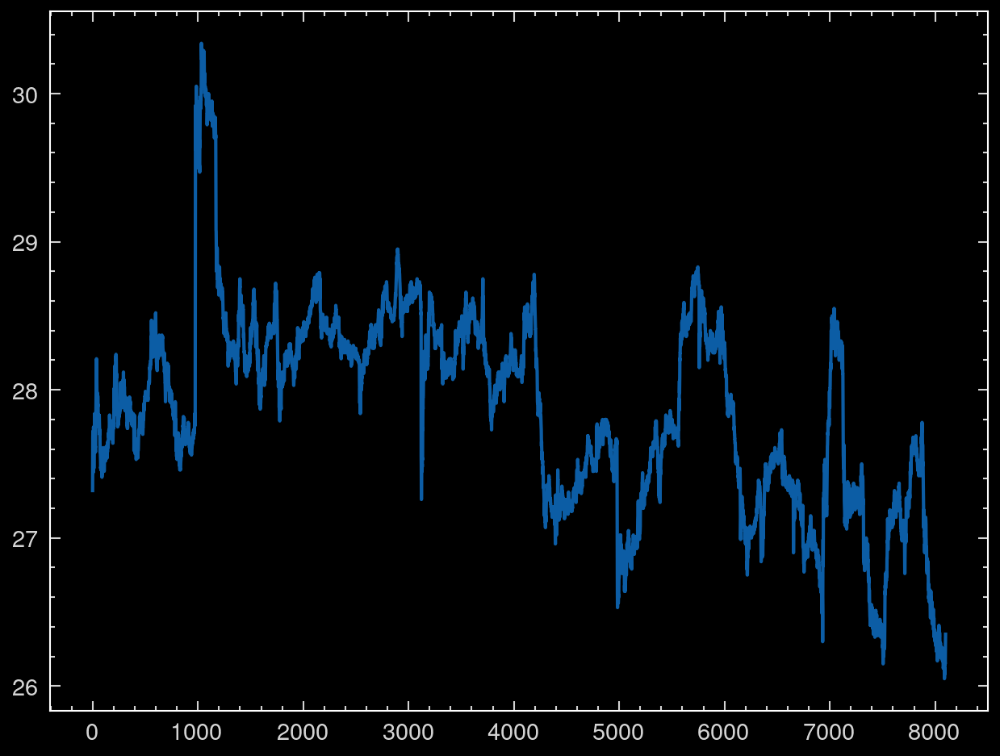

In [ ]:
close_prices3['LUV'].plot()

<Axes: >

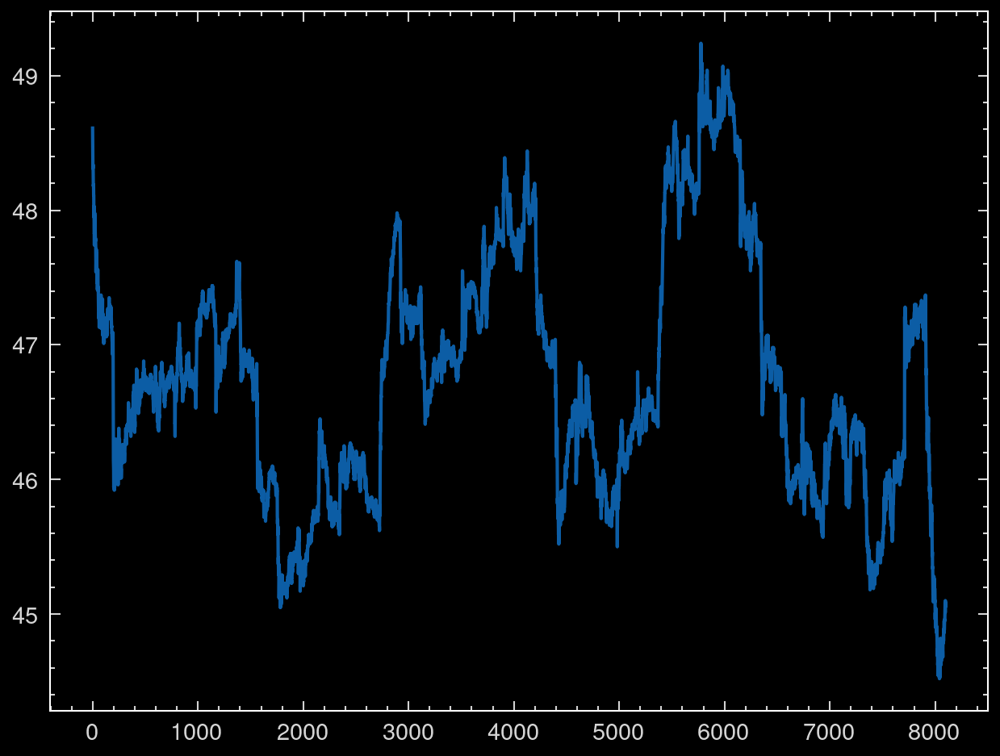

In [ ]:
close_prices3['DVN'].plot()

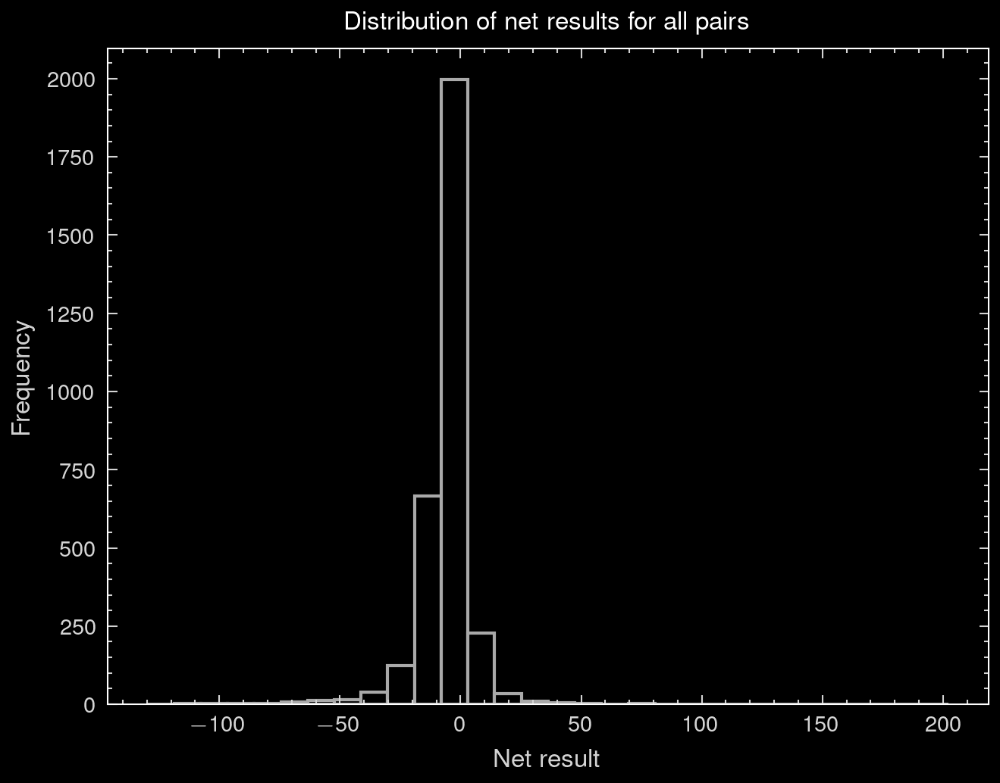

In [ ]:
plt.hist(metrics_df['Total_Return (%)'], bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Net result", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of net results for all pairs", fontsize = 8);

In [ ]:
metrics_df['Total_Return (%)'].mean()

-5.944716272152038

In [ ]:
np.mean(net_pairs), np.median(net_pairs), np.std(net_pairs), np.min(net_pairs), np.max(net_pairs)

(-2457.742667721574,
 -2396.3600000001547,
 4351.204068970471,
 -17407.96999999992,
 21294.039999999928)

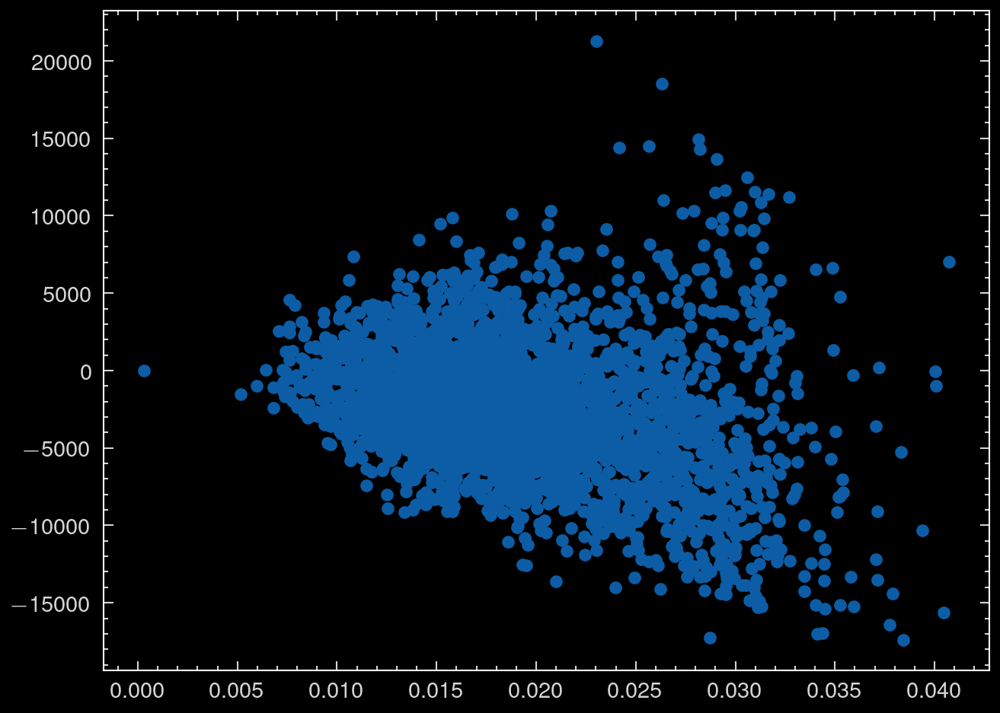

In [ ]:
plt.scatter(all_abs_change,net_pairs)

In [ ]:
np.corrcoef(all_abs_change,net_pairs)[0][1]

-0.29769784927637066

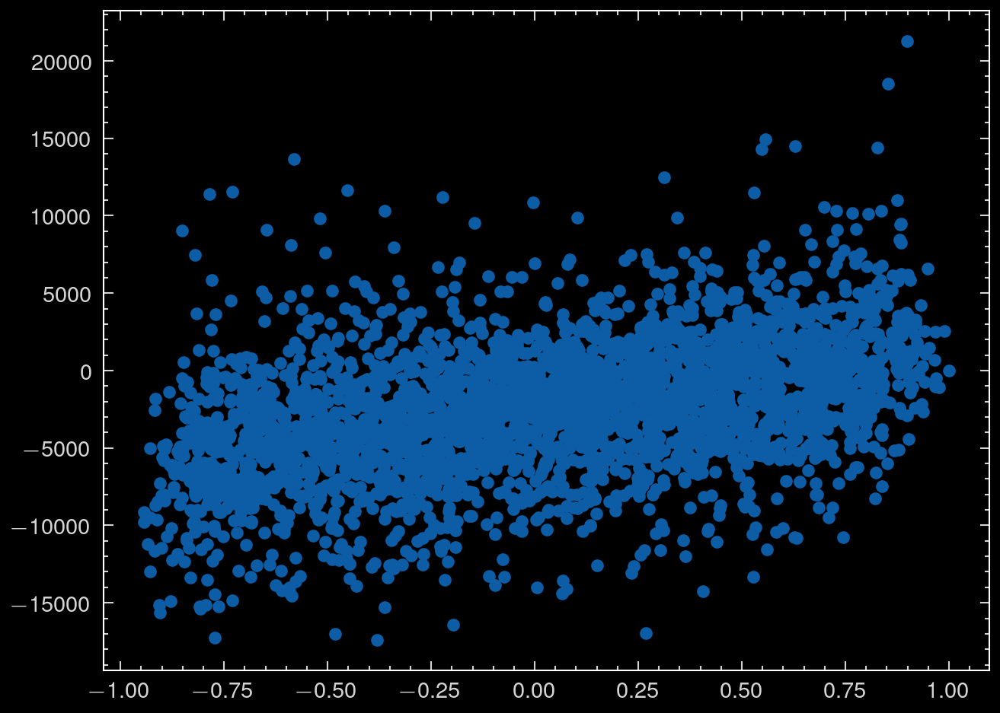

In [ ]:
plt.scatter(all_correlations,net_pairs)

In [ ]:
np.corrcoef(all_correlations,net_pairs)[0][1]

0.42882095343450805

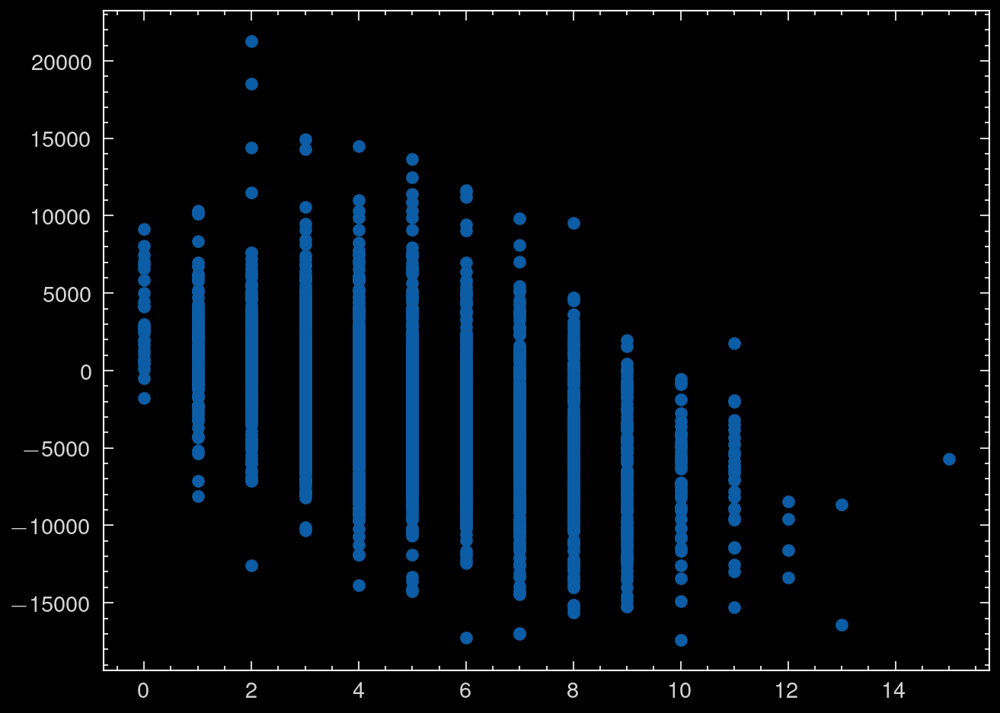

In [ ]:
plt.scatter(nb_days_no_return,net_pairs)

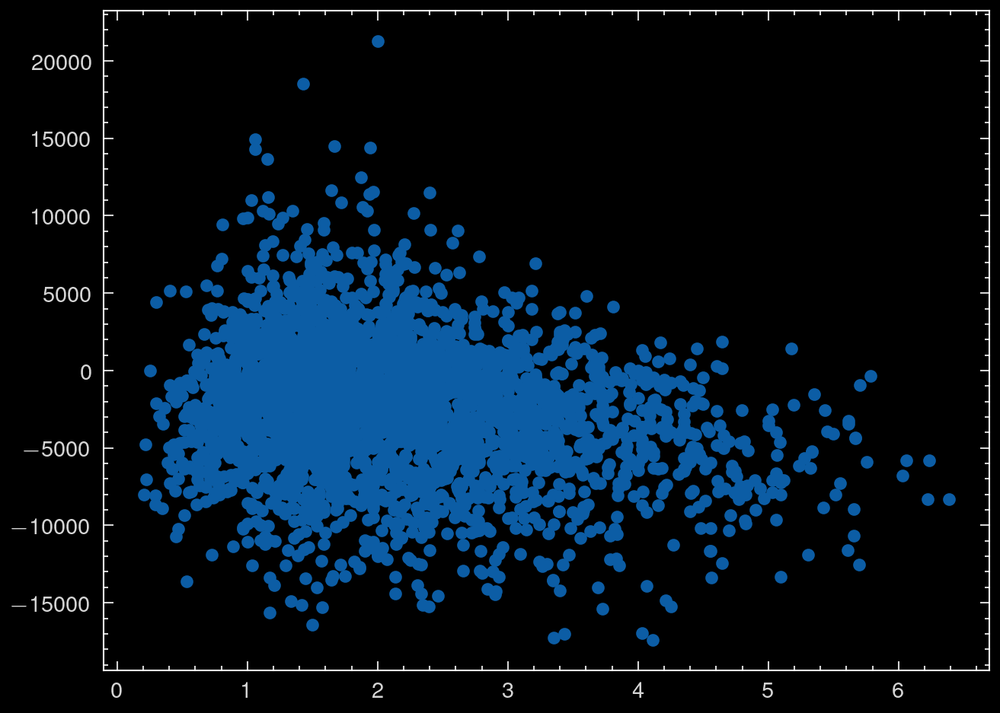

In [ ]:
plt.scatter(all_avg_return_times,net_pairs)

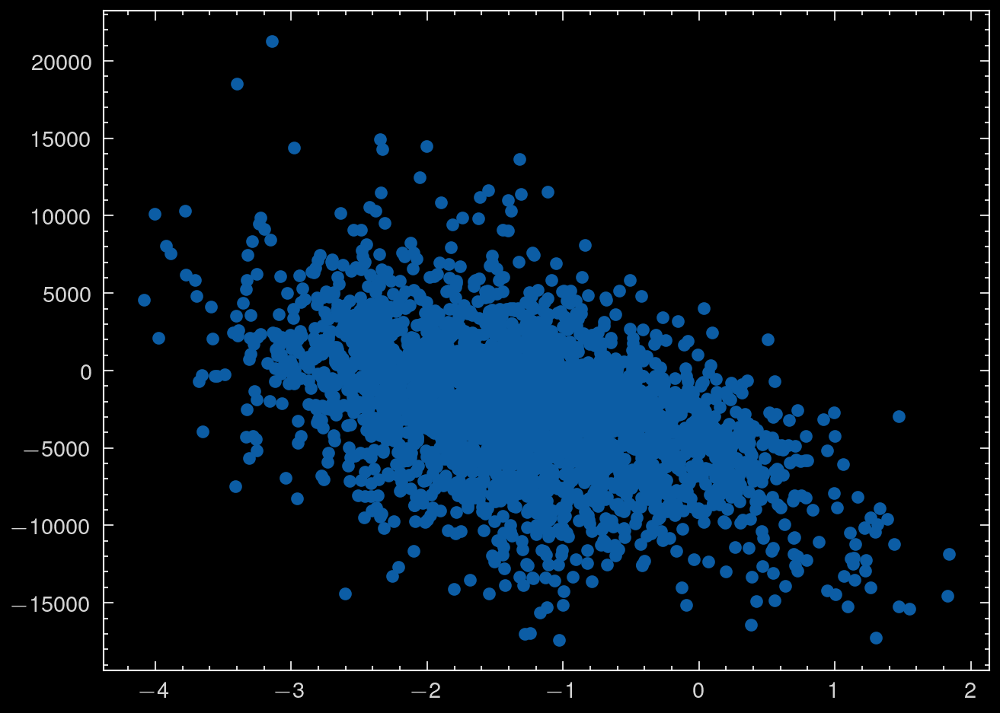

In [ ]:
plt.scatter(all_adf_stats,net_pairs)

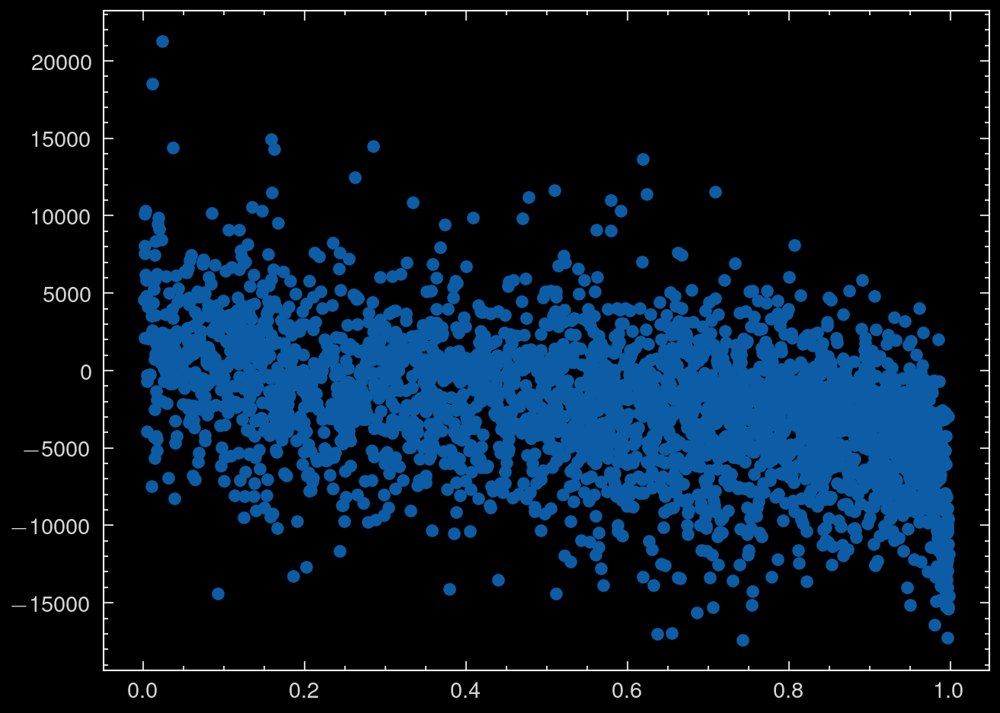

In [ ]:
plt.scatter(all_adf_pvals,net_pairs)

In [ ]:
# Parameters
lookback = 10
budget = 50000
threshold_gain = 10

# Define the simulated unique days (assuming each simulation is day_length days long)
num_days_simulated = 2  # Adjust this if needed
unique_days_simulated = np.arange(num_days_simulated)

# pair_index = 201
# pair_prices = simulated_paired_prices[pair_index]
pair_prices = simulated_pair
day_length = int(len(pair_prices[0])/num_days_simulated)


last_portfolio = [0, 0]
last_prices_portfolio = [0, 0]
last_Rpnl = 0
last_net = 0
last_side = 0
last_commissions = 0
last_length_open = 0
all_last_net = []
all_net = [0]
all_res = pd.DataFrame()
net_worth = budget
all_spreads = []
all_rescaled_spreads = []
all_nb_trades = []
status_list = []

# First day's prices
prices1 = pair_prices[0][:day_length]  # First day_length points = first day's prices
prices2 = pair_prices[1][:day_length]

last_hedge_ratio = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
all_last_hedge_ratios = [last_hedge_ratio]

mean_hedge_ratio = last_hedge_ratio

i = 0
for day_idx in unique_days_simulated[1:]:
    # Get the prices for the current day (assuming day_length prices per day)
    start_idx = day_idx * day_length
    end_idx = (day_idx + 1) * day_length
    prices1 = pair_prices[0][start_idx:end_idx]
    prices2 = pair_prices[1][start_idx:end_idx]

    if len(prices1) == 0 or len(prices2) == 0:
        continue  # Skip if there's missing data
    

    # Simulate trading
    res_sim = trd.simulate_trading_rescaled_e_cst(
        price_list1=prices1,
        price_list2=prices2,
        error_rate=0.01,
        money_invested=net_worth,
        leave_profit=1000000,
        leave_loss=-1000000,
        startingStep=1,
        min_gain=threshold_gain,
        c_edge=0.0,
        max_open=400,
        temp_loss=20,
        memory_es=30,
        ratio_open_close=1,
        hedge_ratio=[mean_hedge_ratio, 0],
        init_portfolio=last_portfolio,
        prices_init_portfolio=last_prices_portfolio,
        init_Rpnl=last_Rpnl,
        init_net=last_net,
        init_side=last_side,
        init_commissions=last_commissions,
        init_length_open=last_length_open,
        max_trades=100
    )

    all_net += list(res_sim.res_df['CumulativePnL'])
    all_res = pd.concat([all_res, res_sim.res_df])
    all_spreads += res_sim.all_es
    all_rescaled_spreads += res_sim.rescaled_es
    all_nb_trades += [res_sim.nb_trades]
    status_list += res_sim.all_statuses

    last_portfolio = np.array(res_sim.res_df[['Shares1', 'Shares2']])[-1]
    if last_portfolio[0] != 0 and last_portfolio[1] != 0:
        last_prices_portfolio = np.array(res_sim.res_df[['EntryPrice1', 'EntryPrice2']])[-1]
    else:
        last_prices_portfolio = [0, 0]

    last_Rpnl = np.array(res_sim.res_df['RealizedPnL'])[-1]
    last_net = np.array(res_sim.res_df['CumulativePnL'])[-1]
    net_worth = net_worth + last_net
    last_side = np.array(res_sim.res_df['Side'])[-1]
    last_length_open = res_sim.length_open
    last_commissions = res_sim.commissions

    last_hedge_ratio = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
    all_last_hedge_ratios += [last_hedge_ratio]
    if res_sim.res_df['PositionsStatus'].iloc[-1] != 'open':
        mean_hedge_ratio = np.mean(all_last_hedge_ratios[max(0, i - lookback + 1):i + 1])

    
    i += 1

all_res['Spread'] = all_spreads
all_res['Rescaled_Spread'] = all_rescaled_spreads
metrics_pair = trd.compute_trading_metrics(all_res, initial_balance=budget)


### Using today's hedge ratio to trade today: Introducing a look-ahead bias on purpose

In [ ]:
net_pairs = []
my_pairs = pairs_SNP
#my_pairs = pairs_by_sector
all_min_net = []

# List to store performance metrics for each pair
metrics_list = []
lookback = 10
budget = 50000

for pair in my_pairs:

    last_portfolio = [0,0]
    last_prices_portfolio = [0,0]
    last_Rpnl = 0
    last_net = 0
    last_side = 0
    last_commissions = 0
    last_length_open = 0
    all_last_net = []
    all_net = [0]
    all_res = pd.DataFrame()
    net_worth = budget


    prices1 = np.array(close_prices3[times_dt.dt.normalize() == unique_days[0]][pair[0]])
    prices2 = np.array(close_prices3[times_dt.dt.normalize() == unique_days[0]][pair[1]])

    last_hedge_ratio = trd.orthogonal_regression(prices_1 = prices1, prices_2 = prices2)
    
    i=0
    for day in unique_days[1:]:
        prices1 = np.array(close_prices3[times_dt.dt.normalize() == day][pair[0]])
        prices2 = np.array(close_prices3[times_dt.dt.normalize() == day][pair[1]])
        
        current_hedge_ratio = trd.ols_regression(prices_1 = prices1, prices_2 = prices2)[0]
                
        
        # Simulate trading
        res_sim = trd.simulate_trading_rescaled_e_cst(
            price_list1=prices1,
            price_list2=prices2,
            error_rate=0.01,
            money_invested=net_worth,
            leave_profit=1000000,
            leave_loss=-1000000,
            startingStep=1,
            min_gain=threshold_gain,
            c_edge=0.0,
            max_open=400,
            temp_loss=20,
            memory_es=30,
            ratio_open_close=1,
            hedge_ratio=[current_hedge_ratio, 0],
            init_portfolio=last_portfolio,
            prices_init_portfolio=last_prices_portfolio,
            init_Rpnl=last_Rpnl,
            init_net=last_net,
            init_side=last_side,
            init_commissions=last_commissions,
            init_length_open=last_length_open,
            max_trades=100
        )
            
        all_net += list(res_sim.res_df['CumulativePnL'])
        all_res = pd.concat([all_res, res_sim.res_df])
        
        last_portfolio = np.array(res_sim.res_df[['Shares1','Shares2']])[-1]
        if last_portfolio[0] != 0 and last_portfolio[1] != 0:
            last_prices_portfolio = np.array(res_sim.res_df[['EntryPrice1','EntryPrice2']])[-1]
        else:
            last_prices_portfolio = [0,0]
        
        last_Rpnl = np.array(res_sim.res_df['RealizedPnL'])[-1]
        last_net = np.array(res_sim.res_df['CumulativePnL'])[-1]
        net_worth = net_worth + last_net
        last_side = np.array(res_sim.res_df['Side'])[-1]
        last_length_open = res_sim.length_open
        last_commissions = res_sim.commissions
        
        i+=1        
    # Compute metrics for the current pair and store results
    metrics = trd.compute_trading_metrics(all_res, initial_balance=budget)
    metrics['Pair'] = pair  # Add pair identifier

    metrics_list.append(metrics)

# Convert metrics list to a DataFrame
metrics_df = pd.DataFrame(metrics_list)

# Save results to CSV
metrics_df.to_csv("pair_trading_metrics.csv", index=False)

# Display the top performing pairs based on total return
top_pairs = metrics_df.sort_values(by="Total_Return (%)", ascending=False).head(10)
top_pairs


,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
2973,50000,1914932.40,3729.86480,88.003210,-72.731595,4,0.120654,811,803,8,99.013564,0.080424,"[AES, MNST]"
837,50000,1064462.99,2028.92598,91.043025,-86.203299,4,0.124452,623,615,8,98.715891,0.048246,"[WBD, PYPL]"
595,50000,1045308.61,1990.61722,89.506494,-96.577379,4,0.088727,755,747,8,98.940397,0.060441,"[T, VST]"
2371,50000,1042236.90,1984.47380,89.816782,-42.059526,4,0.236014,715,703,12,98.321678,0.123687,"[FCX, VST]"
1260,50000,932757.40,1765.51480,90.932214,-24.038425,4,0.270798,681,673,8,98.825257,1.218754,"[GOOGL, VST]"
2116,50000,892675.35,1685.35070,90.614269,-23.382326,4,0.276144,698,688,10,98.567335,0.997529,"[GOOG, VST]"
1876,50000,872212.02,1644.42404,90.029251,-21.554753,4,0.300777,740,730,10,98.648649,0.289254,"[DELL, VST]"
3106,50000,838583.65,1577.16730,90.181864,-83.802474,4,0.133133,723,718,5,99.308437,0.048611,"[HPQ, VST]"
873,50000,827035.83,1554.07166,90.461656,-242.336035,4,-0.010920,718,709,9,98.746518,0.043484,"[WBD, VST]"
2070,50000,812341.71,1524.68342,89.749459,-49.855032,4,0.210429,755,743,12,98.410596,0.147989,"[MSFT, VST]"


In [ ]:
metrics_df['Total_Return (%)'].mean(), metrics_df['Total_Return (%)'].std(), metrics_df['Total_Return (%)'].median(), metrics_df['Total_Return (%)'].min(), metrics_df['Total_Return (%)'].max()

(120.33200620253155,
 198.0288374433259,
 64.53831999999989,
 -92.75410000000075,
 3729.8647999999985)

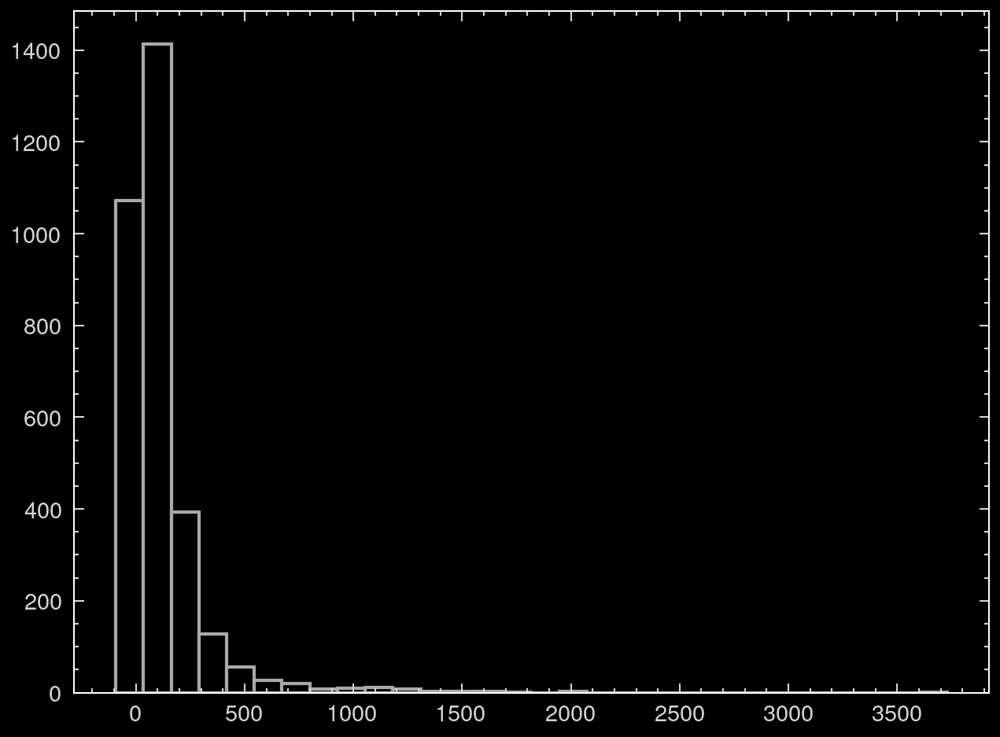

In [ ]:
plt.hist(metrics_df['Total_Return (%)'], bins = 30, edgecolor = 'darkgray', color = 'black');

## ETFs

### Downloading data

In [4]:
notebook_dir = os.path.dirname(os.path.abspath("__file__"))
# Construct the relative path to the file
file_path = os.path.join(notebook_dir, "ETFlistFull.csv")

# Get S&P 500 tickers from Wikipedia
# sp500_url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"
# sp500_df = pd.read_html(sp500_url)[0]  # First table on the page
# tickers = sp500_df["Symbol"].tolist()

# Load the CSV
ETFmembers = pd.read_csv(file_path, sep=';')
ETFmembers


,ETF Name,Ticker,Category
0,iShares Core S&P Total US Stock Mkt,ITOT,Broad market ETFs
1,iShares MSCI ACWI Index,ACWI,Broad market ETFs
2,iShares Russell 3000 Index,IWV,Broad market ETFs
3,Schwab US Broad Market ETF,SCHB,Broad market ETFs
4,Schwab Fundamental U.S. Broad Market Index ETF,FNDB,Broad market ETFs
...,...,...,...
405,WisdomTree Dreyfus Emerging Currency,CEW,Active ETFs
406,WisdomTree Dreyfus Chinese Yuan,CYB,Active ETFs
407,WisdomTree Emerging Markets Local Debts Fund,ELD,Active ETFs
408,WisdomTree Emerging Markets Corporate Bond Fund,EMCB,Active ETFs


In [5]:
# make the data types of the columns of ETFmembers strings
ETFmembers = ETFmembers.astype(str)

In [42]:
np.array(pairs_ETF)[max_coint[1]]

array([['SLV', 'KRE'],
       ['SCHD', 'SLV'],
       ['SLV', 'SCHH'],
       ['SCHD', 'GDX'],
       ['XLF', 'SLV'],
       ['FXI', 'IWM'],
       ['FXI', 'KRE'],
       ['SLV', 'XLB'],
       ['GDX', 'XLB'],
       ['EEM', 'KRE'],
       ['SLV', 'XLI'],
       ['SCHH', 'IAU'],
       ['EWZ', 'KRE'],
       ['IWM', 'SLV'],
       ['EFA', 'KRE'],
       ['KRE', 'VWO'],
       ['KRE', 'XLU'],
       ['FXI', 'XLI'],
       ['KRE', 'SCHF'],
       ['XLU', 'SCHH']], dtype='<U4')

In [43]:
ETFmembers[ETFmembers['Ticker']=='SCHD']

,ETF Name,Ticker,Category
32,Schwab US Dividend Equity ETF,SCHD,Style ETFs


In [6]:
all_dfs = []
all_vols = {}  # Initialize as a dictionary
close_prices = pd.DataFrame()
start_date = "20250208 "
end_date = "20250325 "

start_hour = '15:30:00'
end_hour = '22:00:00'

start_time = dt.datetime.strptime(start_date + start_hour, '%Y%m%d %H:%M:%S') #Use end_hour or start_hour?
end_time = dt.datetime.strptime(end_date + end_hour, '%Y%m%d %H:%M:%S')

duration = end_time - start_time
#duration_string = f"{duration.days} D"
duration_string = "3 D"


# Define duration and bar size for historical data requests
barSize = "1 min"

# Loop through each S&P 500 symbol and download data using `download_ibkr_data`
for stock in ETFmembers['Ticker']:
    try:
        # Download data using `download_ibkr_data`
        current_prices = trd.download_ibkr_data(
            symbol=stock,
            end_date=end_time,
            duration=duration_string,
            barSize=barSize
        )
        
        # Add the 'Close' column to the `close_prices` DataFrame
        #close_prices[stock] = current_prices.set_index("Date")["Close"]
        
        # Add the full DataFrame to `all_dfs` for individual tracking
        all_dfs.append(current_prices.set_index("Date")[["Close"]].rename(columns={"Close": stock}))
        
        average_volume = current_prices["Volume"].mean()
        all_vols[stock] = average_volume
        
        
    except Exception as e:
        print(f"Failed to download data for {stock}: {e}")

# Final `close_prices` contains all the close prices for S&P 500 symbols
print("Data download completed.")

Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection su

Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='DTN', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='DTN', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='DTN', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='EEB', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='EEB', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='EEB', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='AND', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='AND', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='AND', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='GXF', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='GXF', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='GXF', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='RSX', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='RSX', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='RSX', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection su

Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IPD', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IPD', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IPD', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IPS', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IPS', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IPS', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IPF', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IPF', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IPF', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IRY', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IRY', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IRY', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IPN', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IPN', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IPN', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IRV', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IRV', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IRV', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IPK', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IPK', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IPK', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IST', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IST', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IST', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IPU', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IPU', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IPU', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='HYLD', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='HYLD', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='HYLD', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='CSJ', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='CSJ', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='CSJ', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='CIU', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='CIU', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='CIU', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='SCPB', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='SCPB', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='SCPB', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='RJI', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='RJI', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='RJI', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='RJA', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='RJA', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='RJA', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='JJA', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='JJA', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='JJA', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='RJN', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='RJN', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='RJN', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='OIL', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='OIL', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='OIL', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='GAZ', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='GAZ', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='GAZ', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='RJZ', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='RJZ', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='RJZ', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='JJM', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='JJM', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='JJM', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='JJC', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='JJC', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='JJC', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IFAS', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IFAS', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IFAS', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IFEU', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IFEU', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IFEU', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='WREI', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='WREI', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='WREI', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='FBGX', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='FBGX', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='FBGX', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='FLGE', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='FLGE', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='FLGE', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='BGU', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='BGU', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='BGU', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='BGZ', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='BGZ', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='BGZ', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='ONEF', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='ONEF', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='ONEF', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='GTAA', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='GTAA', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='GTAA', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='HOLD', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='HOLD', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='HOLD', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='MINC', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='MINC', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='MINC', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='GMMB', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='GMMB', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='GMMB', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='GMTB', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='GMTB', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='GMTB', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='GVT', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='GVT', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='GVT', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='RPX', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='RPX', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='RPX', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='RWG', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='RWG', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='RWG', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='FTLB', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='FTLB', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='FTLB', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IEIL', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IEIL', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IEIL', exchange='SMART', currency='USD')
Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='IEIS', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='IEIS', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='IEIS', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='KGHG', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='KGHG', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='KGHG', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='CHNA', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='CHNA', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='CHNA', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded
Connection succeeded


Error 200, reqId 3: No security definition has been found for the request, contract: Stock(symbol='CYB', exchange='SMART', currency='USD')
Unknown contract: Stock(symbol='CYB', exchange='SMART', currency='USD')


Connection succeeded


Error 200, reqId 4: No security definition has been found for the request, contract: Stock(symbol='CYB', exchange='SMART', currency='USD')


Connection succeeded
Connection succeeded
Connection succeeded
Data download completed.


In [7]:
# Combine all DataFrames in `all_dfs` into a single DataFrame
close_prices = pd.concat(all_dfs, axis=1)
close_prices

,ITOT,ACWI,IWV,SCHB,FNDB,VT,VTI,VXUS,VTHR,DIA,...,GAL,INKM,RLY,SRLN,ULST,CEW,CYB,ELD,EMCB,USDU
Date,,,,,,,,,,,,,,,,,,,,,
2025-03-21 14:30:00+01:00,122.38,117.36,318.56,21.65,23.08,117.00,276.61,63.36,247.72,416.12,...,45.48,NaN,28.35,41.14,40.56,NaN,NaN,NaN,NaN,27.11
2025-03-21 14:31:00+01:00,122.21,117.32,318.58,21.64,23.00,116.89,276.21,63.33,247.72,415.11,...,45.48,NaN,28.35,41.14,40.60,NaN,NaN,NaN,NaN,27.11
2025-03-21 14:32:00+01:00,122.14,117.20,318.58,21.62,23.00,116.85,276.17,63.32,247.72,415.29,...,45.48,NaN,28.35,41.14,40.60,NaN,NaN,NaN,NaN,27.11
2025-03-21 14:33:00+01:00,122.33,117.31,318.04,21.64,23.00,116.97,276.49,63.38,247.72,415.99,...,45.48,32.06,28.35,41.14,40.60,NaN,NaN,NaN,NaN,27.11
2025-03-21 14:34:00+01:00,122.31,117.30,318.04,21.65,23.00,116.97,276.54,63.39,247.72,415.85,...,45.48,32.10,28.35,41.14,40.60,NaN,NaN,NaN,NaN,27.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-24 20:55:00+01:00,125.79,119.57,327.42,22.26,23.48,119.14,284.27,63.55,255.15,425.89,...,45.54,32.08,28.48,41.23,40.58,17.65,NaN,26.66,65.57,27.15
2025-03-24 20:56:00+01:00,125.74,119.57,327.34,22.25,23.46,119.12,284.21,63.54,255.15,425.93,...,45.54,32.08,28.48,41.23,40.58,17.65,NaN,26.66,65.57,27.15
2025-03-24 20:57:00+01:00,125.77,119.59,327.44,22.26,23.46,119.14,284.30,63.55,255.15,426.02,...,45.54,32.08,28.48,41.23,40.58,17.65,NaN,26.71,65.57,27.15


In [8]:
#Cleaning the data
tolerance_NA = 15
close_prices2 = close_prices.dropna(axis=1,thresh=len(close_prices)-tolerance_NA) #Remove the tickers that have more than tolerance_NA lines with NAs

close_prices3 = close_prices2.dropna(axis=0,how='any') #Remove all the lines that have NAs
close_prices3 = close_prices3.loc[:, ~close_prices3.columns.duplicated()]
close_prices3

,ITOT,ACWI,IWV,SCHB,FNDB,VT,VTI,VXUS,VTHR,DIA,...,GSY,ICSH,NEAR,LDUR,MUNI,SMMU,RLY,SRLN,ULST,USDU
Date,,,,,,,,,,,,,,,,,,,,,
2025-03-21 14:34:00+01:00,122.31,117.30,318.04,21.65,23.00,116.97,276.54,63.39,247.72,415.85,...,50.26,50.63,50.82,95.80,51.93,50.04,28.35,41.14,40.60,27.11
2025-03-21 14:35:00+01:00,122.10,117.14,317.92,21.61,23.00,116.91,275.97,63.32,247.72,415.21,...,50.26,50.62,50.83,95.94,51.93,50.04,28.40,41.14,40.60,27.11
2025-03-21 14:36:00+01:00,122.14,117.21,317.87,21.61,23.00,116.88,276.10,63.37,247.72,415.65,...,50.26,50.62,50.83,95.94,51.91,50.04,28.40,41.14,40.60,27.11
2025-03-21 14:37:00+01:00,122.18,117.27,317.87,21.62,23.00,116.91,276.20,63.36,247.72,415.62,...,50.26,50.62,50.83,95.94,51.90,50.04,28.40,41.14,40.60,27.11
2025-03-21 14:38:00+01:00,122.12,117.18,317.87,21.62,23.00,116.83,276.04,63.32,247.72,415.36,...,50.26,50.61,50.85,95.94,51.90,50.04,28.40,41.13,40.60,27.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-24 20:55:00+01:00,125.79,119.57,327.42,22.26,23.48,119.14,284.27,63.55,255.15,425.89,...,50.07,50.61,50.77,95.67,51.67,50.01,28.48,41.23,40.58,27.15
2025-03-24 20:56:00+01:00,125.74,119.57,327.34,22.25,23.46,119.12,284.21,63.54,255.15,425.93,...,50.06,50.61,50.77,95.67,51.68,50.01,28.48,41.23,40.58,27.15
2025-03-24 20:57:00+01:00,125.77,119.59,327.44,22.26,23.46,119.14,284.30,63.55,255.15,426.02,...,50.07,50.61,50.77,95.67,51.68,50.01,28.48,41.23,40.58,27.15


In [821]:
close_prices3.to_csv("ETF_data_20240905_20241004.csv")
all_vols_df = pd.DataFrame([all_vols])
all_vols_df.to_csv("ETF_volumes_20240905_20241004.csv")

In [11]:
close_prices3.to_csv("ETF_data_20250205_20250214.csv")
all_vols_df = pd.DataFrame([all_vols])
all_vols_df.to_csv("ETF_volumes_20250205_20250214.csv")

In [8]:
close_prices3 = pd.read_csv("ETF_data_20250205_20250214.csv", index_col=0)
close_prices3.index

Index(['2025-02-05 15:37:00+01:00', '2025-02-05 15:38:00+01:00',
       '2025-02-05 15:39:00+01:00', '2025-02-05 15:40:00+01:00',
       '2025-02-05 15:41:00+01:00', '2025-02-05 15:42:00+01:00',
       '2025-02-05 15:43:00+01:00', '2025-02-05 15:44:00+01:00',
       '2025-02-05 15:45:00+01:00', '2025-02-05 15:46:00+01:00',
       ...
       '2025-02-14 21:50:00+01:00', '2025-02-14 21:51:00+01:00',
       '2025-02-14 21:52:00+01:00', '2025-02-14 21:53:00+01:00',
       '2025-02-14 21:54:00+01:00', '2025-02-14 21:55:00+01:00',
       '2025-02-14 21:56:00+01:00', '2025-02-14 21:57:00+01:00',
       '2025-02-14 21:58:00+01:00', '2025-02-14 21:59:00+01:00'],
      dtype='object', name='Date', length=3090)

In [9]:
all_vols_df = pd.read_csv("ETF_volumes_20250205_20250214.csv", index_col=0)
all_vols = all_vols_df.iloc[0].to_dict()
all_vols

{'ITOT': 1920.7464743589744,
 'ACWI': 3586.5564102564103,
 'IWV': 210.84294871794876,
 'SCHB': 7239.324679487179,
 'FNDB': 301.4294871794872,
 'VT': 3620.6785256410258,
 'VTI': 5425.736858974359,
 'VXUS': 7886.555128205128,
 'VTHR': 30.87147435897436,
 'DIA': 3537.0121794871798,
 'RSP': 13043.763141025642,
 'IOO': 515.5852564102564,
 'IVV': 5029.807051282051,
 'SPY': 53118.30865384615,
 'VOO': 6850.7503205128205,
 'IWM': 32583.390705128204,
 'OEF': 403.7823717948718,
 'QQQ': 36209.66442307692,
 'CVY': 15.88793987017424,
 'RPG': 853.875641025641,
 'RPV': 1018.2429487179488,
 'IWB': 984.1375,
 'IWF': 1787.2804487179487,
 'IWD': 2612.513782051282,
 'IVW': 3011.7878205128204,
 'IVE': 1014.6641025641026,
 'PKW': 36.82884615384615,
 'PRF': 639.8092948717949,
 'SPLV': 2704.7108974358976,
 'SCHX': 17746.85064102564,
 'SCHG': 16382.939102564103,
 'SCHV': 2978.671794871794,
 'SCHD': 26393.924038461537,
 'FNDX': 4908.336858974359,
 'SDY': 504.7362179487179,
 'VOOG': 409.17019230769233,
 'VOOV': 1

In [11]:
len(all_vols)

402

In [12]:
import beepy
beepy.beep(sound=5)
beepy.beep(sound=5)
beepy.beep(sound=5)

In [13]:
close_prices3.isna().sum().sum()

0

In [14]:
column_lengths = close_prices3.apply(len)
print(column_lengths)
print(column_lengths.nunique())  # Should be 1 if all columns are the same length

ITOT    766
ACWI    766
IWV     766
SCHB    766
FNDB    766
       ... 
SMMU    766
RLY     766
SRLN    766
ULST    766
USDU    766
Length: 328, dtype: int64
1


In [15]:
# Get the symbols of the X largest volumes
filtered_vols = {key: float(all_vols[key]) for key in close_prices3.columns if key in all_vols}

X = 50
largest_symbols = heapq.nlargest(X, filtered_vols, key=filtered_vols.get)
largest_symbols[:10]

['SQQQ', 'SPY', 'FXI', 'XLF', 'HYG', 'QQQ', 'FAZ', 'LQD', 'IWM', 'TLT']

In [16]:
len(largest_symbols)

50

In [17]:
np.min(all_vols_df[largest_symbols[:40]].iloc[0])

NameError: name 'all_vols_df' is not defined

In [16]:
0.05*np.min(all_vols_df[largest_symbols[:40]].iloc[0])

2358.5745352564104

In [17]:
all_vols_df['PSQ']

0    7786.482372
Name: PSQ, dtype: float64

In [18]:
duplicate_columns = close_prices3.columns[close_prices3.columns.duplicated()].tolist()
print(f"Duplicate columns: {duplicate_columns}")

Duplicate columns: []


In [19]:
large_vol_df = close_prices3[largest_symbols]
large_vol_df

,SQQQ,SPY,FXI,XLF,HYG,QQQ,FAZ,LQD,IWM,TLT,...,VWO,SCHH,IAU,SRLN,UNG,MUB,QID,XLB,EMB,UPRO
Date,,,,,,,,,,,,,,,,,,,,,
2025-03-21 14:34:00+01:00,38.02,559.59,36.57,49.46,79.22,474.04,5.93,108.94,202.73,91.32,...,45.91,21.37,57.09,41.14,21.24,106.16,37.79,85.61,91.08,74.63
2025-03-21 14:35:00+01:00,38.20,558.67,36.52,49.40,79.18,473.25,5.96,109.02,202.48,91.43,...,45.87,21.36,57.02,41.14,21.27,106.16,37.95,85.50,91.08,74.24
2025-03-21 14:36:00+01:00,38.11,559.02,36.52,49.44,79.16,473.70,5.95,109.03,202.60,91.35,...,45.89,21.36,57.05,41.14,21.30,106.16,37.89,85.48,91.08,74.40
2025-03-21 14:37:00+01:00,38.17,559.04,36.48,49.43,79.20,473.45,5.96,109.05,202.65,91.36,...,45.87,21.43,57.01,41.14,21.24,106.16,37.92,85.53,91.09,74.40
2025-03-21 14:38:00+01:00,38.15,558.85,36.52,49.35,79.18,473.50,5.98,109.06,202.39,91.40,...,45.86,21.41,56.93,41.13,21.22,106.16,37.92,85.45,91.11,74.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-24 20:55:00+01:00,34.01,574.67,36.68,50.21,79.48,490.98,5.62,108.27,209.06,89.73,...,46.13,21.57,56.69,41.23,20.66,105.59,35.15,86.61,90.94,80.74
2025-03-24 20:56:00+01:00,34.00,574.67,36.66,50.20,79.48,491.01,5.62,108.30,209.03,89.73,...,46.12,21.55,56.69,41.23,20.64,105.57,35.14,86.56,90.94,80.74
2025-03-24 20:57:00+01:00,34.01,574.73,36.66,50.21,79.48,491.00,5.62,108.29,209.19,89.74,...,46.12,21.56,56.70,41.23,20.65,105.57,35.15,86.57,90.94,80.77


In [20]:
pairs_ETF = np.array(list(combinations(large_vol_df.columns, 2)))
len(pairs_ETF)

1225

In [21]:
pairs_ETF

array([['SQQQ', 'SPY'],
       ['SQQQ', 'FXI'],
       ['SQQQ', 'XLF'],
       ...,
       ['XLB', 'EMB'],
       ['XLB', 'UPRO'],
       ['EMB', 'UPRO']], dtype='<U4')

In [22]:
pairs_by_sector = []
for pair in pairs_ETF:
    sector_1 = ETFmembers[ETFmembers['Ticker']==pair[0]]['Category']
    sector_2 = ETFmembers[ETFmembers['Ticker']==pair[1]]['Category']    
    if list(sector_1)[0]==list(sector_2)[0]:
        pairs_by_sector += [pair]

In [23]:
len(pairs_by_sector)

144

In [24]:
paired_prices = []
for pair in pairs_ETF:
    paired_prices += [[np.array(large_vol_df[pair[0]]),np.array(large_vol_df[pair[1]])]]

In [25]:
#Below, I don't perform computations specifically on pairs of the same sectors (I use all pairs) but this can be useful if you want to try it.
paired_prices_by_sector = []
for pair in pairs_by_sector:
    paired_prices_by_sector += [[np.array(large_vol_df[pair[0]]),np.array(large_vol_df[pair[1]])]]

In [26]:
len(paired_prices_by_sector)

144

In [27]:
close_prices3

,ITOT,ACWI,IWV,SCHB,FNDB,VT,VTI,VXUS,VTHR,DIA,...,GSY,ICSH,NEAR,LDUR,MUNI,SMMU,RLY,SRLN,ULST,USDU
Date,,,,,,,,,,,,,,,,,,,,,
2025-03-21 14:34:00+01:00,122.31,117.30,318.04,21.65,23.00,116.97,276.54,63.39,247.72,415.85,...,50.26,50.63,50.82,95.80,51.93,50.04,28.35,41.14,40.60,27.11
2025-03-21 14:35:00+01:00,122.10,117.14,317.92,21.61,23.00,116.91,275.97,63.32,247.72,415.21,...,50.26,50.62,50.83,95.94,51.93,50.04,28.40,41.14,40.60,27.11
2025-03-21 14:36:00+01:00,122.14,117.21,317.87,21.61,23.00,116.88,276.10,63.37,247.72,415.65,...,50.26,50.62,50.83,95.94,51.91,50.04,28.40,41.14,40.60,27.11
2025-03-21 14:37:00+01:00,122.18,117.27,317.87,21.62,23.00,116.91,276.20,63.36,247.72,415.62,...,50.26,50.62,50.83,95.94,51.90,50.04,28.40,41.14,40.60,27.11
2025-03-21 14:38:00+01:00,122.12,117.18,317.87,21.62,23.00,116.83,276.04,63.32,247.72,415.36,...,50.26,50.61,50.85,95.94,51.90,50.04,28.40,41.13,40.60,27.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-24 20:55:00+01:00,125.79,119.57,327.42,22.26,23.48,119.14,284.27,63.55,255.15,425.89,...,50.07,50.61,50.77,95.67,51.67,50.01,28.48,41.23,40.58,27.15
2025-03-24 20:56:00+01:00,125.74,119.57,327.34,22.25,23.46,119.12,284.21,63.54,255.15,425.93,...,50.06,50.61,50.77,95.67,51.68,50.01,28.48,41.23,40.58,27.15
2025-03-24 20:57:00+01:00,125.77,119.59,327.44,22.26,23.46,119.14,284.30,63.55,255.15,426.02,...,50.07,50.61,50.77,95.67,51.68,50.01,28.48,41.23,40.58,27.15


In [28]:
close_prices3.index

Index([2025-03-21 14:34:00+01:00, 2025-03-21 14:35:00+01:00,
       2025-03-21 14:36:00+01:00, 2025-03-21 14:37:00+01:00,
       2025-03-21 14:38:00+01:00, 2025-03-21 14:39:00+01:00,
       2025-03-21 14:40:00+01:00, 2025-03-21 14:41:00+01:00,
       2025-03-21 14:42:00+01:00, 2025-03-21 14:43:00+01:00,
       ...
       2025-03-24 20:50:00+01:00, 2025-03-24 20:51:00+01:00,
       2025-03-24 20:52:00+01:00, 2025-03-24 20:53:00+01:00,
       2025-03-24 20:54:00+01:00, 2025-03-24 20:55:00+01:00,
       2025-03-24 20:56:00+01:00, 2025-03-24 20:57:00+01:00,
       2025-03-24 20:58:00+01:00, 2025-03-24 20:59:00+01:00],
      dtype='object', name='Date', length=766)

In [29]:
times_dt = pd.to_datetime(close_prices3.index).tz_localize(None)  # Remove timezone
unique_days = times_dt.normalize().unique()
len(unique_days)

2

In [30]:
unique_days

DatetimeIndex(['2025-03-21', '2025-03-24'], dtype='datetime64[ns]', name='Date', freq=None)

### Correlation of all relevant pairs

In [31]:
all_correlations = []
for pair in paired_prices:
    
    all_correlations += [np.corrcoef(pair[0],pair[1])[0,1]]

In [32]:
best_correlations = trd.n_largest(all_correlations, 30)
best_correlations

[[0.9999726508842641,
  0.9999627416968218,
  0.9999472166278729,
  0.9999179900282973,
  0.9998971742429937,
  0.999881433440306,
  0.9997622059064539,
  0.9997140818962761,
  0.9996946889431759,
  0.9995478802266908,
  0.9989991411200685,
  0.9989816525068305,
  0.9989751308903865,
  0.9989661038041815,
  0.9989553367264442,
  0.99894747863059,
  0.9989200722045452,
  0.9989146530618759,
  0.9987798898894368,
  0.9987343728894748,
  0.9986949421513349,
  0.9986751333642773,
  0.9985308900828155,
  0.9985137843893582,
  0.9978278875563015,
  0.9978133492324286,
  0.9977943066918182,
  0.9977916852700527,
  0.9971091486056853,
  0.996978632983847],
 [96,
  379,
  45,
  770,
  779,
  1043,
  467,
  73,
  971,
  251,
  786,
  1050,
  18,
  52,
  1176,
  29,
  278,
  38,
  255,
  69,
  873,
  850,
  902,
  382,
  949,
  993,
  1139,
  74,
  819,
  250]]

In [33]:
#Most correlated pairs
np.array(pairs_ETF)[np.array(best_correlations[1])]

array([['SPY', 'UPRO'],
       ['IWM', 'TNA'],
       ['SQQQ', 'QID'],
       ['SPXU', 'SDS'],
       ['SPXU', 'SH'],
       ['SDS', 'SH'],
       ['TZA', 'RWM'],
       ['SPY', 'SCHX'],
       ['SCHX', 'UPRO'],
       ['QQQ', 'SCHG'],
       ['SPXU', 'QID'],
       ['SDS', 'QID'],
       ['SQQQ', 'SPXU'],
       ['SPY', 'QQQ'],
       ['SH', 'QID'],
       ['SQQQ', 'SDS'],
       ['QQQ', 'UPRO'],
       ['SQQQ', 'SH'],
       ['QQQ', 'SCHX'],
       ['SPY', 'SCHG'],
       ['SCHG', 'UPRO'],
       ['SCHG', 'SCHX'],
       ['TNA', 'IJH'],
       ['IWM', 'IJH'],
       ['SCHX', 'IJH'],
       ['IJH', 'UPRO'],
       ['GLD', 'IAU'],
       ['SPY', 'IJH'],
       ['ARKK', 'SCHG'],
       ['QQQ', 'ARKK']], dtype='<U4')

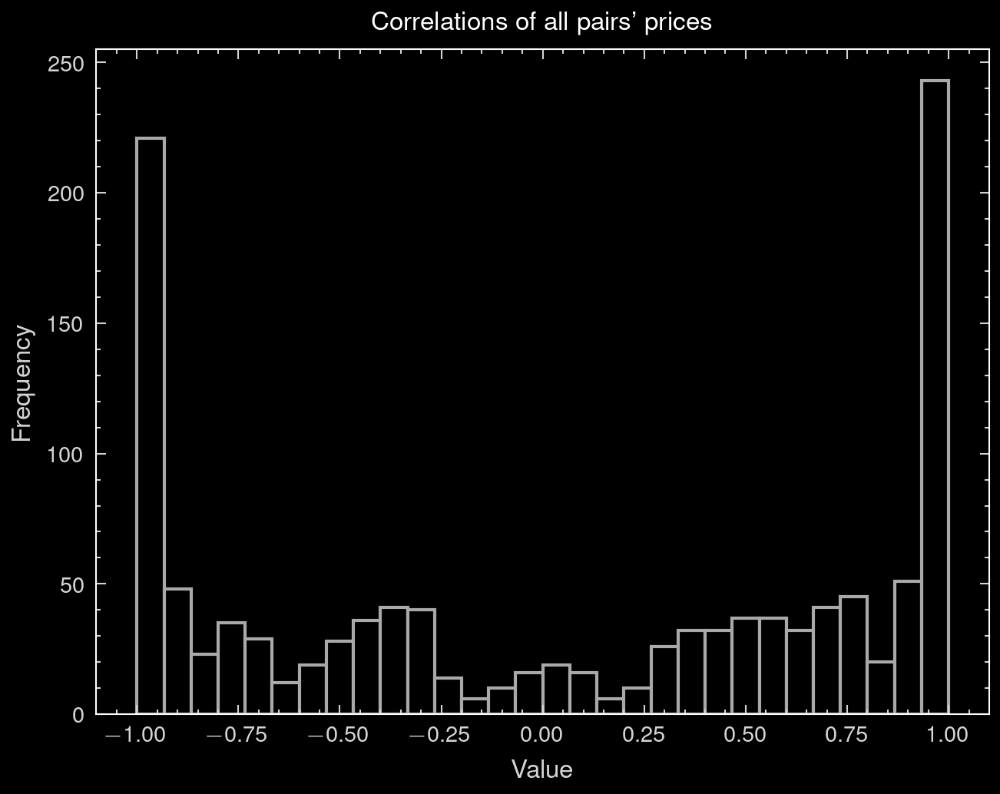

In [34]:
plt.rcParams['text.usetex'] = True

plt.hist(all_correlations, bins = 30, edgecolor   =   'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Correlations of all pairs' prices", fontsize = 8);
plt.show()

### Cointegration of all relevant pairs

In [35]:
from statsmodels.tsa.stattools import adfuller
from scipy.odr import ODR, Model, Data

all_adf_stats = []
all_adf_pvals = []
all_slopes = []
all_half_lifes = []

for i in range(len(paired_prices)):
    
    # Apply log transformation to stabilize variance and normalize price differences between the two assets before testing for mean-reversion.
    prices1 = np.log(paired_prices[i][0])
    prices2 = np.log(paired_prices[i][1])

    # Step 1: Perform OLS Regression with 0 Intercept
    slope = trd.ols_regression(prices1, prices2)[0]  # Extract slope
    all_slopes += [slope]  # Store the slope

    # Calculate residuals
    predicted_prices2 = slope * prices1  # Compute predicted prices with slope
    residuals = prices2 - predicted_prices2

    # Step 2: Perform ADF Test on Residuals
    adf_test = adfuller(residuals)

    adf_stat = adf_test[0]  # Test statistic
    p_value = adf_test[1]   # p-value
    
    # Step 3: Compute half-life of mean-reversion
    half_life =trd.compute_half_life(residuals)
    all_half_lifes += [half_life]
    

    all_adf_stats += [adf_stat]
    all_adf_pvals += [p_value]


In [36]:
max_coint = trd.n_largest(list_to_max=all_adf_stats,n_max=20)
np.array(pairs_ETF)[max_coint[1]]

array([['SLV', 'KRE'],
       ['SCHD', 'SLV'],
       ['SLV', 'SCHH'],
       ['SCHD', 'GDX'],
       ['XLF', 'SLV'],
       ['FXI', 'IWM'],
       ['FXI', 'KRE'],
       ['SLV', 'XLB'],
       ['GDX', 'XLB'],
       ['EEM', 'KRE'],
       ['SLV', 'XLI'],
       ['SCHH', 'IAU'],
       ['EWZ', 'KRE'],
       ['IWM', 'SLV'],
       ['EFA', 'KRE'],
       ['KRE', 'VWO'],
       ['KRE', 'XLU'],
       ['FXI', 'XLI'],
       ['KRE', 'SCHF'],
       ['XLU', 'SCHH']], dtype='<U4')

In [1339]:
# find the cointegration of the pair SPY and QQQ in all_adf_stats. First find the index of the pair in pairs_ETF using the function find_pair
pair_index = trd.find_pair(pairs_ETF,['EEM', 'VWO'])
all_adf_stats[pair_index], all_adf_pvals[pair_index]

(-0.6395299816420147, 0.8617974090771721)

In [52]:
pairs_ETF[pair_index][0]

'EEM'

In [53]:
pair_index = trd.find_pair(pairs_ETF,['SQQQ', 'SLV'])
pair_index

10

In [188]:
best_correlations[0][18]

0.9077583495268179

In [266]:
pair_index

nan

In [5]:
#pair_index = best_correlations[1][10]
#pair_index = np.array(pairs_ETF)[max_coint[1]][0]
pair_index = trd.find_pair(pairs_ETF,['KRE', 'XLF'])
name1 = pairs_ETF[pair_index][0]
name2 = pairs_ETF[pair_index][1]

plt.scatter(paired_prices[pair_index][0],paired_prices[pair_index][1])
plt.xlabel('Price of '+name1, fontsize=8);
plt.ylabel('Price of '+name2, fontsize=8);
plt.show()

NameError: name 'pairs_ETF' is not defined

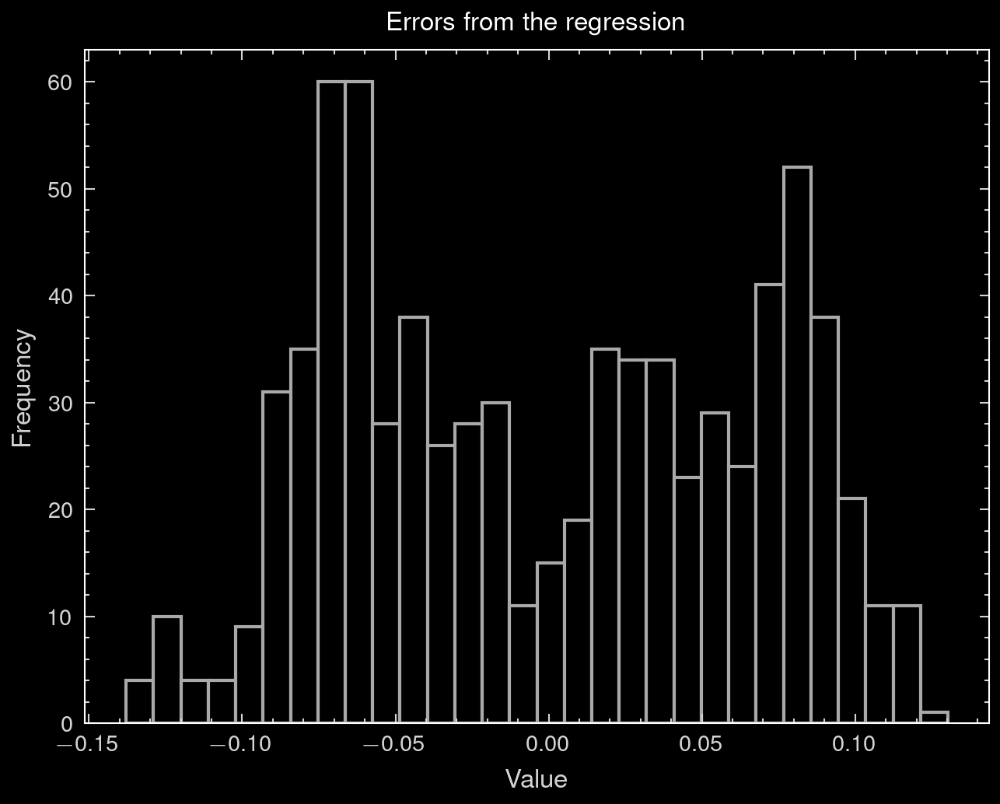

In [45]:
errors_regression = trd.ols_regression(paired_prices[pair_index][0],paired_prices[pair_index][1])[1]
plt.hist(errors_regression, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Errors from the regression", fontsize = 8);
plt.show()

/var/folders/dy/0dr1rz555tqczw3kw215bzcw0000gn/T/ipykernel_65852/655816716.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Set1', num_colors)  # Force unique colors


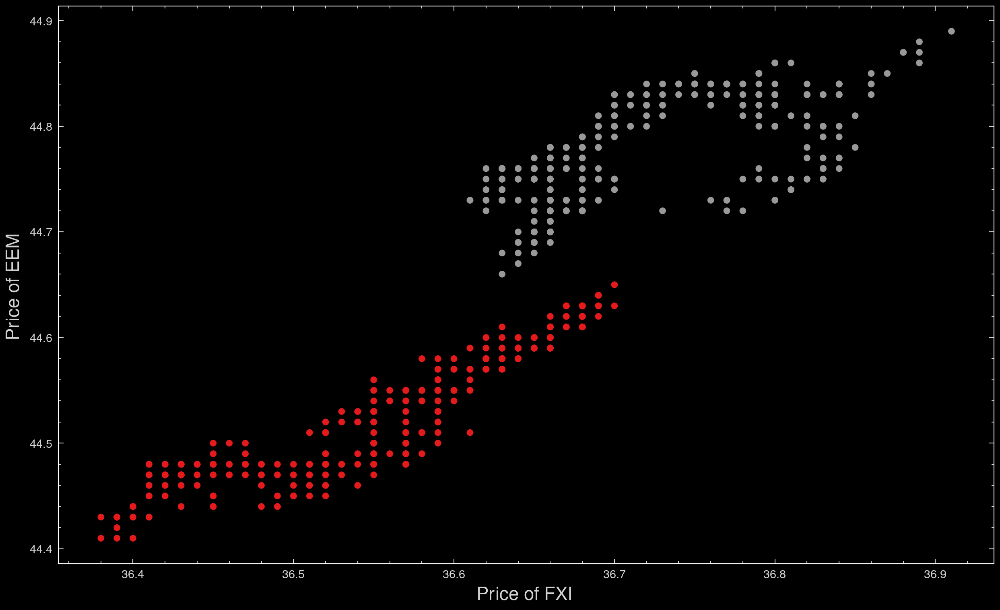

In [47]:
import matplotlib.cm as cm

num_colors = len(unique_days)
cmap = cm.get_cmap('Set1', num_colors)  # Force unique colors
color_dict = {day.date(): i for i, day in enumerate(unique_days)}
#colors = [color_dict[datetime.fromisoformat(day).date()] for day in close_prices3.index]
colors = [color_dict[day.date()] for day in close_prices3.index]
# Scatter plot
plt.figure(figsize=(10, 6))
sc = plt.scatter(close_prices3[name1], close_prices3[name2], c=colors, cmap=cmap)


# Add color bar for reference
# plt.colorbar(scatter, label='Day')

# Labeling
plt.xlabel('Price of '+name1, fontsize=11);
plt.ylabel('Price of '+name2, fontsize=11);
plt.show()

In [48]:
all_vols[name1], all_vols[name2]

(78120.18333333333, 40315.41923076923)

In [53]:
result = trd.simulate_trading_rescaled_e_dyn(price_list1=paired_prices[pair_index][0], price_list2=paired_prices[pair_index][1], error_rate=0.01, money_invested=25000, leave_profit=1000000, leave_loss=-1000000, startingStep=30, min_gain=10, c_edge=0.0, max_open=20, temp_loss=10, memory_es=30, ratio_open_close=0.5,max_trades=1000)

In [54]:
my_df = result.res_df
my_df['Time'] = close_prices3.index
my_df['RescaledSpread'] = result.rescaled_es
my_df

,Price1,Price2,EntryPrice1,EntryPrice2,Order1,Order2,ExecutedTrade1,ExecutedTrade2,PlannedShares1,PlannedShares2,...,CrossPrice,PositionsStatus,Side,HoldingDuration,RealizedPnL,CumulativePnL,Spread,HedgeRatio,Time,RescaledSpread
0,36.57,44.48,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,False,closed,0,0,0.00,0.00,44.480000,"[1.2063758159054836, 0.0329881273148888]",2025-03-21 14:34:00+01:00,44.480000
1,36.52,44.45,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,False,closed,0,1,0.00,0.00,0.360167,"[1.2161578612487491, 0.03325634261835802]",2025-03-21 14:35:00+01:00,0.360167
2,36.52,44.47,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,False,closed,0,1,0.00,0.00,0.022659,"[1.216773262756646, 0.03327319386773184]",2025-03-21 14:36:00+01:00,0.022659
3,36.48,44.46,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,False,closed,0,1,0.00,0.00,0.038838,"[1.2178292342154204, 0.03330223463484546]",2025-03-21 14:37:00+01:00,0.038838
4,36.52,44.46,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,...,False,closed,0,1,0.00,0.00,-0.048426,"[1.2165139941241314, 0.0332663760218387]",2025-03-21 14:38:00+01:00,-0.048426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
761,36.68,44.77,36.65,44.72,0.0,0.0,0.0,0.0,0.0,0.0,...,False,closed,0,1,-30.96,-30.96,-0.000032,"[1.2196270548804176, 0.034079862378812976]",2025-03-24 20:55:00+01:00,0.469798
762,36.66,44.76,36.65,44.72,0.0,0.0,0.0,0.0,0.0,0.0,...,False,closed,0,1,-30.96,-30.96,0.014392,"[1.2200163584235706, 0.0340948625446391]",2025-03-24 20:56:00+01:00,4.498868
763,36.66,44.76,36.65,44.72,0.0,0.0,0.0,0.0,0.0,0.0,...,False,closed,0,1,-30.96,-30.96,0.000105,"[1.2200192113194872, 0.03409494060015928]",2025-03-24 20:57:00+01:00,0.374364
764,36.68,44.78,36.65,44.72,0.0,0.0,0.0,0.0,0.0,0.0,...,False,closed,0,1,-30.96,-30.96,-0.004400,"[1.2199001951599338, 0.03409303786279896]",2025-03-24 20:58:00+01:00,-0.885210


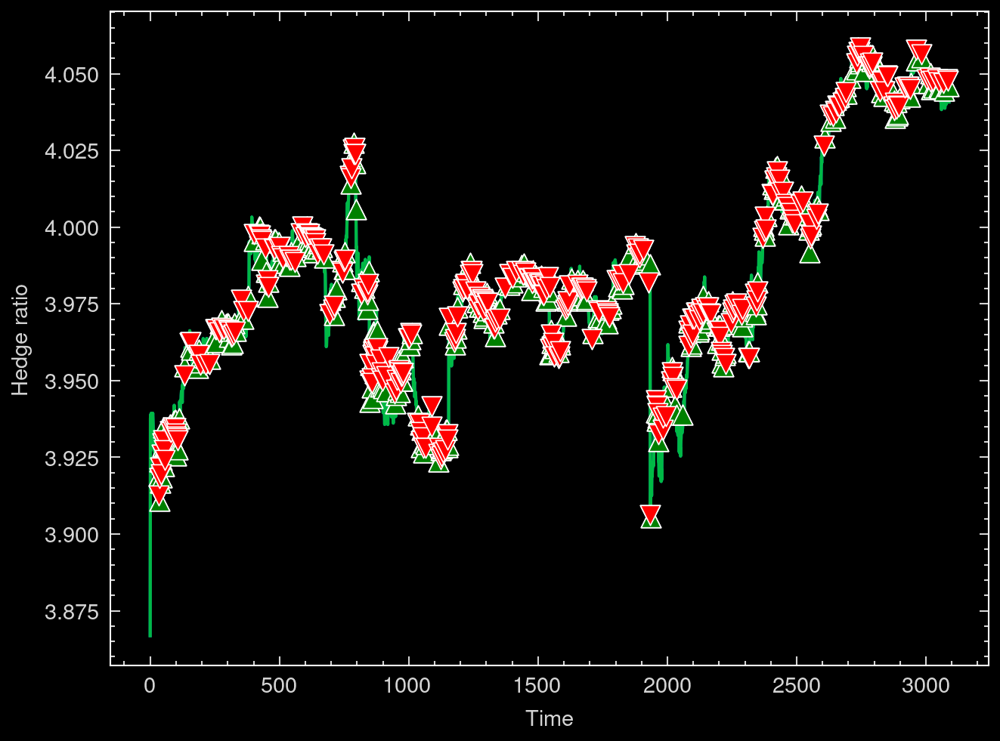

In [107]:
all_hedge_ratios = np.array([my_df['HedgeRatio'].iloc[i][0] for i in range(len(my_df))])
plt.plot(all_hedge_ratios)
hedge_ratios_trades_closed = np.array([trades_df[trades_df['PositionsStatus'] == 'closed']['HedgeRatio'].iloc[i][0] for i in range(len(trades_df[trades_df['PositionsStatus'] == 'closed']))])
hedge_ratios_trades_open = np.array([trades_df[trades_df['PositionsStatus'] == 'open']['HedgeRatio'].iloc[i][0] for i in range(len(trades_df[trades_df['PositionsStatus'] == 'open']))])


plt.scatter(
    trades_df[trades_df['PositionsStatus'] == 'closed'].index, 
    hedge_ratios_trades_closed, 
    color='green', marker='^', edgecolors='white', linewidth=0.4, s=40, label='Opening Trade', zorder=5
)
plt.scatter(
    trades_df[trades_df['PositionsStatus'] == 'open'].index, 
    hedge_ratios_trades_open, 
    color='red', marker='v', edgecolors='white', linewidth=0.4, s=40, label='Closing Trade', zorder=5
)

plt.xlabel('Time');
plt.ylabel('Hedge ratio');
plt.show()

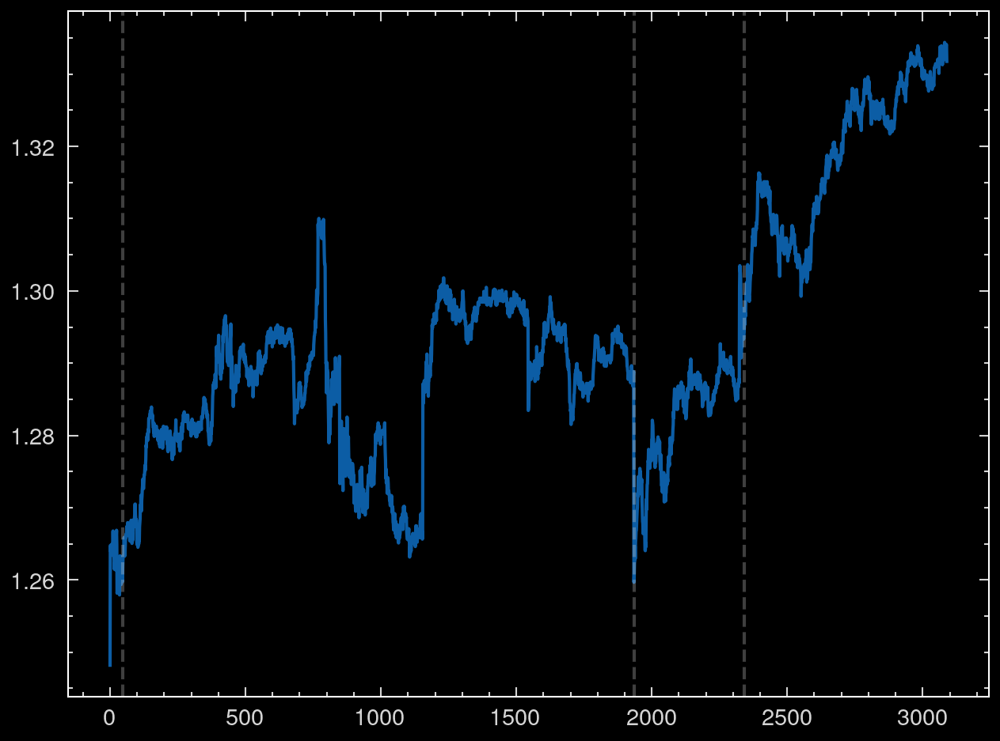

In [ ]:
plt.plot(all_hedge_ratios)
opening_times_losing = []

for i in range(len(losing_trades)):
    # Get the positional index of the row in trades_df
    closing_pos = trades_df.index.get_loc(losing_trades.index[i])

    # Get the preceding row if it exists
    if closing_pos > 0:
        preceding_row = trades_df.iloc[closing_pos - 1]
        preceding_index = trades_df.index[closing_pos - 1]
    else:
        preceding_row = None
        preceding_index = None

    opening_times_losing += [preceding_index] # This will give the actual row index in results_df
opening_times_losing

for losing_time in opening_times_losing:
    plt.axvline(x=losing_time, color='lightgray', linestyle='--', alpha=0.3)

NameError: name 'opening_times_losing' is not defined

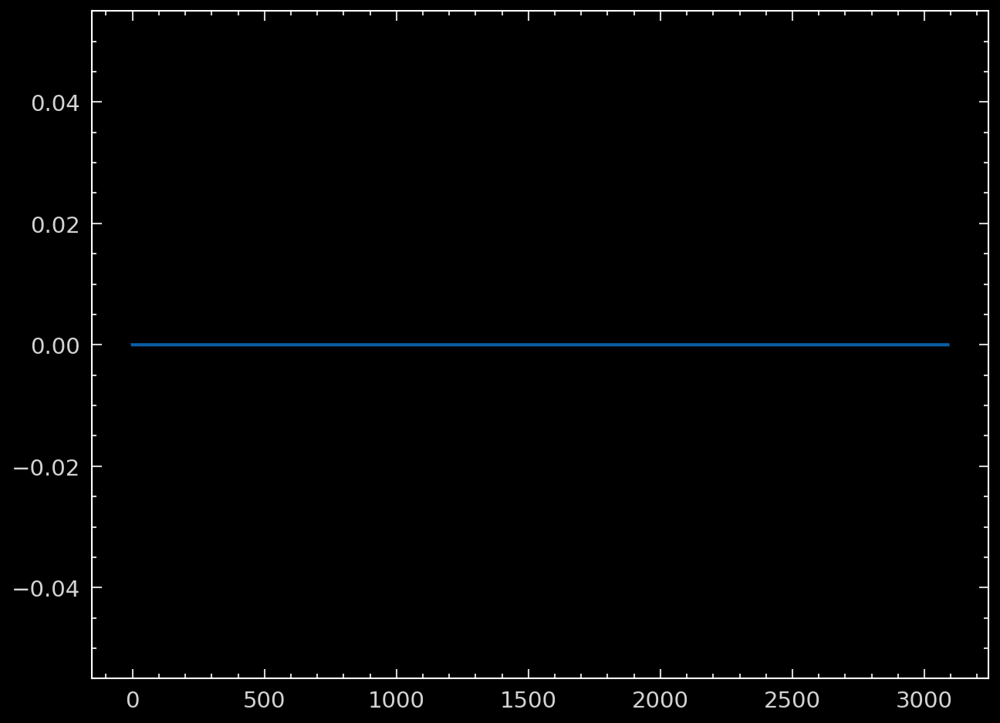

In [61]:
plt.plot(my_df['UnrealizedPnL1']+my_df['UnrealizedPnL2'])
for losing_time in opening_times_losing:
    # Find the index of the first row for each day
    plt.axvline(x=losing_time, color='lightgray', linestyle='--', alpha=0.3)

In [237]:
len(hedge_ratios_trades_closed), len(trades_df[trades_df['PositionsStatus'] == 'closed'].index), len(hedge_ratios_trades_open), len(trades_df[trades_df['PositionsStatus'] == 'open'].index)

(105, 105, 103, 103)

In [62]:
plt.plot(all_hedge_ratios)
day_length = int(len(paired_prices[pair_index][0])/len(unique_days))
for day in unique_days:
    # Find the index of the first row for each day
    day_start_index = my_df[my_df['Time'].dt.date == day].index[0]
    plt.axvline(x=day_start_index, color='lightgray', linestyle='--', alpha=0.3)

plt.xlabel('Time');
plt.ylabel('Hedge ratio');

NameError: name 'all_hedge_ratios' is not defined

/var/folders/dy/0dr1rz555tqczw3kw215bzcw0000gn/T/ipykernel_65852/21529886.py:6: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  day_start_index = my_df[my_df['Time'].dt.date == day].index[0]


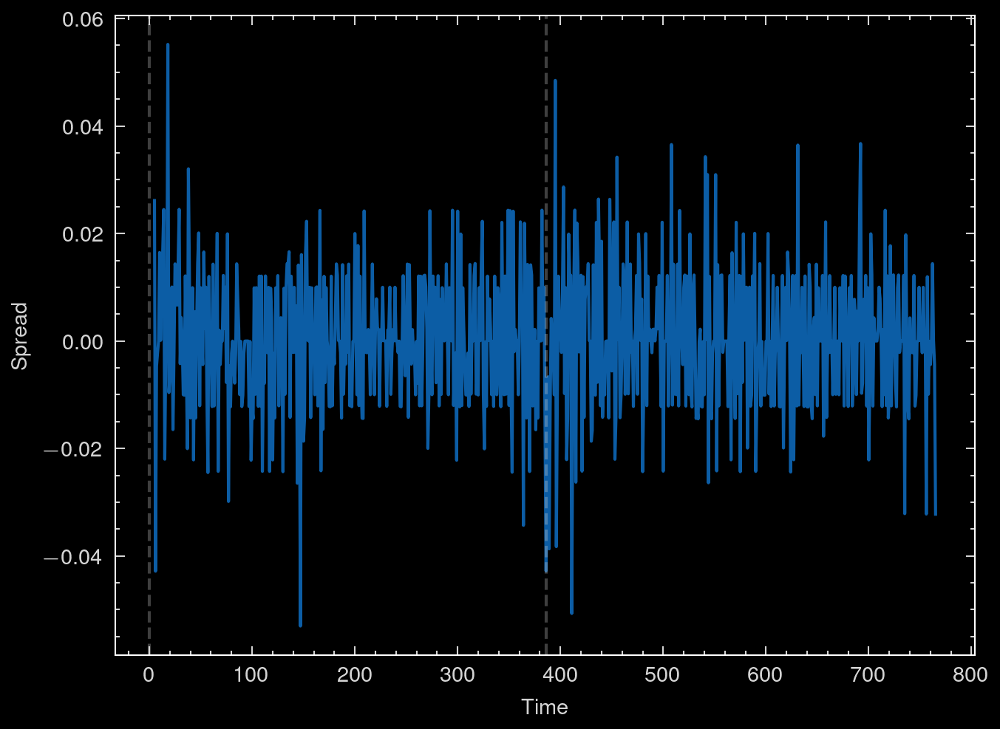

In [55]:
my_df['Time'] = pd.to_datetime(my_df['Time'])
plt.plot(my_df['Spread'][5:])
day_length = int(len(paired_prices[pair_index][0])/len(unique_days))
for day in unique_days:
    # Find the index of the first row for each day
    day_start_index = my_df[my_df['Time'].dt.date == day].index[0]
    plt.axvline(x=day_start_index, color='lightgray', linestyle='--', alpha=0.3)

plt.xlabel('Time');
plt.ylabel('Spread');
plt.show()

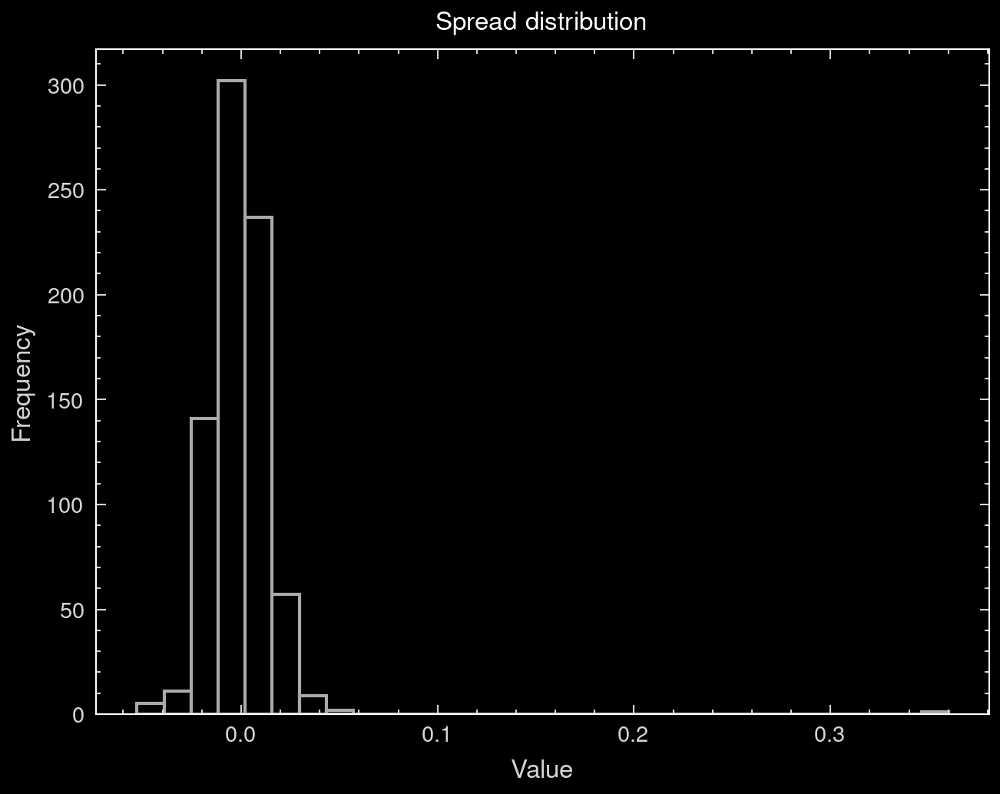

In [56]:
plt.hist(my_df['Spread'][1:], bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Spread distribution", fontsize = 8);

In [8]:
for i in range(1,3):
    print(i)


1
2


In [7]:
1700*12

20400

In [57]:
len(result.rescaled_es)

766

In [58]:
actions_df = my_df[((my_df['ExecutedTrade1']!=0) | (my_df['ExecutedTrade2']!=0))]
actions_df[['Price1',	'Price2','ExecutedTrade1',	'ExecutedTrade2', 'PositionsStatus','UnrealizedPnL1', 'UnrealizedPnL2', 'Spread', 'RescaledSpread',  'CumulativePnL', 'Time']].head(30)

,Price1,Price2,ExecutedTrade1,ExecutedTrade2,PositionsStatus,UnrealizedPnL1,UnrealizedPnL2,Spread,RescaledSpread,CumulativePnL,Time
147,36.57,44.48,-342.0,281.0,closed,0.00,0.00,-0.053042,-14.906263,-2.00,2025-03-21 17:01:00+01:00
153,36.57,44.50,342.0,-281.0,open,-0.00,5.62,0.022273,6.337271,1.62,2025-03-21 17:07:00+01:00
364,36.55,44.52,-342.0,281.0,closed,-0.00,0.00,-0.034304,-10.131317,-0.38,2025-03-21 20:38:00+01:00
365,36.54,44.53,342.0,-281.0,open,3.42,2.81,0.021919,5.978629,3.85,2025-03-21 20:39:00+01:00
386,36.73,44.72,-340.0,280.0,closed,0.00,0.00,-0.042789,-12.150286,1.85,2025-03-24 14:40:00+01:00
407,36.80,44.73,340.0,-280.0,open,-23.80,2.80,-0.014460,-3.198358,-21.15,2025-03-24 15:01:00+01:00
411,36.83,44.76,-339.0,279.0,closed,0.00,0.00,-0.050700,-13.643588,-23.15,2025-03-24 15:05:00+01:00
414,36.82,44.77,339.0,-279.0,open,3.39,2.79,0.024359,8.053215,-18.97,2025-03-24 15:08:00+01:00
508,36.74,44.84,340.0,-279.0,closed,-0.00,0.00,0.036557,10.120834,-20.97,2025-03-24 16:42:00+01:00
530,36.70,44.83,-340.0,279.0,open,-13.60,2.79,0.012275,3.060394,-33.78,2025-03-24 17:04:00+01:00


In [173]:
all_hedge_ratios = np.array([actions_df['HedgeRatio'].iloc[i][0] for i in range(len(actions_df))])
all_intercepts = np.array([actions_df['HedgeRatio'].iloc[i][1] for i in range(len(actions_df))])
predicted_prices2 = all_hedge_ratios[:-1]*np.array(actions_df['Price1'])[1:] + all_intercepts[:-1]
predicted_prices2 - np.array(actions_df['Price2'])[:-1]

array([-0.00263988, -0.00058252, -0.01939397, -0.02257731, -0.00776871,
       -0.05859421,  0.0372166 ,  0.01028853, -0.00707025,  0.08004526,
       -0.01555816, -0.01354145,  0.12672941,  0.00545403, -0.0856691 ,
        0.13136342, -0.00461227, -0.02907748,  0.01555678,  0.00565344,
        0.02354526, -0.02118986,  0.03053196, -0.07985326,  0.0313606 ,
        0.0012867 ,  0.01893547,  0.00485215, -0.0158602 ,  0.02108171,
       -0.01843977,  0.09583385,  0.01427151, -0.01833956, -0.00142027,
       -0.01658805,  0.01165565,  0.2339327 , -0.01140457, -0.00913866,
       -0.0257226 , -0.01565453,  0.02310903,  0.00177386,  0.02740463,
       -0.02306603, -0.01702567, -0.01909562,  0.03662069,  0.01743629,
       -0.09121622, -0.07253286,  0.04188029, -0.03556574, -0.00490332,
       -0.01082248, -0.0008726 , -0.01108287,  0.02392807,  0.0233829 ,
       -0.08943556,  0.0069287 , -0.03957954, -0.08842116, -0.00698537,
        0.01506001,  0.04526843,  0.01340203])

In [169]:
all_hedge_ratios

array([0.44601934, 0.4478763 , 0.44780044, 0.45113102, 0.4531404 ,
       0.45296555, 0.44342968, 0.43948641, 0.43951052, 0.43763055,
       0.43064089, 0.4327464 , 0.42972512, 0.41898715, 0.420903  ,
       0.42534749, 0.42079391, 0.41846537, 0.4199086 , 0.4178872 ,
       0.41873843, 0.41757896, 0.41842976, 0.41914046, 0.4241124 ,
       0.42238875, 0.42539237, 0.4287631 , 0.42682262, 0.42886924,
       0.43110909, 0.43431006, 0.4270225 , 0.42901605, 0.4327842 ,
       0.43051947, 0.43162263, 0.4321357 , 0.40287527, 0.40520456,
       0.4057311 , 0.40757672, 0.40941007, 0.40678784, 0.40892033,
       0.40679756, 0.4077155 , 0.41050242, 0.41269908, 0.40816656,
       0.41058343, 0.4092459 , 0.41067832, 0.40900873, 0.41085865,
       0.40898148, 0.41134943, 0.40887991, 0.41120034, 0.41056334,
       0.4086558 , 0.4085557 , 0.40634328, 0.40767046, 0.40938411,
       0.40992167, 0.40776979, 0.40553118, 0.4026566 ])

In [106]:
(my_df['UnrealizedPnL1'] + my_df['UnrealizedPnL2']).iloc[31:52]

31      0.00
32    -38.46
33    -51.28
34    -38.46
35    -48.96
36    -43.10
37    -45.42
38    -11.60
39    -11.60
40     -1.10
41    -34.92
42    -34.92
43    -58.24
44    -24.42
45    -26.74
46    -94.38
47    -71.06
48    -83.88
49   -104.88
50    -71.06
51   -104.88
dtype: float64

In [140]:
actions_df[(actions_df['PositionsStatus'] == 'closed') & (abs(actions_df['Spread'])<0.04)]

,Price1,Price2,EntryPrice1,EntryPrice2,Order1,Order2,ExecutedTrade1,ExecutedTrade2,PlannedShares1,PlannedShares2,...,CrossPrice,PositionsStatus,Side,HoldingDuration,RealizedPnL,CumulativePnL,Spread,HedgeRatio,Time,RescaledSpread
789,11.72,5.08,11.71,5.09,-1067.0,2460.0,-1067.0,2460.0,-1067.0,2460.0,...,False,closed,1,1,-2.00,-2.00,-0.033280,"[0.42972512043110145, 0.045730710127359984]",2025-02-07 15:54:00+01:00,-33.384629
1964,12.71,5.38,12.70,5.39,-956.0,2258.0,-956.0,2258.0,-956.0,2258.0,...,False,closed,1,1,-702.18,-702.18,-0.032319,"[0.4067878370351924, 0.21150044950178792]",2025-02-12 16:00:00+01:00,-23.335477


In [114]:
my_df.iloc[789:811][['Price1',	'Price2','ExecutedTrade1',	'ExecutedTrade2', 'PositionsStatus','UnrealizedPnL1', 'UnrealizedPnL2', 'HoldingDuration', 'Spread', 'RescaledSpread',  'CumulativePnL']]

,Price1,Price2,ExecutedTrade1,ExecutedTrade2,PositionsStatus,UnrealizedPnL1,UnrealizedPnL2,HoldingDuration,Spread,RescaledSpread,CumulativePnL
789,11.72,5.08,-990.0,2284.0,closed,-0.000000e+00,-0.000000e+00,1,-0.033280,-33.384629,-1793.23
790,11.71,5.08,0.0,0.0,open,-9.900000e+00,-4.568000e+01,1,0.002188,0.000000,-1848.81
791,11.70,5.07,0.0,0.0,open,1.547207e-12,-6.852000e+01,2,-0.005562,0.000000,-1861.75
792,11.69,5.07,0.0,0.0,open,9.900000e+00,-6.852000e+01,3,0.003941,0.000000,-1851.85
793,11.68,5.07,0.0,0.0,open,1.980000e+01,-6.852000e+01,4,0.004549,0.000000,-1841.95
794,11.68,5.07,0.0,0.0,open,1.980000e+01,-6.852000e+01,5,0.000290,0.000000,-1841.95
795,11.83,5.09,0.0,0.0,open,-1.287000e+02,-2.284000e+01,6,-0.044505,-59.767318,-1944.77
796,11.86,5.07,0.0,0.0,open,-1.584000e+02,-6.852000e+01,7,-0.035562,-33.477146,-2020.15
797,11.89,5.08,0.0,0.0,open,-1.881000e+02,-4.568000e+01,8,-0.004915,0.000000,-2027.01
798,11.88,5.09,0.0,0.0,open,-1.782000e+02,-2.284000e+01,9,0.013928,0.000000,-1994.27


In [129]:
actions_df['Price2'] + actions_df['Spread']

46      5.261023
67      5.333549
789     5.046720
810     5.059175
811     5.134546
832     5.087912
848     5.095952
869     5.126405
1155    5.202097
1176    5.284295
1544    5.260557
1547    5.436889
1934    5.193583
1936    5.398984
1938    5.405230
1959    5.368225
1961    5.416265
1964    5.347681
2324    5.377139
2330    5.310575
2712    5.217102
2731    5.133868
dtype: float64

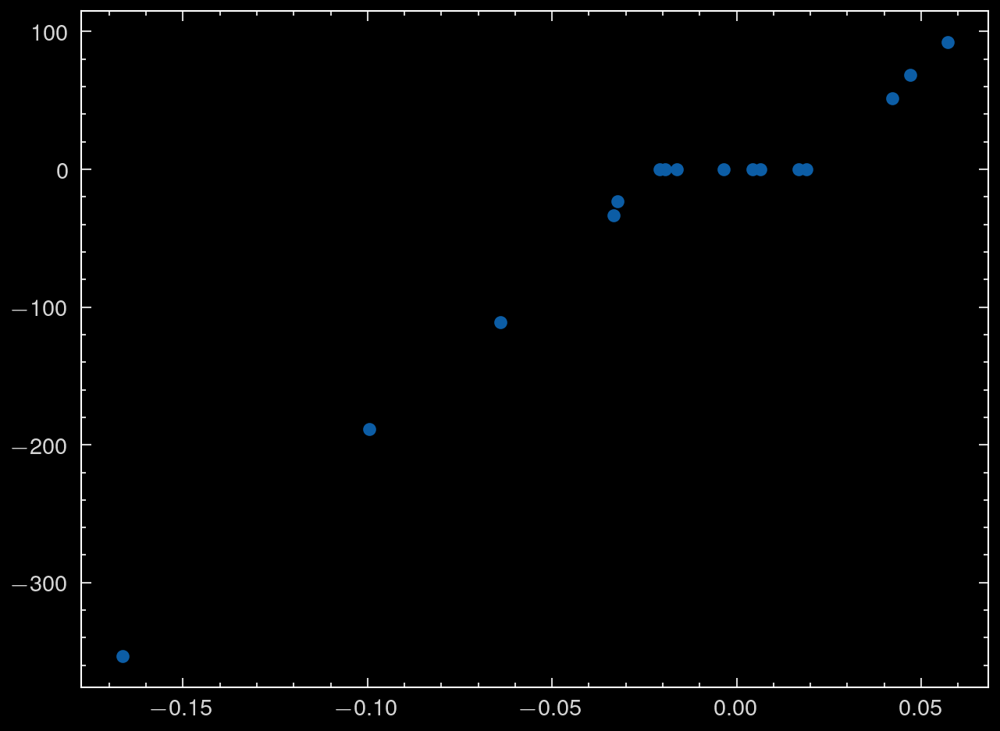

In [138]:
plt.scatter(actions_df['Spread'], actions_df['RescaledSpread'])

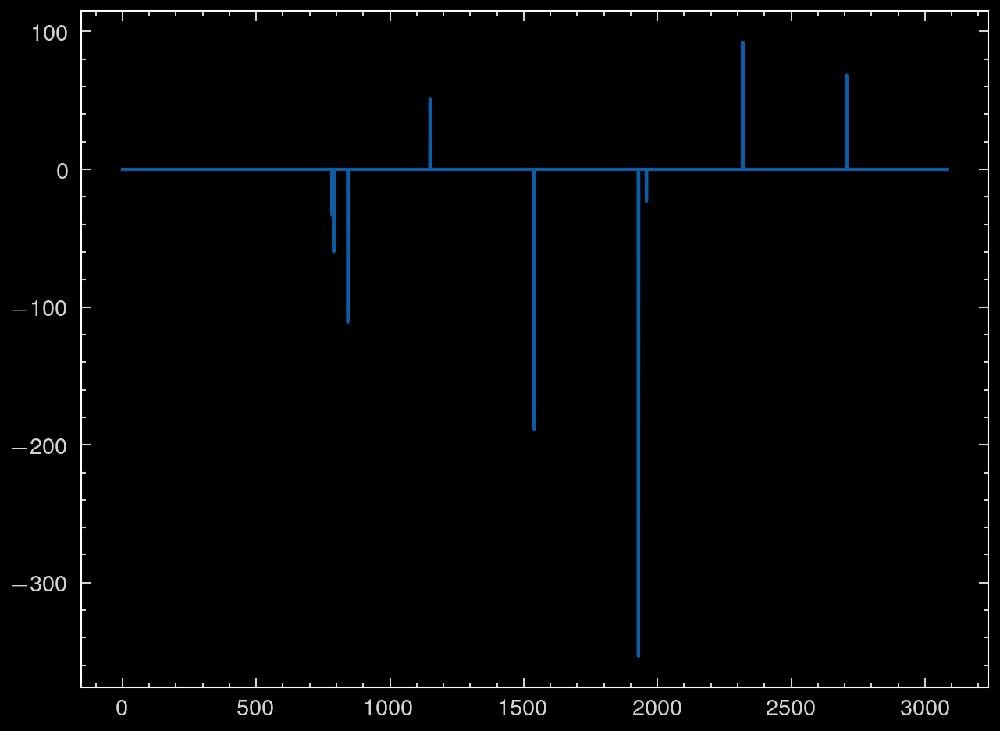

In [144]:
plt.plot(result.rescaled_es[5:])
plt.show()

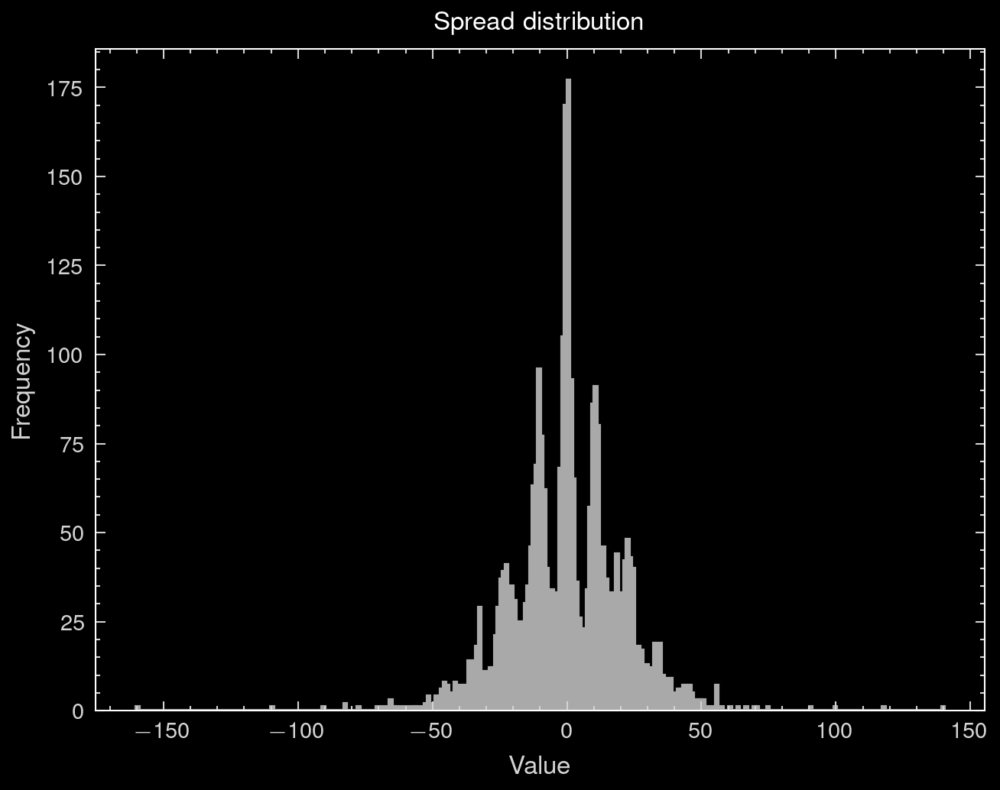

In [102]:
plt.hist(np.array(result.rescaled_es[5:])[abs(np.array(result.rescaled_es[5:])) < 200], bins = 300, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Spread distribution", fontsize = 8);
plt.show()

In [100]:
result.rescaled_es[100:]

[-34.60972373791772,
 29.640574514413537,
 -12.90003755578034,
 10.532201409855842,
 0,
 -7.986480729838199,
 0,
 3.6700454111533705,
 0,
 14.71738068634821,
 0,
 12.823906630021716,
 2.3193944604981693,
 -1.3869774359266231,
 19.97322295757965,
 -2.0685890702049075,
 -7.744274126932639,
 17.21728755574993,
 -12.804897612723632,
 0,
 3.609303389028489,
 0,
 -7.239123198553049,
 0,
 -0.5003355326925611,
 25.655277495275268,
 0,
 0,
 -2.6157664255479434,
 0,
 0,
 8.4683674292244,
 0,
 2.9614554764199097,
 11.291100230463892,
 0,
 0,
 -1.7558438006060202,
 -14.257323134808672,
 -14.027818810090363,
 -5.042397097750901,
 8.518244243367548,
 0,
 1.279086649272008,
 -12.5787375233445,
 -11.73672589204585,
 -14.89768117485145,
 0,
 -11.944039209861455,
 0,
 -3.9928394524540844,
 17.72307748461764,
 -3.4174555671424613,
 3.494432753982597,
 -20.059507056925625,
 -1.9552495815422155,
 0,
 0,
 -7.886083327405901,
 -2.8770237440394357,
 0,
 -12.931283716092546,
 0,
 -12.555060846701716,
 -0.62351

In [141]:
trades_df = my_df[((my_df['ExecutedTrade1']!=0) & (my_df['ExecutedTrade2']!=0))]
trades_df[['Price1',	'Price2','ExecutedTrade1',	'ExecutedTrade2', 'Shares1', 'Shares2', 'PositionsStatus','UnrealizedPnL1', 'UnrealizedPnL2', 'HoldingDuration', 'CumulativePnL', 'Time']].head(10)

,Price1,Price2,ExecutedTrade1,ExecutedTrade2,Shares1,Shares2,PositionsStatus,UnrealizedPnL1,UnrealizedPnL2,HoldingDuration,CumulativePnL,Time
789,11.72,5.08,-1067.0,2460.0,-1067.0,2460.0,closed,0.000000e+00,0.000000e+00,1,-2.00,2025-02-07 15:54:00+01:00
810,12.01,5.08,1067.0,-2460.0,0.0,0.0,open,-3.307700e+02,-4.920000e+01,21,-383.97,2025-02-07 16:15:00+01:00
848,12.13,5.16,-1015.0,2384.0,-1015.0,2384.0,closed,0.000000e+00,0.000000e+00,1,-385.97,2025-02-07 16:53:00+01:00
869,12.11,5.13,1015.0,-2384.0,0.0,0.0,open,1.586287e-12,-1.192000e+02,21,-507.17,2025-02-07 17:14:00+01:00
1155,11.98,5.16,1022.0,-2374.0,1022.0,-2374.0,closed,-0.000000e+00,-0.000000e+00,1,-509.17,2025-02-10 15:31:00+01:00
1176,12.08,5.28,-1022.0,2374.0,0.0,0.0,open,8.176000e+01,-3.323600e+02,21,-761.77,2025-02-10 15:52:00+01:00
1544,12.31,5.36,-985.0,2260.0,-985.0,2260.0,closed,0.000000e+00,0.000000e+00,1,-763.77,2025-02-11 15:30:00+01:00
1547,12.34,5.42,985.0,-2260.0,0.0,0.0,open,-4.925000e+01,9.040000e+01,3,-724.62,2025-02-11 15:33:00+01:00
1934,12.82,5.36,-948.0,2263.0,-948.0,2263.0,closed,0.000000e+00,-0.000000e+00,1,-726.62,2025-02-12 15:30:00+01:00
1936,12.77,5.38,948.0,-2263.0,0.0,0.0,open,2.844000e+01,-4.796163e-13,2,-700.18,2025-02-12 15:32:00+01:00


In [126]:
len(trades_df)

22

In [239]:
trades_df['UnrealizedPnL1']+trades_df['UnrealizedPnL2']

38       0.00
45       8.80
46      -0.00
53       7.17
55       0.00
        ...  
2712    31.08
2740     0.00
2790     6.61
2925    -0.00
2947   -10.05
Length: 114, dtype: float64

In [219]:
trades_df.to_csv("exampleTrades.csv")

In [1283]:
len(trades_df)/2

353.0

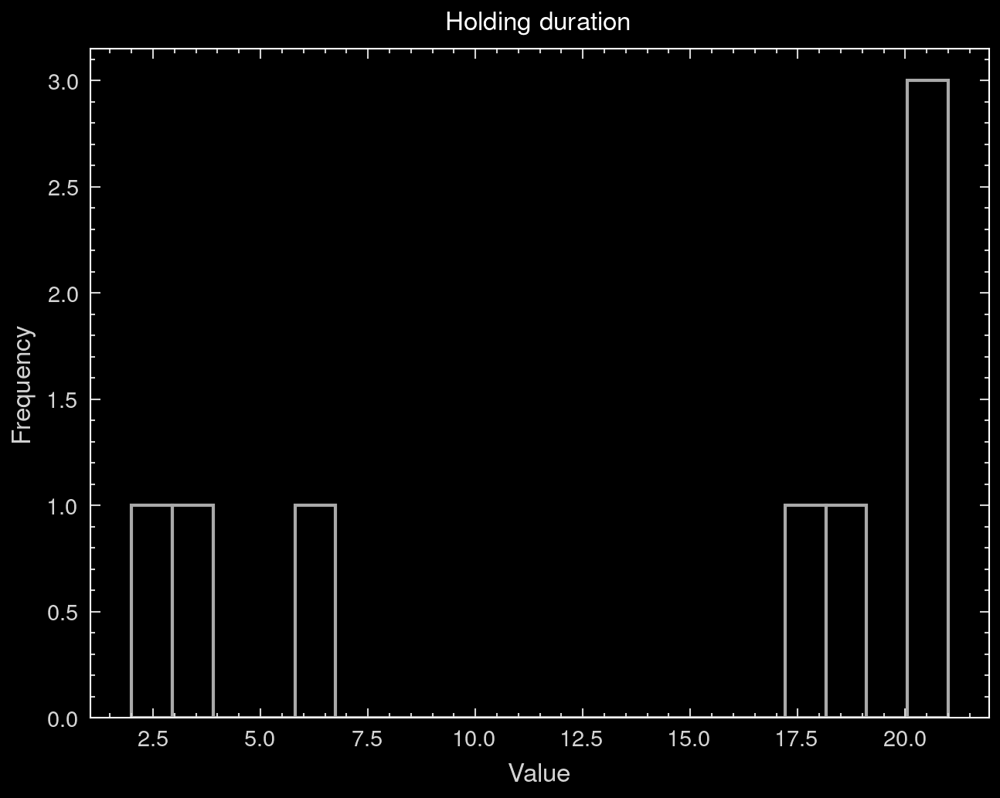

In [142]:
trades_closing_df = trades_df[trades_df['PositionsStatus']=='open']
plt.hist(trades_closing_df['HoldingDuration'], bins = 20, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Holding duration", fontsize = 8);
plt.show()

In [276]:
losing_trades = trades_df[(trades_df['UnrealizedPnL1']+trades_df['UnrealizedPnL2']<0)]
losing_trades['HoldingDuration']

205     23
347     21
412     21
442     23
505     30
551     22
806     21
842     24
900     22
965     28
1181    21
1232    21
1257    21
1305    24
1420    23
1553    21
1625    23
1701    21
1980    21
2010    21
2032    21
2068    21
2352    21
2599    21
2793    25
2819    21
2906    26
Name: HoldingDuration, dtype: int64

In [148]:
losing_trades['UnrealizedPnL1']+losing_trades['UnrealizedPnL2']

76      -70.14
153     -82.71
175     -35.87
261     -13.17
303     -17.54
336     -29.59
396    -143.57
418     -16.10
490    -100.55
516    -145.15
570     -76.09
616    -109.19
653    -133.34
679    -185.08
704     -78.86
759     -50.56
817     -68.20
997     -78.86
1147    -57.12
1177    -48.69
1230    -92.76
1261    -90.66
1286   -129.36
1374    -64.67
1435    -15.09
1470    -19.87
1552   -406.81
1581    -39.62
1618    -61.15
1640   -101.77
1673    -72.91
1753    -50.45
1779    -25.17
1865    -69.45
1959   -114.01
2004   -137.58
2030   -159.80
2075   -126.24
2124    -17.28
2180    -10.09
2206    -41.08
2229    -60.03
2251   -140.94
2313    -30.00
2427    -28.92
2495   -169.71
2517    -65.62
2549    -12.44
2573    -65.59
2611   -177.32
2651    -65.46
2679   -101.17
2703    -42.12
2725   -285.47
2764   -207.78
2826    -91.38
2877    -59.28
2970    -40.85
3009    -17.82
3031    -32.14
dtype: float64

In [143]:
trd.compute_trading_metrics(result.res_df, initial_balance=50000, trading_days=len(unique_days))

{'Start_Balance': 50000,
 'Final_Balance': 49360.170000000006,
 'Total_Return (%)': -1.2796599999999936,
 'Time_in_Market (%)': 3.5922330097087376,
 'Max_Drawdown (%)': -1.6276999999999973,
 'Max_Drawdown_Duration': 1,
 'Sharpe Ratio': -0.09211978223959463,
 'Total_Trades': 8,
 'Wins': 5,
 'Losses': 3,
 'Winrate (%)': 62.5,
 'Avg_Risk_Reward': 0.11358683329554796}

In [1286]:
len(best_correlations[1])

100

In [1308]:
my_pairs = range(len(pairs_ETF))
#my_pairs = best_correlations[1]
all_pnls = []
metrics_list = []
budget = 50000

for pair_index in my_pairs:
    result = trd.simulate_trading_rescaled_e_dyn(price_list1=paired_prices[pair_index][0], price_list2=paired_prices[pair_index][1], error_rate=0.01, money_invested=budget, leave_profit=1000000, leave_loss=-1000000, startingStep=30, min_gain=10, c_edge=0, max_open=20, temp_loss=10, memory_es=30, ratio_open_close=1,max_trades=1000)
    
    all_pnls += [result.res_df['CumulativePnL'].iloc[-1]]
    metrics_pair = trd.compute_trading_metrics(result.res_df, initial_balance=budget)
    metrics_pair['Pair'] = pairs_ETF[pair_index]  # Add pair identifier

    metrics_list.append(metrics_pair)

# Convert metrics list to a DataFrame
metrics_df = pd.DataFrame(metrics_list)


/Users/slimane/Documents/GitHub/trading/ForSemihYagmur/trading.py:3361: FutureWarning: Behavior when concatenating bool-dtype and numeric-dtype arrays is deprecated; in a future version these will cast to object dtype (instead of coercing bools to numeric values). To retain the old behavior, explicitly cast bool-dtype arrays to numeric dtype.
  closing_trades = pd.concat([closing_trades, forced_closing_trade], ignore_index=True)
/Users/slimane/Documents/GitHub/trading/ForSemihYagmur/trading.py:3361: FutureWarning: Behavior when concatenating bool-dtype and numeric-dtype arrays is deprecated; in a future version these will cast to object dtype (instead of coercing bools to numeric values). To retain the old behavior, explicitly cast bool-dtype arrays to numeric dtype.
  closing_trades = pd.concat([closing_trades, forced_closing_trade], ignore_index=True)


In [1309]:
metrics_df

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
0,50000,48415.49,-3.16902,79.870550,-5.284368,5,-0.083162,365,307,58,84.109589,0.186354,"[SQQQ, FXI]"
1,50000,51405.61,2.81122,81.262136,-4.144298,8,0.077471,356,288,68,80.898876,0.308718,"[SQQQ, XLF]"
2,50000,52713.17,5.42634,78.090615,-2.113270,10,0.204046,435,377,58,86.666667,0.262216,"[SQQQ, TZA]"
3,50000,51175.38,2.35076,80.291262,-3.434764,8,0.072257,337,272,65,80.712166,0.314905,"[SQQQ, HYG]"
4,50000,50869.40,1.73880,79.320388,-3.662193,4,0.036761,377,312,65,82.758621,0.244255,"[SQQQ, TLT]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3155,50000,53144.67,6.28934,46.343042,-0.035196,30,1.561686,405,405,0,100.000000,NaN,"[VGSH, SCHO]"
3156,50000,50142.68,0.28536,54.401294,-1.100812,50,0.029421,148,106,42,71.621622,0.536398,"[VGSH, EWY]"
3157,50000,50266.53,0.53306,74.401294,-1.592842,19,0.034006,317,261,56,82.334385,0.295873,"[XOP, SCHO]"
3158,50000,48833.05,-2.33390,77.152104,-3.674847,11,-0.152212,262,197,65,75.190840,0.316790,"[XOP, EWY]"


In [1346]:
metrics_df.to_csv('ETF_backtest_metrics.csv')

In [1324]:
pairs_ETF[0]

array(['SQQQ', 'FXI'], dtype='<U4')

In [1310]:
metrics_df.sort_values(by="Total_Return (%)", ascending=False).head(30)

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
698,50000,62646.50,25.29300,70.032362,-1.036198,9,0.841133,504,464,40,92.063492,0.367828,"[FAZ, RWM]"
239,50000,61700.03,23.40006,76.245955,-1.302477,7,0.575516,506,457,49,90.316206,0.320328,"[TZA, FAZ]"
682,50000,60664.34,21.32868,72.621359,-1.527937,16,0.708912,527,485,42,92.030361,0.299741,"[FAZ, SDS]"
681,50000,59596.24,19.19248,70.938511,-1.453864,11,0.623140,574,534,40,93.031359,0.220592,"[FAZ, SPXU]"
706,50000,59444.28,18.88856,76.925566,-2.609735,7,0.395608,527,475,52,90.132827,0.230002,"[FAZ, UNG]"
707,50000,58695.78,17.39156,74.595469,-1.743676,10,0.443629,473,426,47,90.063425,0.260539,"[FAZ, SCHH]"
8,50000,58614.32,17.22864,76.634304,-2.755564,8,0.442474,494,445,49,90.080972,0.277732,"[SQQQ, FAZ]"
249,50000,58429.73,16.85946,76.407767,-1.730485,6,0.406059,448,399,49,89.062500,0.315384,"[TZA, BKLN]"
717,50000,58402.33,16.80466,75.987055,-1.659172,12,0.488407,328,276,52,84.146341,0.463206,"[FAZ, SHV]"
721,50000,58209.45,16.41890,76.990291,-2.114680,10,0.409617,425,366,59,86.117647,0.341982,"[FAZ, IGV]"


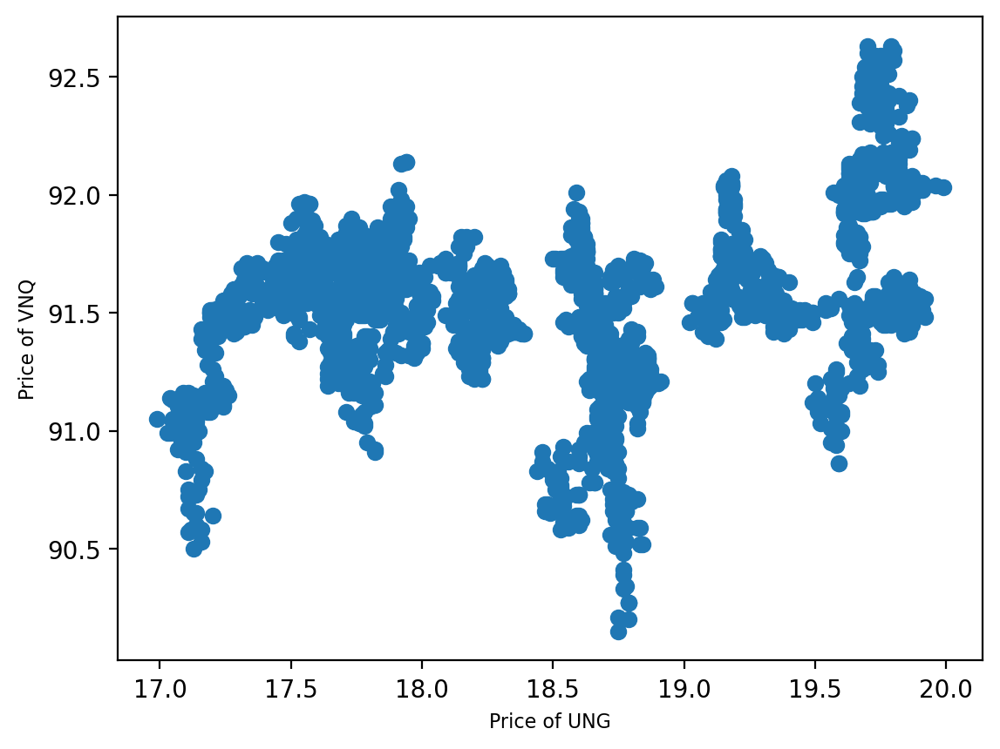

In [1331]:
pair_index = trd.find_pair(pairs_ETF,['UNG', 'VNQ'])
name1 = pairs_ETF[pair_index][0]
name2 = pairs_ETF[pair_index][1]

plt.scatter(paired_prices[pair_index][0],paired_prices[pair_index][1])
plt.xlabel('Price of '+name1, fontsize=8);
plt.ylabel('Price of '+name2, fontsize=8);
plt.show()

In [1317]:
all_adf_pvals[pair_index], all_adf_stats[pair_index], all_correlations[pair_index]

(0.18236017876320404, -2.26840597430738, 0.5472430091480722)

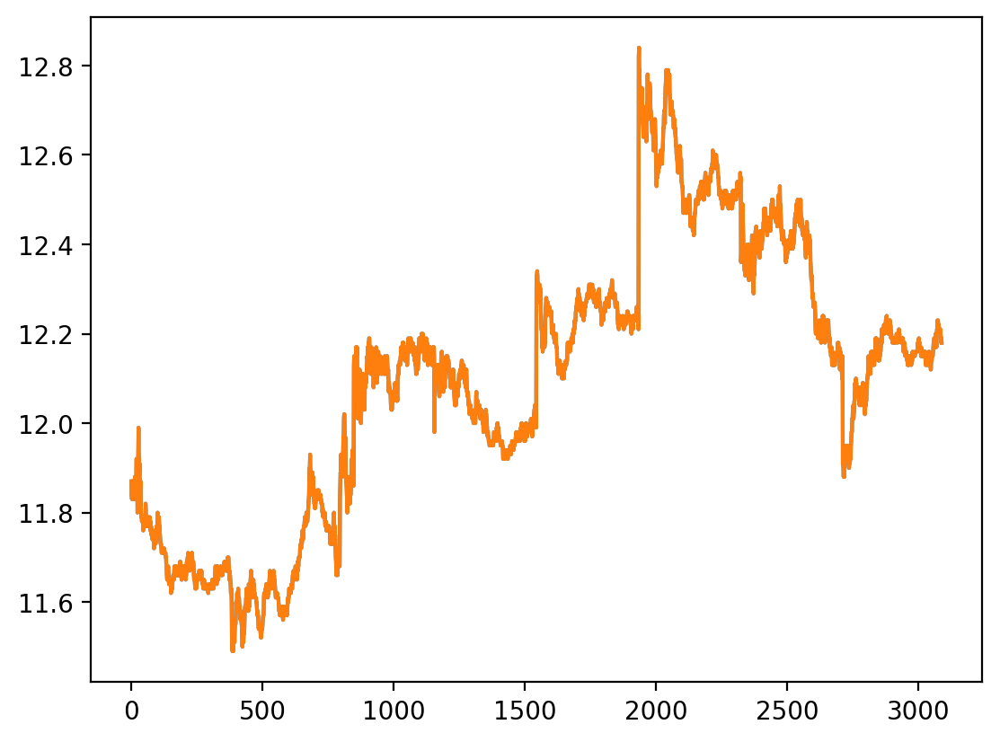

In [1333]:
plt.plot(np.array(close_prices3['TZA']))
plt.show()

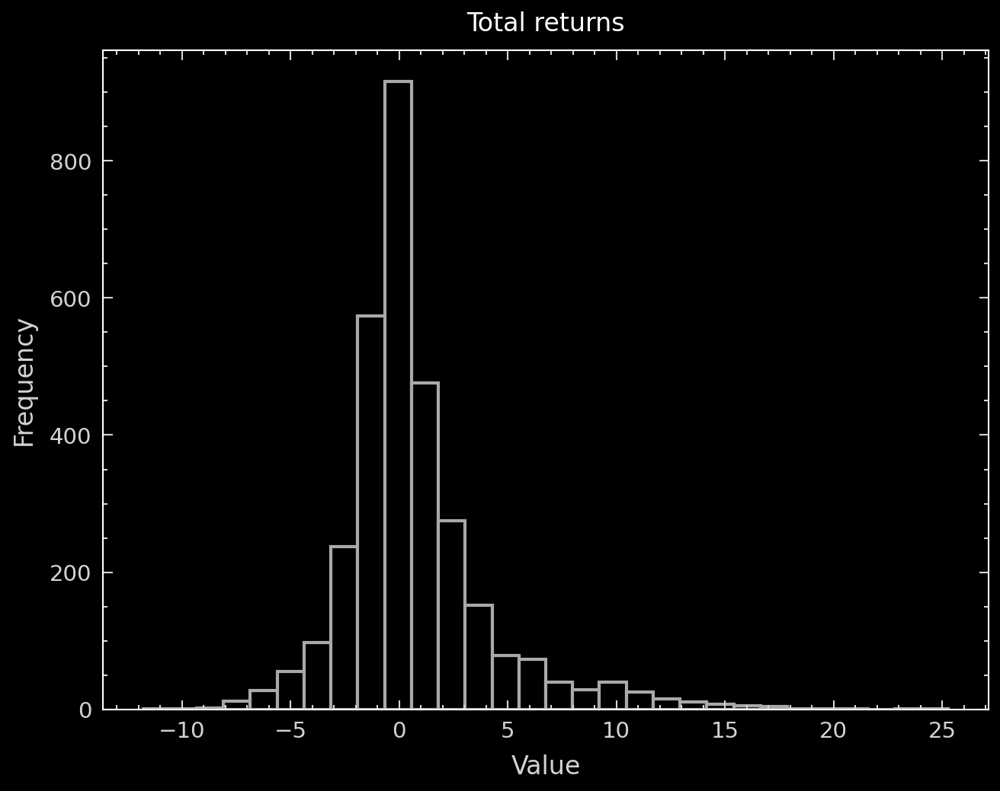

In [1322]:
plt.hist(metrics_df['Total_Return (%)'], bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Total returns", fontsize = 8);

In [1300]:
metrics_df[metrics_df['Total_Return (%)']<0]

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
14,50000,49996.16,-0.00768,12.233010,-0.025916,4,-0.008011,1,0,1,0.000000,0.000000,"[BND, AGG]"
16,50000,49899.38,-0.20124,9.773463,-0.253052,6,-0.153919,10,4,6,40.000000,0.629773,"[IEF, VGIT]"
21,50000,49991.15,-0.01770,5.113269,-0.065719,1086,-0.028436,5,3,2,60.000000,1.000150,"[AGG, IEF]"
26,50000,49944.56,-0.11088,22.168285,-0.132751,4,-0.076331,12,6,6,50.000000,0.899879,"[LQD, VCIT]"
29,50000,49942.31,-0.11538,15.275081,-0.125128,5,-0.097153,5,1,4,20.000000,1.072053,"[BND, IEF]"
33,50000,49989.22,-0.02156,11.003236,-0.085850,374,-0.019873,11,7,4,63.636364,0.996672,"[LQD, BND]"
39,50000,49994.35,-0.01130,22.103560,-0.086629,339,-0.007660,9,6,3,66.666667,0.950030,"[BND, VCIT]"
45,50000,49981.99,-0.03602,23.009709,-0.203961,180,-0.013108,50,36,14,72.000000,0.601806,"[IWM, IJR]"
47,50000,49992.11,-0.01578,30.938511,-0.278189,8,-0.004928,70,49,21,70.000000,0.676781,"[TLT, IEF]"
55,50000,49914.75,-0.17050,16.601942,-0.185672,2,-0.128796,8,3,5,37.500000,0.633007,"[LQD, AGG]"


In [124]:
np.mean(all_pnls), np.std(all_pnls), np.median(all_pnls), np.max(all_pnls), np.min(all_pnls)

(453.0804999999989,
 781.7039336313632,
 134.0199999999918,
 4585.480000000018,
 -745.5600000000148)

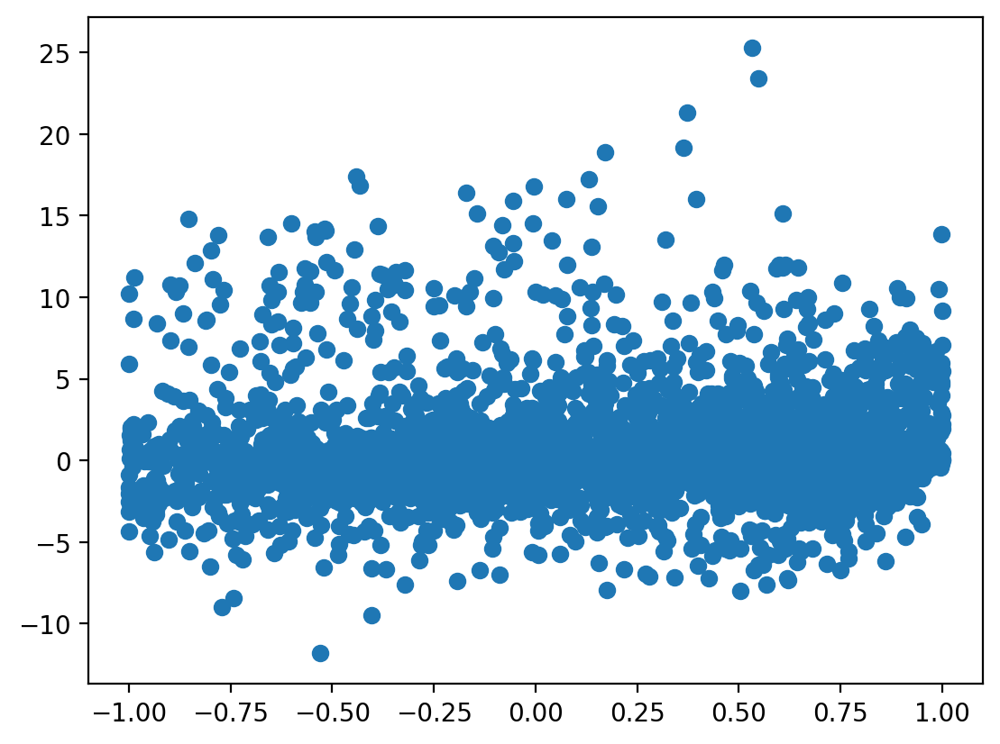

In [1342]:
plt.scatter(all_correlations,metrics_df['Total_Return (%)'])
plt.show()

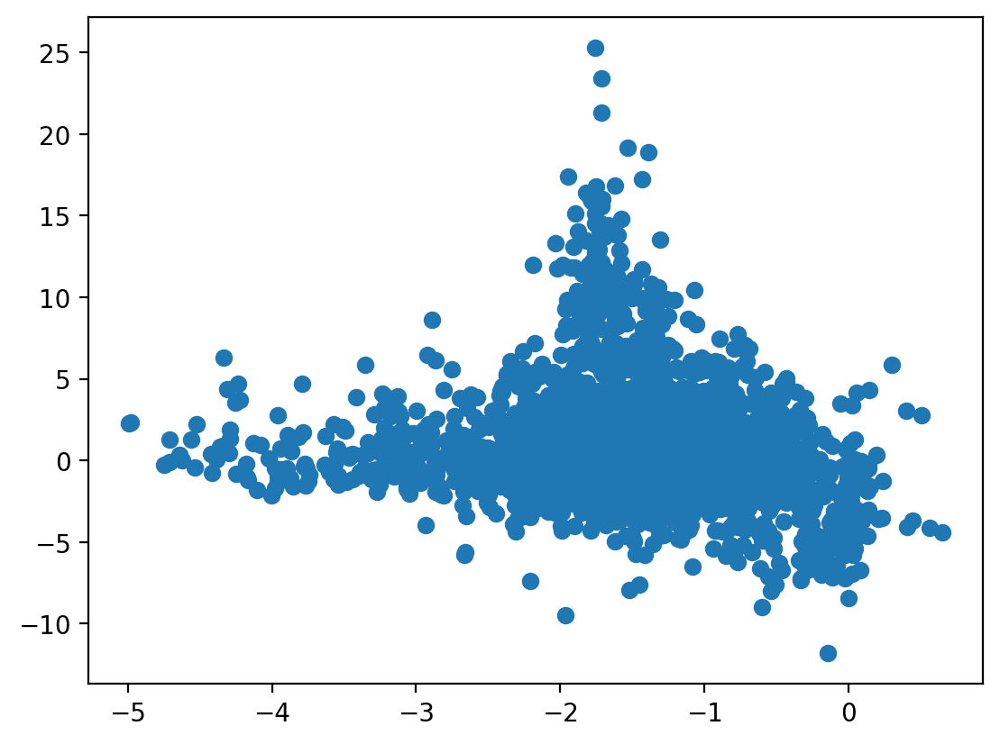

In [1340]:
plt.scatter(all_adf_stats,metrics_df['Total_Return (%)'])
plt.show()

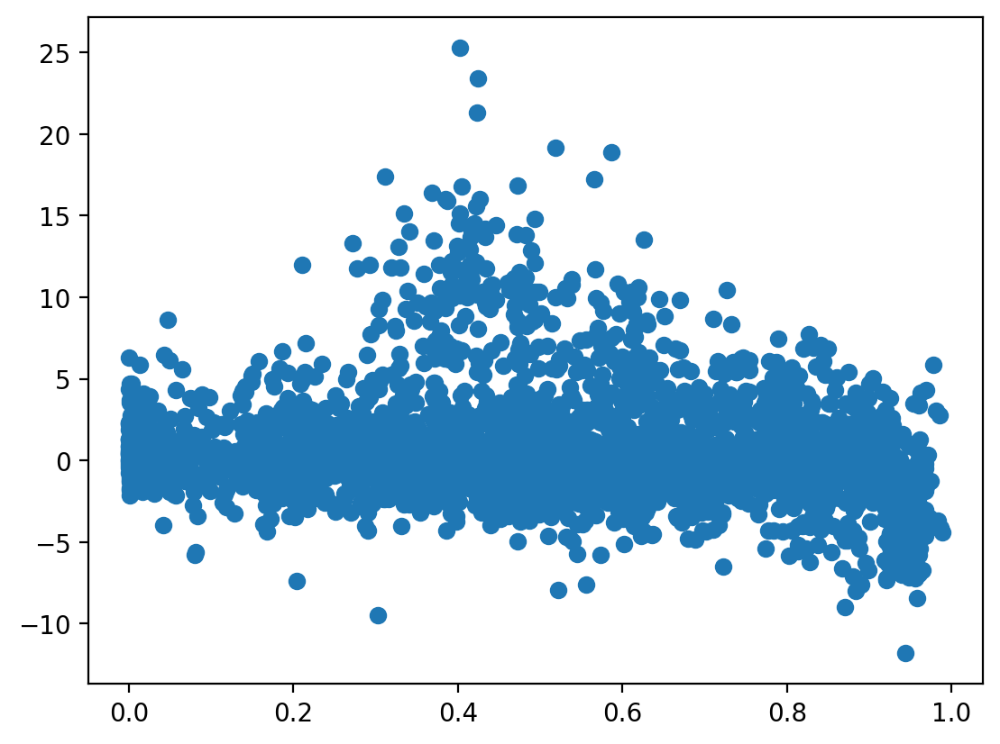

In [1341]:
plt.scatter(all_adf_pvals,metrics_df['Total_Return (%)'])
plt.show()

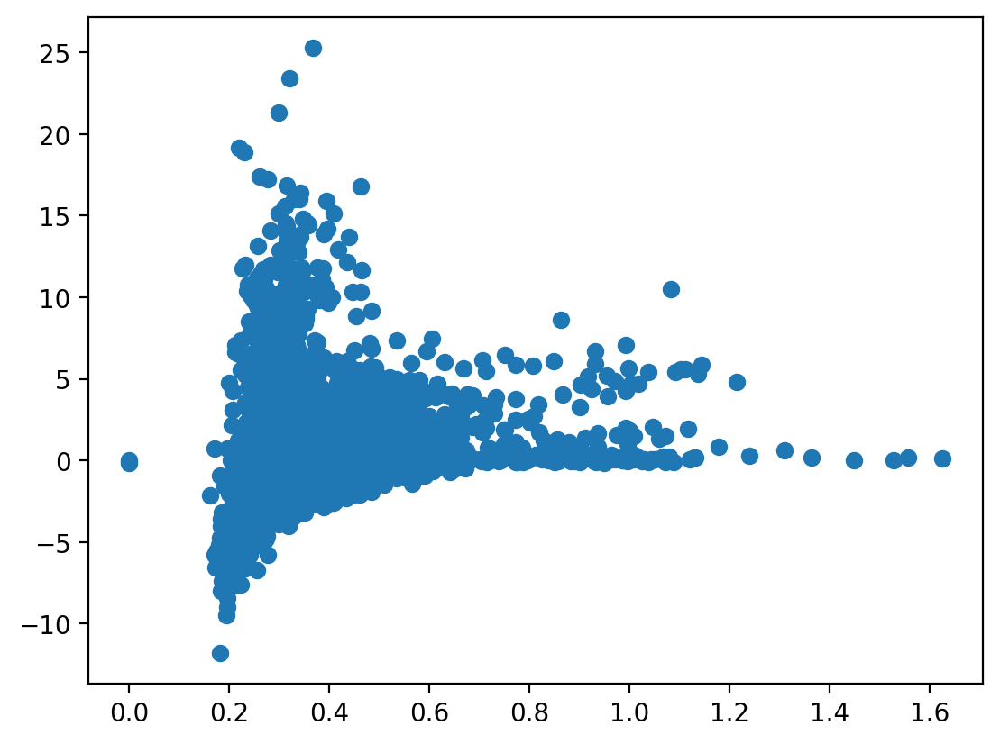

In [1344]:
plt.scatter(metrics_df['Avg_Risk_Reward'],metrics_df['Total_Return (%)'])
plt.show()

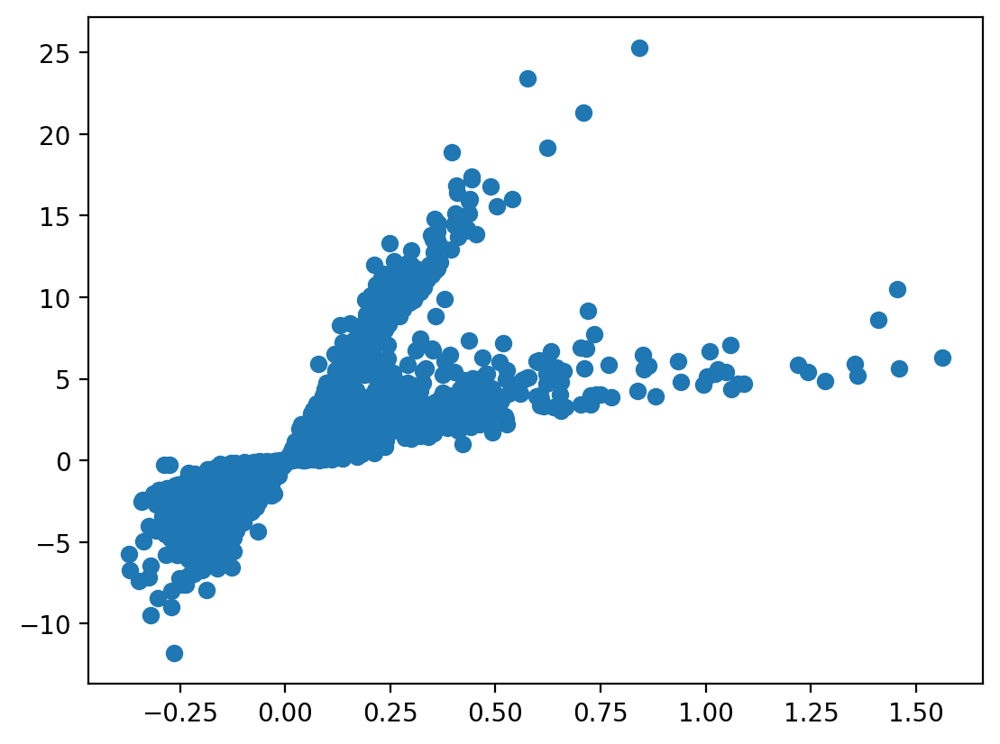

In [1345]:
plt.scatter(metrics_df['Sharpe Ratio'],metrics_df['Total_Return (%)'])
plt.show()

In [125]:
all_pnls.index(max(all_pnls))

10

In [126]:
pairs_ETF[all_pnls.index(max(all_pnls))]

array(['SQQQ', 'SLV'], dtype='<U4')

In [ ]:
threshold_corr = 0.99
pnl_high_corr = np.array(all_pnls)[np.array(all_correlations) > threshold_corr]
np.mean(pnl_high_corr)

297.72999999999513

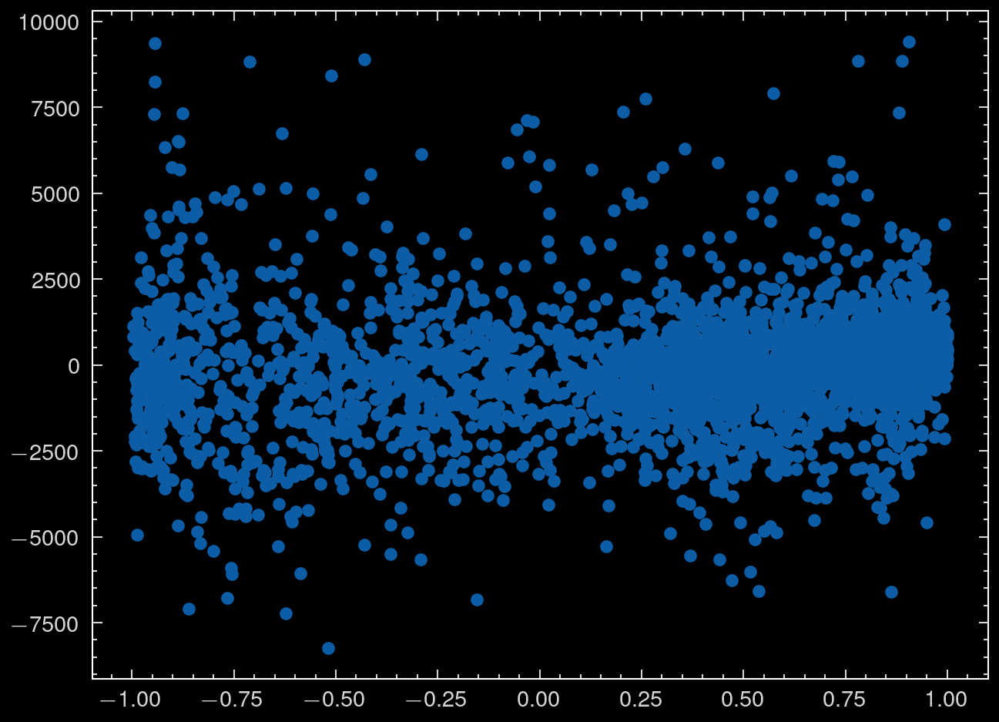

In [ ]:
plt.scatter(all_correlations,all_pnls)

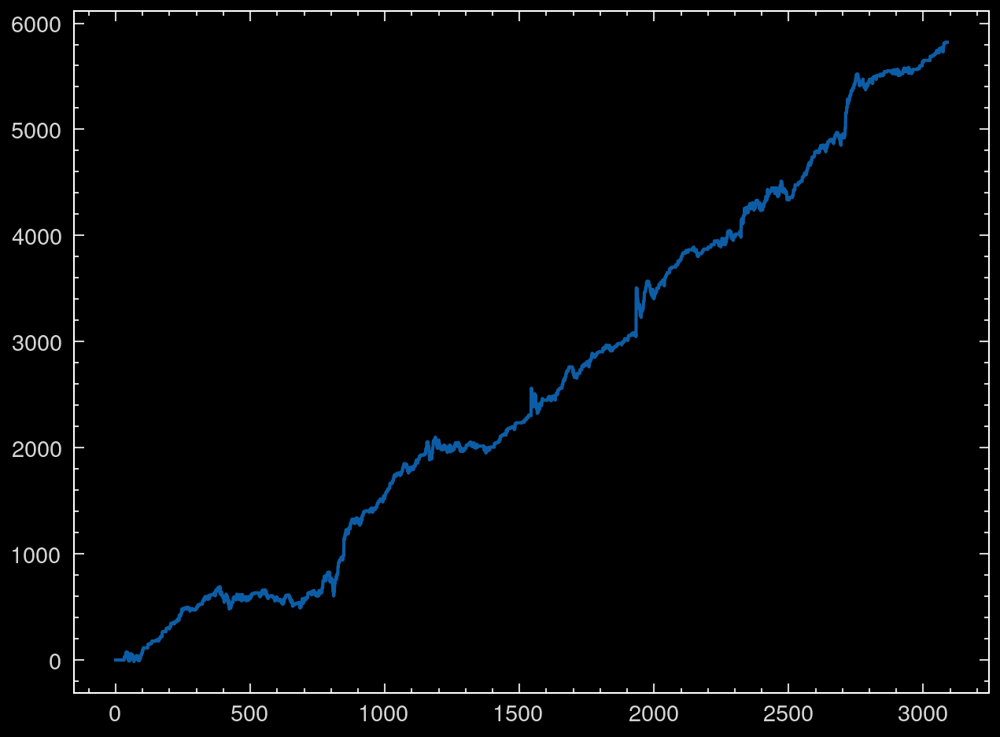

In [95]:
plt.plot(my_df['CumulativePnL'])

In [96]:
returns = my_df['CumulativePnL'].diff()
np.mean(returns),np.std(returns),np.mean(returns)/np.std(returns)

(1.8844998381353164, 19.152357777408966, 0.09839518768588197)

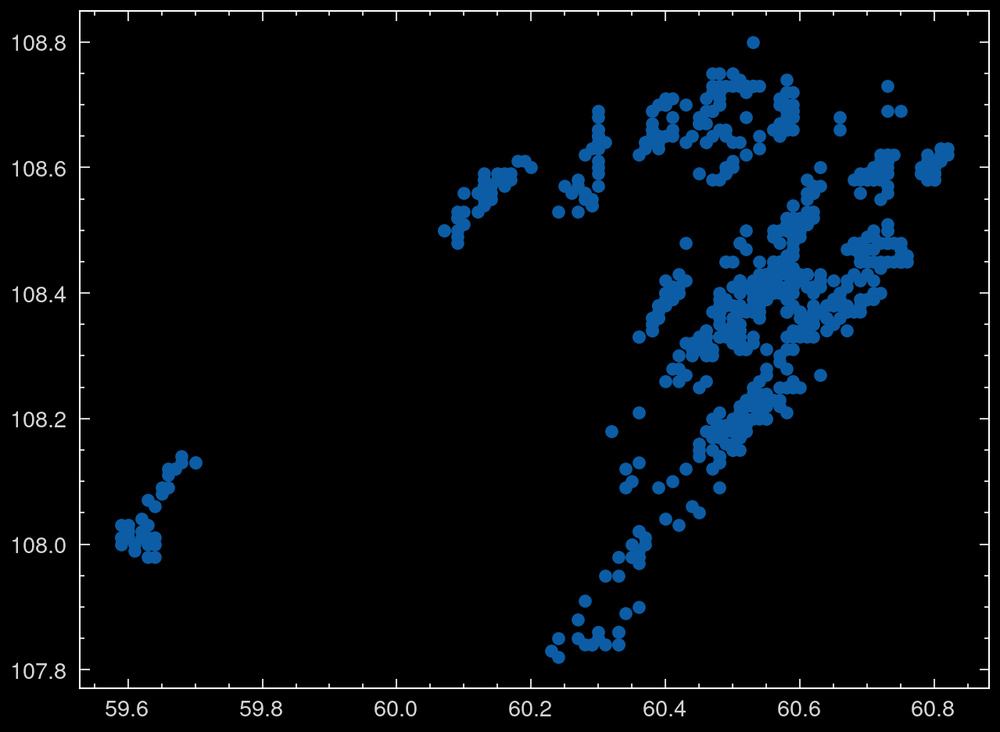

In [ ]:
plt.scatter(paired_prices[max_coint[1][0]][0],paired_prices[max_coint[1][0]][1])

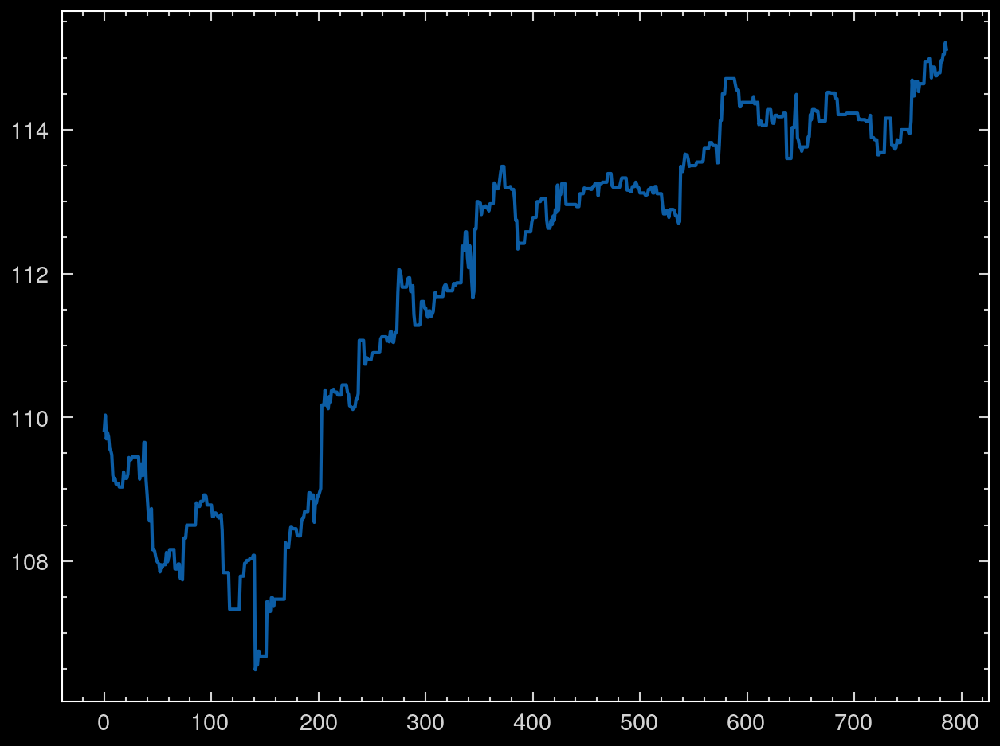

In [ ]:
plt.plot(np.array(close_prices3['PKW']))

In [ ]:
max_coint[1][0]

3116

In [ ]:
all_correlations[pair_index]

0.454585597796471

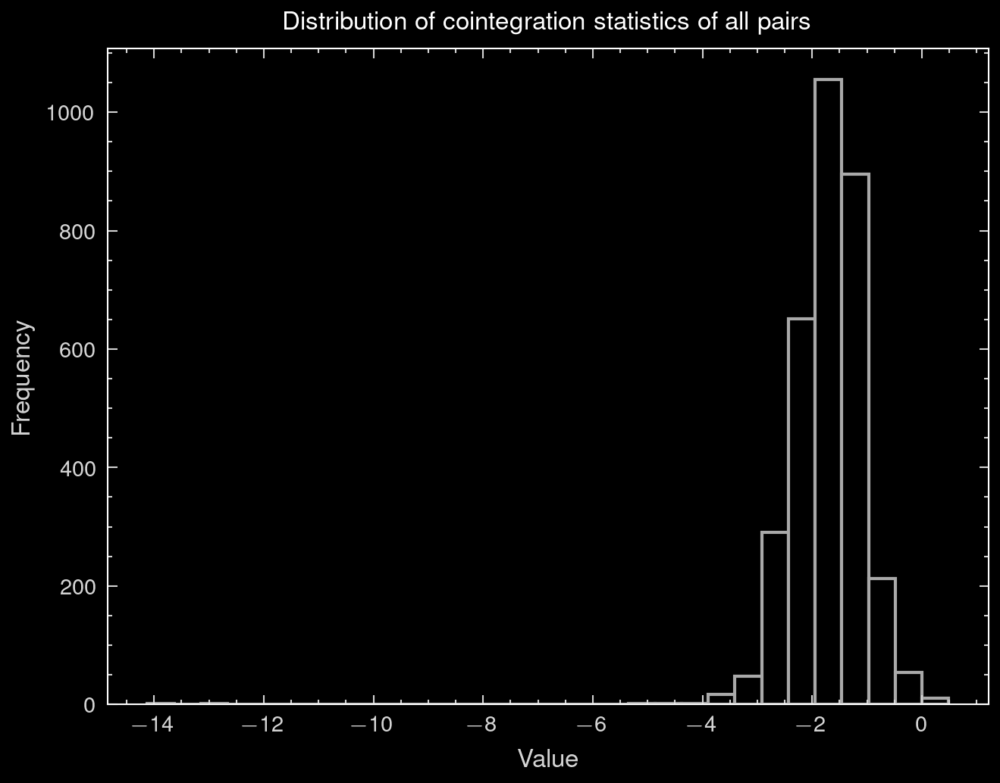

In [ ]:
plt.hist(all_adf_stats, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of cointegration statistics of all pairs", fontsize = 8);

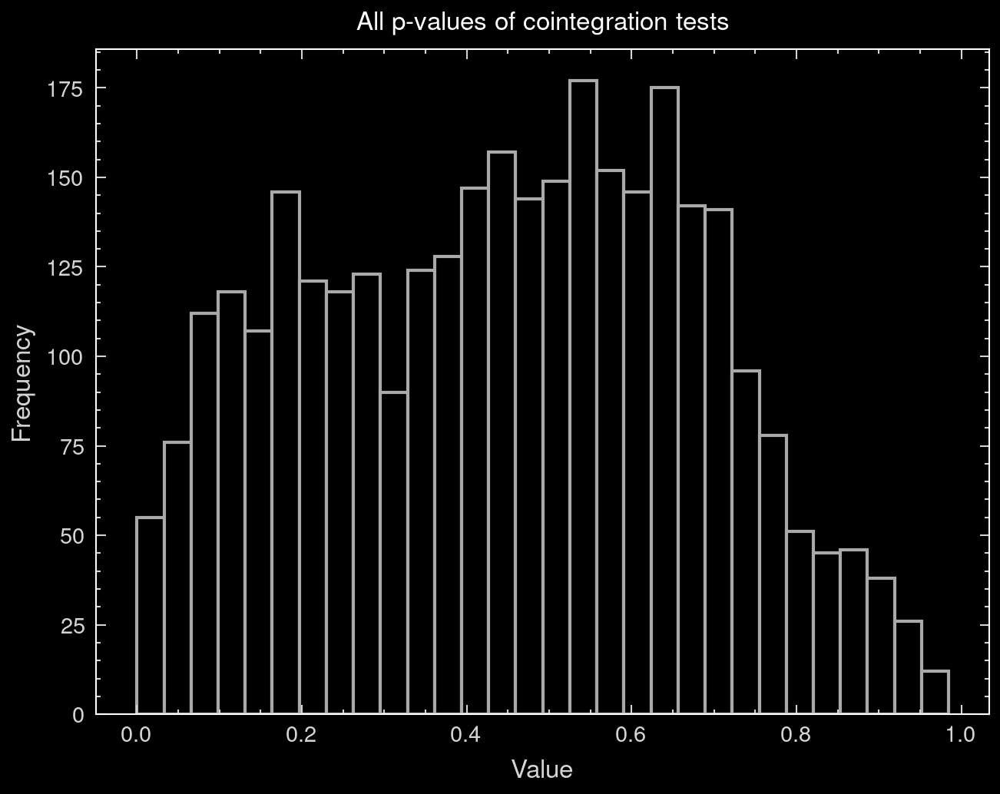

In [ ]:
plt.hist(all_adf_pvals, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("All p-values of cointegration tests", fontsize = 8);

In [ ]:
len(np.array(all_adf_pvals)[np.array(all_adf_pvals) < critical_alpha])

NameError: name 'critical_alpha' is not defined

In [ ]:
# Selecting pairs that have a p-value of the cointegration test below a fixed critical_alpha
critical_alpha = 0.1
half_lives_cointegrating_pairs = np.array(all_half_lifes)[np.array(all_adf_pvals) < critical_alpha]

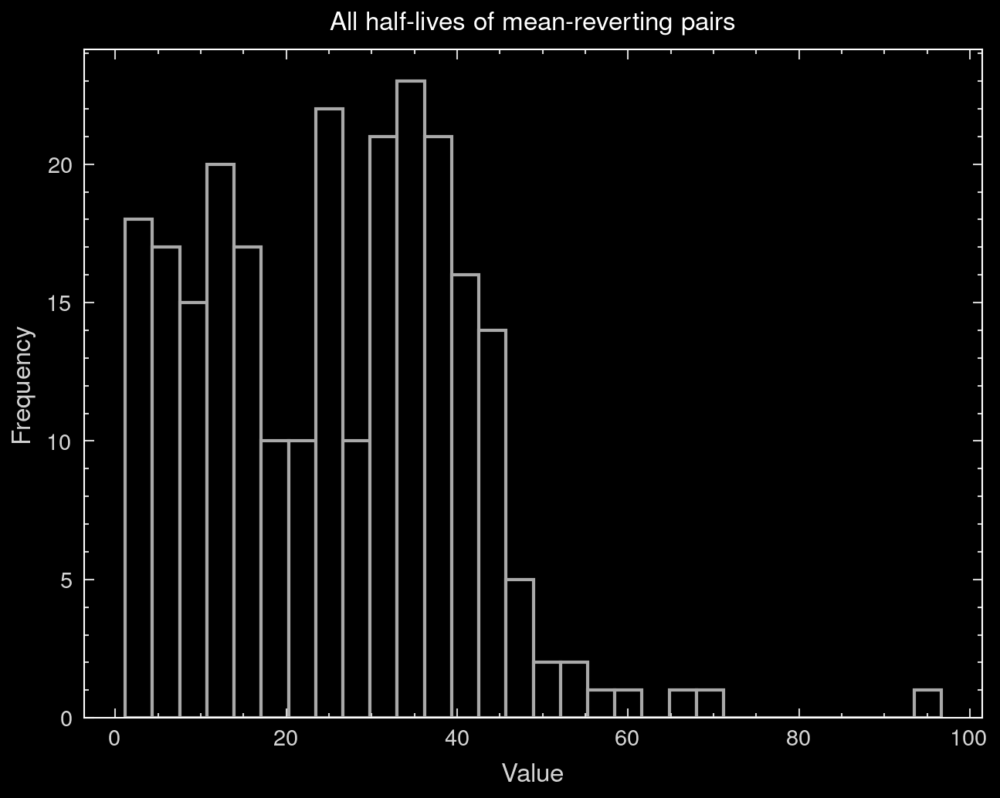

In [ ]:
plt.hist(half_lives_cointegrating_pairs, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("All half-lives of mean-reverting pairs", fontsize = 8);

In [ ]:
np.mean(half_lives_cointegrating_pairs)

25.613661872555397

### Rolling regression of the pairs

In this section, I compute the regression per day for all the pairs considered. This allows us to see how the linear relationship between a pair evolves from one day to the next.

In [ ]:
#Compute the number of data points per day
data_points_per_day = close_prices3.groupby(times_dt.normalize()).size()
np.mean(data_points_per_day)

35.77272727272727

In [ ]:
all_avg_change = []
all_std_change = []
all_slopes = []
all_abs_change = []
all_pct_changes = []

for pair in pairs_ETF:
    
    slopes = []
    for day in unique_days:
    
        prices1 = np.array(close_prices3[times_dt.normalize() == day][pair[0]])
        prices2 = np.array(close_prices3[times_dt.normalize() == day][pair[1]])
        slopes += [trd.ols_regression(prices1, prices2)[0]]
        
    all_slopes += [slopes]
    #Compute the percentage changes of the slope over the considered period
    percentage_changes = np.diff(slopes) / slopes[:-1]
    all_pct_changes += [percentage_changes]
    
    #Store the mean and standard deviation of percentage changes
    all_avg_change += [np.mean(percentage_changes)]
    all_std_change += [np.std(percentage_changes)]
    all_abs_change += [np.mean(abs(percentage_changes))]

In [ ]:
all_pct_changes_flat = [item for sublist in all_pct_changes for item in sublist]
len(all_pct_changes_flat)

66360

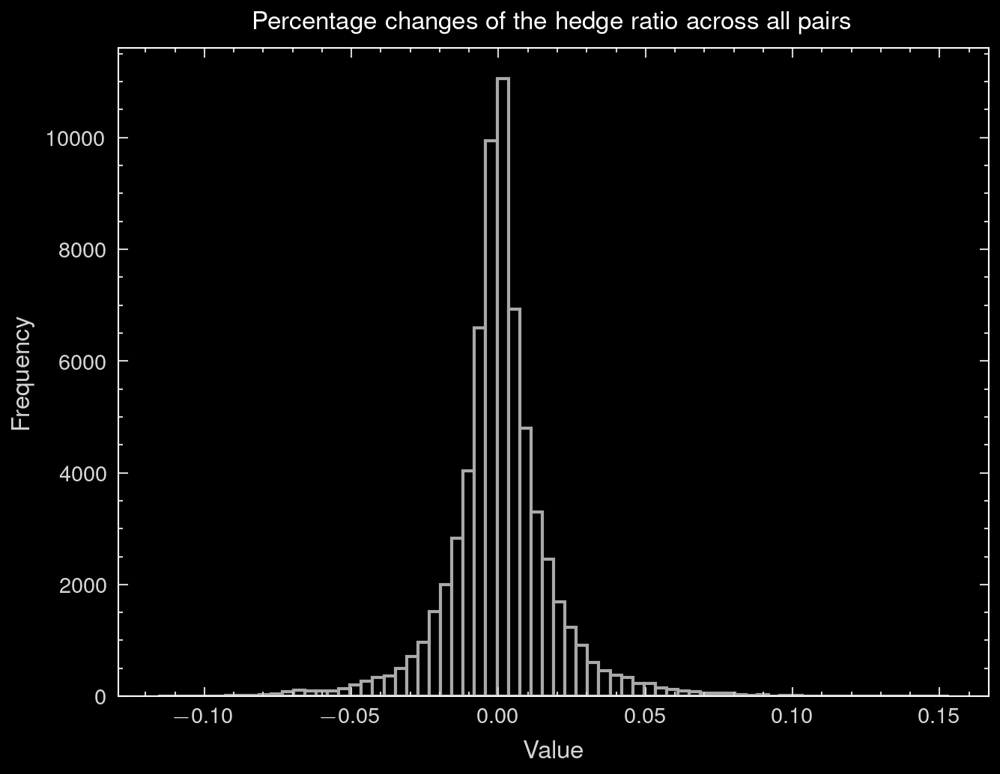

In [ ]:
plt.hist(all_pct_changes_flat, bins = 70, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Percentage changes of the hedge ratio across all pairs", fontsize = 8);

In [ ]:
# Daily changes of the slope by more than 7% are very rare

np.quantile(all_pct_changes_flat, [0.01,0.99])

array([-0.05233217,  0.05523053])

In [ ]:
max(all_pct_changes_flat), min(all_pct_changes_flat)

(0.15329224635269292, -0.11584730105303295)

In [ ]:
# 20 largest and 20 smallest absolute percentage changes of the slope (over all pairs)
trd.n_largest(all_pct_changes_flat,10)[0], trd.n_largest(-np.array(all_pct_changes_flat),10)[0]

([0.023365932628047033,
  0.0231296967843032,
  0.022927233885211677,
  0.02263434213166943,
  0.02262965070682671,
  0.02246428462435148,
  0.022455546403137263,
  0.022340317858107396,
  0.022081095906633794,
  0.0220557292711571],
 [0.026298852655441254,
  0.026254594822890925,
  0.02586125595488123,
  0.02578655971810767,
  0.025577699940554234,
  0.025033469030428353,
  0.024647458937039367,
  0.024174111628400566,
  0.024044234097324656,
  0.02367230653146701])

In [ ]:
all_pct_changes_flatNP = np.array(all_pct_changes_flat)

# Proportion of elements below a certain threshold
threshold = 0.1
proportion_below = np.mean(all_pct_changes_flatNP < -threshold)  # Elements below threshold
print(f"Proportion below {-threshold}: {proportion_below}")

# Proportion of elements above a certain threshold
proportion_above = np.mean(all_pct_changes_flatNP > threshold)  # Elements above threshold
print(f"Proportion above {threshold}: {proportion_above}")

Proportion below -0.1: 6.027727546714889e-05
Proportion above 0.1: 0.0004972875226039783


In [ ]:
threshold = 0.1
proportion_between = np.mean((all_pct_changes_flatNP < threshold) & (all_pct_changes_flatNP > -threshold))
proportion_between

0.9994424352019289

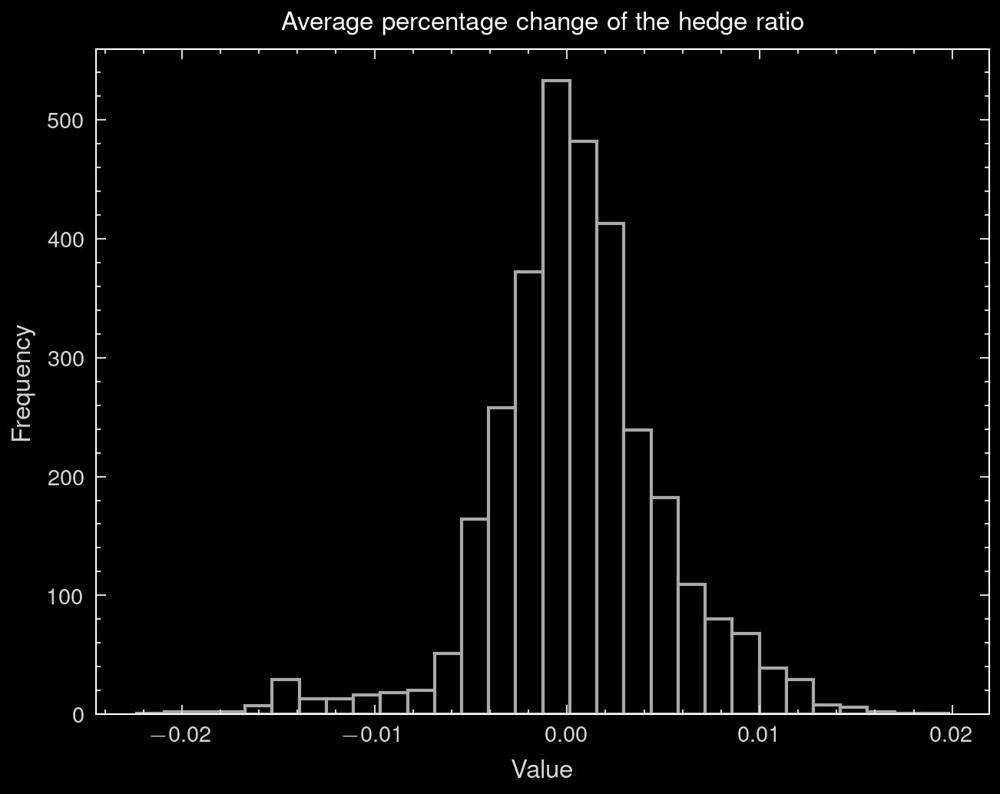

In [ ]:
# Looking at the data per pair: 'all_avg_change' contains the average change of the slope for each pair over the period considered. There are as many elements in this list as there are pairs
plt.hist(all_avg_change, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Average percentage change of the hedge ratio", fontsize = 8);

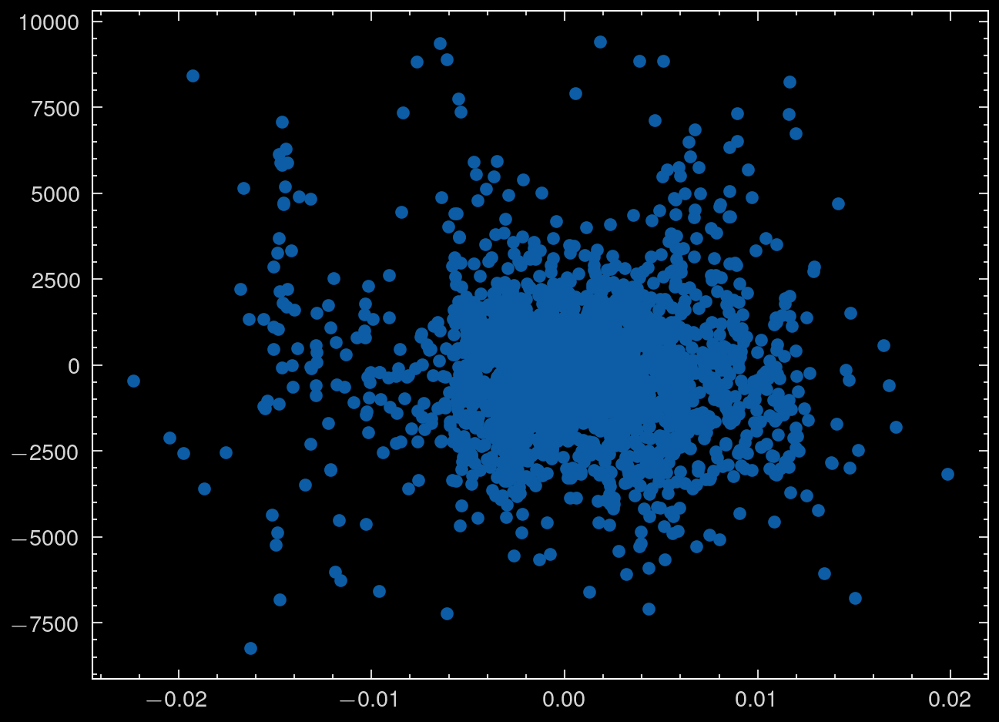

In [ ]:
plt.scatter(all_avg_change,all_pnls)

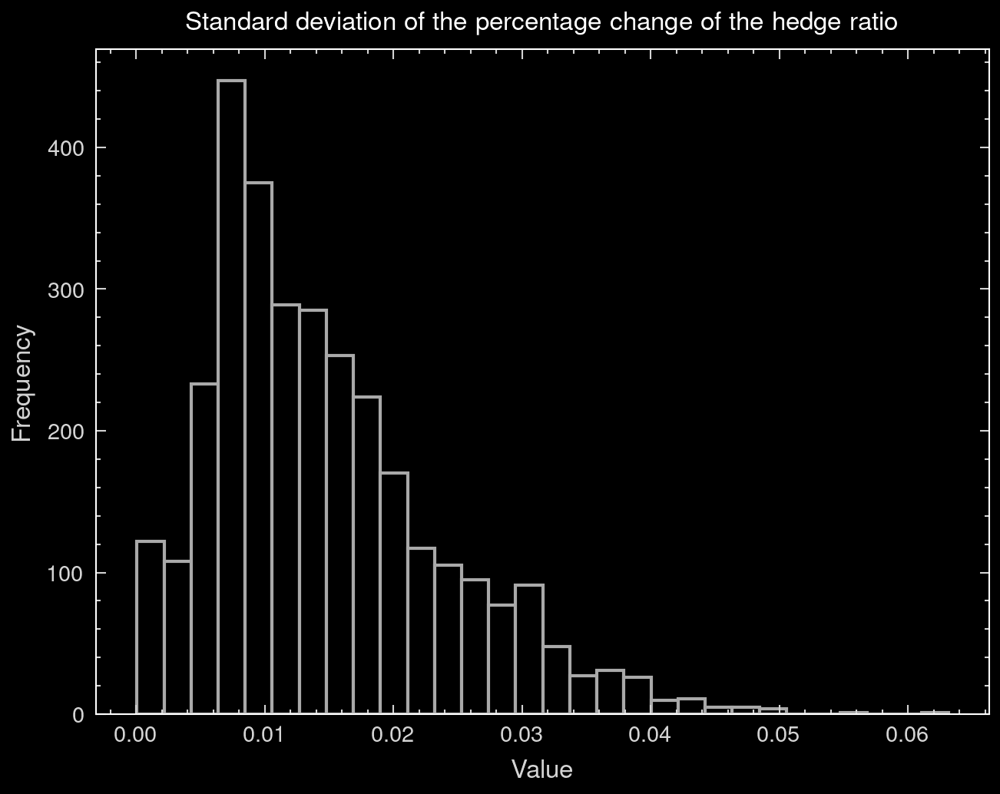

In [ ]:
plt.hist(all_std_change, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Standard deviation of the percentage change of the hedge ratio", fontsize = 8);

In [ ]:
np.mean(all_std_change), np.std(all_std_change)

(0.014598362296052667, 0.009036867266569751)

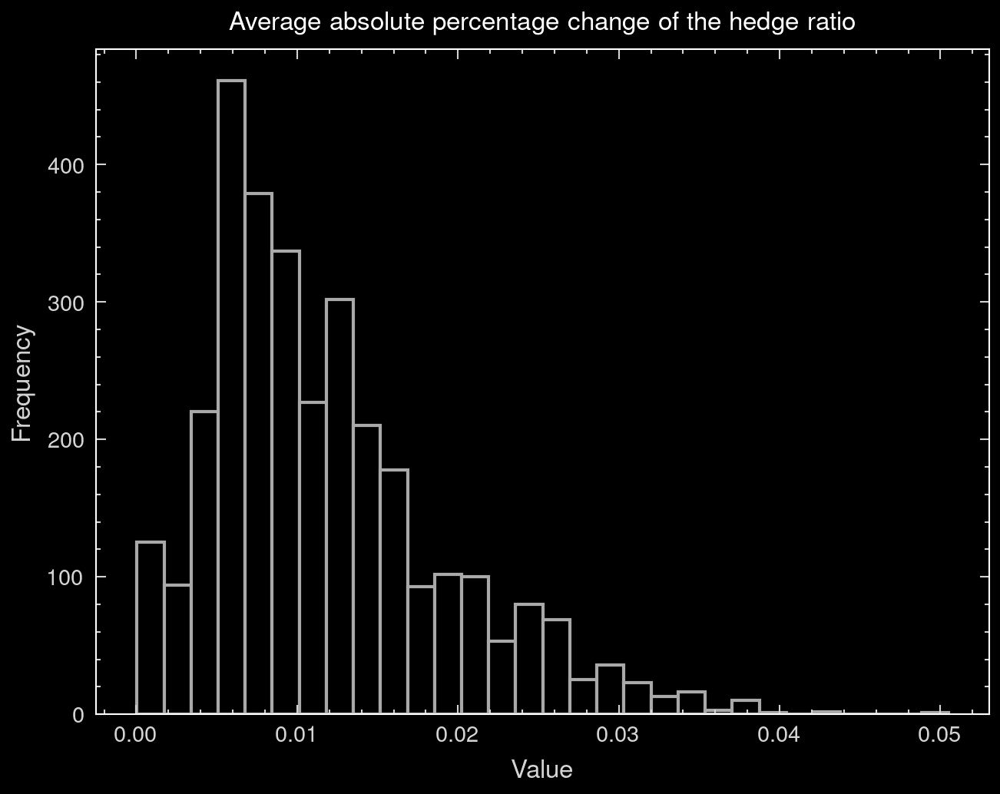

In [ ]:
plt.hist(all_abs_change, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Average absolute percentage change of the hedge ratio", fontsize = 8);

In [ ]:
trd.n_largest(-np.array(all_abs_change),10)

[[-3.971105990495812e-05,
  -4.635419381529913e-05,
  -4.6501475241714465e-05,
  -5.2962117886941445e-05,
  -7.054565292730104e-05,
  -9.688528658796639e-05,
  -0.00012801278267078194,
  -0.0002532454615435532,
  -0.0002708723557161035,
  -0.00027649187403243884],
 [2496, 2805, 2613, 2511, 1934, 1990, 361, 2871, 3150, 2804]]

In [ ]:
threshold_change = 0.001
pnl_low_change = np.array(all_pnls)[np.array(all_abs_change) < threshold_change]
np.mean(pnl_low_change), np.min(pnl_low_change), np.max(pnl_low_change)

(99.3133999999993, -228.8600000000115, 823.0999999999767)

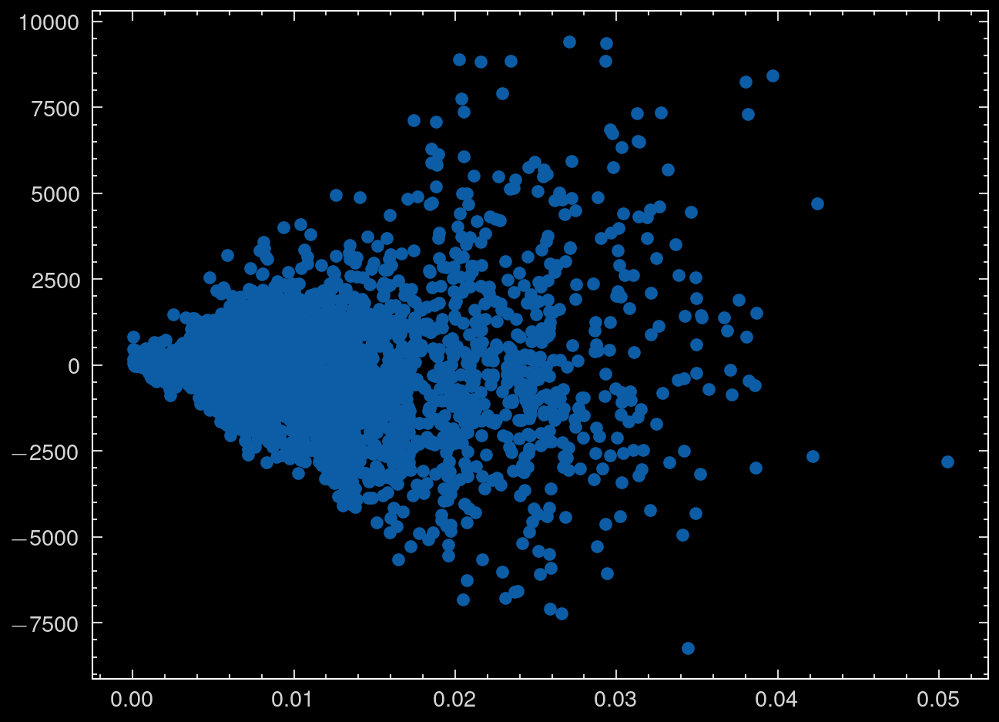

In [ ]:
plt.scatter(all_abs_change,all_pnls)

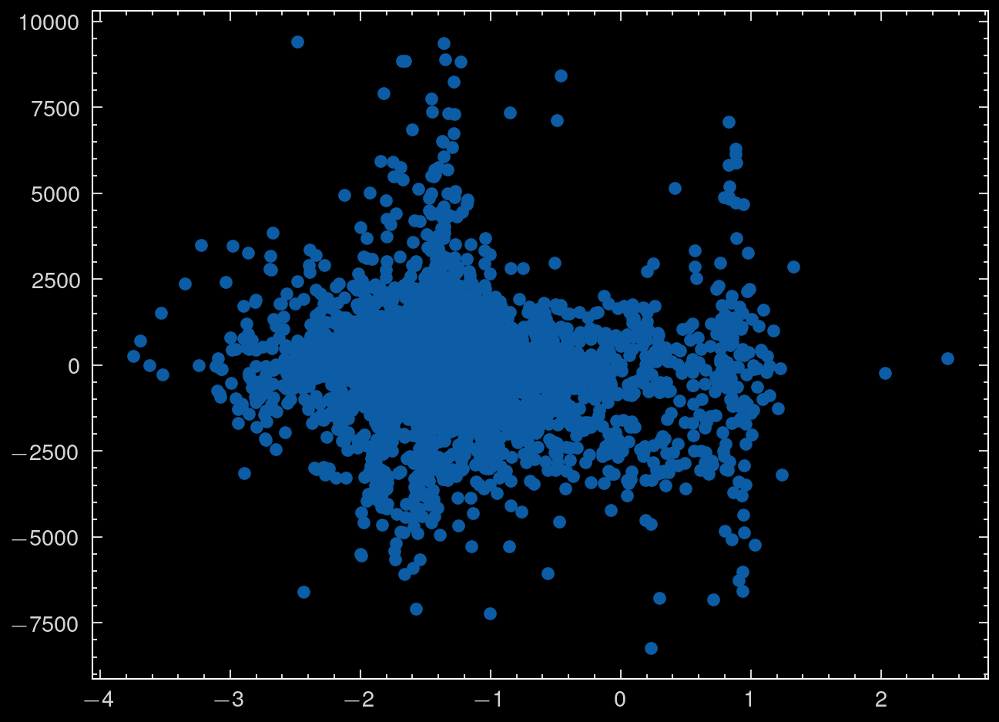

In [ ]:
plt.scatter(all_adf_stats,all_pnls)

In the cell below, I evaluate two things:
1. Whether the prices cross the regression line of any particular day, which means that there is "partial mean reversion" and a position would have been profitable. The variable `nb_days_no_return` captures the number of days for each pair such that the future prices never cross the regression line of that particular day.
2. If prices do cross the regression line, how many days does it take? This is captured by the variable `avg_return_time`.

In [ ]:
lookahead_window = 5 #Make sure all of the computations have enough future data points to use 
nb_days_no_return = []
all_avg_return_times = []
pair_indices = list(range(len(paired_prices)))
#pair_indices = adf_max[1]


id_pair=0
for pair in pairs_ETF:
    slopes = all_slopes[id_pair]
    all_props = []

    for i in range(len(slopes)):
        all_prop_i = []
        for j in range(1,len(slopes)-i):
            prices1 = np.array(close_prices3[times_dt.normalize() == unique_days[i+j]][pair[0]])
            prices2 = np.array(close_prices3[times_dt.normalize() == unique_days[i+j]][pair[1]])
            prop_one_side = trd.linear_prediction_errors(slopes[i], 0, prices1, prices2)[1]
            all_prop_i += [prop_one_side]
        all_props += [all_prop_i]
        
    
    all_first_pos_prop = []

    for i in range(len(all_props) - lookahead_window):
        first_positive_prop = next((i for i, x in enumerate(all_props[i]) if x != 0), None)
        all_first_pos_prop += [first_positive_prop]

    nb_days_no_return += [all_first_pos_prop.count(None)]
    filtered_all_first = [x for x in all_first_pos_prop if x is not None]
    avg_return_time = np.mean(filtered_all_first)
    all_avg_return_times += [avg_return_time]
    id_pair+=1

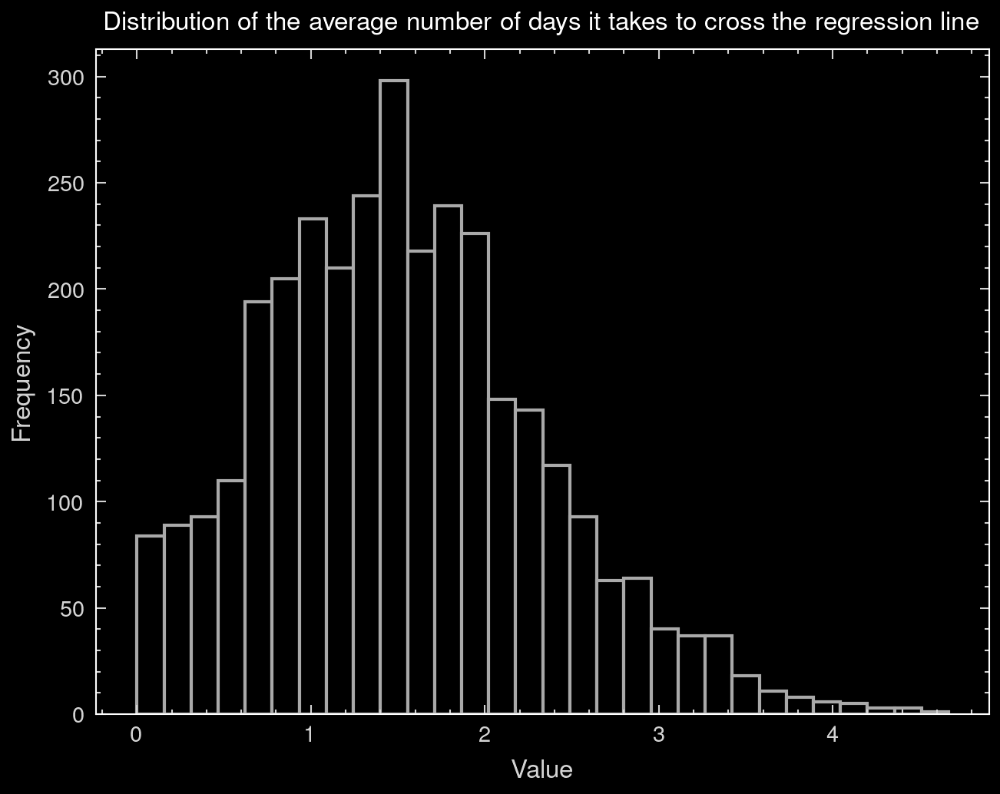

In [ ]:
plt.hist(all_avg_return_times, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of the average number of days it takes to cross the regression line", fontsize = 8);

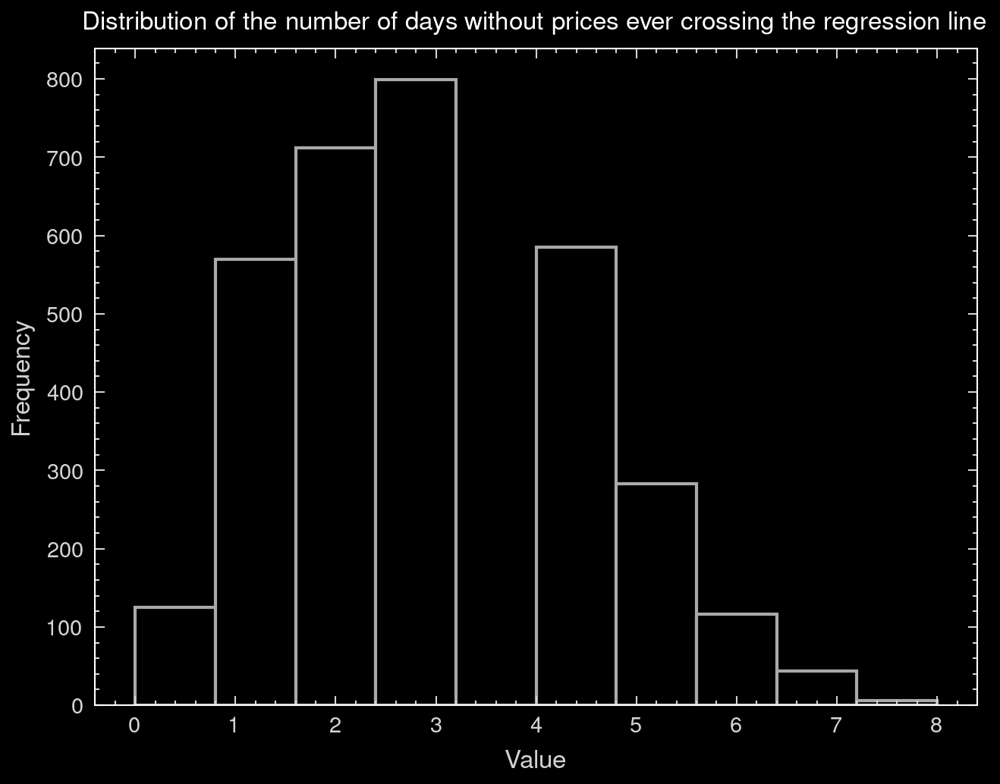

In [ ]:
plt.hist(nb_days_no_return, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of the number of days without prices ever crossing the regression line", fontsize = 8);

In [ ]:
np.mean(nb_days_no_return)

2.838888888888889

In [ ]:
no_ret = np.array(nb_days_no_return)
len(no_ret[no_ret == 0])

125

In [ ]:
pairs_ETF[np.where(no_ret == 0)[0]]

array([['SPY', 'VTHR'],
       ['IWM', 'FNDA'],
       ['IWM', 'IWC'],
       ['IJH', 'VBR'],
       ['IJH', 'VIOO'],
       ['IJH', 'IVOG'],
       ['IJH', 'IVOV'],
       ['RSP', 'DIA'],
       ['SCHX', 'SCHB'],
       ['SCHX', 'IWB'],
       ['SCHX', 'IWV'],
       ['SCHX', 'VTHR'],
       ['SCHG', 'VOOG'],
       ['VOO', 'VV'],
       ['VOO', 'MGC'],
       ['VOO', 'VTHR'],
       ['IJR', 'FNDA'],
       ['IJR', 'DES'],
       ['IJR', 'VIOO'],
       ['IJR', 'VIOG'],
       ['IJR', 'IWC'],
       ['IVV', 'IWV'],
       ['IVV', 'VTHR'],
       ['SCHB', 'ITOT'],
       ['SCHB', 'IWB'],
       ['SCHB', 'IWV'],
       ['SCHB', 'VTHR'],
       ['VTI', 'VV'],
       ['VTI', 'VTHR'],
       ['IVW', 'VOOG'],
       ['SCHA', 'VIOO'],
       ['SCHA', 'VIOG'],
       ['SCHA', 'IVOV'],
       ['VTV', 'VONV'],
       ['VTV', 'DLN'],
       ['IWD', 'SCHV'],
       ['FNDX', 'IWS'],
       ['FNDX', 'FNDB'],
       ['FNDX', 'IJJ'],
       ['IWR', 'FNDB'],
       ['IWR', 'IJJ'],
       ['ITOT', 'IWB

In [ ]:
#Measuring cointegration of the slope
from statsmodels.tsa.stattools import adfuller

all_pval_slopes = []
all_ADF_slopes = []

for i in range(len(all_slopes)):
    result = adfuller(all_slopes[i])
    all_ADF_slopes += [result[0]]
    all_pval_slopes += [result[1]]

ValueError: Invalid input, x is constant

In [ ]:
result[1]

0.34195447749567875

Text(0.5, 1.0, 'ADF statistic measuring stationarity of the slope')

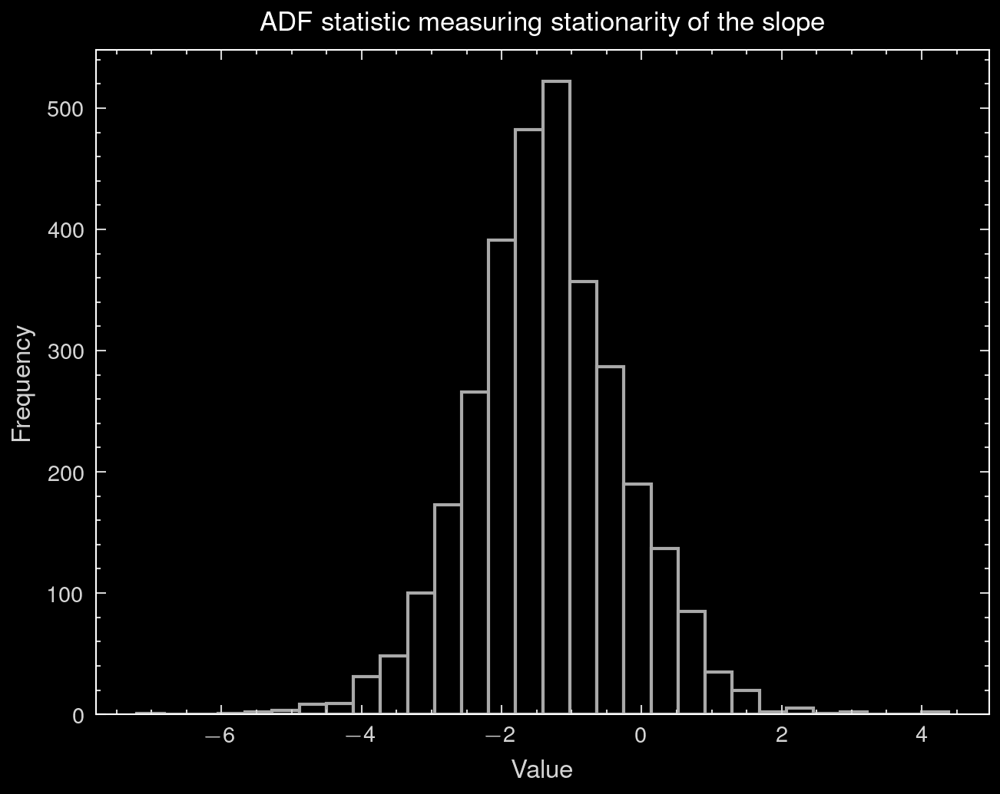

In [ ]:
plt.hist(all_ADF_slopes, bins = 30, edgecolor = 'darkgray', color = 'black', alpha = 1);
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("ADF statistic measuring stationarity of the slope")

Text(0.5, 1.0, 'Significance of the test measuring stationarity of the slope')

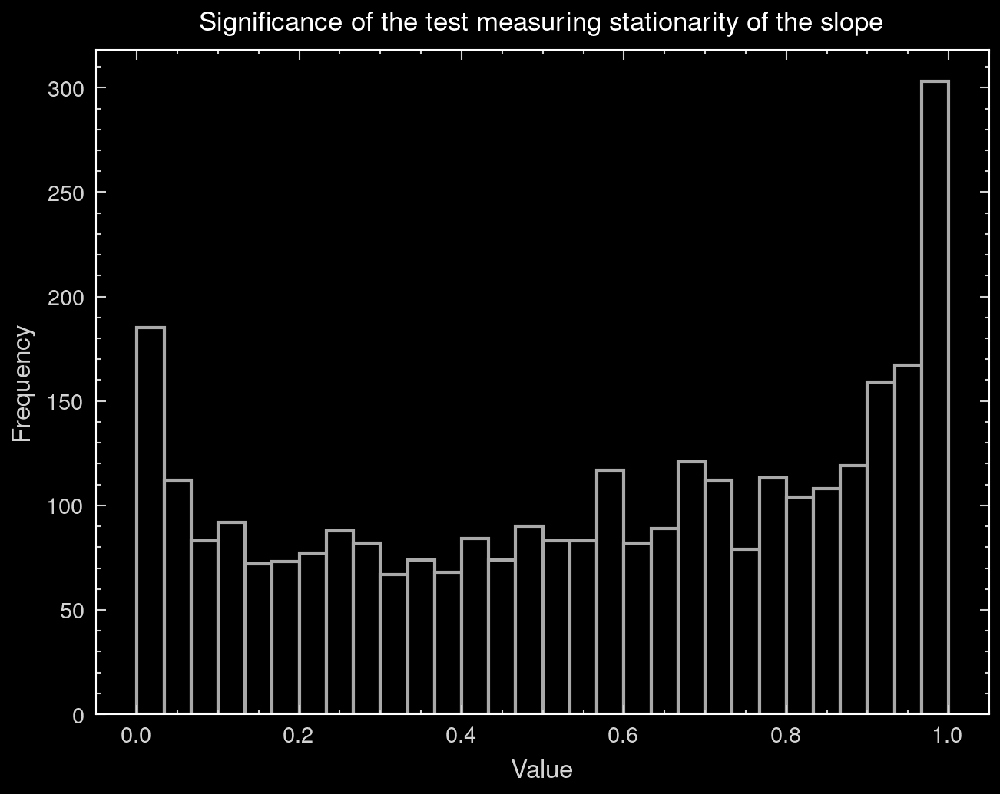

In [ ]:
plt.hist(all_pval_slopes, bins = 30, edgecolor = 'darkgray', color = 'black', alpha = 1);
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Significance of the test measuring stationarity of the slope")

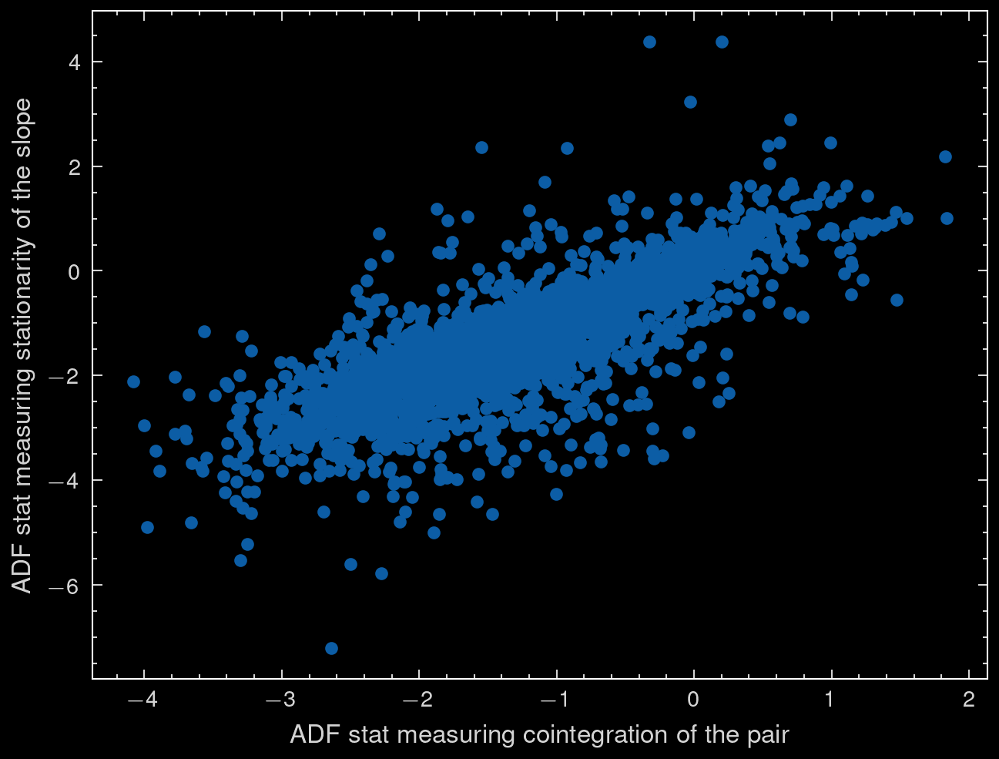

In [ ]:
plt.scatter(all_adf_stats, all_ADF_slopes)
plt.xlabel("ADF stat measuring cointegration of the pair", fontsize = 8);
plt.ylabel("ADF stat measuring stationarity of the slope", fontsize = 8);

### Backtest

In [ ]:
net_pairs = []
my_pairs = pairs_ETF
#my_pairs = pairs_by_sector
all_min_net = []

# List to store performance metrics for each pair
metrics_list = []
lookback = 5
budget = 50000

for pair in my_pairs:

    last_portfolio = [0,0]
    last_prices_portfolio = [0,0]
    last_Rpnl = 0
    last_net = 0
    last_side = 0
    last_commissions = 0
    last_length_open = 0
    all_last_net = []
    all_net = [0]
    all_res = pd.DataFrame()
    net_worth = budget
    all_spreads = []
    all_rescaled_spreads = []
    all_nb_trades = []
    status_list = []



    prices1 = np.array(close_prices3[times_dt.normalize() == unique_days[0]][pair[0]])
    prices2 = np.array(close_prices3[times_dt.normalize() == unique_days[0]][pair[1]])

    last_hedge_ratio = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
    all_last_hedge_ratios = [last_hedge_ratio]
    
    mean_hedge_ratio = last_hedge_ratio


    i=0
    for day in unique_days[1:]:
        prices1 = np.array(close_prices3[times_dt.normalize() == day][pair[0]])
        prices2 = np.array(close_prices3[times_dt.normalize() == day][pair[1]])
        
        
        
        res_sim = trd.simulate_trading_rescaled_e_cst(price_list1=prices1,
        price_list2=prices2,
        error_rate=0.01,
        money_invested=net_worth,
        leave_profit=100000,
        leave_loss=-100000,
        startingStep=1,
        min_gain=25,
        c_edge=0.0,
        max_open=60,
        temp_loss=100,
        memory_es=30,
        ratio_open_close=1,
        hedge_ratio=[mean_hedge_ratio,0],
        init_portfolio=last_portfolio,
        prices_init_portfolio=last_prices_portfolio,
        init_Rpnl=last_Rpnl,
        init_net=last_net,
        init_side=last_side,
        init_commissions=last_commissions,
        init_length_open=last_length_open,
        max_trades=1)
        
        all_net += list(res_sim.res_df['CumulativePnL'])
        all_res = pd.concat([all_res, res_sim.res_df])
        all_spreads += res_sim.all_es
        all_rescaled_spreads += res_sim.rescaled_es
        all_nb_trades += [res_sim.nb_trades]
        status_list += res_sim.all_statuses
        
        last_portfolio = np.array(res_sim.res_df[['Shares1','Shares2']])[-1]
        if last_portfolio[0] != 0 and last_portfolio[1] != 0:
            last_prices_portfolio = np.array(res_sim.res_df[['EntryPrice1','EntryPrice2']])[-1]
        else:
            last_prices_portfolio = [0,0]
        
        last_Rpnl = np.array(res_sim.res_df['RealizedPnL'])[-1]
        last_net = np.array(res_sim.res_df['CumulativePnL'])[-1]
        net_worth = net_worth + last_net
        last_side = np.array(res_sim.res_df['Side'])[-1]
        last_length_open = res_sim.length_open
        last_commissions = res_sim.commissions

        last_hedge_ratio = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
        all_last_hedge_ratios += [last_hedge_ratio]
        if res_sim.res_df['PositionsStatus'].iloc[-1] != 'open':
            mean_hedge_ratio = np.mean(all_last_hedge_ratios[max(0, i - lookback + 1):i + 1])

        
        i += 1

    all_res['Spread'] = all_spreads
    all_res['Rescaled_Spread'] = all_rescaled_spreads
    metrics_pair = trd.compute_trading_metrics(all_res, initial_balance=budget)
    metrics_pair['Pair'] = pair  # Add pair identifier

    metrics_list.append(metrics_pair)

# Convert metrics list to a DataFrame
metrics_df = pd.DataFrame(metrics_list)

# Save results to CSV
metrics_df.to_csv("pair_trading_metrics.csv", index=False)

# Display the top performing pairs based on total return
top_pairs = metrics_df.sort_values(by="Total_Return (%)", ascending=False).head(10)
top_pairs

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
2373,50000,52193.32,4.38664,68.131868,-50.630925,3,0.236229,19,19,0,100.0,NaN,"[IVE, IWC]"
3179,50000,52009.96,4.01992,67.213115,-0.739700,2,0.704670,20,20,0,100.0,NaN,"[VOOV, IWC]"
2009,50000,51904.90,3.80980,58.169935,-0.586349,2,0.872483,21,21,0,100.0,NaN,"[VYM, IWC]"
3226,50000,51891.08,3.78216,75.609756,-35.547410,2,0.145279,20,20,0,100.0,NaN,"[IWC, VTHR]"
2607,50000,51883.14,3.76628,43.750000,-0.559683,2,0.920868,21,21,0,100.0,NaN,"[IWO, PDP]"
2639,50000,51873.14,3.74628,71.782178,-1.056640,3,0.654341,19,19,0,100.0,NaN,"[DVY, IWC]"
308,50000,51823.16,3.64632,68.253968,-0.698536,3,0.659225,20,19,1,95.0,0.881325,"[SCHD, IWC]"
3003,50000,51821.63,3.64326,46.511628,-0.794352,2,0.927859,21,21,0,100.0,NaN,"[DES, IWC]"
1218,50000,51796.09,3.59218,71.219512,-1.250907,3,0.551900,19,19,0,100.0,NaN,"[SPLV, IWC]"
1806,50000,51787.98,3.57596,69.021739,-0.915700,2,0.649314,19,19,0,100.0,NaN,"[IWN, PDP]"


In [ ]:
ETFmembers[ETFmembers['Ticker']=='IWN'], ETFmembers[ETFmembers['Ticker']=='PDP']

(                                ETF Name Ticker   Category
 70  iShares Russell 2000 Value Index ETF    IWN  Small-Cap,
                     ETF Name Ticker Category
 58  Invesco DWA Momentum ETF    PDP  Mid-Cap)

In [ ]:
metrics_df['Total_Return (%)'].mean(), metrics_df['Total_Return (%)'].std(), metrics_df['Total_Return (%)'].min(), metrics_df['Total_Return (%)'].max()

(0.5996980432098753,
 0.9033904534533647,
 -2.1764000000000117,
 4.386639999999975)

In [ ]:
metrics_df.sort_values(by="Total_Return (%)", ascending=False).tail(10)

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair
2501,50000,49158.69,-1.68262,93.485915,-2.702605,4,-0.263349,11,5,6,45.454545,0.320123,"[VO, DVY]"
1925,50000,49153.77,-1.69246,90.962672,-1.692460,1,-0.252817,14,8,6,57.142857,0.324631,"[IWP, MGK]"
2132,50000,49107.42,-1.78516,92.471042,-2.713421,2,-0.236448,13,8,5,61.538462,0.270803,"[IJK, SDY]"
2615,50000,49107.30,-1.78540,92.429022,-2.443886,2,-0.293555,8,2,6,25.000000,0.296322,"[DVY, VOE]"
1176,50000,49106.52,-1.78696,91.393443,-3.139445,2,-0.209898,14,9,5,64.285714,0.261166,"[SPLV, IJK]"
1235,50000,49008.05,-1.98390,92.500000,-2.556527,3,-0.256384,12,7,5,58.333333,0.237554,"[SCHA, IWP]"
1535,50000,49000.22,-1.99956,92.254733,-2.255475,2,-0.319282,14,7,7,50.000000,0.276297,"[FNDX, IWP]"
1946,50000,48932.31,-2.13538,90.811966,-2.805488,2,-0.244788,13,9,4,69.230769,0.156441,"[IWP, RPV]"
2752,50000,48921.99,-2.15602,87.848101,-3.059177,2,-0.258210,15,11,4,73.333333,0.156001,"[RPG, DES]"
1916,50000,48879.94,-2.24012,91.575092,-2.267583,2,-0.307842,14,7,7,50.000000,0.324755,"[IWP, VUG]"


## Commodities

<div style="border: 2px solid red; padding: 10px; background-color: #ffcccc;">
    <strong>⚠️ WORK IN PROGRESS</strong> 
</div>

### Downloading data

## Forex

### Downloading data

In [811]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2023, 1, 1)
end = datetime.datetime(2023, 10, 1)
eurusd_data = web.DataReader("DEXCHUS", "fred", start, end)
eurusd_data

,DEXCHUS
DATE,
2023-01-02,NaN
2023-01-03,6.9135
2023-01-04,6.8875
2023-01-05,6.8800
2023-01-06,6.8370
...,...
2023-09-25,7.3110
2023-09-26,7.3100
2023-09-27,7.3105


In [929]:
all_currency_pairs = pd.read_csv("CurrencyPairs.csv")
all_currency_pairs

,CurrencyPair
0,EURUSD=X
1,USDJPY=X
2,GBPUSD=X
3,AUDUSD=X
4,USDCAD=X
5,USDCHF=X
6,NZDUSD=X
7,EURJPY=X
8,GBPJPY=X
9,EURGBP=X


In [949]:
# Download historical data
currency_df = yf.download(tickers = list(all_currency_pairs['CurrencyPair']), start="2025-03-01", end="2025-03-14", interval='5m')

# Display the data
forex_df = currency_df['Close']
forex_df

[*********************100%***********************]  50 of 50 completed


Ticker,AUDCAD=X,AUDCHF=X,AUDJPY=X,AUDNZD=X,AUDUSD=X,CADCHF=X,CADJPY=X,CHFJPY=X,EURAUD=X,EURCAD=X,...,USDMXN=X,USDNOK=X,USDPLN=X,USDRUB=X,USDSAR=X,USDSEK=X,USDSGD=X,USDTHB=X,USDTRY=X,USDZAR=X
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-03-03 00:00:00+00:00,0.89781,0.56117,93.722000,1.10997,0.621539,0.62493,104.378998,167.003006,1.67379,1.50289,...,20.524000,11.23674,4.01120,NaN,3.7472,10.74104,1.35016,34.224998,36.513401,18.635099
2025-03-03 00:05:00+00:00,0.89801,0.56121,93.732002,1.10978,0.622007,0.62486,104.357002,166.985001,1.67405,1.50342,...,20.514950,11.22598,4.00657,NaN,3.7472,10.74147,1.34904,34.209999,36.507050,18.590799
2025-03-03 00:10:00+00:00,0.89792,0.56121,93.681999,1.10966,0.621879,0.62495,104.318001,166.906006,1.67408,1.50330,...,20.514950,11.22980,4.00870,NaN,3.7472,10.72450,1.34891,34.209999,36.507019,18.590799
2025-03-03 00:15:00+00:00,0.89802,0.56128,93.656998,1.10954,0.622200,0.62499,104.286003,166.841003,1.67459,1.50391,...,20.503139,11.22021,4.00332,NaN,3.7472,10.72670,1.34862,34.189999,36.508541,18.590860
2025-03-03 00:20:00+00:00,0.89791,0.56126,93.646004,1.10949,0.621999,0.62502,104.279999,166.813995,1.67455,1.50374,...,20.503139,11.21580,4.00680,NaN,3.7472,10.71900,1.34872,34.205002,36.508511,18.588800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-13 23:35:00+00:00,0.90698,0.55490,92.959999,1.10252,0.628773,0.61175,102.482002,167.516006,1.72631,1.56580,...,20.081209,10.68686,3.85049,NaN,NaN,10.18190,1.33586,33.682999,36.679699,18.275600
2025-03-13 23:40:00+00:00,0.90708,0.55498,92.970001,1.10258,0.628725,0.61176,102.483002,167.509995,1.72616,1.56591,...,20.081511,10.68466,3.84973,NaN,NaN,10.18666,1.33574,33.682999,36.679798,18.277121
2025-03-13 23:45:00+00:00,0.90697,0.55496,92.988998,1.10259,0.628891,0.61177,102.514000,167.546005,1.72631,1.56581,...,20.080940,10.68283,3.84966,NaN,NaN,10.18804,1.33572,33.681999,36.676842,18.274401


In [950]:
#Cleaning the data
tolerance_NA = 30
forex_df2 = forex_df.dropna(axis=1,thresh=len(forex_df)-tolerance_NA) #Remove the tickers that have more than tolerance_NA lines with NAs

forex_df3 = forex_df2.dropna(axis=0,how='any') #Remove all the lines that have NAs
forex_df3 = forex_df3.loc[:, ~forex_df3.columns.duplicated()]
forex_df3

Ticker,AUDCAD=X,AUDCHF=X,AUDJPY=X,AUDNZD=X,AUDUSD=X,CADCHF=X,CADJPY=X,CHFJPY=X,EURAUD=X,EURCAD=X,...,USDCZK=X,USDDKK=X,USDHKD=X,USDHUF=X,USDJPY=X,USDNOK=X,USDPLN=X,USDSEK=X,USDSGD=X,USDZAR=X
Datetime,,,,,,,,,,,,,,,,,,,,,
2025-03-03 00:00:00+00:00,0.89781,0.56117,93.722000,1.10997,0.621539,0.62493,104.378998,167.003006,1.67379,1.50289,...,24.125999,7.16861,7.77760,386.179993,150.813995,11.23674,4.01120,10.74104,1.35016,18.635099
2025-03-03 00:05:00+00:00,0.89801,0.56121,93.732002,1.10978,0.622007,0.62486,104.357002,166.985001,1.67405,1.50342,...,24.108000,7.16341,7.77699,385.850006,150.729996,11.22598,4.00657,10.74147,1.34904,18.590799
2025-03-03 00:10:00+00:00,0.89792,0.56121,93.681999,1.10966,0.621879,0.62495,104.318001,166.906006,1.67408,1.50330,...,24.075899,7.16417,7.77680,385.940002,150.666000,11.22980,4.00870,10.72450,1.34891,18.590799
2025-03-03 00:15:00+00:00,0.89802,0.56128,93.656998,1.10954,0.622200,0.62499,104.286003,166.841003,1.67459,1.50391,...,24.096001,7.15972,7.77740,385.649994,150.585999,11.22021,4.00332,10.72670,1.34862,18.590860
2025-03-03 00:20:00+00:00,0.89791,0.56126,93.646004,1.10949,0.621999,0.62502,104.279999,166.813995,1.67455,1.50374,...,24.099001,7.16088,7.77740,385.799988,150.580002,11.21580,4.00680,10.71900,1.34872,18.588800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-13 23:35:00+00:00,0.90698,0.55490,92.959999,1.10252,0.628773,0.61175,102.482002,167.516006,1.72631,1.56580,...,23.065800,6.87524,7.77160,367.812012,147.897003,10.68686,3.85049,10.18190,1.33586,18.275600
2025-03-13 23:40:00+00:00,0.90708,0.55498,92.970001,1.10258,0.628725,0.61176,102.483002,167.509995,1.72616,1.56591,...,23.052999,6.87352,7.77107,368.010010,147.871994,10.68466,3.84973,10.18666,1.33574,18.277121
2025-03-13 23:45:00+00:00,0.90697,0.55496,92.988998,1.10259,0.628891,0.61177,102.514000,167.546005,1.72631,1.56581,...,23.061100,6.87380,7.77144,367.739990,147.912994,10.68283,3.84966,10.18804,1.33572,18.274401


In [951]:
pairs_FX = np.array(list(combinations(forex_df3.columns, 2)))
len(pairs_FX)

741

In [952]:
pairs_FX

array([['AUDCAD=X', 'AUDCHF=X'],
       ['AUDCAD=X', 'AUDJPY=X'],
       ['AUDCAD=X', 'AUDNZD=X'],
       ...,
       ['USDSEK=X', 'USDSGD=X'],
       ['USDSEK=X', 'USDZAR=X'],
       ['USDSGD=X', 'USDZAR=X']], dtype='<U8')

In [953]:
paired_prices_FX = []
for pair in pairs_FX:
    paired_prices_FX += [[np.array(forex_df3[pair[0]]),np.array(forex_df3[pair[1]])]]

In [954]:
forex_df3.index

DatetimeIndex(['2025-03-03 00:00:00+00:00', '2025-03-03 00:05:00+00:00',
               '2025-03-03 00:10:00+00:00', '2025-03-03 00:15:00+00:00',
               '2025-03-03 00:20:00+00:00', '2025-03-03 00:25:00+00:00',
               '2025-03-03 00:30:00+00:00', '2025-03-03 00:35:00+00:00',
               '2025-03-03 00:40:00+00:00', '2025-03-03 00:45:00+00:00',
               ...
               '2025-03-13 23:10:00+00:00', '2025-03-13 23:15:00+00:00',
               '2025-03-13 23:20:00+00:00', '2025-03-13 23:25:00+00:00',
               '2025-03-13 23:30:00+00:00', '2025-03-13 23:35:00+00:00',
               '2025-03-13 23:40:00+00:00', '2025-03-13 23:45:00+00:00',
               '2025-03-13 23:50:00+00:00', '2025-03-13 23:55:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Datetime', length=2561, freq=None)

In [955]:
times_dt = pd.to_datetime(forex_df3.index).tz_localize(None)  # Remove timezone
unique_days = times_dt.normalize().unique()
len(unique_days)

9

In [956]:
unique_days

DatetimeIndex(['2025-03-03', '2025-03-04', '2025-03-05', '2025-03-06',
               '2025-03-07', '2025-03-10', '2025-03-11', '2025-03-12',
               '2025-03-13'],
              dtype='datetime64[ns]', name='Datetime', freq=None)

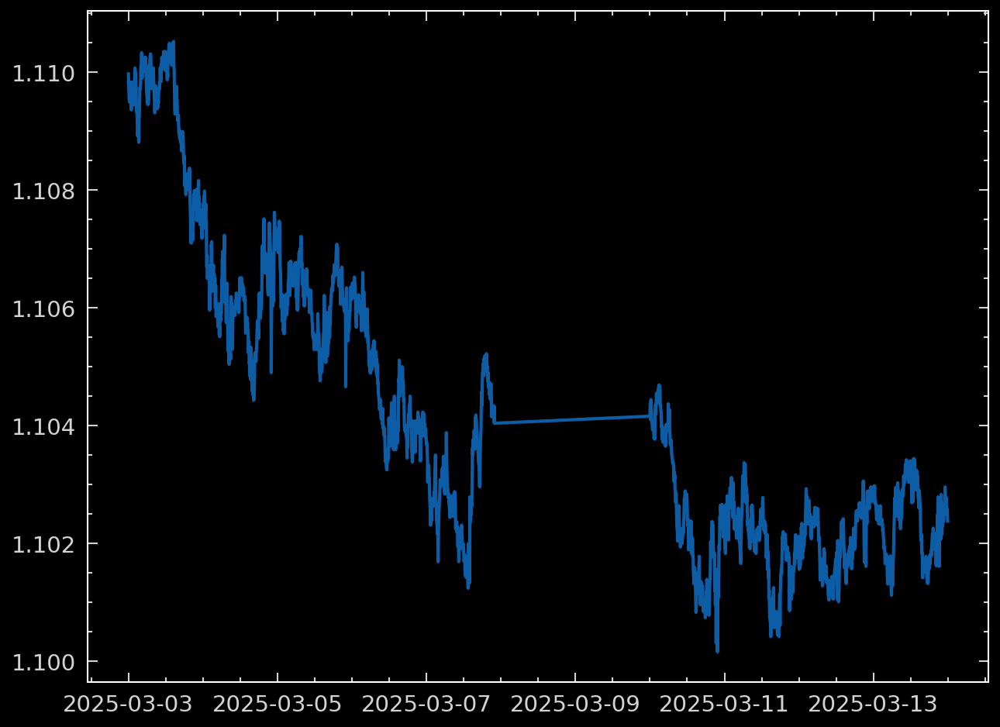

In [957]:
plt.plot(forex_df3['AUDNZD=X'])

### Correlation of couples of pairs

In [958]:
all_correlations_FX = []
for pair in paired_prices_FX:
    
    all_correlations_FX += [np.corrcoef(pair[0],pair[1])[0,1]]

In [959]:
best_correlations_FX = trd.n_largest(all_correlations_FX, 100)
best_correlations_FX

[[0.9958510525500451,
  0.9950013052560138,
  0.9892589498474542,
  0.989251582062283,
  0.9862624106624546,
  0.9853338220449527,
  0.9839845643477597,
  0.9826323549461149,
  0.9791869196358574,
  0.9787742995814752,
  0.975957726977822,
  0.9743651515929789,
  0.9740965419746678,
  0.9718077328773185,
  0.9707152802303524,
  0.9687247015753746,
  0.9669160177866262,
  0.9665226298346284,
  0.9648133752803624,
  0.959601813256579,
  0.9582738690666678,
  0.9579875176595658,
  0.9564179912107548,
  0.9552273919406882,
  0.9548497811709268,
  0.9515058611831111,
  0.9451471670409934,
  0.9438231749007726,
  0.9428686025707751,
  0.9385369483195749,
  0.9385323695788078,
  0.9379547878586143,
  0.9327489410949023,
  0.932560192132652,
  0.9325519824409786,
  0.9300420182331062,
  0.9285848440114802,
  0.9246384045708859,
  0.9239252017440845,
  0.922514469390698,
  0.9214333631394559,
  0.920261112920879,
  0.9187660998202607,
  0.9152292845055239,
  0.9146480234165804,
  0.913312355927

In [960]:
#Most correlated pairs
np.array(pairs_FX)[np.array(best_correlations_FX[1])]

array([['USDCZK=X', 'USDDKK=X'],
       ['EURAUD=X', 'EURNZD=X'],
       ['USDCZK=X', 'USDSEK=X'],
       ['USDHUF=X', 'USDPLN=X'],
       ['USDDKK=X', 'USDHUF=X'],
       ['USDCZK=X', 'USDHUF=X'],
       ['USDDKK=X', 'USDSEK=X'],
       ['EURUSD=X', 'GBPUSD=X'],
       ['EURGBP=X', 'EURUSD=X'],
       ['EURAUD=X', 'EURCAD=X'],
       ['USDCZK=X', 'USDPLN=X'],
       ['USDHUF=X', 'USDSEK=X'],
       ['USDDKK=X', 'USDPLN=X'],
       ['EURCAD=X', 'EURNZD=X'],
       ['USDPLN=X', 'USDSGD=X'],
       ['AUDUSD=X', 'NZDUSD=X'],
       ['USDPLN=X', 'USDSEK=X'],
       ['EURCAD=X', 'EURUSD=X'],
       ['USDHUF=X', 'USDSGD=X'],
       ['AUDCAD=X', 'NZDCAD=X'],
       ['EURCAD=X', 'EURGBP=X'],
       ['EURCAD=X', 'GBPCAD=X'],
       ['EURCHF=X', 'EURJPY=X'],
       ['USDSEK=X', 'USDSGD=X'],
       ['USDDKK=X', 'USDNOK=X'],
       ['USDCZK=X', 'USDSGD=X'],
       ['USDDKK=X', 'USDSGD=X'],
       ['USDCZK=X', 'USDNOK=X'],
       ['EURAUD=X', 'GBPCAD=X'],
       ['EURCAD=X', 'NZDCAD=X'],
       ['E

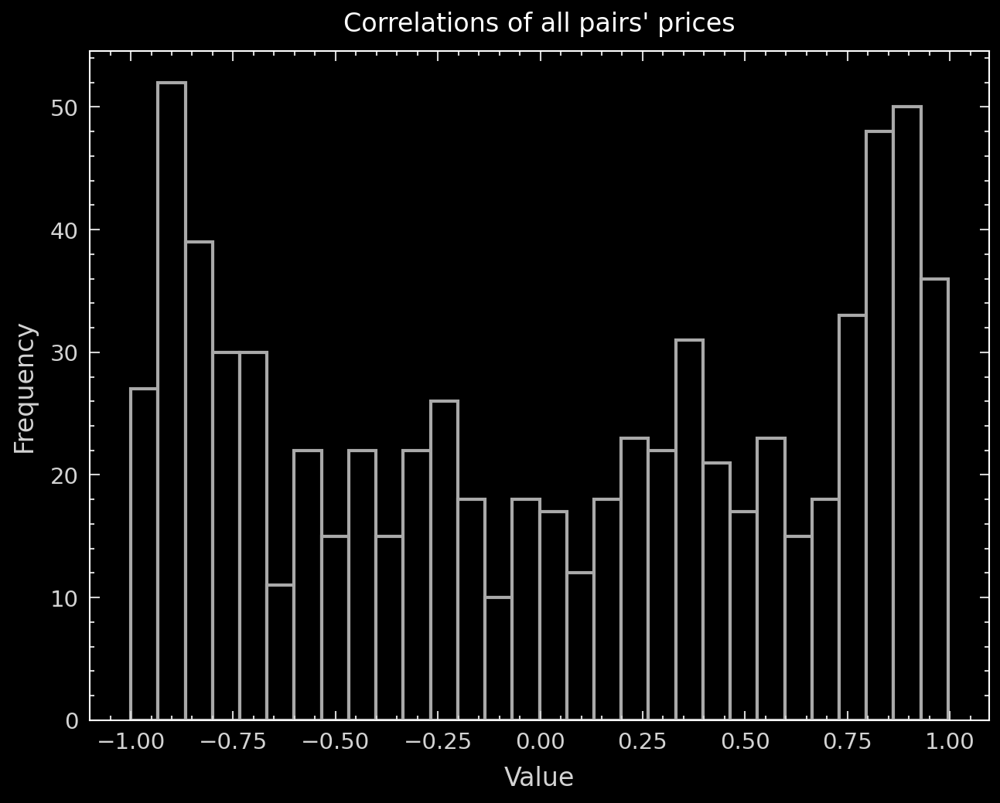

In [961]:
plt.rcParams['text.usetex'] = False

plt.hist(all_correlations_FX, bins = 30, edgecolor   =   'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Correlations of all pairs' prices", fontsize = 8);

### Cointegration of couples of pairs

In [962]:
from statsmodels.tsa.stattools import adfuller
from scipy.odr import ODR, Model, Data

all_adf_stats_FX = []
all_adf_pvals_FX = []
all_slopes_FX = []
all_half_lifes_FX = []

for i in range(len(paired_prices_FX)):
    
    # Apply log transformation to stabilize variance and normalize price differences between the two assets before testing for mean-reversion.
    prices1 = np.log(paired_prices_FX[i][0])
    prices2 = np.log(paired_prices_FX[i][1])

    # Step 1: Perform OLS Regression with 0 Intercept
    slope = trd.ols_regression(prices1, prices2)[0]  # Extract slope
    all_slopes_FX += [slope]  # Store the slope

    # Calculate residuals
    predicted_prices2 = slope * prices1  # Compute predicted prices with slope
    residuals = prices2 - predicted_prices2

    # Step 2: Perform ADF Test on Residuals
    adf_test = adfuller(residuals)

    adf_stat = adf_test[0]  # Test statistic
    p_value = adf_test[1]   # p-value
    
    # Step 3: Compute half-life of mean-reversion
    half_life = trd.compute_half_life(residuals)
    all_half_lifes_FX += [half_life]
    

    all_adf_stats_FX += [adf_stat]
    all_adf_pvals_FX += [p_value]


In [963]:
len(all_adf_pvals_FX)

741

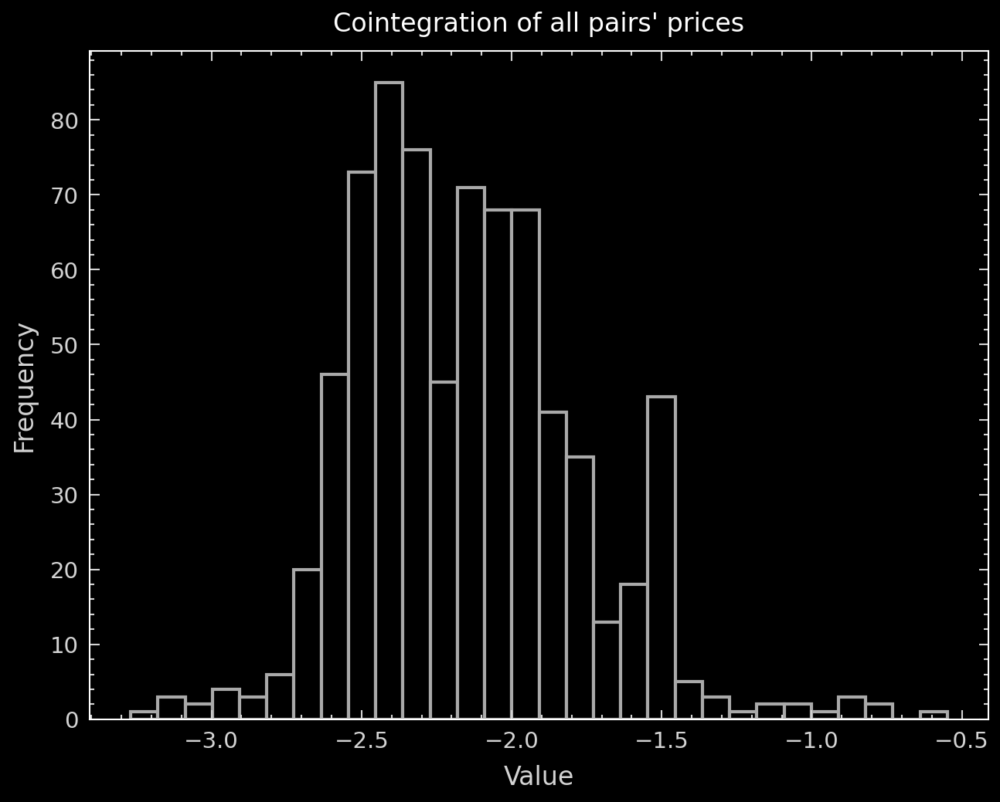

In [965]:
plt.rcParams['text.usetex'] = False

plt.hist(all_adf_stats_FX, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Cointegration of all pairs' prices", fontsize = 8);

In [966]:
max_coint_FX = trd.n_largest(list_to_max=-np.array(all_adf_stats_FX),n_max=20)
np.array(pairs_FX)[max_coint_FX[1]]

array([['AUDCAD=X', 'EURGBP=X'],
       ['EURNOK=X', 'USDSEK=X'],
       ['AUDCAD=X', 'AUDNZD=X'],
       ['AUDCAD=X', 'NZDCAD=X'],
       ['AUDNZD=X', 'NZDCAD=X'],
       ['EURNZD=X', 'GBPCAD=X'],
       ['CADCHF=X', 'EURNZD=X'],
       ['GBPNZD=X', 'USDCAD=X'],
       ['EURNOK=X', 'USDDKK=X'],
       ['USDHKD=X', 'USDSEK=X'],
       ['USDSEK=X', 'USDZAR=X'],
       ['EURSEK=X', 'USDJPY=X'],
       ['CHFJPY=X', 'USDSEK=X'],
       ['EURCAD=X', 'GBPUSD=X'],
       ['CHFJPY=X', 'USDHKD=X'],
       ['AUDNZD=X', 'AUDUSD=X'],
       ['CADJPY=X', 'USDHKD=X'],
       ['GBPAUD=X', 'USDSGD=X'],
       ['EURNOK=X', 'USDCZK=X'],
       ['NZDCHF=X', 'USDCAD=X']], dtype='<U8')

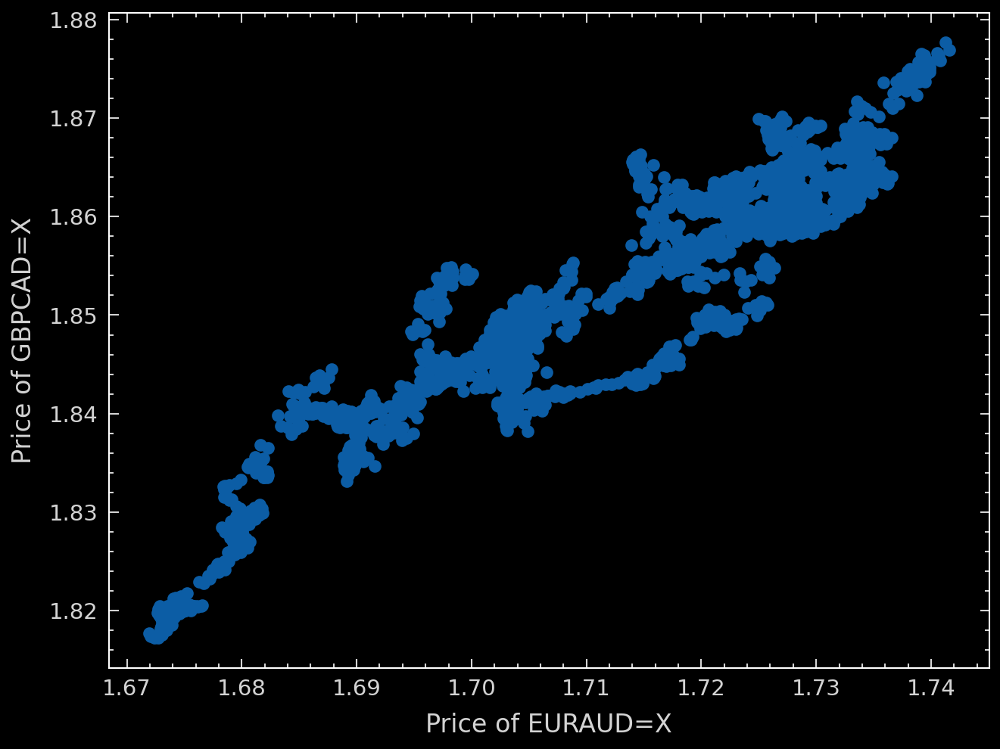

In [1203]:
pair_index = best_correlations_FX[1][28]
#pair_index = trd.find_pair(pairs_ETF,['SQQQ', 'PSQ'])
name1 = pairs_FX[pair_index][0]
name2 = pairs_FX[pair_index][1]

plt.scatter(paired_prices_FX[pair_index][0],paired_prices_FX[pair_index][1])
plt.xlabel('Price of '+name1, fontsize=8);
plt.ylabel('Price of '+name2, fontsize=8);

In [1204]:
paired_prices_FX[pair_index][0][-1]/paired_prices_FX[pair_index][1][-1]

0.9237526794265453

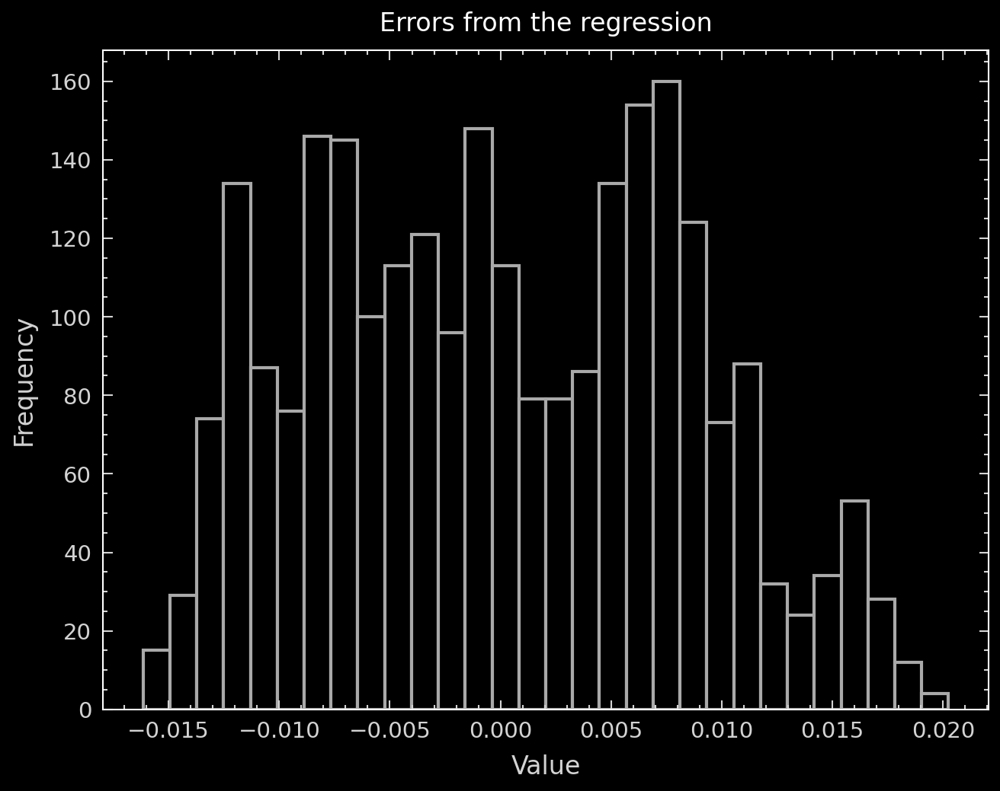

In [1205]:
errors_regression_FX = trd.ols_regression(paired_prices_FX[pair_index][0],paired_prices_FX[pair_index][1])[1]
plt.hist(errors_regression_FX, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Errors from the regression", fontsize = 8);

/var/folders/dy/0dr1rz555tqczw3kw215bzcw0000gn/T/ipykernel_24587/961356673.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Set1', num_colors)  # Force unique colors


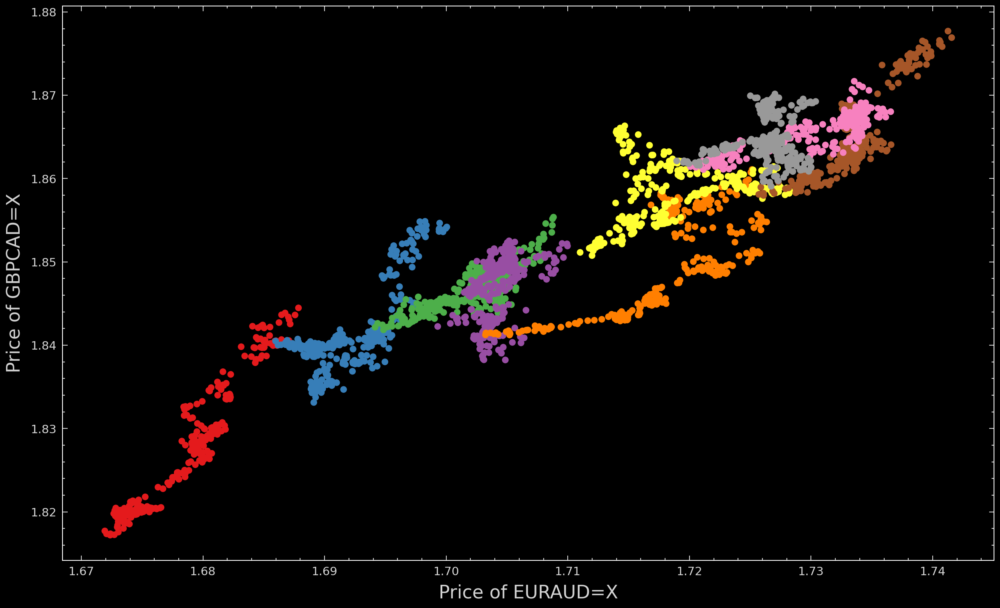

In [1206]:
import matplotlib.cm as cm

num_colors = len(unique_days)
cmap = cm.get_cmap('Set1', num_colors)  # Force unique colors
color_dict = {day.date(): i for i, day in enumerate(unique_days)}
#colors = [color_dict[datetime.fromisoformat(day).date()] for day in close_prices3.index]
colors = [color_dict[day.date()] for day in forex_df3.index]
# Scatter plot
plt.figure(figsize=(10, 6))
sc = plt.scatter(forex_df3[name1], forex_df3[name2], c=colors, cmap=cmap)


# Add color bar for reference
# plt.colorbar(scatter, label='Day')

# Labeling
plt.xlabel('Price of '+name1, fontsize=11);
plt.ylabel('Price of '+name2, fontsize=11);
plt.show()

In [1207]:
result = trd.simulate_trading_rescaled_e_dyn(price_list1=paired_prices_FX[pair_index][0], price_list2=paired_prices_FX[pair_index][1], error_rate=0.01, money_invested=100000, leave_profit=1000000, leave_loss=-1000000, startingStep=30, min_gain=20, c_edge=0, max_open=20, temp_loss=10, memory_es=30, ratio_open_close=1,max_trades=5000)

In [1208]:
my_df = result.res_df
my_df['Time'] = forex_df3.index
my_df

,Price1,Price2,EntryPrice1,EntryPrice2,Order1,Order2,ExecutedTrade1,ExecutedTrade2,PlannedShares1,PlannedShares2,...,UnrealizedPnL2,CrossPrice,PositionsStatus,Side,HoldingDuration,RealizedPnL,CumulativePnL,Spread,HedgeRatio,Time
0,1.67379,1.81958,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,closed,0,0,0.000000,0.000000,1.819580,"[0.22068610655570384, 0.13184814669269013]",2025-03-03 00:00:00+00:00
1,1.67405,1.82005,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,closed,0,1,0.000000,0.000000,1.318762,"[0.45064100863305134, 0.2692091576453607]",2025-03-03 00:05:00+00:00
2,1.67408,1.81993,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,closed,0,1,0.000000,0.000000,0.796312,"[0.6038634823517186, 0.36073360215089345]",2025-03-03 00:10:00+00:00
3,1.67459,1.82014,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,closed,0,1,0.000000,0.000000,0.448183,"[0.6926202012330446, 0.4137211629787115]",2025-03-03 00:15:00+00:00
4,1.67455,1.82005,0.00000,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,closed,0,1,0.000000,0.000000,0.246502,"[0.741845452411655, 0.4431138172649437]",2025-03-03 00:20:00+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2556,1.72631,1.86889,1.72662,1.86905,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.0,False,closed,0,1,192.447413,192.447413,-0.000132,"[0.7987738655413696, 0.4900294693247056]",2025-03-13 23:35:00+00:00
2557,1.72616,1.86908,1.72662,1.86905,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,closed,0,1,192.447413,192.447413,0.000239,"[0.7988228140542284, 0.4900554915111141]",2025-03-13 23:40:00+00:00
2558,1.72631,1.86907,1.72662,1.86905,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,closed,0,1,192.447413,192.447413,-0.000001,"[0.7988225514748016, 0.4900553609278146]",2025-03-13 23:45:00+00:00
2559,1.72632,1.86914,1.72662,1.86905,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,False,closed,0,1,192.447413,192.447413,0.000061,"[0.7988351135968608, 0.490062027755274]",2025-03-13 23:50:00+00:00


In [1209]:
actions_df = my_df[((my_df['ExecutedTrade1']!=0) | (my_df['ExecutedTrade2']!=0))]
actions_df[['Price1',	'Price2','ExecutedTrade1',	'ExecutedTrade2', 'Shares1', 'Shares2', 'PositionsStatus','UnrealizedPnL1', 'UnrealizedPnL2', 'HoldingDuration', 'CumulativePnL', 'Time']]

,Price1,Price2,ExecutedTrade1,ExecutedTrade2,Shares1,Shares2,PositionsStatus,UnrealizedPnL1,UnrealizedPnL2,HoldingDuration,CumulativePnL,Time
31,1.67447,1.82003,-29863.0,27469.0,-29863.0,27469.0,closed,0.000000,0.000000,1,-2.000000,2025-03-03 02:35:00+00:00
55,1.67485,1.82005,29863.0,-27469.0,0.0,0.0,open,-11.349111,0.550126,24,-14.798985,2025-03-03 04:35:00+00:00
56,1.67476,1.82002,-29851.0,27468.0,-29851.0,27468.0,closed,0.000000,-0.000000,1,-16.798985,2025-03-03 04:40:00+00:00
77,1.67646,1.82046,29851.0,-27468.0,0.0,0.0,open,-50.748004,12.085961,21,-57.461028,2025-03-03 06:25:00+00:00
81,1.67457,1.81972,29839.0,-27463.0,29839.0,-27463.0,closed,-0.000000,-0.000000,1,-59.461028,2025-03-03 06:45:00+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...
2510,1.72603,1.86760,29001.0,-26810.0,0.0,0.0,open,8.411340,13.404028,4,138.167727,2025-03-13 19:45:00+00:00
2517,1.72706,1.86797,-28994.0,26801.0,-28994.0,26801.0,closed,0.000000,0.000000,1,136.167727,2025-03-13 20:20:00+00:00
2520,1.72631,1.86863,28994.0,-26801.0,0.0,0.0,open,21.743924,17.690317,3,173.601968,2025-03-13 20:35:00+00:00
2521,1.72662,1.86905,29005.0,-26801.0,29005.0,-26801.0,closed,-0.000000,0.000000,1,171.601968,2025-03-13 20:40:00+00:00


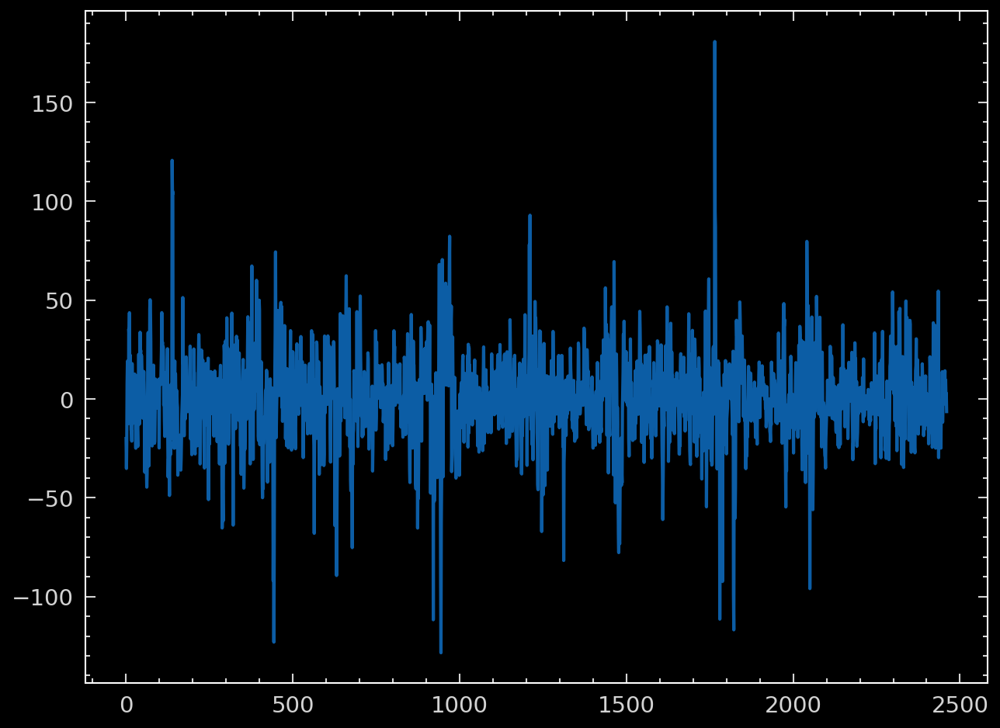

In [1210]:
plt.plot(result.rescaled_es[100:])

In [1211]:
trades_df = my_df[((my_df['ExecutedTrade1']!=0) & (my_df['ExecutedTrade2']!=0))]
trades_df[['Price1',	'Price2','ExecutedTrade1',	'ExecutedTrade2', 'Shares1', 'Shares2', 'PositionsStatus','UnrealizedPnL1', 'UnrealizedPnL2', 'HoldingDuration', 'CumulativePnL', 'Time']].head(40)

,Price1,Price2,ExecutedTrade1,ExecutedTrade2,Shares1,Shares2,PositionsStatus,UnrealizedPnL1,UnrealizedPnL2,HoldingDuration,CumulativePnL,Time
31,1.67447,1.82003,-29863.0,27469.0,-29863.0,27469.0,closed,0.000000,0.000000,1,-2.000000,2025-03-03 02:35:00+00:00
55,1.67485,1.82005,29863.0,-27469.0,0.0,0.0,open,-11.349111,0.550126,24,-14.798985,2025-03-03 04:35:00+00:00
56,1.67476,1.82002,-29851.0,27468.0,-29851.0,27468.0,closed,0.000000,-0.000000,1,-16.798985,2025-03-03 04:40:00+00:00
77,1.67646,1.82046,29851.0,-27468.0,0.0,0.0,open,-50.748004,12.085961,21,-57.461028,2025-03-03 06:25:00+00:00
81,1.67457,1.81972,29839.0,-27463.0,29839.0,-27463.0,closed,-0.000000,-0.000000,1,-59.461028,2025-03-03 06:45:00+00:00
104,1.67193,1.81771,-29839.0,27463.0,0.0,0.0,open,-78.775226,55.200296,23,-85.035959,2025-03-03 08:40:00+00:00
108,1.67303,1.81883,29856.0,-27471.0,29856.0,-27471.0,closed,-0.000000,-0.000000,1,-87.035959,2025-03-03 09:00:00+00:00
131,1.67798,1.82459,-29856.0,27471.0,0.0,0.0,open,147.785030,-158.231709,23,-99.482637,2025-03-03 10:55:00+00:00
135,1.67853,1.82419,-29761.0,27380.0,-29761.0,27380.0,closed,0.000000,0.000000,1,-101.482637,2025-03-03 11:15:00+00:00
136,1.67849,1.82501,29761.0,-27380.0,0.0,0.0,open,1.188509,22.449450,1,-79.844678,2025-03-03 11:20:00+00:00


In [1212]:
len(trades_df)/2

169.5

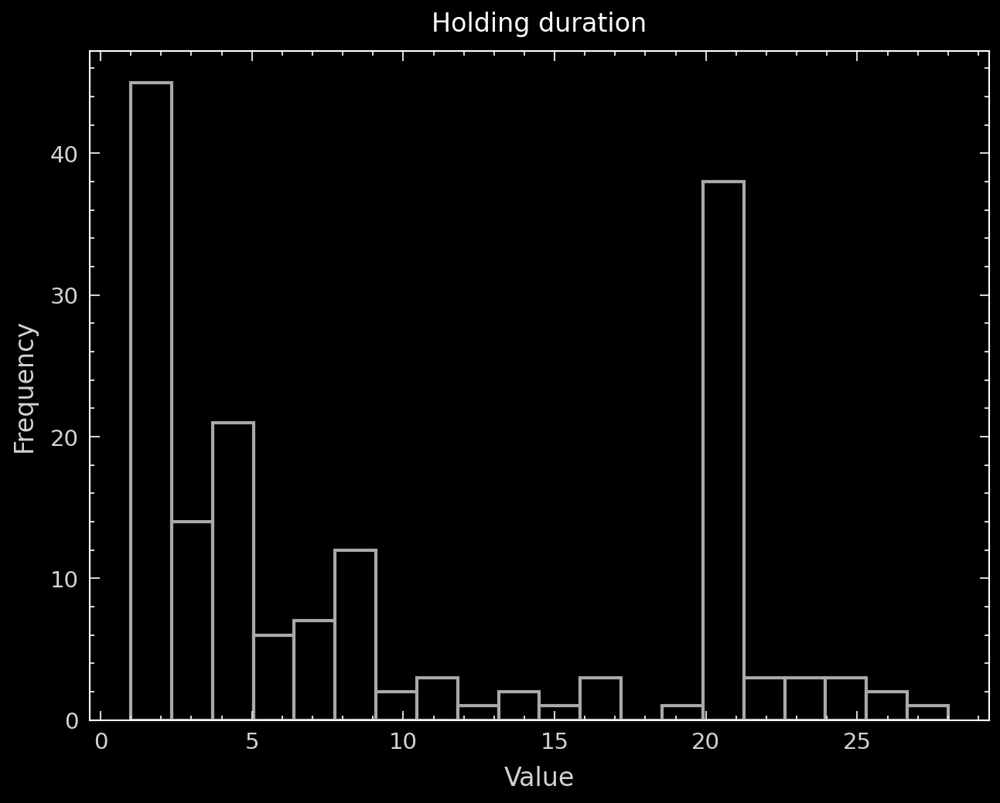

In [1213]:
trades_closing_df = trades_df[trades_df['PositionsStatus']=='open']
plt.hist(trades_closing_df['HoldingDuration'], bins = 20, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Holding duration", fontsize = 8);

In [1214]:
losing_trades = trades_df[(trades_df['UnrealizedPnL1']+trades_df['UnrealizedPnL2']<0)]
#losing_trades['HoldingDuration']

In [1215]:
(losing_trades['UnrealizedPnL1']+losing_trades['UnrealizedPnL2']).sum()

-3063.5867393016815

In [1216]:
winning_trades = trades_df[(trades_df['UnrealizedPnL1']+trades_df['UnrealizedPnL2']>0)]
(winning_trades['UnrealizedPnL1']+winning_trades['UnrealizedPnL2']).sum()

3857.9051069021225

In [1223]:
execution_errors = my_df[((my_df['ExecutedTrade1']!=0) ^ (my_df['ExecutedTrade2']!=0))]
execution_errors[['Price1',	'Price2','ExecutedTrade1',	'ExecutedTrade2', 'Shares1', 'Shares2', 'PositionsStatus','UnrealizedPnL1', 'UnrealizedPnL2', 'HoldingDuration', 'CumulativePnL', 'Time']].head(10)

,Price1,Price2,ExecutedTrade1,ExecutedTrade2,Shares1,Shares2,PositionsStatus,UnrealizedPnL1,UnrealizedPnL2,HoldingDuration,CumulativePnL,Time
1308,1.72469,1.85104,0.0,-26922.0,-28886.0,0.0,open,4.335341,28.267977,6,-308.746536,2025-03-07 13:20:00+00:00
1309,1.72374,1.85237,28886.0,0.0,0.0,0.0,half,31.776429,0.000000,1,-310.573424,2025-03-07 13:25:00+00:00
1560,1.71525,1.86412,0.0,-26724.0,0.0,-26724.0,closed,-0.000000,0.000000,1,-389.525962,2025-03-10 12:25:00+00:00
1561,1.71672,1.86400,0.0,26724.0,0.0,0.0,half,-0.000000,3.208049,1,-387.317913,2025-03-10 12:30:00+00:00
1773,1.73189,1.86129,0.0,26737.0,28748.0,0.0,open,56.631649,-24.596385,1,-465.864398,2025-03-11 06:20:00+00:00
1774,1.73170,1.86153,-28748.0,0.0,0.0,0.0,half,51.168965,0.000000,1,-447.730697,2025-03-11 06:25:00+00:00
2173,1.73192,1.86647,0.0,-26849.0,0.0,-26849.0,closed,0.000000,0.000000,1,209.058996,2025-03-12 15:40:00+00:00
2174,1.73181,1.86699,0.0,26849.0,0.0,0.0,half,0.000000,-13.961236,1,194.097760,2025-03-12 15:45:00+00:00
2249,1.72204,1.86253,0.0,-26890.0,-29077.0,0.0,open,-0.291165,21.781629,15,173.437290,2025-03-12 22:00:00+00:00
2250,1.72201,1.86216,29077.0,0.0,0.0,0.0,half,0.582330,0.000000,1,151.529155,2025-03-12 22:05:00+00:00


In [1217]:
trd.compute_trading_metrics(result.res_df, initial_balance=50000, trading_days=len(unique_days))

{'Start_Balance': 50000,
 'Final_Balance': 50192.44741344452,
 'Total_Return (%)': 0.3848948268890373,
 'Time_in_Market (%)': 65.36509176103084,
 'Max_Drawdown (%)': -1.8716762357018801,
 'Max_Drawdown_Duration': 20,
 'Sharpe Ratio': 0.015551479755672195,
 'Total_Trades': 171,
 'Wins': 127,
 'Losses': 44,
 'Winrate (%)': 74.26900584795322,
 'Avg_Risk_Reward': 0.4384251229851384}

## Cryptos

### Downloading data

## Simulated data

In this section, we generate price data for pairs that mean revert and test whether our algorithm can exploit this. This is a benchmark test to verify that our algorithm can exploit true mean reversion.

### Simulating one price

In [ ]:
def simulate_stock_prices(S0=100, mu=0.0002, sigma=0.02, N=390*252,
                          trend_factor=0, shocks=[], shock_magnitude=0.2, seed=42):
    """
    Simulates a stock price using Geometric Brownian Motion (GBM) with trend control and shocks.

    Parameters:
    - S0: Initial stock price
    - mu: Expected return (drift)
    - sigma: Volatility (standard deviation of returns)
    - N: Number of time steps (default simulates 1 year of minute data)
    - trend_factor: Controls general trend (positive = upward, negative = downward, 0 = neutral)
    - shocks: List of shocks, where positive values indicate upward shocks and negative values indicate downward shocks.
              The absolute value represents the time index where the shock occurs.
    - shock_magnitude: Percentage jump for shocks (default = 5%)
    - seed: Random seed for reproducibility

    Returns:
    - DataFrame with simulated stock price
    """
    np.random.seed(seed)
    time_index = np.arange(N)  # Use a simple integer index instead of normalized time
    W = np.random.standard_normal(size=N)  # Brownian motion increments
    W = np.cumsum(W)  # Cumulative Brownian motion
    
    # Apply trend control
    trend = trend_factor * (time_index / N)  # Linear upward/downward drift

    # Compute GBM stock price evolution
    S = S0 * np.exp((mu - 0.5 * sigma**2) * (time_index / N) + sigma * W + trend)

    # Apply shocks
    for shock in shocks:
        shock_index = abs(int(shock))  # Get absolute time index
        if shock_index < N:  # Ensure shock index is within the valid range
            if shock > 0:  # Upward shock
                S[shock_index:] *= (1 + shock_magnitude)
            elif shock < 0:  # Downward shock
                S[shock_index:] *= (1 - shock_magnitude)

    # Store results in DataFrame
    df = pd.DataFrame({'Time': time_index, 'Price': S})
    return df


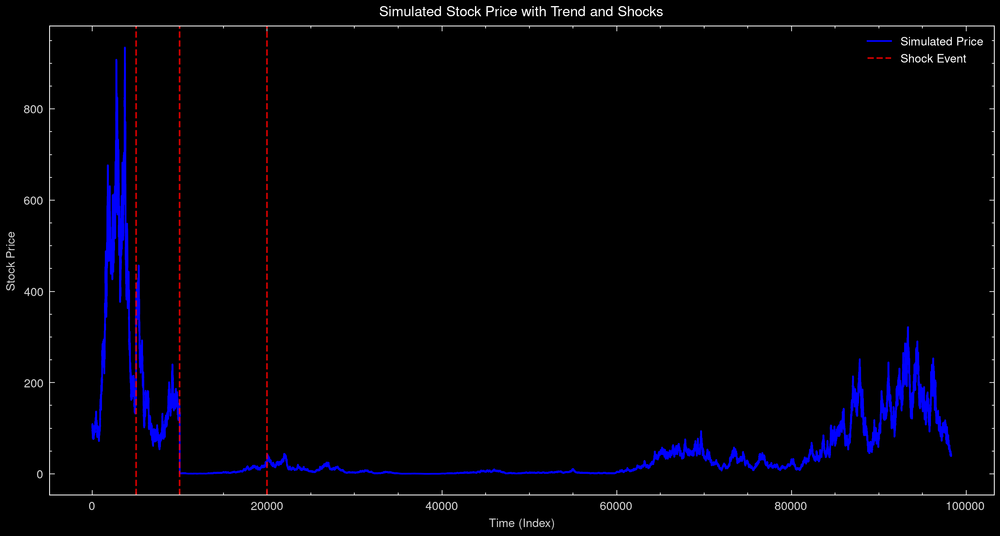

In [ ]:
# Example usage:
simulated_data = simulate_stock_prices(
    S0=100,
    trend_factor=0.1,  # Upward trend
    shocks=[5000, -10000, 20000],  # Up at 5000, Down at 10000, Up at 20000
    shock_magnitude=0.99# Each shock changes price by ±5%
)

# Plot the simulated stock price
plt.figure(figsize=(10, 5))
plt.plot(simulated_data["Time"], simulated_data["Price"], label="Simulated Price", color="blue")

# Add red dashed vertical lines at shock occurrences
for shock in [5000, -10000, 20000]:  # Use the same shocks from the function call
    shock_index = abs(int(shock))  # Get the absolute index where the shock occurs
    if shock_index < len(simulated_data):
        plt.axvline(x=shock_index, color='red', linestyle='dashed', alpha=0.8, label="Shock Event" if shock == 5000 else "")

# Labels and title
plt.xlabel("Time (Index)")
plt.ylabel("Stock Price")
plt.title("Simulated Stock Price with Trend and Shocks")
plt.legend()
plt.show()

In [ ]:
simulated_data["Price"][9999:10001]

9999     131.142189
10000      1.293748
Name: Price, dtype: float64

In [ ]:
1-(1.293748/131.142189)

0.9901347689110176

### Simulating a correlated pair

In [ ]:
def simulate_pair_prices(S0=100, mu=0.0002, sigma=0.02, N=390*252,
                          trend_factor=0, shocks_1=[], shocks_2=[], shock_magnitude=0.2, seed=42, hedge_ratio = 2, error_variance = 0.05):
    """
    Simulates a stock price using Geometric Brownian Motion (GBM) with trend control and shocks.

    Parameters:
    - S0: Initial stock price
    - mu: Expected return (drift)
    - sigma: Volatility (standard deviation of returns)
    - N: Number of time steps (default simulates 1 year of minute data)
    - trend_factor: Controls general trend (positive = upward, negative = downward, 0 = neutral)
    - shocks_1: List of shocks, where positive values indicate upward shocks and negative values indicate downward shocks.
              The absolute value represents the time index where the shock occurs.
    - shock_magnitude: Percentage jump for shocks (default = 5%)
    - seed: Random seed for reproducibility

    Returns:
    - DataFrame with simulated stock price
    """
    np.random.seed(seed)
    time_index = np.arange(N)  # Use a simple integer index instead of normalized time
    W = np.random.standard_normal(size=N)  # Brownian motion increments
    W = np.cumsum(W)  # Cumulative Brownian motion
    
    # Apply trend control
    trend = trend_factor * (time_index / N)  # Linear upward/downward drift

    # Compute GBM stock price evolution
    S1 = S0 * np.exp((mu - 0.5 * sigma**2) * (time_index / N) + sigma * W + trend)
    error_term = np.random.normal(0,error_variance,len(S1))
    S2 = hedge_ratio*S1 + error_term

    # Apply shocks
    for shock in shocks_1:
        shock_index = abs(int(shock))  # Get absolute time index
        if shock_index < N:  # Ensure shock index is within the valid range
            if shock > 0:  # Upward shock
                S1[shock_index:] *= (1 + shock_magnitude)
            elif shock < 0:  # Downward shock
                S1[shock_index:] *= (1 - shock_magnitude)
                
    for shock in shocks_2:
        shock_index = abs(int(shock))  # Get absolute time index
        if shock_index < N:  # Ensure shock index is within the valid range
            if shock > 0:  # Upward shock
                S2[shock_index:] *= (1 + shock_magnitude)
            elif shock < 0:  # Downward shock
                S2[shock_index:] *= (1 - shock_magnitude)

    # Store results in DataFrame
    df = pd.DataFrame({'Time': time_index, 'Price1': S1, 'Price2': S2, 'Errors': error_term})
    return df


In [ ]:
simulated_pair = simulate_pair_prices(S0=100, mu=0.0002, sigma=0.02, N=50000,
                          trend_factor=0, shocks_1=[], shocks_2=[], shock_magnitude=0.2, seed=42, hedge_ratio = 2, error_variance = 2)

In [ ]:
simulated_pair

,Time,Price1,Price2,Errors
0,0,100.998379,202.193171,0.196412
1,1,100.719476,201.310735,-0.128216
2,2,102.032660,205.968901,1.903582
3,3,105.188455,213.442572,3.065662
4,4,104.697002,210.767698,1.373694
...,...,...,...,...
49995,49995,62.749326,125.048202,-0.450450
49996,49996,62.718056,124.296557,-1.139555
49997,49997,63.348490,127.515351,0.818370
49998,49998,63.685403,126.948623,-0.422183


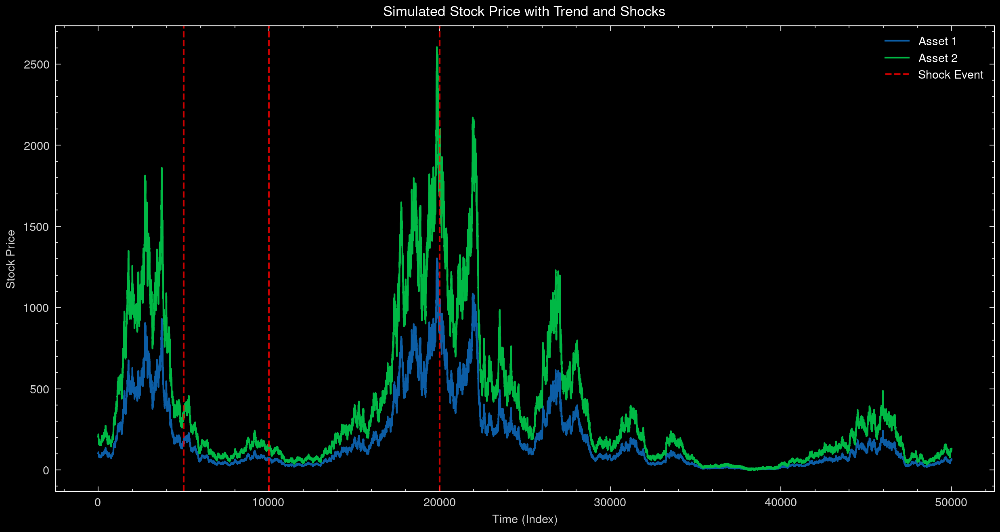

In [ ]:
# Plot the simulated stock price
plt.figure(figsize=(10, 5))
plt.plot(simulated_pair["Time"], simulated_pair["Price1"], label="Asset 1")
plt.plot(simulated_pair["Time"], simulated_pair["Price2"], label="Asset 2")


# Add red dashed vertical lines at shock occurrences
for shock in [5000, -10000, 20000]:  # Use the same shocks from the function call
    shock_index = abs(int(shock))  # Get the absolute index where the shock occurs
    if shock_index < len(simulated_pair):
        plt.axvline(x=shock_index, color='red', linestyle='dashed', alpha=0.8, label="Shock Event" if shock == 5000 else "")

# Labels and title
plt.xlabel("Time (Index)")
plt.ylabel("Stock Price")
plt.title("Simulated Stock Price with Trend and Shocks")
plt.legend()
plt.show()

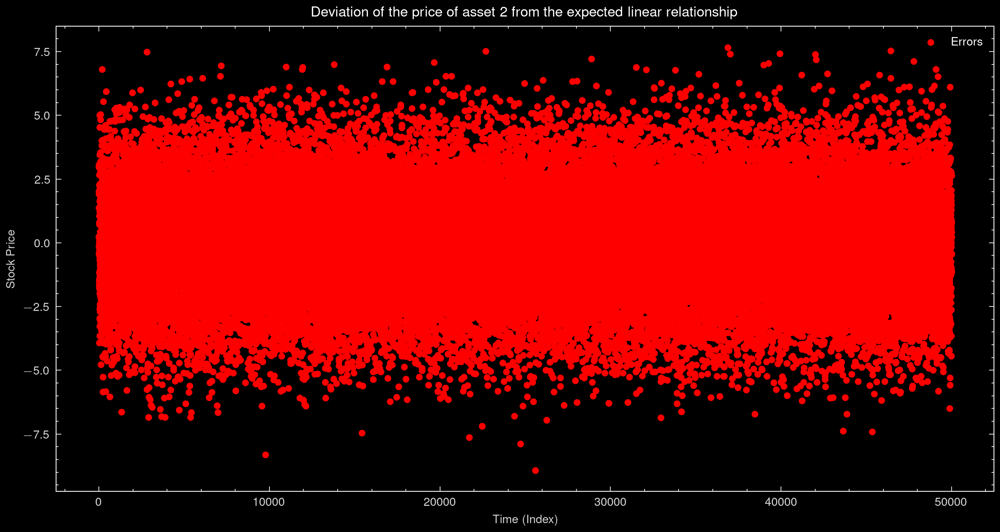

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(simulated_pair["Time"], simulated_pair["Errors"], label="Errors", color='red')

plt.xlabel("Time (Index)")
plt.ylabel("Stock Price")
plt.title("Deviation of the price of asset 2 from the expected linear relationship")
plt.legend()
plt.show()


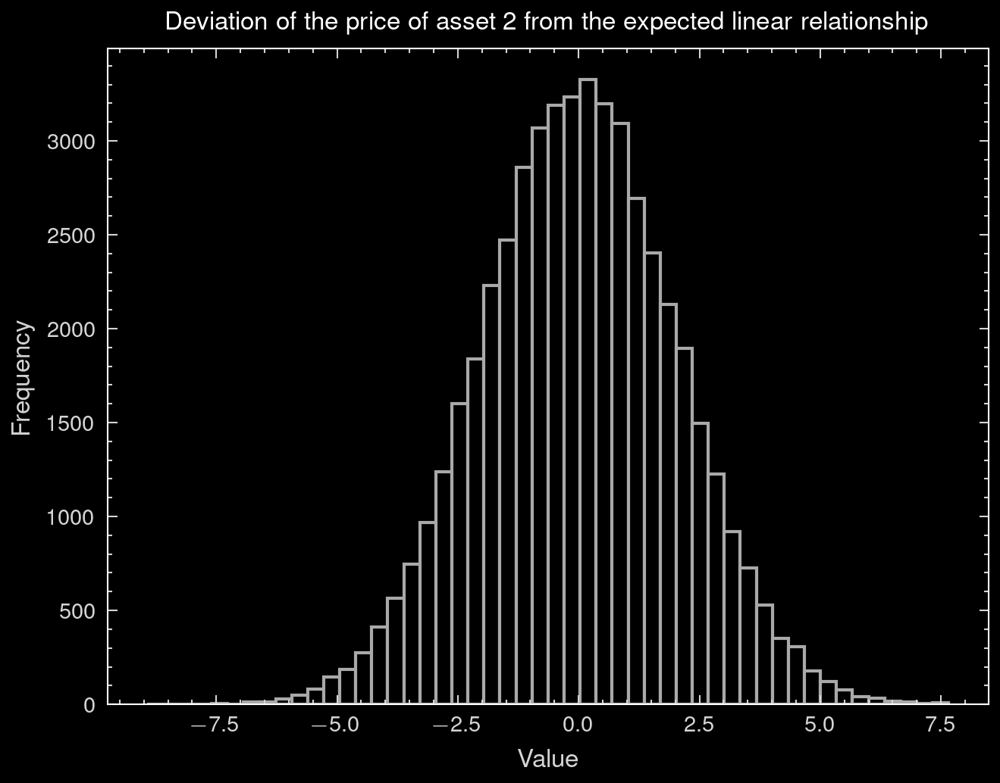

In [ ]:
plt.hist(simulated_pair["Errors"], bins = 50, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Deviation of the price of asset 2 from the expected linear relationship", fontsize = 8);

In [ ]:
simulated_pair["Errors"].mean()

0.004709269723278597

In [ ]:
simulated_pair["Errors"].std()

2.003299175359731

In [ ]:
adf_result = adfuller(simulated_pair["Errors"])
{
    "ADF Test Statistic": adf_result[0],
    "p-value": adf_result[1],  # If < 0.05, spread is stationary (mean-reverting)
    "Critical Values": adf_result[4]
}

{'ADF Test Statistic': -141.10083510410408,
 'p-value': 0.0,
 'Critical Values': {'1%': -3.4306770233281947,
  '5%': -2.861684532817176,
  '10%': -2.5668469308693944}}

In [ ]:
#Code generated by chatGPT

def simulate_mean_reverting_pair(S0=100, mu=0.0002, sigma=0.02, N=390*252,
                                 trend_factor=0, shocks_1=[], shocks_2=[], shock_magnitude=0.2, seed=42, 
                                 hedge_ratio=2, error_variance=0.05, theta=0.1, mean_spread=0):
    """
    Simulates two stock prices where their spread follows a mean-reverting Ornstein-Uhlenbeck (OU) process.

    Parameters:
    - S0: Initial stock price
    - mu: Expected return (drift)
    - sigma: Volatility (standard deviation of returns)
    - N: Number of time steps (default simulates 1 year of minute data)
    - trend_factor: Controls general trend (positive = upward, negative = downward, 0 = neutral)
    - shocks_1, shocks_2: Lists of shocks (positive = upward, negative = downward), absolute value is time index.
    - shock_magnitude: Percentage jump for shocks (default = 20%)
    - hedge_ratio: Determines the relationship between the two assets
    - error_variance: Standard deviation of noise in S2
    - theta: Speed of mean reversion (higher values make spread revert faster)
    - mean_spread: Long-term average spread level

    Returns:
    - DataFrame with simulated stock price pair
    """
    np.random.seed(seed)
    time_index = np.arange(N)  # Simple integer index instead of normalized time
    W = np.random.standard_normal(size=N)  # Brownian motion increments
    W = np.cumsum(W)  # Cumulative Brownian motion
    
    # Apply trend control to Price1
    trend = trend_factor * (time_index / N)  # Linear upward/downward drift
    S1 = S0 * np.exp((mu - 0.5 * sigma**2) * (time_index / N) + sigma * W + trend)

    # Simulate mean-reverting spread using an Ornstein-Uhlenbeck process
    spread = np.zeros(N)
    spread[0] = mean_spread  # Initialize the spread at its mean level
    for t in range(1, N):
        spread[t] = spread[t-1] + theta * (mean_spread - spread[t-1]) + np.random.normal(0, error_variance)

    # Compute S2 as a function of S1 + mean-reverting spread
    S2 = hedge_ratio * S1 + spread

    # Apply shocks
    for shock in shocks_1:
        shock_index = abs(int(shock))  
        if shock_index < N:  
            if shock > 0:  # Upward shock
                S1[shock_index:] *= (1 + shock_magnitude)
            elif shock < 0:  # Downward shock
                S1[shock_index:] *= (1 - shock_magnitude)
                
    for shock in shocks_2:
        shock_index = abs(int(shock))  
        if shock_index < N:  
            if shock > 0:  
                S2[shock_index:] *= (1 + shock_magnitude)
            elif shock < 0:  
                S2[shock_index:] *= (1 - shock_magnitude)

    # Store results in DataFrame
    df = pd.DataFrame({'Time': time_index, 'Price1': S1, 'Price2': S2, 'Spread': spread})
    return df


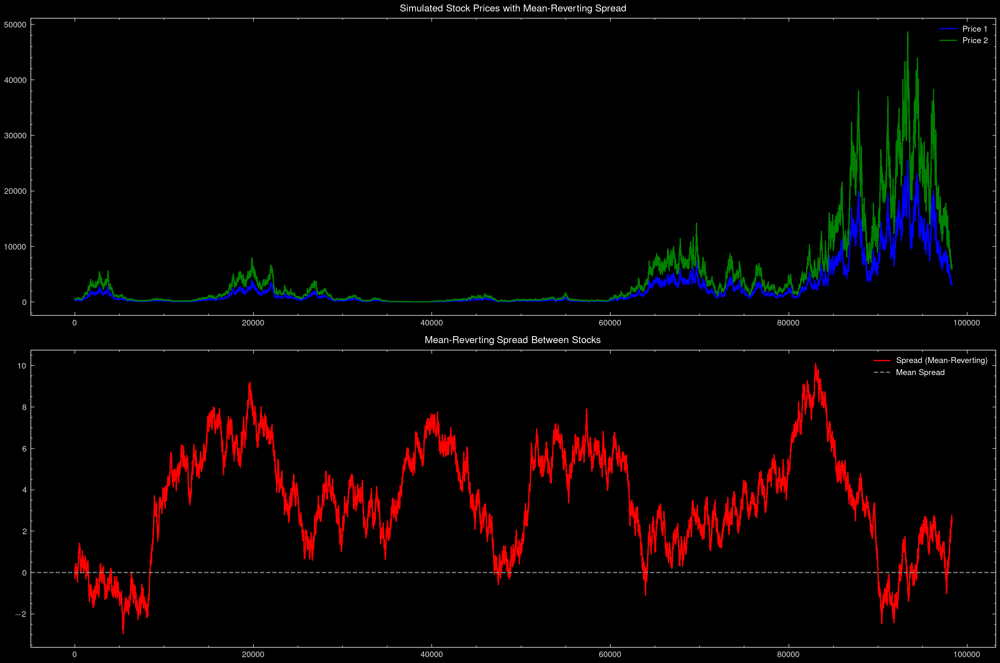

In [19]:
simulated_data = simulate_mean_reverting_pair(
    S0=300,
    trend_factor=0.1,  # Upward trend
    shocks_1=[5000, -10000, 20000],  # Up at 5000, Down at 10000, Up at 20000
    shocks_2=[-7500, 15000],  # Additional shocks in S2
    shock_magnitude=0.05,  # 5% shocks
    theta=0.00001,  # Mean reversion speed (higher = faster)
    mean_spread=0  # Mean spread level
)

# Plot the simulated stock prices and spread
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

# Plot stock prices
axes[0].plot(simulated_data["Time"], simulated_data["Price1"], label="Price 1", color="blue")
axes[0].plot(simulated_data["Time"], simulated_data["Price2"], label="Price 2", color="green")
axes[0].set_title("Simulated Stock Prices with Mean-Reverting Spread")
axes[0].legend()

# Plot spread
axes[1].plot(simulated_data["Time"], simulated_data["Spread"], label="Spread (Mean-Reverting)", color="red")
axes[1].axhline(0, color="gray", linestyle="dashed", label="Mean Spread")
axes[1].set_title("Mean-Reverting Spread Between Stocks")
axes[1].legend()

plt.tight_layout()
plt.show()


In [20]:
simulated_data["Spread"][:1000]

0      0.000000
1     -0.034802
2     -0.031890
3     -0.169041
4     -0.154387
         ...   
995    0.286567
996    0.206708
997    0.164083
998    0.125404
999    0.133353
Name: Spread, Length: 1000, dtype: float64

In [21]:
simulated_data["Spread"].mean()

3.503768759359661

In [22]:
from statsmodels.tsa.stattools import adfuller
from scipy.odr import ODR, Model, Data

adf_result = adfuller(simulated_data["Spread"][:1000])
{
    "ADF Test Statistic": adf_result[0],
    "p-value": adf_result[1],  # If < 0.05, spread is stationary (mean-reverting)
    "Critical Values": adf_result[4]
}

{'ADF Test Statistic': -2.15017227603216,
 'p-value': 0.22482415375674936,
 'Critical Values': {'1%': -3.4369193380671,
  '5%': -2.864440383452517,
  '10%': -2.56831430323573}}

## Backtest on simulated data

### Many pairs

In [ ]:
# Number of pairs per type
num_pairs_per_type = 200

# List to store all synthetic paired prices
simulated_paired_prices = []

pair_configs = [
    {"theta": 0.2, "sigma": 0.02, "hedge_ratio": 2, "trend_factor": 0, "error_variance": 0.02, "mean_spread": 0, "name": "Strong Mean Reversion - Narrow Spread"},
    {"theta": 0.05, "sigma": 0.02, "hedge_ratio": 2, "trend_factor": 0, "error_variance": 0.1, "mean_spread": 0, "name": "Weak Mean Reversion - Wide Spread"},
    {"theta": 0.1, "sigma": 0.05, "hedge_ratio": 2, "trend_factor": 0, "error_variance": 0.05, "mean_spread": 0, "name": "High Volatility - Medium Spread"},
    {"theta": 0.1, "sigma": 0.01, "hedge_ratio": 2, "trend_factor": 0, "error_variance": 0.02, "mean_spread": 0, "name": "Low Volatility - Very Narrow Spread"},
    {"theta": 0.1, "sigma": 0.02, "hedge_ratio": 1.5, "trend_factor": 0, "error_variance": 0.08, "mean_spread": 0, "name": "Low Hedge Ratio - High Spread Volatility"},
    {"theta": 0.1, "sigma": 0.02, "hedge_ratio": 3, "trend_factor": 0, "error_variance": 0.02, "mean_spread": 0, "name": "High Hedge Ratio - Low Spread Volatility"},
    {"theta": 0.1, "sigma": 0.02, "hedge_ratio": 2, "trend_factor": 0.1, "error_variance": 0.05, "mean_spread": 0, "name": "Upward Trend - Medium Spread"},
    {"theta": 0.1, "sigma": 0.02, "hedge_ratio": 2, "trend_factor": -0.1, "error_variance": 0.05, "mean_spread": 0, "name": "Downward Trend - Medium Spread"},
    {"theta": 0.1, "sigma": 0.02, "hedge_ratio": 2, "trend_factor": 0, "shocks_1": [5000, -10000], "shocks_2": [-7500, 15000], "error_variance": 0.05, "mean_spread": 0, "name": "With Shocks - Medium Spread"},
]

# Generate multiple synthetic pairs
for config in pair_configs:
    for i in range(num_pairs_per_type):
        df = simulate_mean_reverting_pair(
            S0=np.random.uniform(50, 400),
            mu=0.0002,
            sigma=config["sigma"],
            N=390 * 10,  # Simulating 10 days
            trend_factor=config["trend_factor"],
            shocks_1=config.get("shocks_1", []),
            shocks_2=config.get("shocks_2", []),
            shock_magnitude=0.05,
            hedge_ratio=config["hedge_ratio"],
            error_variance=config["error_variance"],
            theta=config["theta"],
            mean_spread=config["mean_spread"],
            seed=i  # Different seed for diversity
        )

        # Append the pair's prices in the same format as "paired_prices" in your notebook
        simulated_paired_prices.append([np.array(df["Price1"]), np.array(df["Price2"])])


In [ ]:
len(simulated_paired_prices), len(pair_configs)

(1800, 9)

In [ ]:
len(simulated_paired_prices[0][0])

3900

In [ ]:
adf_result = adfuller(simulated_data["Spread"][:1000])
{
    "ADF Test Statistic": adf_result[0],
    "p-value": adf_result[1],  # If < 0.05, spread is stationary (mean-reverting)
    "Critical Values": adf_result[4]
}

{'ADF Test Statistic': -5.47367587888959,
 'p-value': 2.3677238273586337e-06,
 'Critical Values': {'1%': -3.4369193380671,
  '5%': -2.864440383452517,
  '10%': -2.56831430323573}}

In [ ]:
net_pairs = []
all_min_net = []

# List to store performance metrics for each pair
metrics_list = []

# Parameters
lookback = 10
budget = 50000

# Define the simulated unique days (assuming each simulation is 10 days long)
num_days_simulated = 10  # Adjust this if needed
unique_days_simulated = np.arange(num_days_simulated)

for pair_idx, pair_prices in enumerate(simulated_paired_prices):

    last_portfolio = [0, 0]
    last_prices_portfolio = [0, 0]
    last_gross = 0
    last_net = 0
    last_side = 0
    last_commissions = 0
    last_length_open = 0
    all_last_net = []
    all_net = [0]
    all_res = pd.DataFrame()
    net_worth = budget

    # First day's prices
    prices1 = pair_prices[0][:390]  # First 390 points = first day's prices
    prices2 = pair_prices[1][:390]

    last_slope = trd.orthogonal_regression(prices_1=prices1, prices_2=prices2)
    all_last_slopes = [last_slope]

    i = 0
    for day_idx in unique_days_simulated[1:]:
        # Get the prices for the current day (assuming 390 prices per day)
        start_idx = day_idx * 390
        end_idx = (day_idx + 1) * 390
        prices1 = pair_prices[0][start_idx:end_idx]
        prices2 = pair_prices[1][start_idx:end_idx]

        if len(prices1) == 0 or len(prices2) == 0:
            continue  # Skip if there's missing data

        mean_slope = np.mean(all_last_slopes[max(0, i - lookback + 1):i + 1])

        # Simulate trading
        res_sim = trd.simulate_trading_rescaled_e_cst(
            price_list1=prices1,
            price_list2=prices2,
            error_rate=0.01,
            money_invested=net_worth,
            leave_profit=1000000,
            leave_loss=-1000000,
            startingStep=1,
            min_gain=100,
            c_edge=0.02,
            max_open=400,
            temp_loss=20,
            memory_es=30,
            ratio_open_close=1,
            hedge_ratio=[mean_slope, 0],
            init_portfolio=last_portfolio,
            prices_init_portfolio=last_prices_portfolio,
            init_gross=last_gross,
            init_net=last_net,
            init_side=last_side,
            init_commissions=last_commissions,
            init_length_open=last_length_open,
            max_trades=1
        )

        all_net += list(res_sim.res_df['CumulativePnL'])
        all_res = pd.concat([all_res, res_sim.res_df])

        last_portfolio = np.array(res_sim.res_df[['Shares1', 'Shares2']])[-1]
        if last_portfolio[0] != 0 and last_portfolio[1] != 0:
            last_prices_portfolio = np.array(res_sim.res_df[['EntryPrice1', 'EntryPrice2']])[-1]
        else:
            last_prices_portfolio = [0, 0]

        last_gross = np.array(res_sim.res_df['Gross'])[-1]
        last_net = np.array(res_sim.res_df['CumulativePnL'])[-1]
        net_worth = net_worth + last_net
        last_side = np.array(res_sim.res_df['Side'])[-1]
        last_length_open = res_sim.length_open
        last_commissions = res_sim.commissions

        last_slope = trd.orthogonal_regression(prices_1=prices1, prices_2=prices2)
        all_last_slopes += [last_slope]
        i += 1

    # Compute metrics for the current pair and store results
    metrics = trd.compute_trading_metrics(all_res, initial_balance=budget)
    metrics['Pair_Index'] = pair_idx  # Store pair identifier

    metrics_list.append(metrics)

# Convert metrics list to a DataFrame
metrics_df = pd.DataFrame(metrics_list)


# Display the top performing pairs based on total return
top_pairs = metrics_df.sort_values(by="Total_Return (%)", ascending=False).head(10)
top_pairs


,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair_Index
591,50000,1.100099e+06,2100.198395,77.879133,-61.004971,36,0.268953,62,61,1,98.387097,1.821632,591
461,50000,1.013780e+06,1927.559168,88.777490,-99.004800,35,0.140711,86,83,3,96.511628,0.113776,461
529,50000,7.713853e+05,1442.770643,97.378917,-115.126819,6,-0.059835,71,71,0,100.000000,NaN,529
423,50000,7.335461e+05,1367.092234,87.111254,-169.363826,28,-0.066895,78,76,2,97.435897,0.004752,423
936,50000,2.184658e+05,336.931608,60.256410,-6.917920,65,0.447049,148,147,1,99.324324,0.283791,936
587,50000,1.955370e+05,291.074094,92.962963,-31.159760,16,0.228429,71,68,3,95.774648,0.193320,587
400,50000,1.820982e+05,264.196385,79.316239,-42.190903,84,0.187802,77,76,1,98.701299,0.089102,400
484,50000,1.443320e+05,188.664027,78.917379,-25.242321,24,0.217453,64,63,1,98.437500,0.546999,484
336,50000,1.362426e+05,172.485102,65.470085,-11.318729,85,0.338340,118,117,1,99.152542,5.828803,336
823,50000,1.346108e+05,169.221610,64.330484,-5.049103,168,0.493814,148,147,1,99.324324,0.444956,823


In [ ]:
metrics_df.head()

,Start_Balance,Final_Balance,Total_Return (%),Time_in_Market (%),Max_Drawdown (%),Max_Drawdown_Duration,Sharpe Ratio,Total_Trades,Wins,Losses,Winrate (%),Avg_Risk_Reward,Pair_Index
0,50000,50000.0,0.0,0.0,0.0,0,NaN,0,0,0,0.0,NaN,0
1,50000,50000.0,0.0,0.0,0.0,0,NaN,0,0,0,0.0,NaN,1
2,50000,50000.0,0.0,0.0,0.0,0,NaN,0,0,0,0.0,NaN,2
3,50000,50000.0,0.0,0.0,0.0,0,NaN,0,0,0,0.0,NaN,3
4,50000,50000.0,0.0,0.0,0.0,0,NaN,0,0,0,0.0,NaN,4


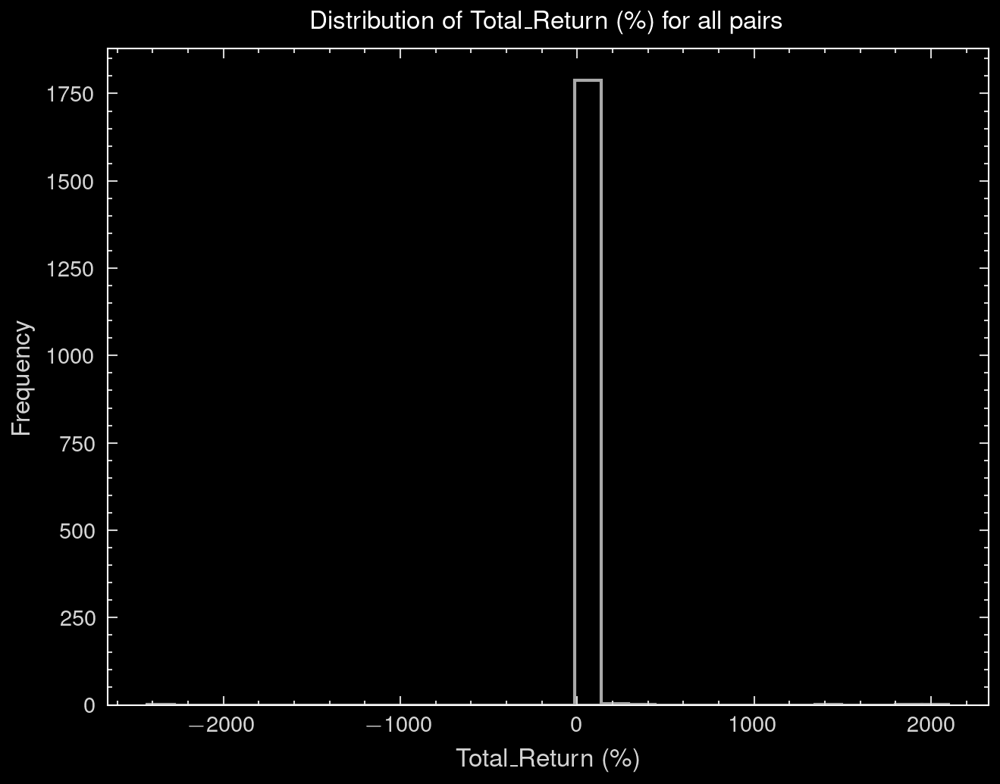

In [ ]:
plt.hist(metrics_df['Total_Return (%)'], bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Total_Return (\%)", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Distribution of Total_Return (\%) for all pairs", fontsize = 8);

In [ ]:
metrics_df['Total_Return (%)'].mean(), metrics_df['Total_Return (%)'].max(), metrics_df['Total_Return (%)'].min(), metrics_df['Total_Return (%)'].std()

(5.187810176937681, 2100.198395325764, -2429.4472107378824, 101.21882324859573)

In [ ]:
all_res

,Price1,Price2,PricePrev1,PricePrev2,ExpectedAction1,ExpectedAction2,Action1,Action2,ExpectedShares1,ExpectedShares2,Shares1,Shares2,DiffPrice1,DiffPrice2,CrossPrice,OpenClose,Side,LengthOpen,Net,Gross
0,41.482977,82.779748,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,False,opening,0,400,0.000000,0.000000
1,41.949146,83.672211,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,False,opening,0,400,0.000000,0.000000
2,41.023494,81.818006,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,False,opening,0,400,0.000000,0.000000
3,41.303240,82.445065,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,False,opening,0,400,0.000000,0.000000
4,42.277979,84.462577,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,False,opening,0,400,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,137.682763,275.155908,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,False,opening,0,400,142.054052,146.054052
386,140.865538,281.555430,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,False,opening,0,400,142.054052,146.054052
387,138.085630,276.020784,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,False,opening,0,400,142.054052,146.054052
388,137.083403,274.004063,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,0.0,False,opening,0,400,142.054052,146.054052


In [ ]:
res_df_actions = all_res[((all_res['ExecutedTrade1']!=0) | (all_res['ExecutedTrade2']!=0))]
res_df_actions[:30]

,Price1,Price2,PricePrev1,PricePrev2,ExpectedAction1,ExpectedAction2,Action1,Action2,ExpectedShares1,ExpectedShares2,Shares1,Shares2,DiffPrice1,DiffPrice2,CrossPrice,OpenClose,Side,LengthOpen,Net,Gross
189,29.248618,58.779416,29.268618,58.759416,853.0,-426.0,853.0,-426.0,853.0,-426.0,853,-426,0.000000,0.000000,False,opening,-1,400,-27.580000,65.379756
219,30.570309,60.962956,29.268618,58.759416,-853.0,426.0,-853.0,426.0,0.0,0.0,0,0,1076.222222,-955.748169,True,closing,-1,371,142.054052,146.054052


### Just one pair

In [ ]:
df = simulate_mean_reverting_pair(
    S0=np.random.uniform(50, 400),
    mu=0.0002,
    sigma=0.002,
    N=390 * 10,  # Simulating 10 days
    trend_factor=0,
    shocks_1=[],
    shocks_2=[],
    shock_magnitude=0.05,
    hedge_ratio=2,
    error_variance=0.1,
    theta=0.0001,
    mean_spread=0,
    seed=34  # Different seed for diversity
)

simulated_pair = [np.array(df["Price1"]), np.array(df["Price2"])]


In [ ]:
# multiply the first 10 prime numbers
from sympy import primerange

primes = list(primerange(2, 17))
result = 1
for prime in primes:
    result *= prime
    
result

30030

In [ ]:
simulated_pair

[array([370.86150603, 370.30763577, 369.1532262 , ..., 370.6139897 ,
        371.37940863, 370.58434217]),
 array([741.72301206, 740.68238444, 738.32931149, ..., 741.31157255,
        742.64877341, 740.97542577])]

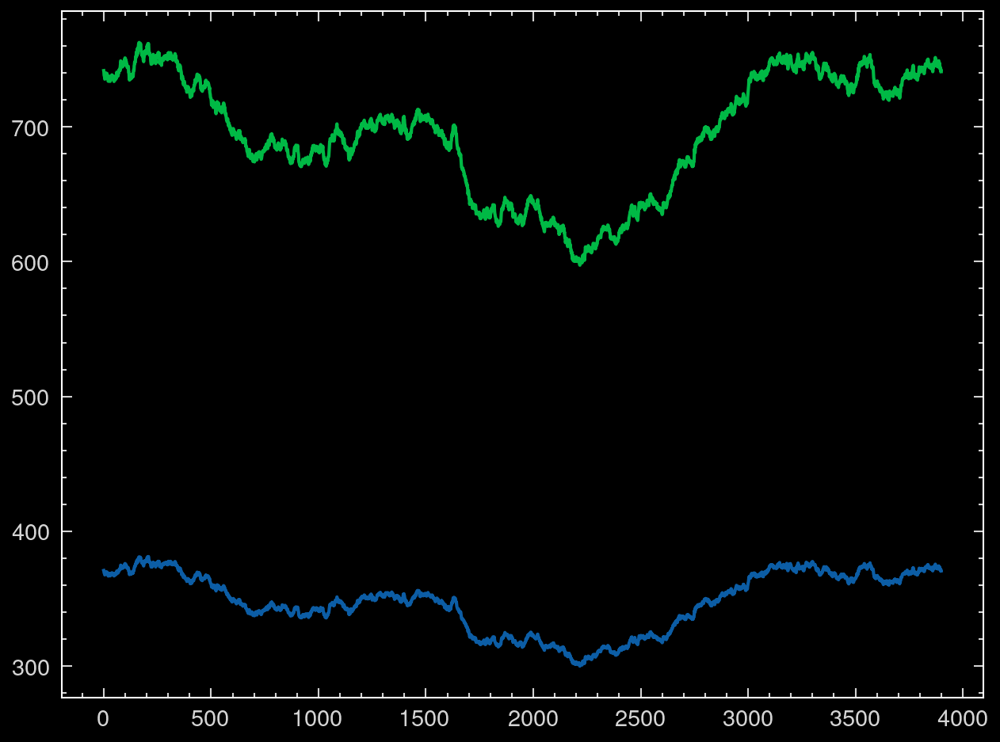

In [ ]:
plt.plot(simulated_pair[0])
plt.plot(simulated_pair[1])

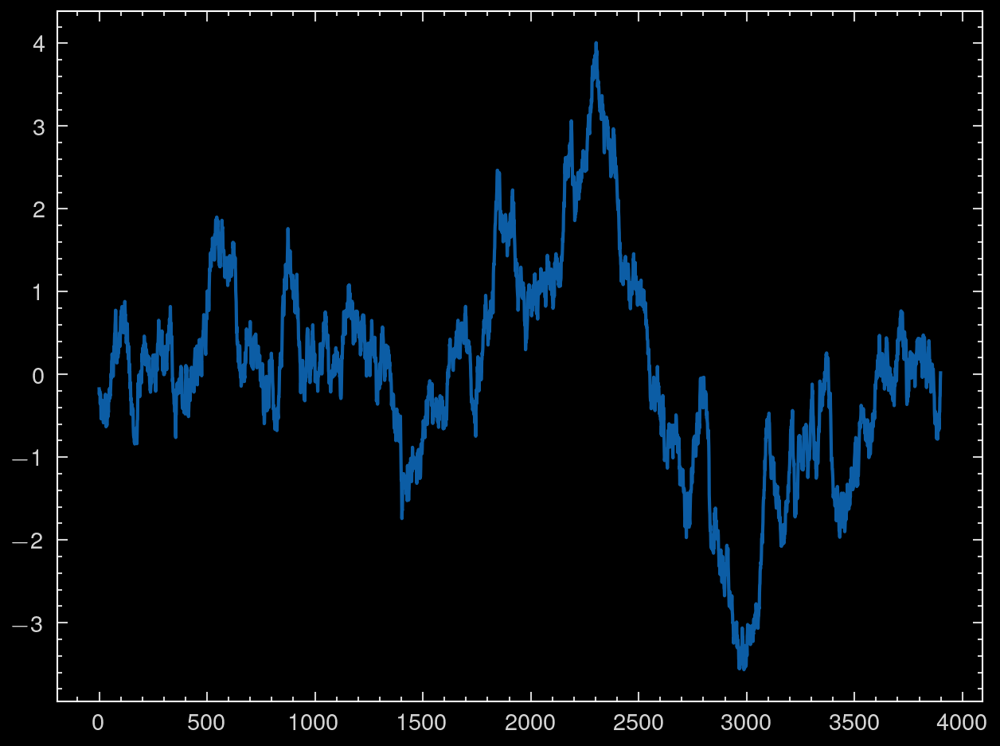

In [ ]:
# first compute the hedge ratio and then plot the spread for the pair with index 201
prices1 = simulated_pair[0]
prices2 = simulated_pair[1]
hedge_ratio = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
spread = hedge_ratio * prices1 - prices2 
#plot the spread
plt.plot(spread)

In [ ]:
# Parameters
lookback = 10
budget = 50000
threshold_gain = 10

# Define the simulated unique days (assuming each simulation is day_length days long)
num_days_simulated = 2  # Adjust this if needed
unique_days_simulated = np.arange(num_days_simulated)

# pair_index = 201
# pair_prices = simulated_paired_prices[pair_index]
pair_prices = simulated_pair
day_length = int(len(pair_prices[0])/num_days_simulated)


last_portfolio = [0, 0]
last_prices_portfolio = [0, 0]
last_Rpnl = 0
last_net = 0
last_side = 0
last_commissions = 0
last_length_open = 0
all_last_net = []
all_net = [0]
all_res = pd.DataFrame()
net_worth = budget
all_spreads = []
all_rescaled_spreads = []
all_nb_trades = []
status_list = []

# First day's prices
prices1 = pair_prices[0][:day_length]  # First day_length points = first day's prices
prices2 = pair_prices[1][:day_length]

last_hedge_ratio = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
all_last_hedge_ratios = [last_hedge_ratio]

mean_hedge_ratio = last_hedge_ratio

i = 0
for day_idx in unique_days_simulated[1:]:
    # Get the prices for the current day (assuming day_length prices per day)
    start_idx = day_idx * day_length
    end_idx = (day_idx + 1) * day_length
    prices1 = pair_prices[0][start_idx:end_idx]
    prices2 = pair_prices[1][start_idx:end_idx]

    if len(prices1) == 0 or len(prices2) == 0:
        continue  # Skip if there's missing data
    

    # Simulate trading
    res_sim = trd.simulate_trading_rescaled_e_cst(
        price_list1=prices1,
        price_list2=prices2,
        error_rate=0.01,
        money_invested=net_worth,
        leave_profit=1000000,
        leave_loss=-1000000,
        startingStep=1,
        min_gain=threshold_gain,
        c_edge=0.0,
        max_open=400,
        temp_loss=20,
        memory_es=30,
        ratio_open_close=1,
        hedge_ratio=[mean_hedge_ratio, 0],
        init_portfolio=last_portfolio,
        prices_init_portfolio=last_prices_portfolio,
        init_Rpnl=last_Rpnl,
        init_net=last_net,
        init_side=last_side,
        init_commissions=last_commissions,
        init_length_open=last_length_open,
        max_trades=100
    )

    all_net += list(res_sim.res_df['CumulativePnL'])
    all_res = pd.concat([all_res, res_sim.res_df])
    all_spreads += res_sim.all_es
    all_rescaled_spreads += res_sim.rescaled_es
    all_nb_trades += [res_sim.nb_trades]
    status_list += res_sim.all_statuses

    last_portfolio = np.array(res_sim.res_df[['Shares1', 'Shares2']])[-1]
    if last_portfolio[0] != 0 and last_portfolio[1] != 0:
        last_prices_portfolio = np.array(res_sim.res_df[['EntryPrice1', 'EntryPrice2']])[-1]
    else:
        last_prices_portfolio = [0, 0]

    last_Rpnl = np.array(res_sim.res_df['RealizedPnL'])[-1]
    last_net = np.array(res_sim.res_df['CumulativePnL'])[-1]
    net_worth = net_worth + last_net
    last_side = np.array(res_sim.res_df['Side'])[-1]
    last_length_open = res_sim.length_open
    last_commissions = res_sim.commissions

    last_hedge_ratio = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
    all_last_hedge_ratios += [last_hedge_ratio]
    if res_sim.res_df['PositionsStatus'].iloc[-1] != 'open':
        mean_hedge_ratio = np.mean(all_last_hedge_ratios[max(0, i - lookback + 1):i + 1])

    
    i += 1

all_res['Spread'] = all_spreads
all_res['Rescaled_Spread'] = all_rescaled_spreads
metrics_pair = trd.compute_trading_metrics(all_res, initial_balance=budget)


In [ ]:
err_TLS = trd.orthogonal_regression(prices_1=prices1, prices_2=prices2)[2]
np.mean(err_TLS)

2.9150471210670777e-17

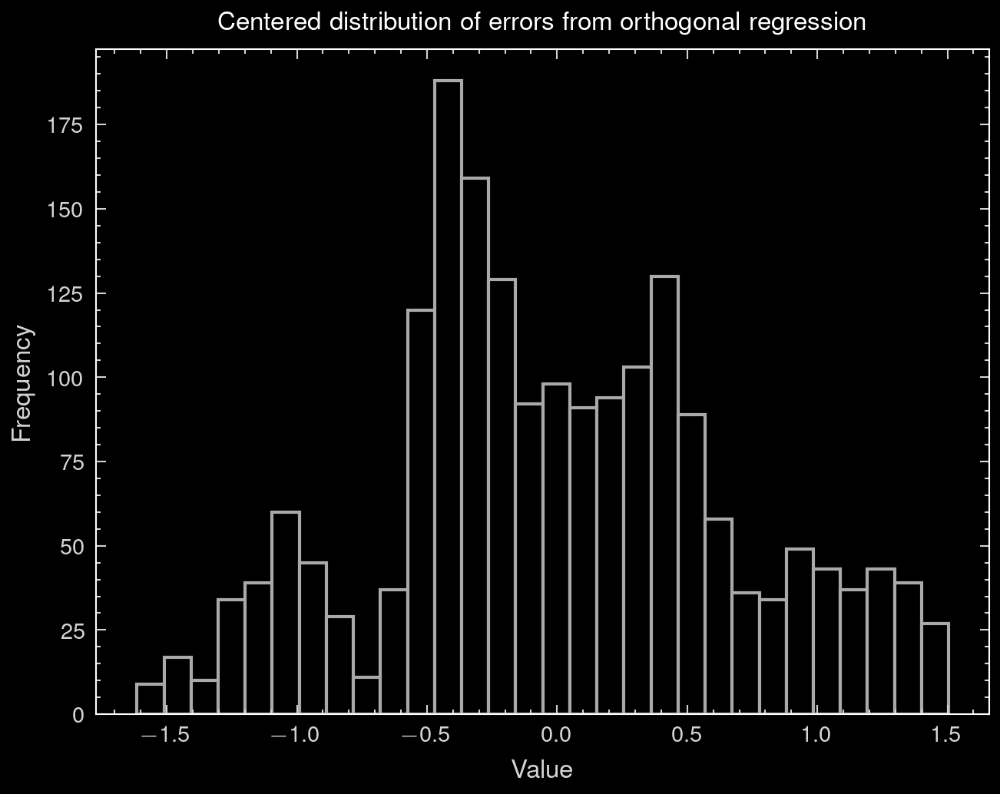

In [ ]:
plt.hist(err_TLS, bins = 30, edgecolor = 'darkgray', color = 'black');
plt.xlabel("Value", fontsize = 8)
plt.ylabel("Frequency", fontsize = 8)
plt.title("Centered distribution of errors from orthogonal regression", fontsize = 8);

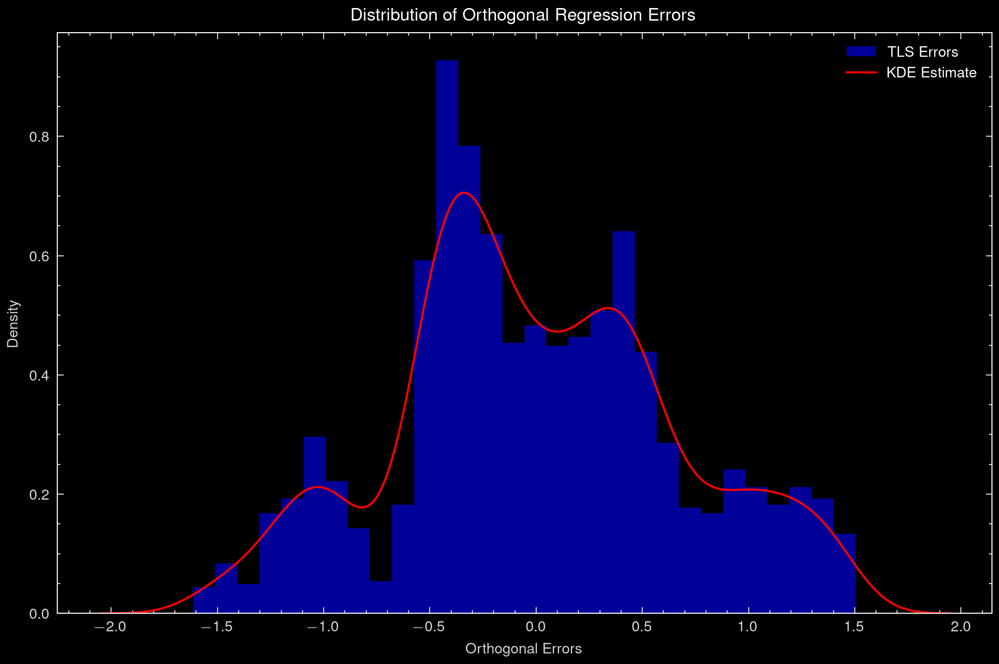

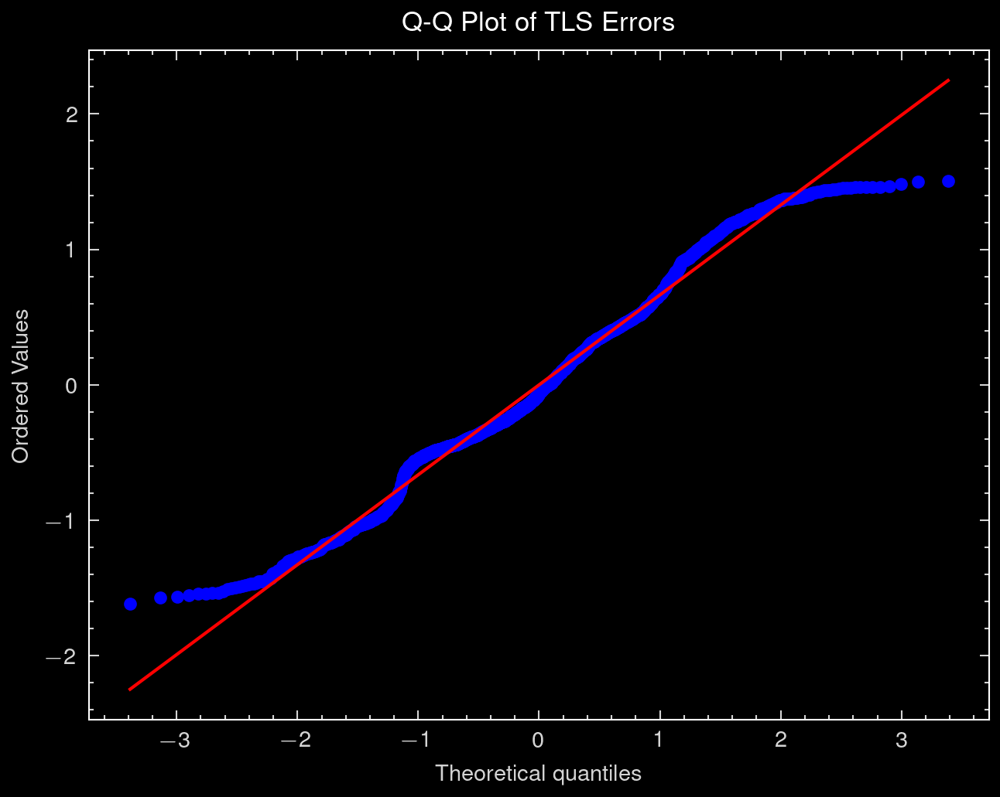

Shapiro-Wilk Test: p-value = 6.257293021508064e-13


In [ ]:
import scipy.stats as stats
import seaborn as sns

# Plot histogram and KDE
plt.figure(figsize=(8,5))
plt.hist(err_TLS, bins=30, density=True, alpha=0.6, color='blue', label="TLS Errors")
sns.kdeplot(err_TLS, color='red', label="KDE Estimate")
plt.xlabel("Orthogonal Errors")
plt.ylabel("Density")
plt.title("Distribution of Orthogonal Regression Errors")
plt.legend()
plt.show()

# Q-Q Plot
stats.probplot(err_TLS, dist="norm", plot=plt)
plt.title("Q-Q Plot of TLS Errors")
plt.show()

# Shapiro-Wilk test for normality
shapiro_test = stats.shapiro(err_TLS)
print(f"Shapiro-Wilk Test: p-value = {shapiro_test.pvalue}")

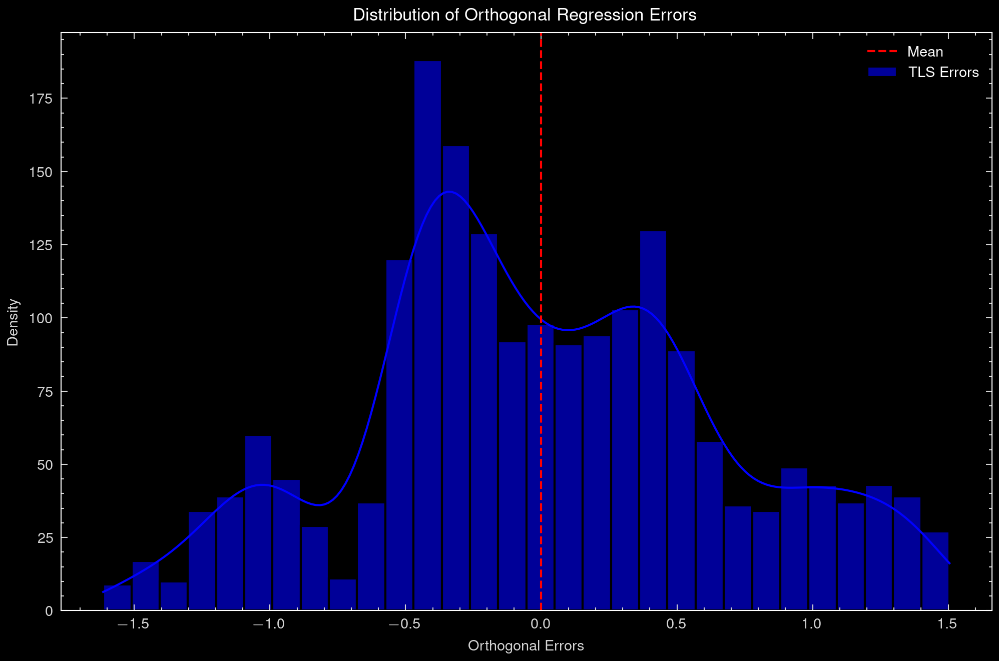

Skewness of TLS Errors: 0.10969958253868654
✅ The errors appear symmetric.


In [ ]:
import seaborn as sns
from scipy.stats import skew

# Generate TLS errors using previous function

# Plot histogram and KDE
plt.figure(figsize=(8,5))
sns.histplot(err_TLS, bins=30, kde=True, color='blue', alpha=0.6, label="TLS Errors")
plt.axvline(np.mean(err_TLS), color='red', linestyle='dashed', label="Mean")
plt.xlabel("Orthogonal Errors")
plt.ylabel("Density")
plt.title("Distribution of Orthogonal Regression Errors")
plt.legend()
plt.show()

# Compute skewness
skewness_value = skew(err_TLS)
print(f"Skewness of TLS Errors: {skewness_value}")

# Interpretation
if abs(skewness_value) < 0.5:
    print("✅ The errors appear symmetric.")
elif skewness_value > 0.5:
    print("⚠️ The errors are positively skewed (long right tail).")
else:
    print("⚠️ The errors are negatively skewed (long left tail).")

In [ ]:
status_list[807:815]

['open', 'open', 'open', 'open', 'open', 'open', 'open', 'open']

In [ ]:
all_nb_trades

[31]

In [ ]:
metrics_pair

{'Start_Balance': 50000,
 'Final_Balance': 50003.6474060663,
 'Total_Return (%)': 0.00729481213259664,
 'Time_in_Market (%)': 91.43589743589745,
 'Max_Drawdown (%)': -0.6115847279301542,
 'Max_Drawdown_Duration': 2,
 'Sharpe Ratio': 0.0021363719766504773,
 'Total_Trades': 31,
 'Wins': 29,
 'Losses': 2,
 'Winrate (%)': 93.54838709677419,
 'Avg_Risk_Reward': 0.13506421043672792}

In [ ]:
#re-index all_res from 0 to len(all_res)
all_res_full_index = all_res.reset_index(drop=True)
all_res_full_index

,Price1,Price2,EntryPrice1,EntryPrice2,Order1,Order2,ExecutedTrade1,ExecutedTrade2,PlannedShares1,PlannedShares2,...,UnrealizedPnL1,UnrealizedPnL2,CrossPrice,PositionsStatus,Side,HoldingDuration,RealizedPnL,CumulativePnL,Spread,Rescaled_Spread
0,314.374764,627.629060,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,False,closed,0,0,0.000000,0.000000,-0.748641,-0.748641
1,314.582812,627.825146,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,False,closed,0,0,0.000000,0.000000,-0.968404,-0.968404
2,315.536591,629.750969,315.536591,629.750969,-79.0,40.0,-79.0,40.0,-79.0,40.0,...,0.000000,0.000000,False,closed,1,0,0.000000,-2.000000,-0.949011,-37.760502
3,316.060404,630.688957,315.536591,629.750969,0.0,0.0,0.0,0.0,-79.0,40.0,...,-41.381252,37.519497,False,open,1,1,0.000000,-5.861756,-1.058031,-41.970325
4,315.232384,629.021129,315.536591,629.750969,0.0,0.0,0.0,0.0,-79.0,40.0,...,24.032383,-29.193596,False,open,1,2,0.000000,-7.161214,-1.070796,-42.409915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1945,371.742991,743.762493,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-39.522814,26.459754,False,open,-1,44,127.579623,-13.483436,0.716192,24.111235
1946,371.858662,743.822113,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-31.772816,24.432656,False,open,-1,45,127.579623,-7.760537,0.544606,18.314591
1947,370.613990,741.311573,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-115.165870,109.791047,False,open,-1,46,127.579623,-5.795200,0.521938,17.548849
1948,371.379409,742.648773,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-63.882802,64.326218,False,open,-1,47,127.579623,0.023039,0.329206,11.106058


In [ ]:
all_res_full_index.tail()

,Price1,Price2,EntryPrice1,EntryPrice2,Order1,Order2,ExecutedTrade1,ExecutedTrade2,PlannedShares1,PlannedShares2,...,UnrealizedPnL1,UnrealizedPnL2,CrossPrice,PositionsStatus,Side,HoldingDuration,RealizedPnL,CumulativePnL,Spread,Rescaled_Spread
1945,371.742991,743.762493,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-39.522814,26.459754,False,open,-1,44,127.579623,-13.483436,0.716192,24.111235
1946,371.858662,743.822113,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-31.772816,24.432656,False,open,-1,45,127.579623,-7.760537,0.544606,18.314591
1947,370.613990,741.311573,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-115.165870,109.791047,False,open,-1,46,127.579623,-5.795200,0.521938,17.548849
1948,371.379409,742.648773,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-63.882802,64.326218,False,open,-1,47,127.579623,0.023039,0.329206,11.106058
1949,370.584342,740.975426,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-117.152255,121.220037,False,open,-1,48,127.579623,3.647406,0.245051,8.251050


In [ ]:
res_df_actions = all_res_full_index[((all_res_full_index['ExecutedTrade1']!=0) | (all_res_full_index['ExecutedTrade2']!=0))]
res_df_actions

,Price1,Price2,EntryPrice1,EntryPrice2,Order1,Order2,ExecutedTrade1,ExecutedTrade2,PlannedShares1,PlannedShares2,...,UnrealizedPnL1,UnrealizedPnL2,CrossPrice,PositionsStatus,Side,HoldingDuration,RealizedPnL,CumulativePnL,Spread,Rescaled_Spread
2,315.536591,629.750969,315.536591,629.750969,-79.0,40.0,-79.0,40.0,-79.0,40.0,...,0.000000,0.000000,False,closed,1,0,0.000000,-2.000000,-0.949011,-37.760502
10,316.782575,632.486358,315.536591,629.750969,79.0,-40.0,79.0,-40.0,0.0,0.0,...,-98.432699,109.415564,True,open,1,0,10.982865,17.965729,-0.704115,-27.851660
11,317.672146,634.179725,317.672146,634.179725,-79.0,39.0,-79.0,39.0,-79.0,39.0,...,0.000000,0.000000,False,closed,1,0,10.982865,4.982865,-0.788840,-31.162773
21,320.608521,640.418002,317.672146,634.179725,79.0,-39.0,79.0,-39.0,0.0,0.0,...,-231.973603,243.292791,True,open,1,0,22.302053,25.621241,-0.419840,-16.411664
22,321.312816,641.839501,321.312816,641.839501,-78.0,39.0,-78.0,39.0,-78.0,39.0,...,0.000000,0.000000,False,closed,1,0,22.302053,12.302053,-0.406097,-15.847616
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1864,372.158110,744.174310,372.158110,744.174310,67.0,-34.0,67.0,-34.0,67.0,-34.0,...,0.000000,0.000000,False,closed,-1,0,103.561448,-16.438552,0.298260,10.036198
1867,372.116286,743.723360,372.158110,744.174310,-67.0,34.0,-67.0,34.0,0.0,0.0,...,-2.802259,15.332284,True,open,-1,0,116.091473,6.621498,-0.069090,-2.330358
1883,373.641332,747.172116,373.641332,747.172116,67.0,-33.0,67.0,-33.0,67.0,-33.0,...,0.000000,0.000000,False,closed,-1,0,116.091473,-7.908527,0.331377,11.095927
1893,372.364993,744.232635,373.641332,747.172116,-67.0,33.0,-67.0,33.0,0.0,0.0,...,-85.514733,97.002883,True,open,-1,0,127.579623,13.067774,-0.056935,-1.911373


In [ ]:
res_df_actions[res_df_actions['PositionsStatus'] == 'open']

,Price1,Price2,EntryPrice1,EntryPrice2,Order1,Order2,ExecutedTrade1,ExecutedTrade2,PlannedShares1,PlannedShares2,...,UnrealizedPnL1,UnrealizedPnL2,CrossPrice,PositionsStatus,Side,HoldingDuration,RealizedPnL,CumulativePnL,Spread,Rescaled_Spread
10,316.782575,632.486358,315.536591,629.750969,79.0,-40.0,79.0,-40.0,0.0,0.0,...,-98.432699,109.415564,True,open,1,0,10.982865,17.965729,-0.704115,-27.851660
21,320.608521,640.418002,317.672146,634.179725,79.0,-39.0,79.0,-39.0,0.0,0.0,...,-231.973603,243.292791,True,open,1,0,22.302053,25.621241,-0.419840,-16.411664
26,323.272346,646.093267,321.312816,641.839501,78.0,-39.0,78.0,-39.0,0.0,0.0,...,-152.843346,165.896856,True,open,1,0,35.355563,36.409073,-0.069074,-2.677070
431,309.272525,615.642119,322.837540,644.989610,77.0,-39.0,77.0,-39.0,0.0,0.0,...,1044.506120,-1144.552163,False,open,1,0,-64.690481,-180.736524,-2.537139,-102.647731
439,309.533458,616.237781,308.368511,613.683307,81.0,-41.0,81.0,-41.0,0.0,0.0,...,-94.360683,104.733416,True,open,1,0,-54.317748,-63.945015,-2.463033,-99.797041
452,312.628375,623.026906,309.145299,615.682775,81.0,-40.0,81.0,-40.0,0.0,0.0,...,-282.129159,293.765246,True,open,1,0,-42.681660,-55.045573,-1.860081,-74.741137
459,312.614420,623.305974,312.250193,622.304630,80.0,-40.0,80.0,-40.0,0.0,0.0,...,-29.138128,40.053726,True,open,1,0,-31.766062,-48.850463,-1.553121,-62.293536
464,313.269517,624.934135,312.064852,622.271500,80.0,-40.0,80.0,-40.0,0.0,0.0,...,-96.373219,106.505420,True,open,1,0,-21.633861,-43.501660,-1.234379,-49.399307
469,313.750452,626.226835,314.065914,626.544959,80.0,-40.0,80.0,-40.0,0.0,0.0,...,25.236966,-12.724956,True,open,1,0,-9.121851,-32.609841,-0.902980,-35.972860
506,321.074010,641.098411,313.439392,625.502562,80.0,-40.0,80.0,-40.0,0.0,0.0,...,-610.769428,623.833984,True,open,1,0,3.942705,-22.992740,-0.669858,-26.234396


In [ ]:
res_df_actions['UnrealizedPnL1'].sum() + res_df_actions['UnrealizedPnL2'].sum(), res_df_actions['RealizedPnL']

(119.23188845470304,
 2         0.000000
 10       10.982865
 11       10.982865
 21       22.302053
 22       22.302053
            ...    
 1864    103.561448
 1867    116.091473
 1883    116.091473
 1893    127.579623
 1901    127.579623
 Name: RealizedPnL, Length: 66, dtype: float64)

In [ ]:
# compute the realized pnl plus total unrealized pnl using all_res_full_index
realized_pnl = all_res_full_index['RealizedPnL']
unrealized_pnl = all_res_full_index['UnrealizedPnL1'] + all_res_full_index['UnrealizedPnL2']
total_pnl = realized_pnl + unrealized_pnl
#total_pnl
# code to understand why the total pnl is not equal to the cumulative pnl
cumulative_pnl = all_res_full_index['CumulativePnL']
cumulative_pnl

0       0.000000
1       0.000000
2      -2.000000
3      -5.861756
4      -7.161214
          ...   
1945   -8.853580
1946   -3.130680
1947   -1.165343
1948    4.652896
1949    8.277263
Name: CumulativePnL, Length: 1950, dtype: float64

In [ ]:
(res_df_actions[res_df_actions['PositionsStatus'] == 'open']['UnrealizedPnL1']+res_df_actions[res_df_actions['PositionsStatus'] == 'open']['UnrealizedPnL2']).cumsum() - res_df_actions[res_df_actions['PositionsStatus'] == 'open']['RealizedPnL']

10      0.0
21      0.0
26      0.0
431     0.0
439     0.0
452     0.0
459     0.0
464     0.0
469     0.0
506     0.0
584     0.0
593     0.0
637     0.0
1041    0.0
1083    0.0
1110    0.0
1119    0.0
1127    0.0
1133    0.0
1139    0.0
1263    0.0
1354    0.0
1417    0.0
1660    0.0
1696    0.0
1742    0.0
1747    0.0
1774    0.0
1806    0.0
1839    0.0
1867    0.0
1893    0.0
dtype: float64

In [ ]:
net_worth

50008.277262962656

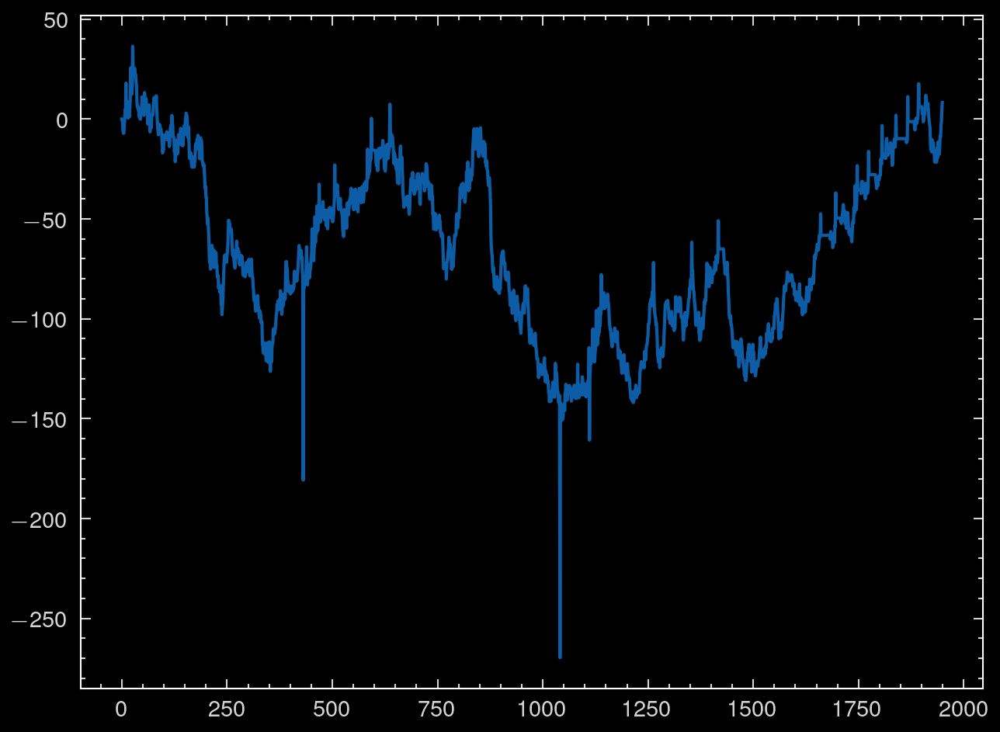

In [ ]:
plt.plot(all_res_full_index['CumulativePnL'])

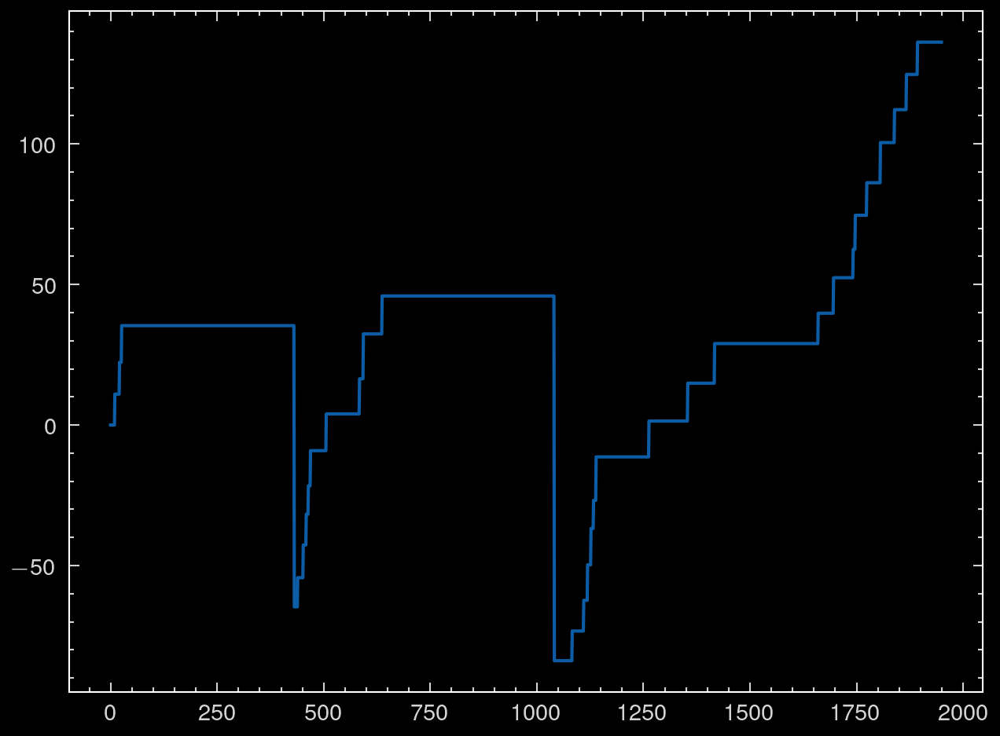

In [ ]:
plt.plot(all_res_full_index['RealizedPnL'])

In [ ]:
# create a new df from all_res_full_index such that 'PositionsStatus'=='open'
df_open = all_res_full_index[all_res_full_index['PositionsStatus']=='open']
len(df_open)/len(all_res_full_index)

0.9123076923076923

In [ ]:
df_open

,Price1,Price2,EntryPrice1,EntryPrice2,Order1,Order2,ExecutedTrade1,ExecutedTrade2,PlannedShares1,PlannedShares2,...,UnrealizedPnL1,UnrealizedPnL2,CrossPrice,PositionsStatus,Side,HoldingDuration,CumulativePnL,RealizedPnL,Spread,Rescaled_Spread
3,316.060404,630.688957,315.536591,629.750969,0.0,0.0,0.0,0.0,-79.0,40.0,...,-41.381252,37.519497,False,open,1,1,-5.861756,0.00000,-1.058031,-41.970325
4,315.232384,629.021129,315.536591,629.750969,0.0,0.0,0.0,0.0,-79.0,40.0,...,24.032383,-29.193596,False,open,1,2,-7.161214,0.00000,-1.070796,-42.409915
5,314.681246,627.935598,315.536591,629.750969,0.0,0.0,0.0,0.0,-79.0,40.0,...,67.572273,-72.614862,False,open,1,3,-7.042589,0.00000,-1.054704,-41.882808
6,315.375555,629.402419,315.536591,629.750969,0.0,0.0,0.0,0.0,-79.0,40.0,...,12.721847,-13.942016,False,open,1,4,-3.220169,0.00000,-0.975680,-38.812147
7,315.790673,630.295878,315.536591,629.750969,0.0,0.0,0.0,0.0,-79.0,40.0,...,-20.072463,21.796367,False,open,1,5,-0.276095,0.00000,-0.911965,-36.195391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1945,371.742991,743.762493,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-39.522814,26.459754,False,open,-1,44,-8.853580,136.20948,0.716192,24.111235
1946,371.858662,743.822113,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-31.772816,24.432656,False,open,-1,45,-3.130680,136.20948,0.544606,18.314591
1947,370.613990,741.311573,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-115.165870,109.791047,False,open,-1,46,-1.165343,136.20948,0.521938,17.548849
1948,371.379409,742.648773,372.332883,744.540721,0.0,0.0,0.0,0.0,67.0,-34.0,...,-63.882802,64.326218,False,open,-1,47,4.652896,136.20948,0.329206,11.106058


In [ ]:
# detect the different orders in df_open by looking at the different EntryPrices
df_open['EntryPrice1'].value_counts()


78.880030    86
90.586770    63
85.407465    63
93.558748    56
82.344003    54
             ..
81.711028     1
81.642438     1
81.547612     1
90.492780     1
81.990512     1
Name: EntryPrice1, Length: 100, dtype: int64

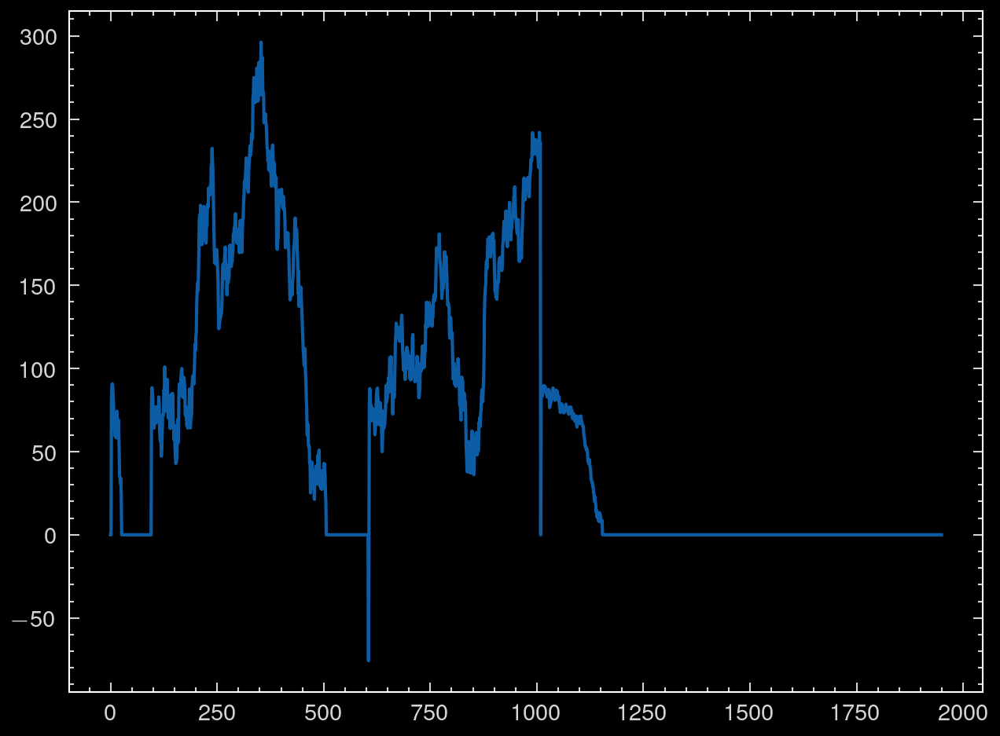

In [ ]:
plt.plot(all_res_full_index['Spread']*all_res_full_index['Shares1']/2 + all_res_full_index['Spread']*all_res_full_index['Shares2']/2)

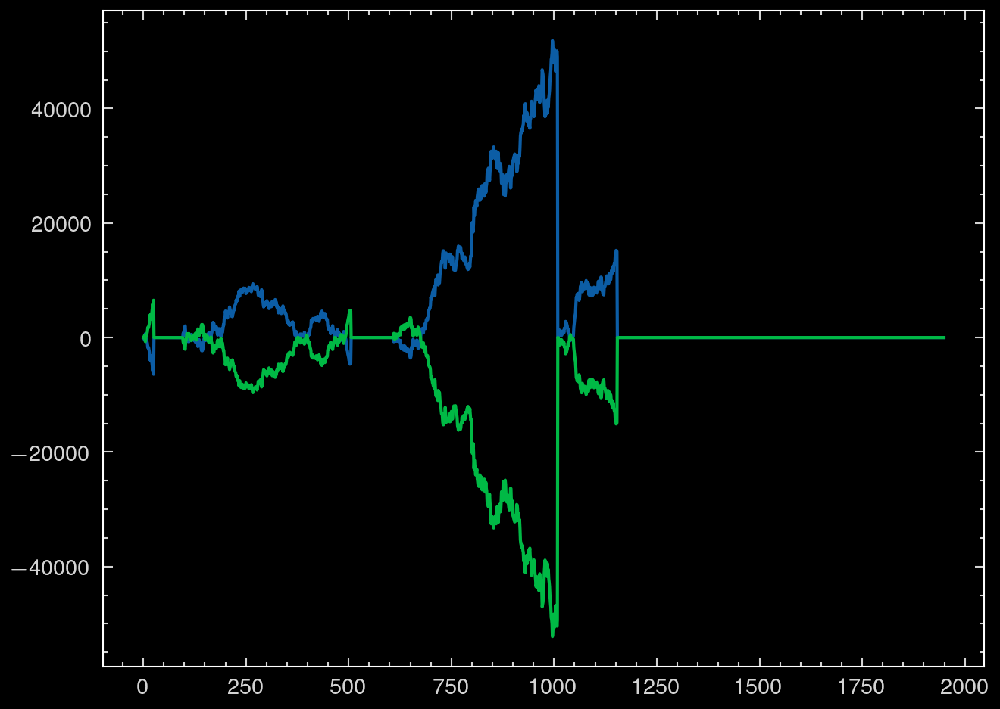

In [ ]:
plt.plot(all_res_full_index['Shares1']*(all_res_full_index['Price1'] - all_res_full_index['EntryPrice1']) - np.abs(all_res_full_index['Shares1']*2*0.02))
plt.plot(all_res_full_index['Shares2']*(all_res_full_index['Price2'] - all_res_full_index['EntryPrice2']) - np.abs(all_res_full_index['Shares2']*2*0.02))

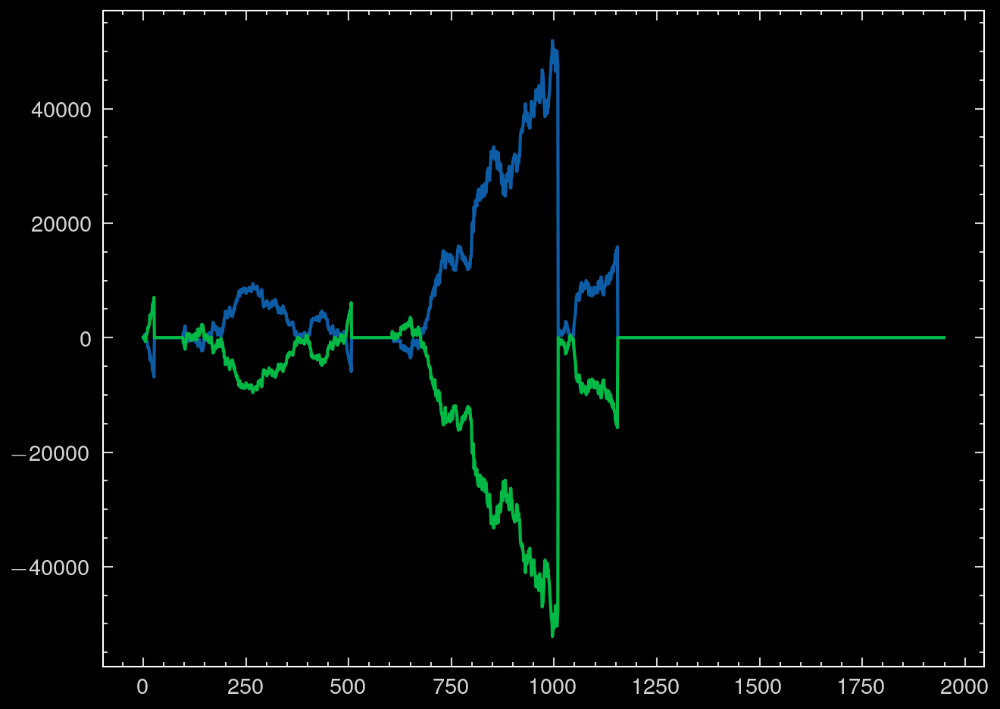

In [ ]:
plt.plot(all_res_full_index['UnrealizedPnL1'])
plt.plot(all_res_full_index['UnrealizedPnL2'])

In [ ]:
real_edge = 0
recomputedDiffPrice1 = all_res_full_index['Shares1']*(all_res_full_index['Price1'] - all_res_full_index['EntryPrice1']) - np.abs(all_res_full_index['Shares1']*2*real_edge)
recomputedDiffPrice2 = all_res_full_index['Shares2']*(all_res_full_index['Price2'] - all_res_full_index['EntryPrice2']) - np.abs(all_res_full_index['Shares2']*2*real_edge)

np.where((recomputedDiffPrice1 - all_res_full_index['UnrealizedPnL1'])!=0)

(array([  26,  506, 1009, 1154]),)

In [ ]:
np.where((recomputedDiffPrice2 - all_res_full_index['UnrealizedPnL2'])!=0)

(array([  26,  506,  606, 1009, 1154]),)

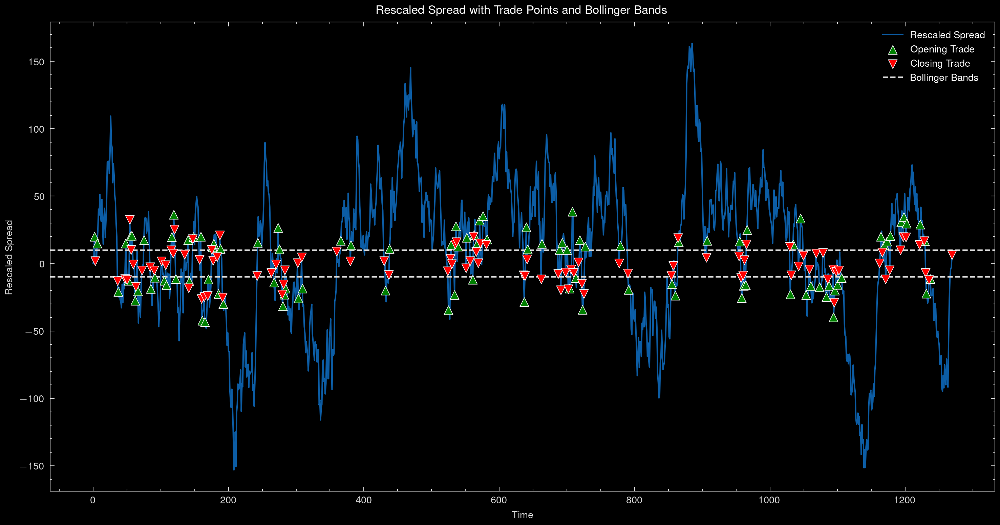

In [ ]:
# Plot of the rescaled spread and mark the points where a trade was made.
# Add the bollinger bands to the plot where the value of the bands is given by +/- the parameter min_gain in the cell where I simulate the trading algorithm
# Let the trade points appear on the plot above the rescaled spread
# The trade points should be marked with a green dot if the trade was an opening trade and a red dot if the trade was a closing trade  They all should have a white circle around them
plt.figure(figsize=(12, 6))
plt.plot(all_res_full_index['Rescaled_Spread'], label='Rescaled Spread')
# Trade points: Opening (Green Triangle Up) and Closing (Red Triangle Down)
plt.scatter(
    res_df_actions[res_df_actions['PositionsStatus'] == 'closed'].index, 
    res_df_actions[res_df_actions['PositionsStatus'] == 'closed']['Rescaled_Spread'], 
    color='green', marker='^', edgecolors='white', linewidth=0.4, s=40, label='Opening Trade', zorder=5
)
plt.scatter(
    res_df_actions[res_df_actions['PositionsStatus'] == 'open'].index, 
    res_df_actions[res_df_actions['PositionsStatus'] == 'open']['Rescaled_Spread'], 
    color='red', marker='v', edgecolors='white', linewidth=0.4, s=40, label='Closing Trade', zorder=5
)
plt.axhline(threshold_gain, color='lightgray', linestyle='dashed', label='Bollinger Bands')
plt.axhline(-threshold_gain, color='lightgray', linestyle='dashed')

plt.xlabel('Time')
plt.ylabel('Rescaled Spread')
plt.title('Rescaled Spread with Trade Points and Bollinger Bands')
plt.legend()



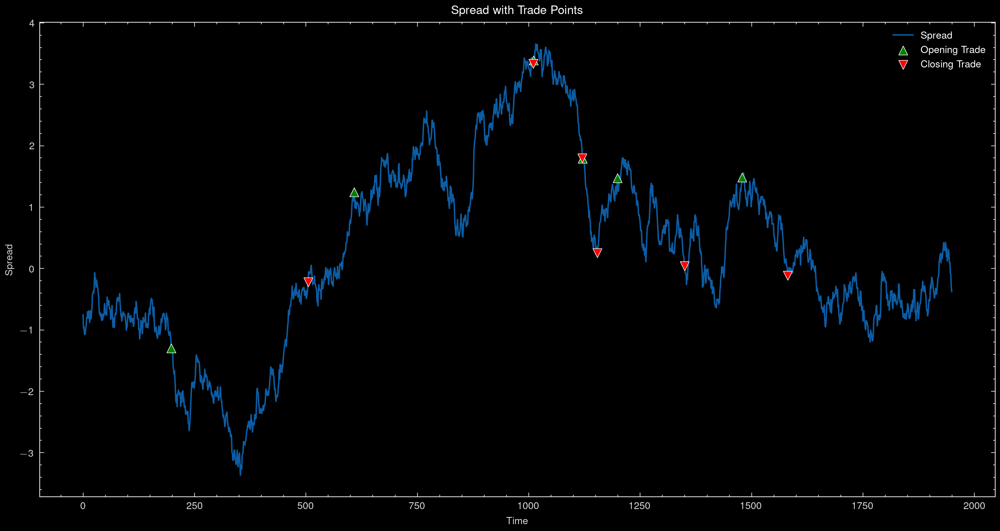

In [ ]:
# Plot of the rescaled spread and mark the points where a trade was made.
# Add the bollinger bands to the plot where the value of the bands is given by +/- the parameter min_gain in the cell where I simulate the trading algorithm
# Let the trade points appear on the plot above the rescaled spread
# The trade points should be marked with a green dot if the trade was an opening trade and a red dot if the trade was a closing trade  They all should have a white circle around them
plt.figure(figsize=(12, 6))
plt.plot(all_res_full_index['Spread'], label='Spread')
# Trade points: Opening (Green Triangle Up) and Closing (Red Triangle Down)
plt.scatter(
    res_df_actions[res_df_actions['PositionsStatus'] == 'closed'].index, 
    res_df_actions[res_df_actions['PositionsStatus'] == 'closed']['Spread'], 
    color='green', marker='^', edgecolors='white', linewidth=0.4, s=40, label='Opening Trade', zorder=5
)
plt.scatter(
    res_df_actions[res_df_actions['PositionsStatus'] == 'open'].index, 
    res_df_actions[res_df_actions['PositionsStatus'] == 'open']['Spread'], 
    color='red', marker='v', edgecolors='white', linewidth=0.4, s=40, label='Closing Trade', zorder=5
)

plt.xlabel('Time')
plt.ylabel('Spread')
plt.title('Spread with Trade Points')
plt.legend()



Text(0.5, 1.0, 'UnrealizedPnL')

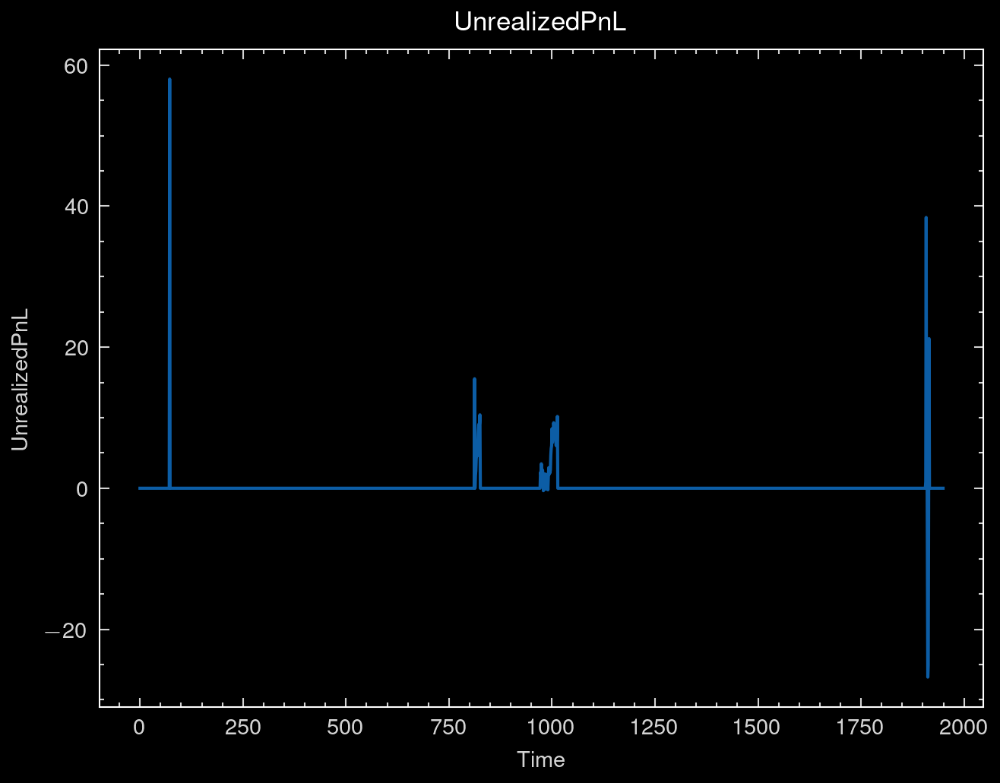

In [ ]:
# plot sum of UnrealizedPnL1 and UnrealizedPnL2 in all_res_full_index
plt.plot(all_res_full_index['UnrealizedPnL1'] + all_res_full_index['UnrealizedPnL2'])
plt.xlabel('Time')
plt.ylabel('UnrealizedPnL')
plt.title('UnrealizedPnL')



Text(0.5, 1.0, 'UnrealizedPnL1 vs UnrealizedPnL2')

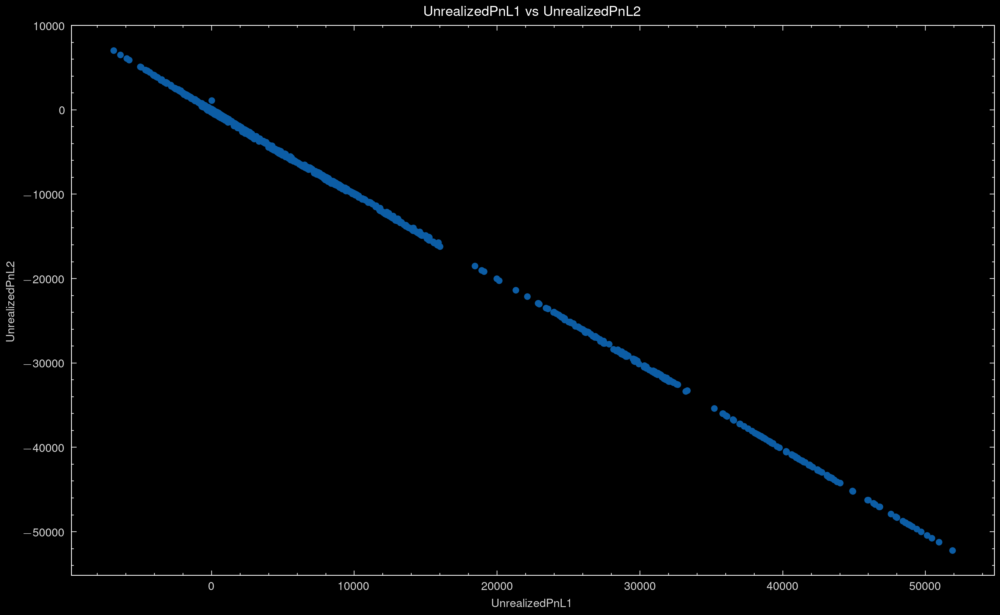

In [ ]:
# scatter plot of sum of DiffPrice1 and DiffPrice2 in all_res_full_index vs Rescaled_Spread
plt.figure(figsize=(10, 6)) # Set the figure size
plt.scatter(all_res_full_index['UnrealizedPnL1'], all_res_full_index['UnrealizedPnL2']) # Scatter plot
plt.xlabel('UnrealizedPnL1') # x-axis label
plt.ylabel('UnrealizedPnL2') # y-axis label
plt.title('UnrealizedPnL1 vs UnrealizedPnL2') # title of the plot

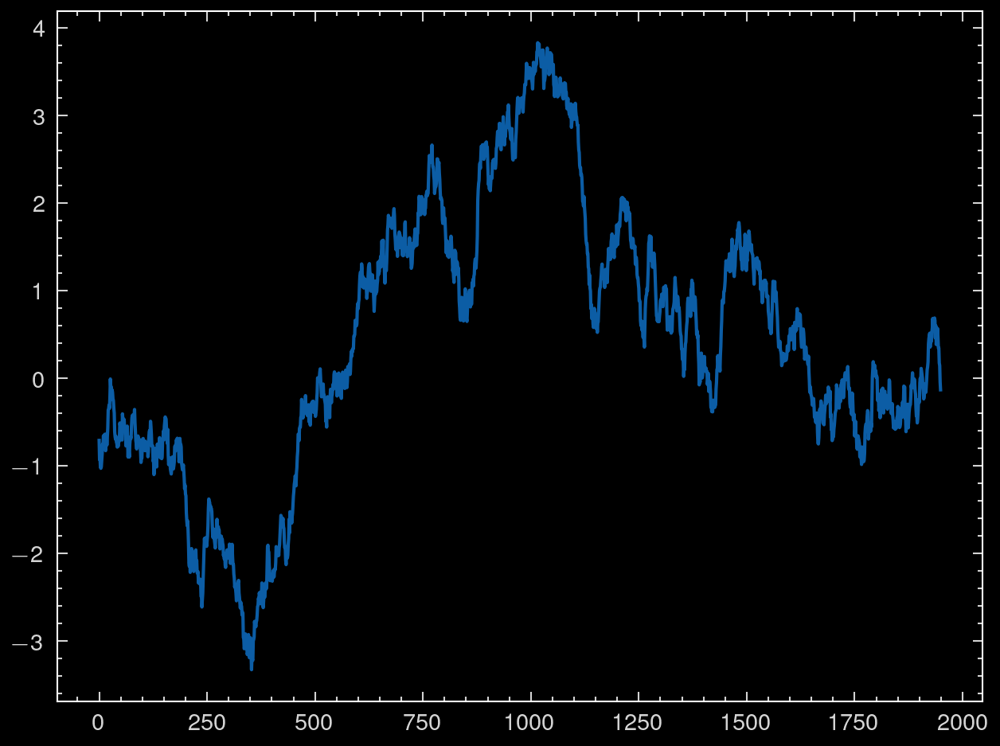

In [ ]:
plt.plot(all_res_full_index['Price2'] - all_last_slopes[0]*all_res_full_index['Price1'])

In [ ]:
((all_res_full_index['Price2'] - all_last_slopes[0]*all_res_full_index['Price1']) - all_res_full_index['Spread'])

0       0.047556
1       0.047872
2       0.049343
3       0.050168
4       0.048869
          ...   
1945    0.253938
1946    0.254729
1947    0.246330
1948    0.251465
1949    0.246133
Length: 1950, dtype: float64

In [ ]:
all_last_slopes[0]

1.9993329505156023

In [ ]:
((all_res_full_index['Price2'] - 2*all_res_full_index['Price1']) - all_res_full_index['Spread'])

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
1945    0.0
1946    0.0
1947    0.0
1948    0.0
1949    0.0
Length: 1950, dtype: float64

In [ ]:
# check where the spread is different than the difference between the price of asset 2 and the slope times the price of asset 1
np.where((all_res_full_index['Spread'] - (all_res_full_index['Price2'] - all_last_slopes[0]*all_res_full_index['Price1']))!=0)

(array([   0,    1,    2, ..., 1947, 1948, 1949]),)

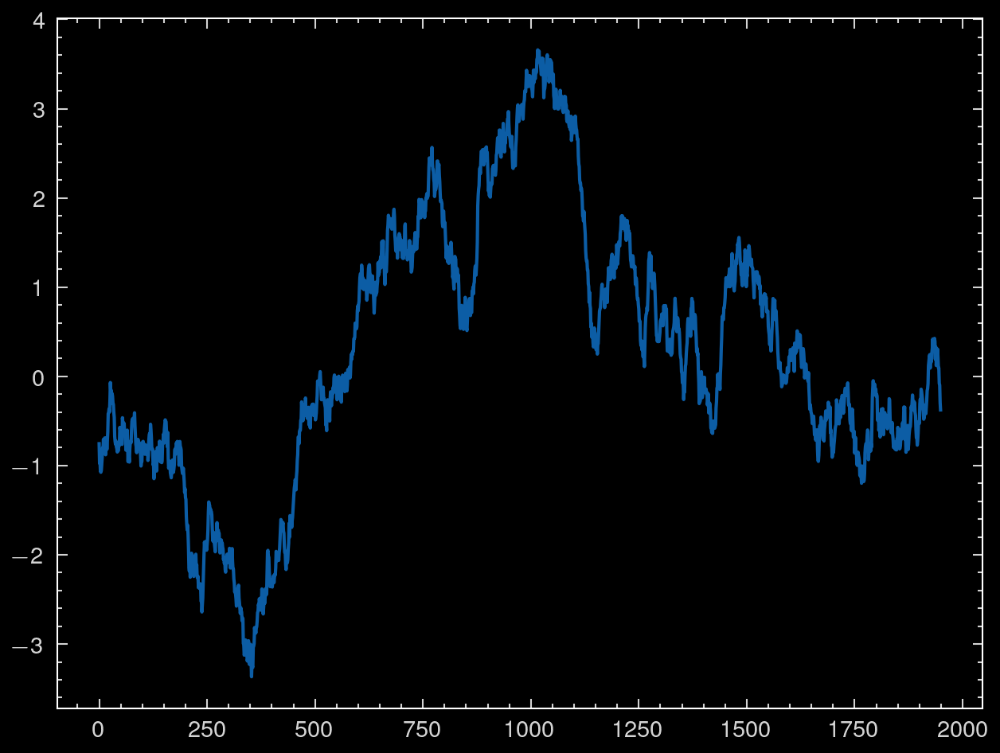

In [ ]:
#plot the spread
plt.plot(all_res_full_index['Spread'])

In [ ]:
# select elemnts of df_open['UnrealizedPnL1']+df_open['UnrealizedPnL2'] such that the value is between -200 and -150
df_open_restricted = df_open[(df_open['UnrealizedPnL1']+df_open['UnrealizedPnL2']>-100) & (df_open['UnrealizedPnL1']+df_open['UnrealizedPnL2']<0)]

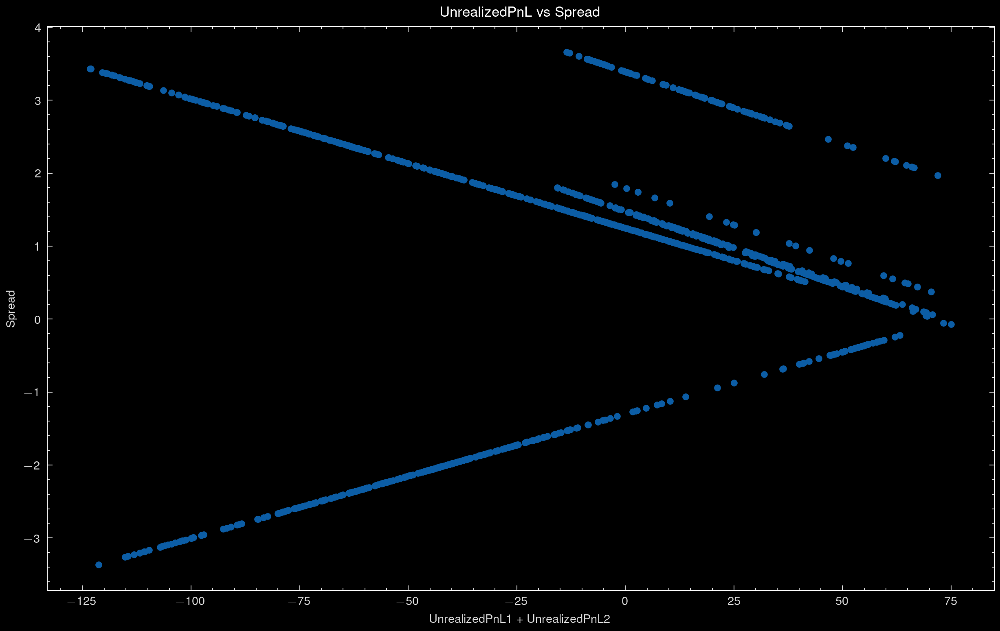

In [ ]:
# scatter plot of sum of UnrealizedPnL1 and UnrealizedPnL2 in all_res_full_index vs Rescaled_Spread
plt.figure(figsize=(10, 6)) # Set the figure size
plt.scatter(df_open['UnrealizedPnL1']+df_open['UnrealizedPnL2'],df_open['Spread']) # Scatter plot
plt.xlabel('UnrealizedPnL1 + UnrealizedPnL2') # x-axis label
plt.ylabel('Spread') # y-axis label
plt.title('UnrealizedPnL vs Spread'); # title of the plot

In [ ]:
set(df_open['EntryPrice1'])

{71.19696151997492, 73.97197476105414, 95.20677521648275, 264.82895153832123}

In [ ]:
len(df_open['EntryPrice1'].unique())

6

/var/folders/dy/0dr1rz555tqczw3kw215bzcw0000gn/T/ipykernel_50664/2263560308.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Set1', num_colors)  # Force unique colors


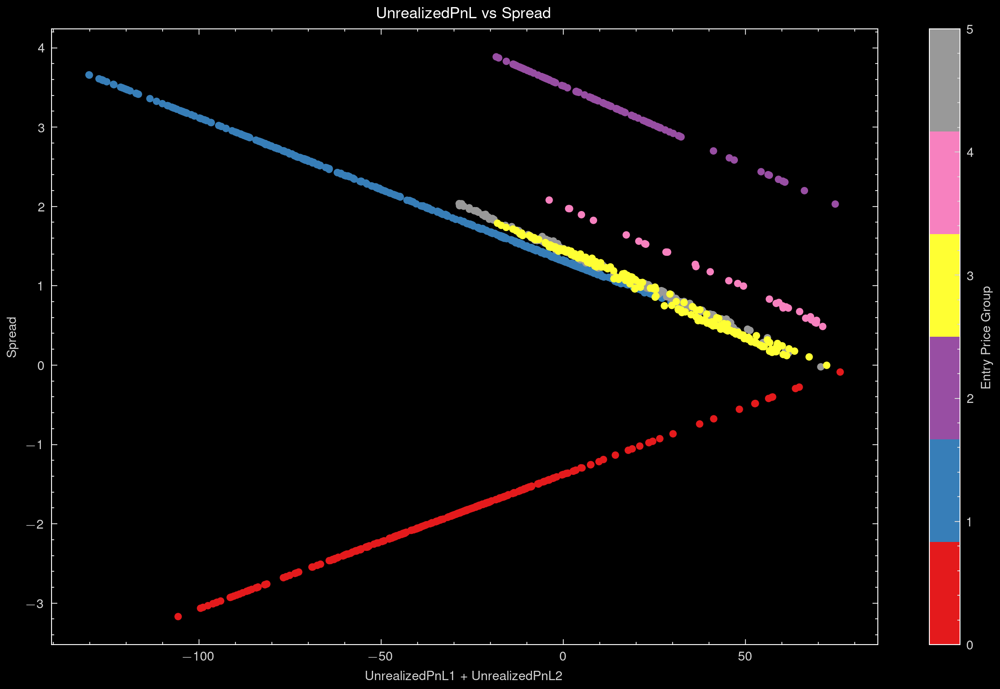

In [ ]:
import matplotlib.cm as cm

# Get unique entry prices
unique_prices = np.unique(df_open['EntryPrice1'])
num_colors = len(unique_prices)

# Use a colormap with explicit category mapping
cmap = cm.get_cmap('Set1', num_colors)  # Force unique colors
color_dict = {price: i for i, price in enumerate(unique_prices)}
colors = [color_dict[price] for price in df_open['EntryPrice1']]

# Scatter plot
plt.figure(figsize=(10, 6))
sc = plt.scatter(df_open['UnrealizedPnL1'] + df_open['UnrealizedPnL2'], df_open['Spread'], c=colors, cmap=cmap)

plt.xlabel('UnrealizedPnL1 + UnrealizedPnL2')
plt.ylabel('Spread')
plt.title('UnrealizedPnL vs Spread')

plt.colorbar(sc, label="Entry Price Group")  # Display correct mapping
plt.show()


In [ ]:
len(df_open['Shares1']*df_open['Price1'] + df_open['Shares2']*df_open['Price2'])

1174

/var/folders/dy/0dr1rz555tqczw3kw215bzcw0000gn/T/ipykernel_50664/2617594263.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_open['PortfolioValue'] = df_open['Shares1']*df_open['Price1'] + df_open['Shares2']*df_open['Price2']
/var/folders/dy/0dr1rz555tqczw3kw215bzcw0000gn/T/ipykernel_50664/2617594263.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('Set1', num_colors)  # Force unique colors


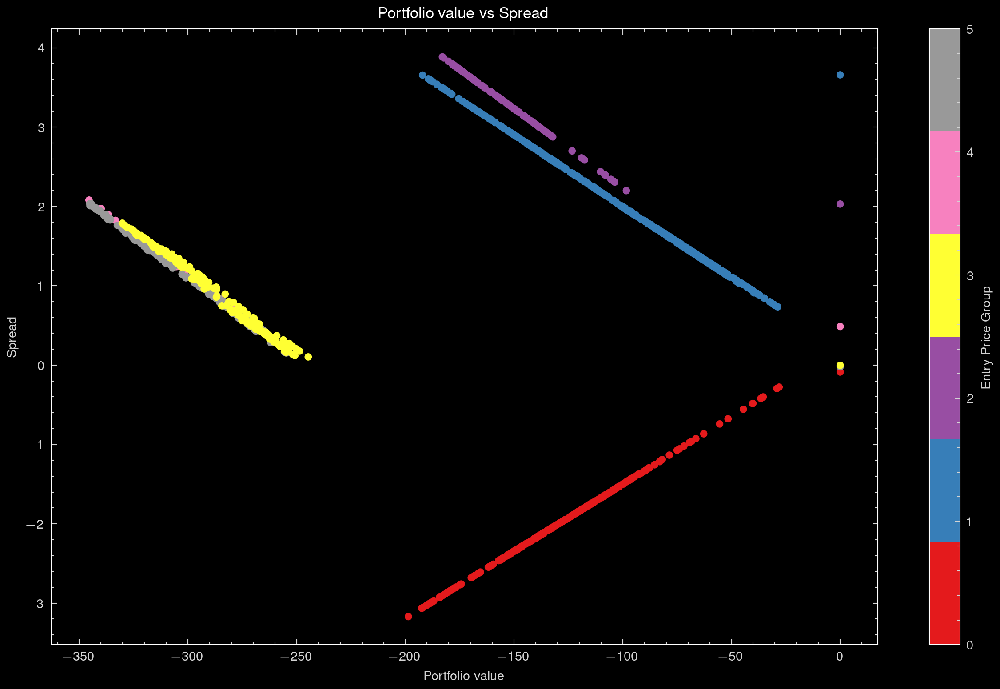

In [ ]:
import matplotlib.cm as cm

df_open['PortfolioValue'] = df_open['Shares1']*df_open['Price1'] + df_open['Shares2']*df_open['Price2']

# Get unique entry prices
unique_prices = np.unique(df_open['EntryPrice1'])
num_colors = len(unique_prices)

# Use a colormap with explicit category mapping
cmap = cm.get_cmap('Set1', num_colors)  # Force unique colors
color_dict = {price: i for i, price in enumerate(unique_prices)}
colors = [color_dict[price] for price in df_open['EntryPrice1']]

# Scatter plot
plt.figure(figsize=(10, 6))
sc = plt.scatter(df_open['PortfolioValue'], df_open['Spread'], c=colors, cmap=cmap)

plt.xlabel('Portfolio value')
plt.ylabel('Spread')
plt.title('Portfolio value vs Spread')

plt.colorbar(sc, label="Entry Price Group")  # Display correct mapping
plt.show()


Text(0.5, 1.0, 'Spread vs Rescaled Spread')

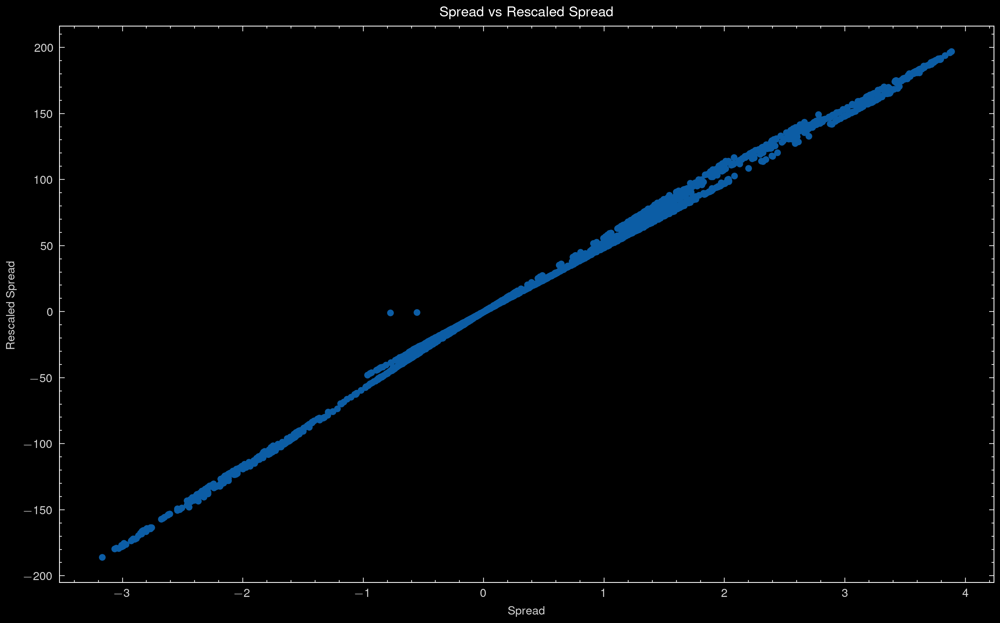

In [ ]:
# scatter plot of spread vs rescaled spread
plt.figure(figsize=(10, 6)) # Set the figure size
plt.scatter(all_res_full_index['Spread'], all_res_full_index['Rescaled_Spread']) # Scatter plot
plt.xlabel('Spread') # x-axis label
plt.ylabel('Rescaled Spread') # y-axis label
plt.title('Spread vs Rescaled Spread') # title of the plot

In [ ]:
# correlation between UnrealizedPnL1 and UnrealizedPnL2
np.corrcoef(all_res_full_index['UnrealizedPnL1'], all_res_full_index['UnrealizedPnL2'])[0][1]

-0.9990984574770899

## Theoretical explorations of stationarity

In [ ]:
df = simulate_mean_reverting_pair(
    S0=np.random.uniform(50, 400),
    mu=0.0002,
    sigma=0.002,
    N=390 * 10,  # Simulating 10 days
    trend_factor=0,
    shocks_1=[],
    shocks_2=[],
    shock_magnitude=0.05,
    hedge_ratio=2,
    error_variance=0.1,
    theta=0.001,
    mean_spread=0,
    seed=34  # Different seed for diversity
)

simulated_pair = [np.array(df["Price1"]), np.array(df["Price2"])]


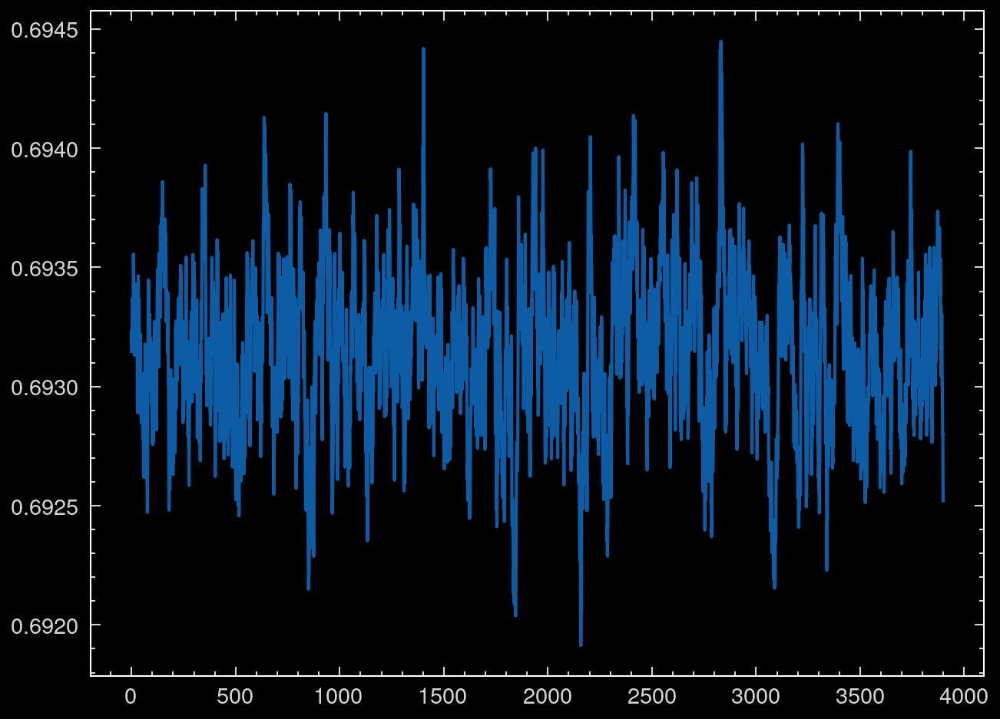

In [ ]:
# plot the difference of log prices
plt.plot(np.log(simulated_pair[1]) - np.log(simulated_pair[0]))

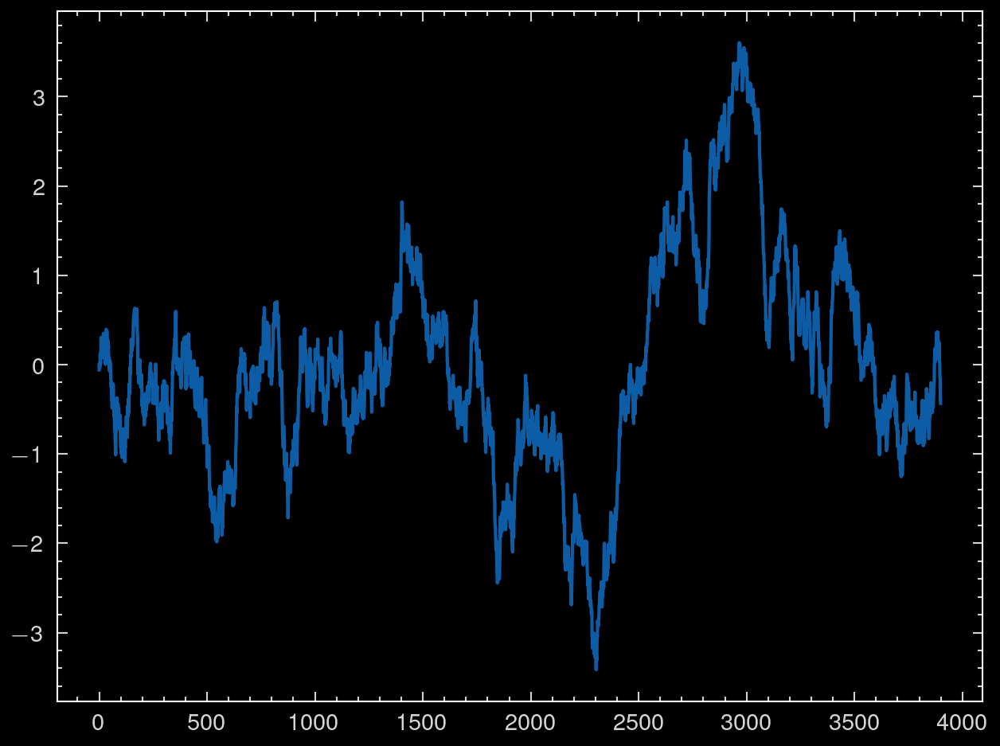

In [ ]:
# compute the linear regression of simulated_pair using my function trd.ols_regression and plot the spread
prices1 = simulated_pair[0]
prices2 = simulated_pair[1]
slope = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
spread = prices2 - slope*prices1
plt.plot(spread)

In [ ]:
# compute the half-life of mean reversion of the spread. I don't have a function for this so I will re-do it from scratch using the spread computed in the above cell
spread = prices2 - slope*prices1
spread_diff = np.diff(spread)
spread_lag = spread[:-1]
import statsmodels.api as sm

spread_lag = sm.add_constant(spread_lag)
model = sm.OLS(spread_diff, spread_lag)
results = model.fit()
halflife = -np.log(2) / results.params[1]
halflife

200.89079101519482

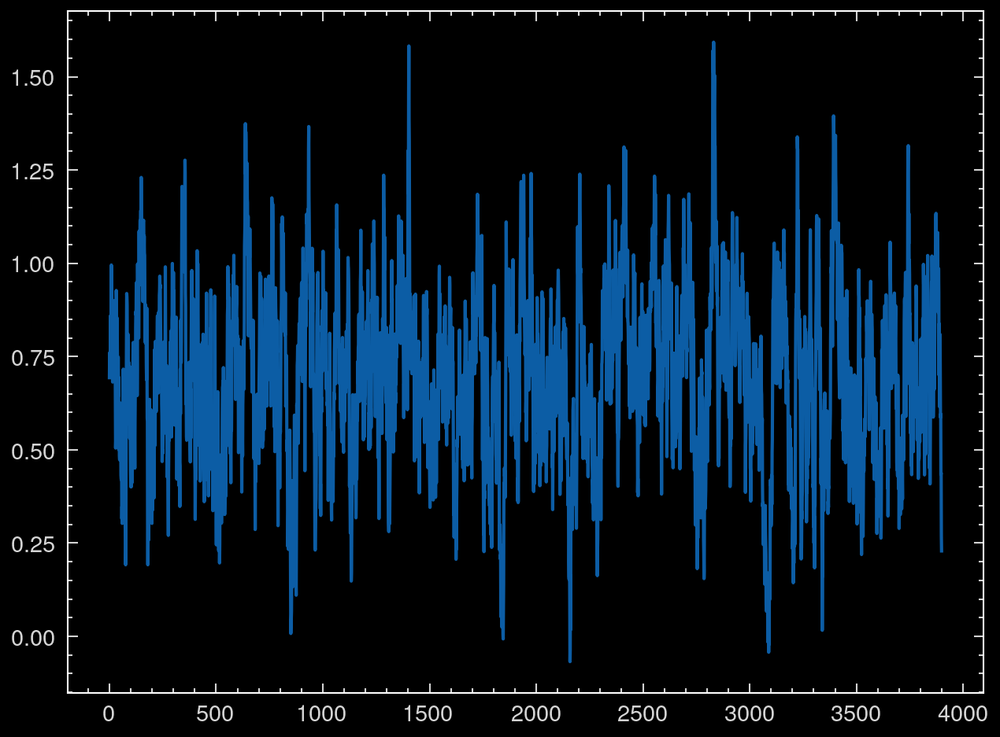

In [ ]:
plt.plot(spread + (np.log(simulated_pair[1]) - np.log(simulated_pair[0])))

### Fourier analysis

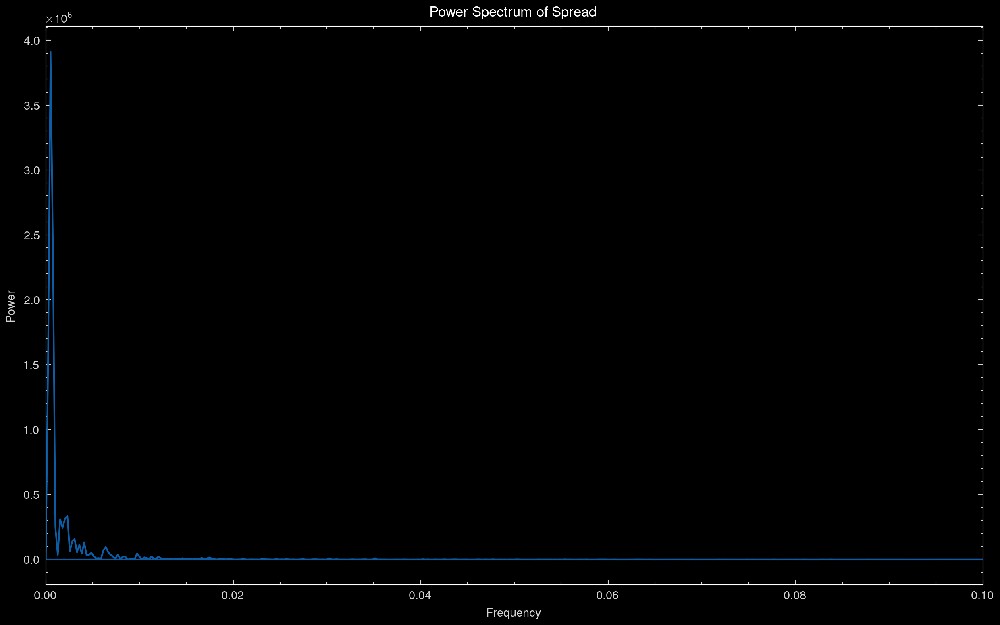

In [ ]:
# Example: Simulated mean-reverting spread
# np.random.seed(42)
T = len(spread)  # Time steps
# t = np.linspace(0, 10, T)
# spread = np.sin(2 * np.pi * 1 * t) + 0.5 * np.random.normal(size=T)

# Compute Fourier Transform
freq = np.fft.fftfreq(len(spread))
fft_spectrum = np.fft.fft(spread)
power_spectrum = np.abs(fft_spectrum) ** 2

# Plot Power Spectrum
plt.figure(figsize=(10, 6))
plt.plot(freq, power_spectrum)
plt.title('Power Spectrum of Spread')
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.xlim(0, 0.1)  # Focus on low-frequency region
plt.show()


In [ ]:
# find the freq of max sprectrum
max_freq = freq[np.argmax(power_spectrum)]
1/(4*max_freq)

487.5

$$\theta \approx 2\pi f_{\text{max}}$$

$$\frac{2\pi}{\theta} \approx \frac{1}{f_{\text{max}}}$$

$$\frac{\pi}{2\theta} \approx \frac{1}{4 f_{\text{max}}}$$


In [ ]:
2*np.pi/0.1

62.83185307179586

In [ ]:
2*np.pi*max_freq

0.04027682889217683

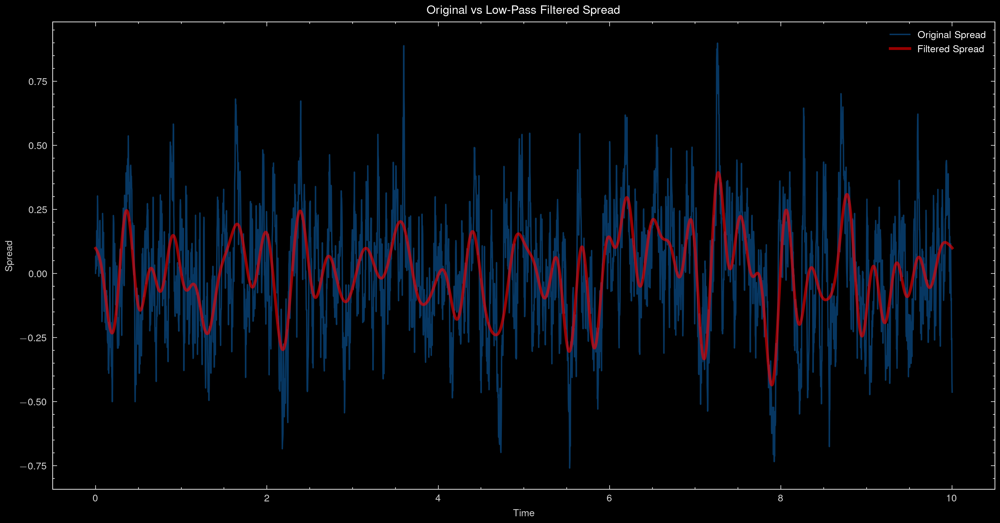

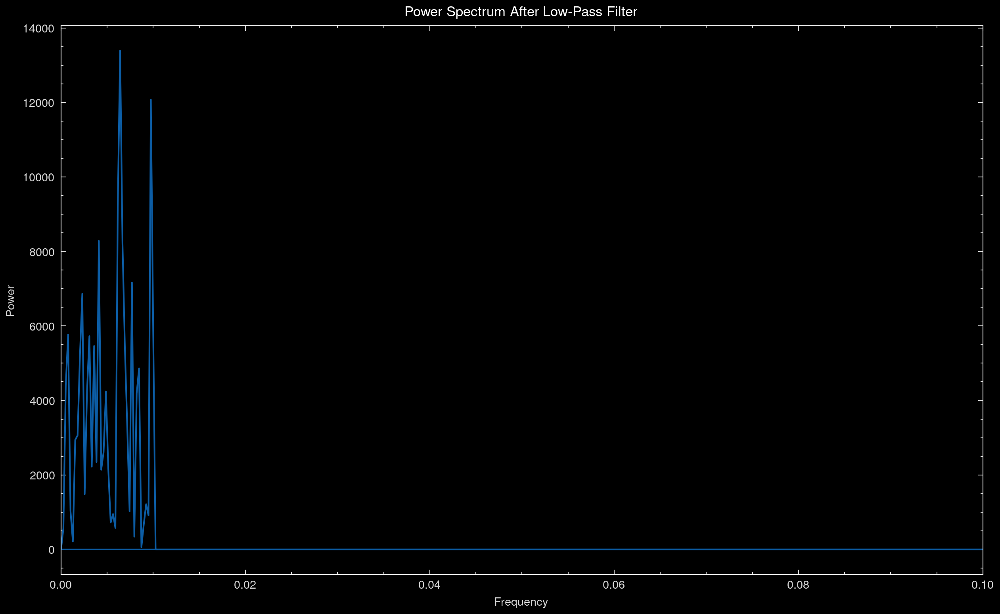

In [ ]:
t = np.linspace(0, 10, len(spread))
# Compute Fourier Transform
freq = np.fft.fftfreq(len(spread))
fft_spectrum = np.fft.fft(spread)

# Apply low-pass filter (keep only low frequencies)
cutoff = 0.1  # Cutoff frequency (adjust based on time horizon)
fft_spectrum[np.abs(freq) > cutoff] = 0

# Inverse Fourier Transform to reconstruct filtered signal
filtered_spread = np.fft.ifft(fft_spectrum)

# Plot Original vs Filtered Signal
plt.figure(figsize=(12, 6))
plt.plot(t, spread, label='Original Spread', alpha=0.6)
plt.plot(t, filtered_spread.real, label='Filtered Spread', color='red', linewidth=2, alpha=0.6)
plt.title('Original vs Low-Pass Filtered Spread')
plt.xlabel('Time')
plt.ylabel('Spread')
plt.legend()
plt.show()

# Plot Power Spectrum
power_spectrum = np.abs(fft_spectrum) ** 2
plt.figure(figsize=(10, 6))
plt.plot(freq, power_spectrum)
plt.title('Power Spectrum After Low-Pass Filter')
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.xlim(0, 0.1)  # Focus on low-frequency region
plt.show()


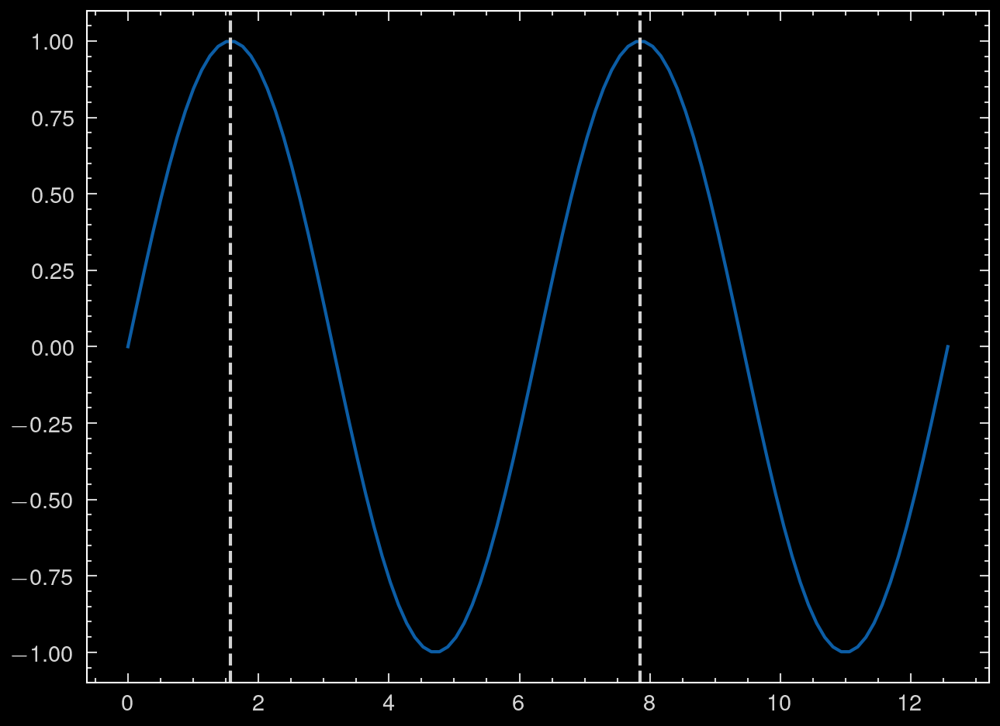

In [ ]:
x = np.linspace(0,4*np.pi,101)
plt.plot(x,np.sin(x))
plt.axvline(x=np.pi/2,color='lightgray',linestyle='--')
plt.axvline(x=np.pi/2+2*np.pi,color='lightgray',linestyle='--')

In [ ]:
# choose 5 integers between 0 and 100
#np.random.seed(42)
indices = np.random.choice(800, 5, replace=False)
# sort indices
indices = np.sort(indices)
indices

array([135, 183, 373, 476, 564])

In [ ]:
np.random.choice(100000)

57650

In [ ]:
indices[0]

63

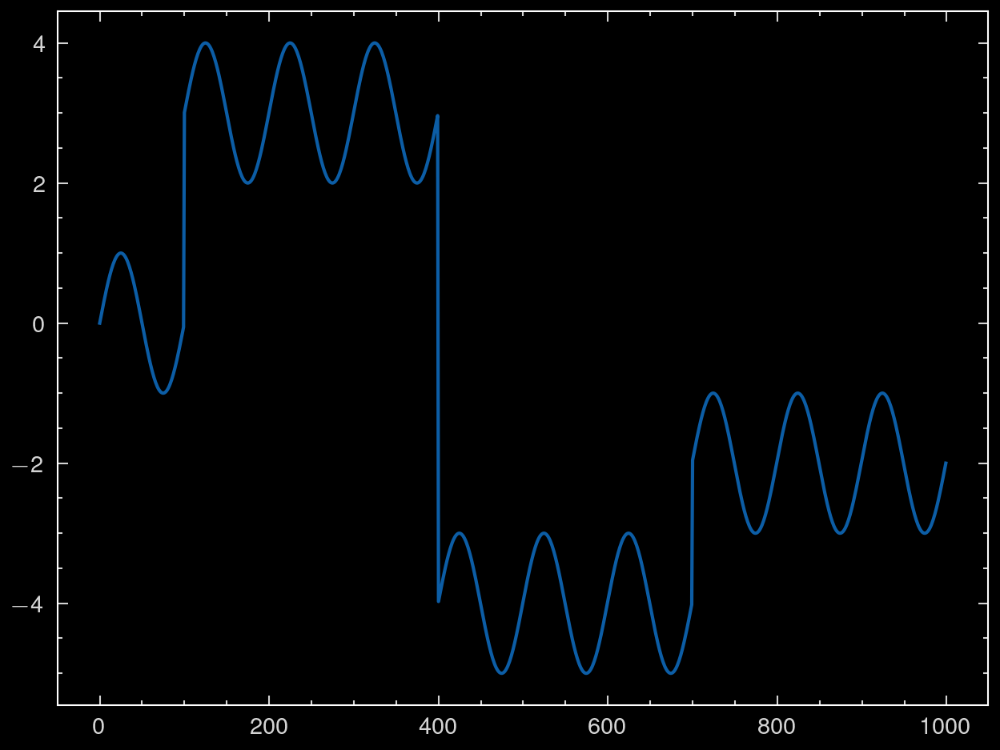

In [ ]:
# generate a sine wave with occasional jumps and drops to the y coordinate so essentially adding or subtracting a constant for the rest of the time series
np.random.seed(42)
t = np.linspace(0, 10, 1000)
signal = np.sin(2 * np.pi * 1 * t) 
signal[100:] += 3
signal[400:] -= 7
signal[700:] += 2
#plot the signal
plt.plot(signal)

In [ ]:
np.arange(0,0.1,0.001)

array([0.   , 0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008,
       0.009, 0.01 , 0.011, 0.012, 0.013, 0.014, 0.015, 0.016, 0.017,
       0.018, 0.019, 0.02 , 0.021, 0.022, 0.023, 0.024, 0.025, 0.026,
       0.027, 0.028, 0.029, 0.03 , 0.031, 0.032, 0.033, 0.034, 0.035,
       0.036, 0.037, 0.038, 0.039, 0.04 , 0.041, 0.042, 0.043, 0.044,
       0.045, 0.046, 0.047, 0.048, 0.049, 0.05 , 0.051, 0.052, 0.053,
       0.054, 0.055, 0.056, 0.057, 0.058, 0.059, 0.06 , 0.061, 0.062,
       0.063, 0.064, 0.065, 0.066, 0.067, 0.068, 0.069, 0.07 , 0.071,
       0.072, 0.073, 0.074, 0.075, 0.076, 0.077, 0.078, 0.079, 0.08 ,
       0.081, 0.082, 0.083, 0.084, 0.085, 0.086, 0.087, 0.088, 0.089,
       0.09 , 0.091, 0.092, 0.093, 0.094, 0.095, 0.096, 0.097, 0.098,
       0.099])

In [ ]:
np.logspace(-5, 0, 100)

array([0.001     , 0.00215443, 0.00464159, 0.01      , 0.02154435,
       0.04641589, 0.1       , 0.21544347, 0.46415888, 1.        ])

In [ ]:
all_min_time_peak_zero = []
n_simulations = 200

# vary theta on a linear scale

#simulate many pairs for each value of c_theta and compute the mean of min_time_peak_zero before storing it in all_min_time_peak_zero

for c_theta in np.linspace(0.0001, 0.1, 100):
    c_min_time_peak_zero = []
    
    for i in range(n_simulations):
        df = simulate_mean_reverting_pair(
            S0=np.random.uniform(50, 400),
            mu=0.0002,
            sigma=0.002,
            N=390 * 30,  # Simulating 10 days
            trend_factor=0,
            shocks_1=[],
            shocks_2=[],
            shock_magnitude=0.05,
            hedge_ratio=2,
            error_variance=0.1,
            theta=c_theta,
            mean_spread=0,
            seed=np.random.choice(100000)  # Different seed for diversity
        )

        simulated_pair = [np.array(df["Price1"]), np.array(df["Price2"])]

        # Compute the spread

        prices1 = simulated_pair[0]
        prices2 = simulated_pair[1]
        slope = trd.ols_regression(prices_1=prices1, prices_2=prices2)[0]
        spread = prices2 - slope*prices1

        # Fourier analysis with minimal time from peak (or trough) to zero

        t = np.linspace(0, 10, len(spread))
        # Compute Fourier Transform
        freq = np.fft.fftfreq(len(spread))
        fft_spectrum = np.fft.fft(spread)

        # Apply low-pass filter (keep only low frequencies)
        cutoff = 0.1  # Cutoff frequency (adjust based on time horizon)
        fft_spectrum[np.abs(freq) > cutoff] = 0

        # Inverse Fourier Transform to reconstruct filtered signal
        filtered_spread = np.fft.ifft(fft_spectrum)
        power_spectrum = np.abs(fft_spectrum) ** 2

        max_freq = np.abs(freq[np.argmax(power_spectrum)])
        min_time_peak_zero = 1/(4*max_freq)
        
        c_min_time_peak_zero += [min_time_peak_zero]
    all_min_time_peak_zero += [np.mean(c_min_time_peak_zero)]


In [ ]:
from joblib import Parallel, delayed
import numpy as np

def simulate_and_compute_min_time_peak_zero(c_theta):
    # Simulate the pair
    df = simulate_mean_reverting_pair(
        S0=np.random.uniform(50, 400),
        mu=0.0002,
        sigma=0.002,
        N=2**12,  # Use power of 2 for fast FFT
        trend_factor=0,
        shocks_1=[],
        shocks_2=[],
        shock_magnitude=0.05,
        hedge_ratio=2,
        error_variance=0.1,
        theta=c_theta,
        mean_spread=0,
        seed=np.random.choice(100000)
    )

    simulated_pair = [np.array(df["Price1"]), np.array(df["Price2"])]

    # Compute the spread using fast numpy-based OLS
    prices1 = simulated_pair[0]
    prices2 = simulated_pair[1]
    slope = np.linalg.lstsq(prices1.reshape(-1, 1), prices2, rcond=None)[0][0]
    spread = prices2 - slope * prices1

    # Fourier Transform
    fft_spectrum = np.fft.fft(spread)
    freq = np.fft.fftfreq(len(spread))

    # Apply low-pass filter
    cutoff = 0.1
    fft_spectrum[np.abs(freq) > cutoff] = 0

    # Power spectrum
    power_spectrum = np.abs(fft_spectrum) ** 2

    # Take the positive peak (ignore negative frequencies)
    positive_freqs = freq[freq > 0]
    positive_power = power_spectrum[freq > 0]

    max_freq = positive_freqs[np.argmax(positive_power)]
    
    if max_freq > 0:
        min_time_peak_zero = 1 / (4 * max_freq)
    else:
        min_time_peak_zero = np.nan  # Handle edge cases
    
    return min_time_peak_zero


# Set parameters
all_min_time_peak_zero = []
n_simulations = 500  # Scale up to more simulations!
thetas = np.linspace(0.0001, 0.1, 100)

# Parallelize across available CPU cores
results = Parallel(n_jobs=-1)(
    delayed(np.mean)([
        simulate_and_compute_min_time_peak_zero(c_theta)
        for _ in range(n_simulations)
    ]) 
    for c_theta in thetas
)

all_min_time_peak_zero = results

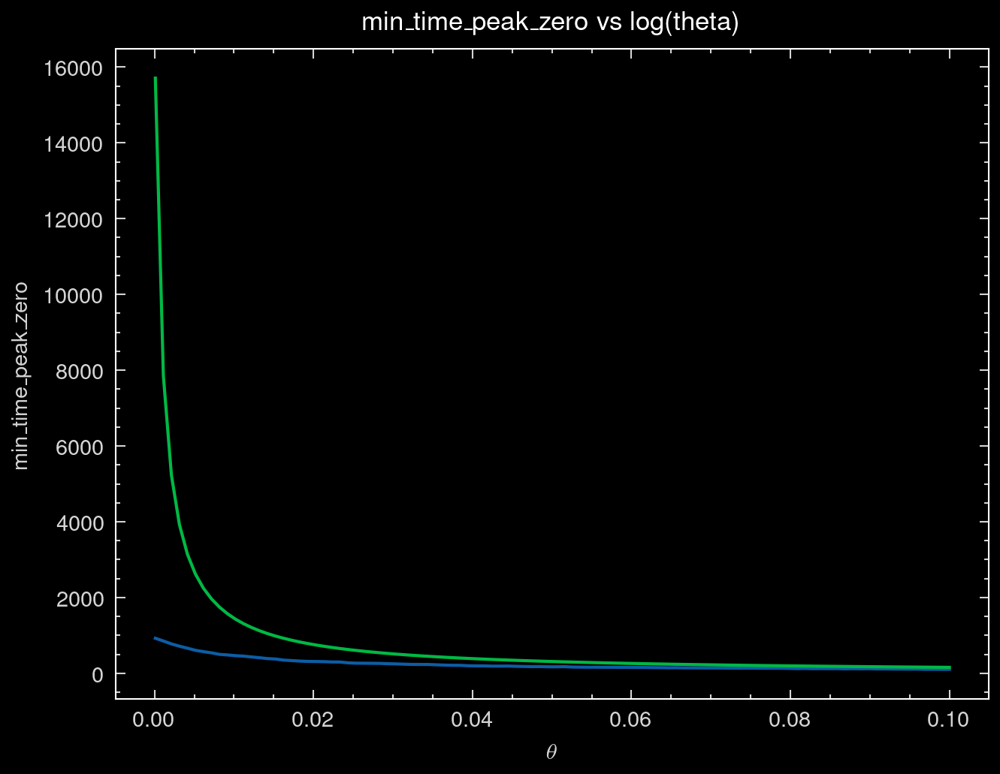

In [ ]:
#plot the above results with the x-axis being the log of theta
theta_values = np.linspace(0.0001, 0.1, 100)
plt.plot(theta_values, all_min_time_peak_zero)
plt.plot(theta_values, np.pi/(2*np.linspace(0.0001, 0.01, 100)))
plt.xlabel('$\\theta$')
plt.ylabel('min_time_peak_zero')
plt.title('min_time_peak_zero vs log(theta)');


## Additional data sources

In [5]:
import yfinance as yf
import pandas as pd

# List of tickers
tickers = ['SPY', 'QQQ', 'IEUR']

# Define date range
start_date = '2021-03-30'
end_date = '2024-03-30'

# Download and save each as a separate CSV
for ticker in tickers:
    data = yf.download(ticker, start=start_date, end=end_date)
    filename = f"{ticker}_3yr_data.csv"
    data.to_csv(filename)
    print(f"Saved {filename}")

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Saved SPY_3yr_data.csv
Saved QQQ_3yr_data.csv


[*********************100%***********************]  1 of 1 completed

Saved IEUR_3yr_data.csv


In [ ]:
import requests

symbol = "AAPL"
url = f"https://finnhub.io/api/v1/stock/insider-transactions?symbol={symbol}&token=your_finnhub_api_key"

response = requests.get(url)
insider_data = response.json()

print(insider_data)

{'error': 'Invalid API key'}


In [ ]:
import pandas as pd


# Fetch data for multiple tickers
earnings_data = {}
for ticker in tickers[:5]:  # Limit to first 5 for demo
    stock = yf.Ticker(ticker)
    earnings_data[ticker] = stock.earnings_dates

earnings_data

MMM: No earnings dates found, symbol may be delisted
AOS: No earnings dates found, symbol may be delisted
ABT: No earnings dates found, symbol may be delisted
ABBV: No earnings dates found, symbol may be delisted
ACN: No earnings dates found, symbol may be delisted


{'MMM': None, 'AOS': None, 'ABT': None, 'ABBV': None, 'ACN': None}

In [ ]:
sp500_df

,Symbol,Security,GICS Sector,GICS Sub-Industry,Headquarters Location,Date added,CIK,Founded
0,MMM,3M,Industrials,Industrial Conglomerates,"Saint Paul, Minnesota",1957-03-04,66740,1902
1,AOS,A. O. Smith,Industrials,Building Products,"Milwaukee, Wisconsin",2017-07-26,91142,1916
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,"North Chicago, Illinois",1957-03-04,1800,1888
3,ABBV,AbbVie,Health Care,Biotechnology,"North Chicago, Illinois",2012-12-31,1551152,2013 (1888)
4,ACN,Accenture,Information Technology,IT Consulting & Other Services,"Dublin, Ireland",2011-07-06,1467373,1989
...,...,...,...,...,...,...,...,...
498,XYL,Xylem Inc.,Industrials,Industrial Machinery & Supplies & Components,"White Plains, New York",2011-11-01,1524472,2011
499,YUM,Yum! Brands,Consumer Discretionary,Restaurants,"Louisville, Kentucky",1997-10-06,1041061,1997
500,ZBRA,Zebra Technologies,Information Technology,Electronic Equipment & Instruments,"Lincolnshire, Illinois",2019-12-23,877212,1969
501,ZBH,Zimmer Biomet,Health Care,Health Care Equipment,"Warsaw, Indiana",2001-08-07,1136869,1927


In [ ]:
from sec_edgar_downloader import Downloader

dl = Downloader("your_email@example.com", "data/")  # Store filings in 'data/' folder

# Download last 10 quarterly reports for AAPL
dl.get("10-Q", "AAPL", after="2015-01-01")  # Set a date range instead

31

In [6]:
import ccxt
import pandas as pd
import time
from datetime import datetime

# Exchange and symbol
exchange = ccxt.binance()
symbol = 'BTC/USDT'
timeframe = '15m'
limit = 1000  # Max per request
since = exchange.parse8601('2024-01-01T00:00:00Z')  # adjust as needed

# Container for data
all_data = []

# Fetch data in chunks
while True:
    print(f"Fetching candles since {exchange.iso8601(since)}...")
    candles = exchange.fetch_ohlcv(symbol, timeframe=timeframe, since=since, limit=limit)
    if not candles:
        break
    all_data += candles
    since = candles[-1][0] + 1  # start after the last timestamp
    time.sleep(exchange.rateLimit / 1000)

    # Stop after ~10,000 candles (about 4 months of 15m data) to avoid long run time
    if len(all_data) >= 10000:
        break

# Convert to DataFrame
df = pd.DataFrame(all_data, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
df['datetime'] = pd.to_datetime(df['timestamp'], unit='ms')
df.set_index('datetime', inplace=True)
df.drop(columns=['timestamp'], inplace=True)

# Save to CSV
df.to_csv('BTC_15min_binance.csv')
print("Saved BTC 15m data to BTC_15min_binance.csv")

Fetching candles since 2024-01-01T00:00:00.000Z...
Fetching candles since 2024-01-11T09:45:00.001Z...
Fetching candles since 2024-01-21T19:45:00.001Z...
Fetching candles since 2024-02-01T05:45:00.001Z...
Fetching candles since 2024-02-11T15:45:00.001Z...
Fetching candles since 2024-02-22T01:45:00.001Z...
Fetching candles since 2024-03-03T11:45:00.001Z...
Fetching candles since 2024-03-13T21:45:00.001Z...
Fetching candles since 2024-03-24T07:45:00.001Z...
Fetching candles since 2024-04-03T17:45:00.001Z...
Saved BTC 15m data to BTC_15min_binance.csv
